# Advanced Lane Finding Project

# 1. Compute Camera Calibration using chessboard images

Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that it we can get correct and useful information out of them

I prepare "object points", which will be the 3D coordinates of the chessboard corners in the world. Here the given chessboard images has fixed on the 2D(9, 6) plane at z=0, such that the object points are the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints will be appended with a copy of it every time I successfully detect all chessboard corners in a test image. imgpoints will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.

I then used the output objpoints and imgpoints to compute the camera calibration and distortion coefficients using the cv2.calibrateCamera() function. I applied this distortion correction to the test image using the cv2.undistort() function and obtained this result:

### Compute Object and Image points

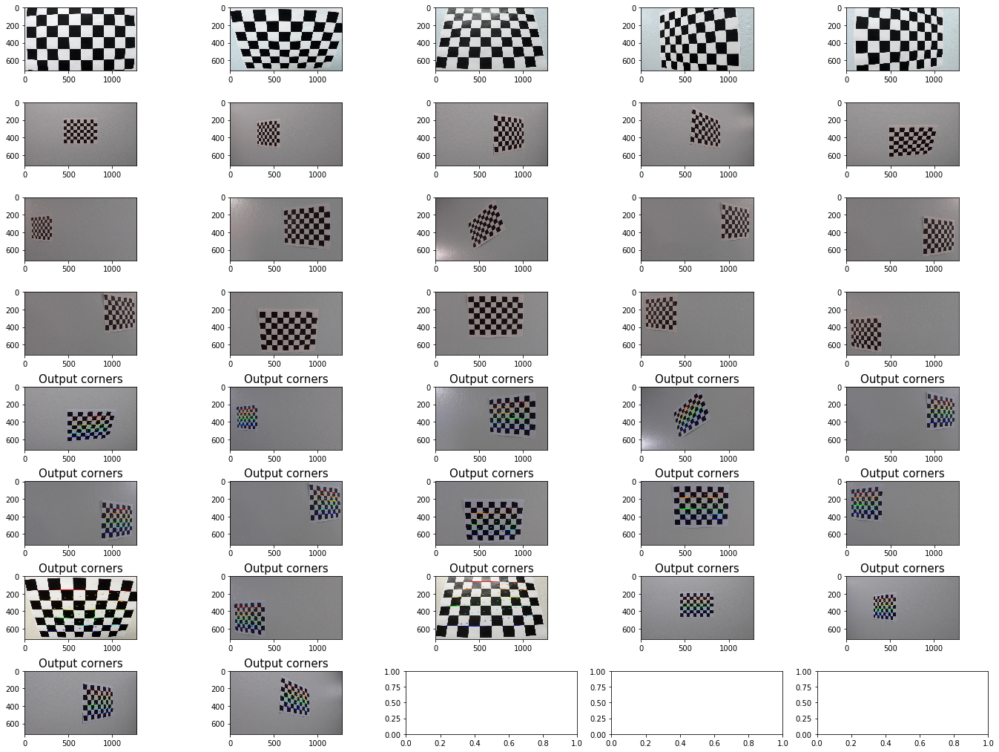

In [58]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
#%matplotlib qt
%matplotlib inline

f,axes= plt.subplots(8,5, figsize=(24,18))
f.subplots_adjust(hspace=0.5)
row=0
col=0
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
rgb_imgshow = []


# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
total_no_of_images = len(images)

'''
Input image display

'''   
for i in range (total_no_of_images):
    image= cv2.imread("./camera_cal/calibration"+str(i+1)+".jpg")
    axes[row,col].imshow(image)
    #axes.set_title('InputImage', fontsize=50)
    col+=1
    if(col==5):
        col=0
        row+=1

i=0   
j=0
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #cv2.imshow('Original image',fname)
    #cv2.waitkey(1000)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[row,col].imshow(rgb_img)
        axes[row,col].set_title('Output corners', fontsize = 15)
        col+=1
        if(col==5):
            col=0
            row+=1
        #rgb_imgshow.append(rgb_img)
        #plt.imshow(rgb_img)
        #plt.title("Output Corners"+str(i+1))
        #plt.show()
        i = i+1
        
        #axes.imshow(img)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

cv2.destroyAllWindows()


### Camera Calibration

Text(0.5,1,'Undistorted Image')

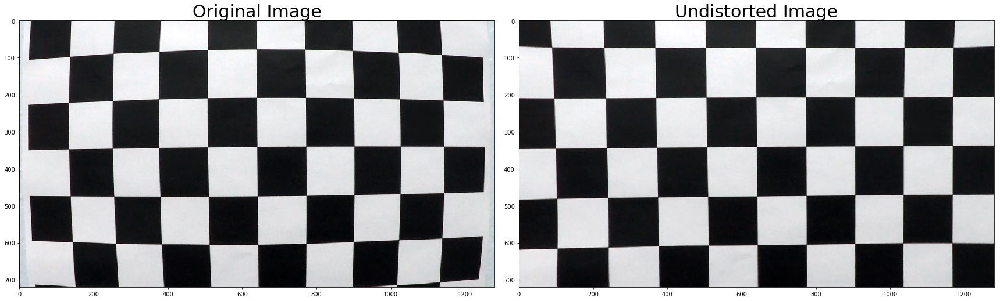

In [28]:
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Find the Camera calibration Once given object points, image points(derived 
#above line 1-32) and the shape of the grayscale image:
ret, mtx, dist, rvesc, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Above function return distortion coffecient(dist), cameera matrix (mtx)
# and rotation and translation vector in real world and these information will be used 
# in section bellow to correct the distortion of an image
undistort = cv2.undistort(img, mtx, dist, None, mtx)


# Visualize the undistortion on a calibration image

f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 30)

ax2.imshow(undistort)
ax2.set_title('Undistorted Image', fontsize = 30)

### Undistortion

Distortion correction on test images
720
1280
720
1280
720
1280
720
1280
720
1280
720
1280
720
1280
7


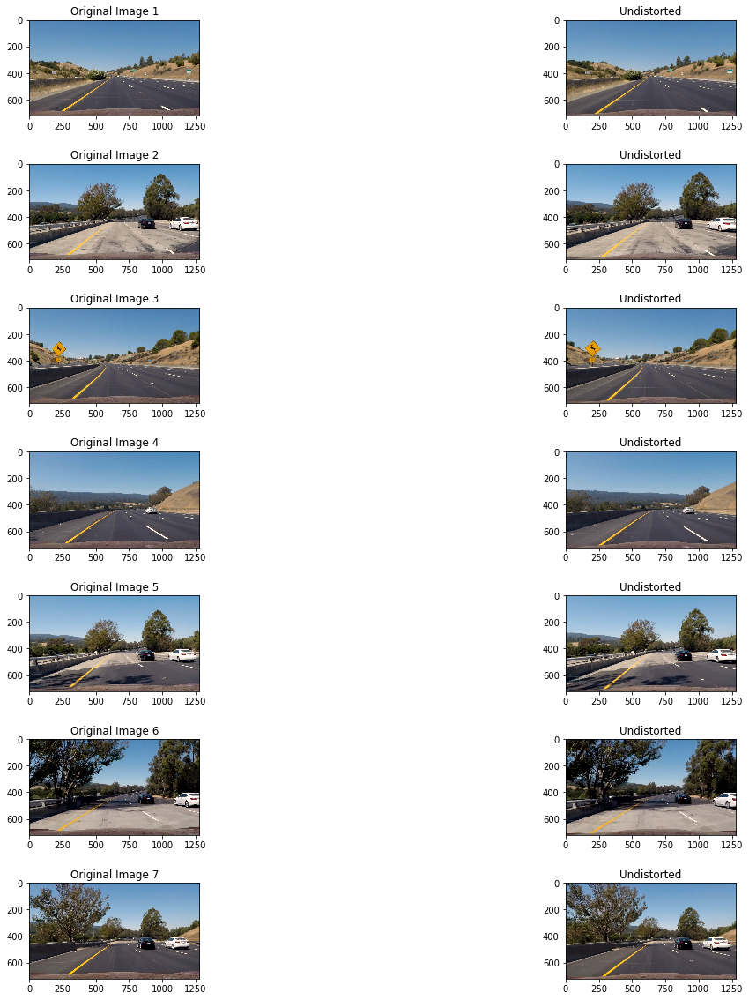

In [29]:
'''
img_test1 = cv2.imread("./Challenge_img/challenge_video_001.jpg")
img_test2 = cv2.imread("./Challenge_img/challenge_video_002.jpg")
img_test3 = cv2.imread("./Challenge_img/challenge_video_003.jpg")
img_test4 = cv2.imread("./Challenge_img/challenge_video_004.jpg")
img_test5 = cv2.imread("./Challenge_img/challenge_video_005.jpg")
img_test6 = cv2.imread("./Challenge_img/challenge_video_006.jpg")
img_test7 = cv2.imread("./Challenge_img/challenge_video_007.jpg")
'''
img_test1 = cv2.imread("./test_images/straight_lines1.jpg")
img_test2 = cv2.imread("./test_images/test1.jpg")
img_test3 = cv2.imread("./test_images/test2.jpg")
img_test4 = cv2.imread("./test_images/test3.jpg")
img_test5 = cv2.imread("./test_images/test4.jpg")
img_test6 = cv2.imread("./test_images/test5.jpg")
img_test7 = cv2.imread("./test_images/test6.jpg")

undistorted_imgs = []
test_images=[img_test1,img_test2,img_test3,img_test4,img_test5,img_test6,img_test7]
row=0
f,axes= plt.subplots(len(test_images),2, figsize=(20,20))
f.subplots_adjust(hspace=0.5)
print("Distortion correction on test images")
def undistort(img):
    return cv2.undistort(img,mtx,dist, None, mtx)

for image in test_images:
    image= cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    y=image.shape[0]
    x=image.shape[1]
    print(y)
    print(x)
    axes[row,0].set_title('Original Image '+str(row+1))
    axes[row,0].imshow(image)
    undistorted_image= undistort(image)
    undistorted_imgs.append(undistorted_image)
    axes[row,1].imshow(undistorted_image)
    axes[row,1].set_title('Undistorted')
    row+=1
print(len(undistorted_imgs))

### Perspective Transform

In [30]:
'''
warper - Transform the perspective of a given image using the source and destination points.
'''
def warper(img, src, dst):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    
    #Transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    #Inverse transform matrix
    Minv = cv2.getPerspectiveTransform(dst, src)

    # keep same size as input image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)

    return warped, M, Minv

The warper() function takes as inputs an image (img), as well as source (src) and destination (dst) points. I chose the hardcode the source and destination points in the following manner:

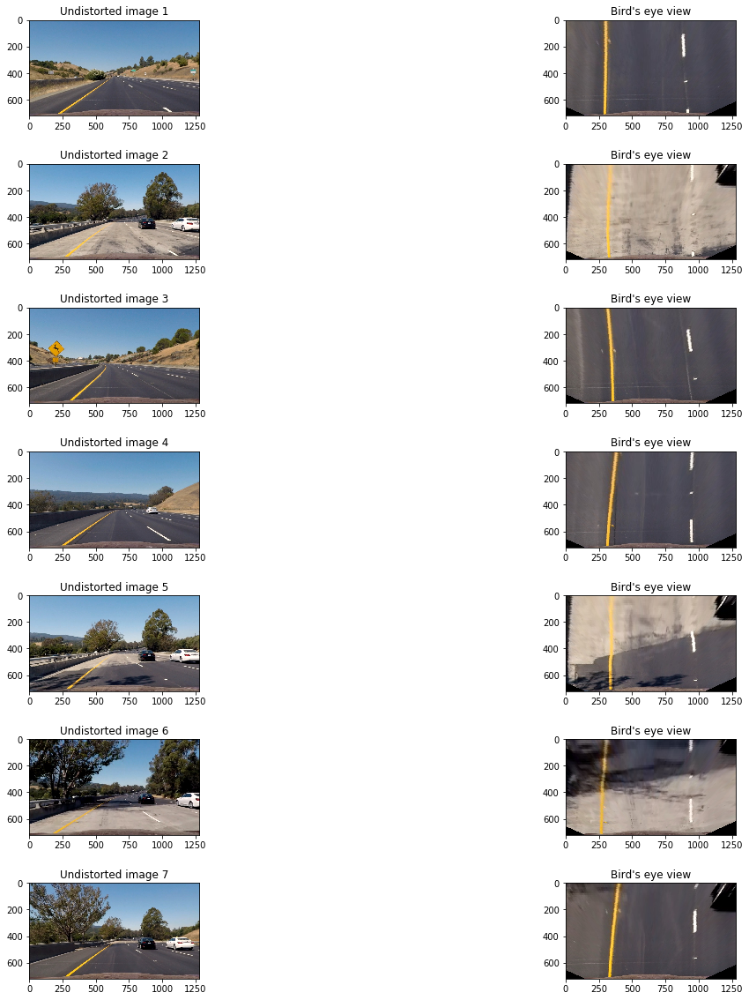

In [31]:

Warped_images = []
'''
offset=200
height, width= img_test1.shape[0], img_test1.shape[1]
src=np.float32([(593,450),(700,450),(1200,700),(200,700)])
dst=np.float32([(offset,0),(width-offset,0),(width-offset,height),(offset,height)])
'''

src = np.float32(
    [[(img_size[0] / 2) - 80, img_size[1] / 2 + 120], # top left
    [((img_size[0] / 4) - 75), img_size[1]],         # bottom left
    [(img_size[0] ) - 115, img_size[1]],             # bottom right
    [(img_size[0] / 2 + 120), img_size[1] / 2 + 120]] # top right
    )
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

f,axes= plt.subplots(len(undistorted_imgs),2, figsize=(20,20))
#f.tight_layout()
f.subplots_adjust(hspace=0.5)
row=0
#Unwarped_images=[]

for image in undistorted_imgs:
    warp_img, M, Minv = warper(image, src, dst)
    Warped_images.append(warp_img)
    y=image.shape[0]
    x=image.shape[1]
    
    # Draw src points on undistorted image
    '''
    pts = np.array(src, np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(image,[pts],True,(255,0,0), 3)
    
    # Draw dst points on warp image
    pts = np.array(dst, np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(warp_img,[pts],True,(255,0,0), 3)
    '''
    axes[row,0].imshow(image)
    axes[row,0].set_title('Undistorted image '+str(row+1))
    axes[row,1].imshow(warp_img)
    axes[row,1].set_title("Bird's eye view")
    row+=1 


### Experiment on various color spaces

4


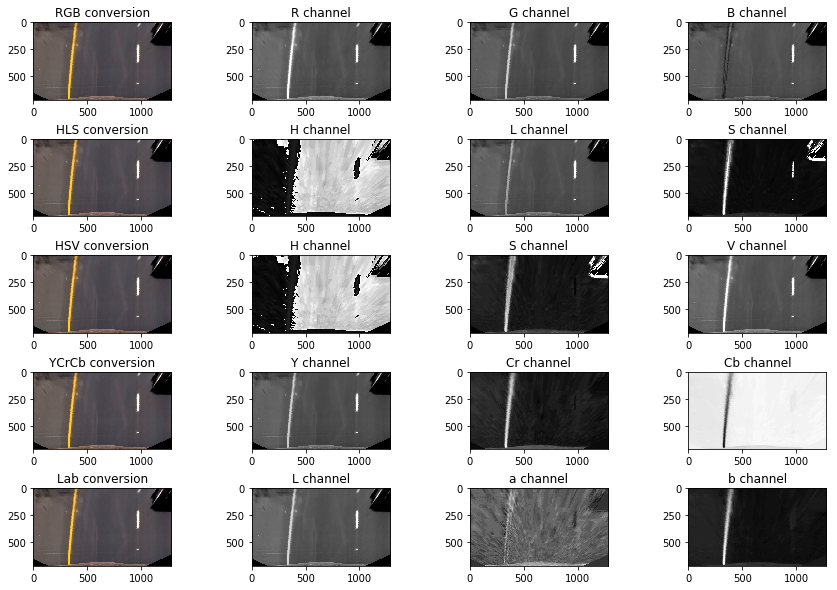

In [32]:
row=0
undistorted_unwarped_image=Warped_images[6] ##  test6.jpg : This image has dark and bright portions and will be good to observe
titles=[['R','G','B'],['H','L','S'],['H','S','V'],['Y','Cr','Cb'],['L','a','b']]
color_spaces=[cv2.COLOR_RGB2HLS,cv2.COLOR_RGB2HSV, cv2.COLOR_RGB2YCrCb, cv2.COLOR_RGB2Lab]
print(len(color_spaces))
f,axes= plt.subplots(len(color_spaces)+1,4, figsize=(15,10))
f.subplots_adjust(hspace =0.5)
colorspace= None
for index in range(len(color_spaces)+1):
    if(index==0):
        colorspace= undistorted_unwarped_image
    else:
        colorspace= cv2.cvtColor(undistorted_unwarped_image,color_spaces[index-1])
    axes[index,0].imshow(undistorted_unwarped_image)
    axes[index,0].set_title(''.join(titles[index]) +' conversion')
    for channel in range(3):
        this_channel= colorspace[:,:,channel]
        axes[index,channel+1].imshow(this_channel,cmap='gray')
        axes[index,channel+1].set_title(titles[index][channel]+' channel')

Out of the all the channels visualized above, R channel from RGB, S channel from HSV or HLS, Y channel from YCrCb and L channel from Lab colorspace looks promising and are able to identify the lane lines easily.


In [33]:
def channel_threshold(img,thresh):
    img = img*(255/np.max(img))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

In [34]:
def Custom_channel(img):
    
    imgY=cv2.cvtColor(img,cv2.COLOR_RGB2YCrCb)[:,:,0] # Y channel
    imgCr=cv2.cvtColor(img,cv2.COLOR_RGB2YCrCb)[:,:,1] #Cr channel
    imgHL_S=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)[:,:,2] #S channel
    imgLab_L=cv2.cvtColor(img,cv2.COLOR_RGB2Lab)[:,:,0] #L channel
    return imgY, imgCr, imgHL_S, imgLab_L

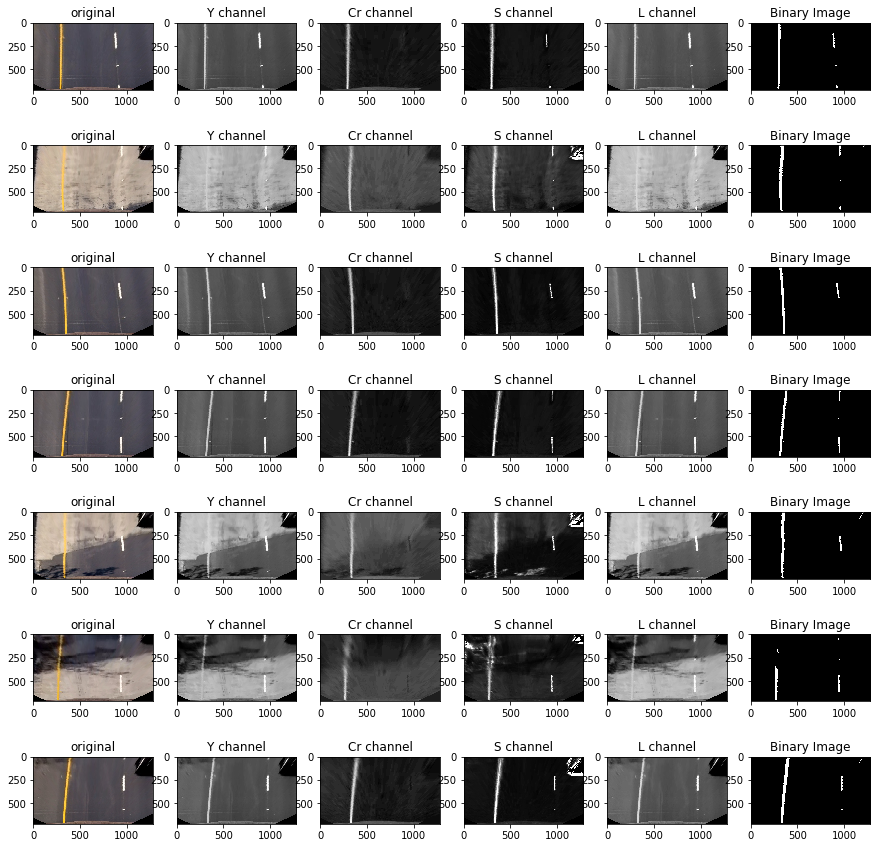

In [35]:
f,axes= plt.subplots(len(Warped_images),6, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0

for image in Warped_images:
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(image)
    axes[row,0].imshow(image)
    axes[row,0].set_title('original')
    axes[row,1].imshow(imgY, cmap='gray')
    axes[row,1].set_title('Y channel')
    axes[row,2].imshow(imgCr, cmap='gray')
    axes[row,2].set_title('Cr channel')
    axes[row,3].imshow(imgHL_S, cmap='gray')
    axes[row,3].set_title('S channel')
    axes[row,4].imshow(imgLab_L, cmap='gray')
    axes[row,4].set_title('L channel')
    Ybinary= channel_threshold(imgY,(220,255))
    Crbinary= channel_threshold(imgCr,(220,255))
    HL_Sbinary= channel_threshold(imgHL_S,(220,255))
    Lab_Lbinary= channel_threshold(imgLab_L,(220,255))
    combinedImage= np.zeros_like(Ybinary)
    combinedImage[(Crbinary==1)|(Ybinary==1)|((Lab_Lbinary==1)&(HL_Sbinary==1))]=1
    axes[row,5].imshow(combinedImage, cmap='gray')
    axes[row,5].set_title('Binary Image')
    row+=1

### Sobel X and Y

In [36]:
def sobel_image(img, orient='x', thresh_min=0, thresh_max=255, convert=True):
    gray= img
    if(convert):
        gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobel=None
    if(orient=='x'):
        sobel= cv2.Sobel(gray, cv2.CV_64F, 1,0)
    else:
        sobel= cv2.Sobel(gray, cv2.CV_64F, 0,1)
    
    sobel_abs= np.absolute(sobel)
    sobel_8bit= np.uint8(255* sobel_abs/np.max(sobel_abs))
    binary_output= np.zeros_like(sobel_8bit) 
    binary_output[(sobel_8bit>=thresh_min) & (thresh_max>=sobel_8bit)]=1
    
    return binary_output

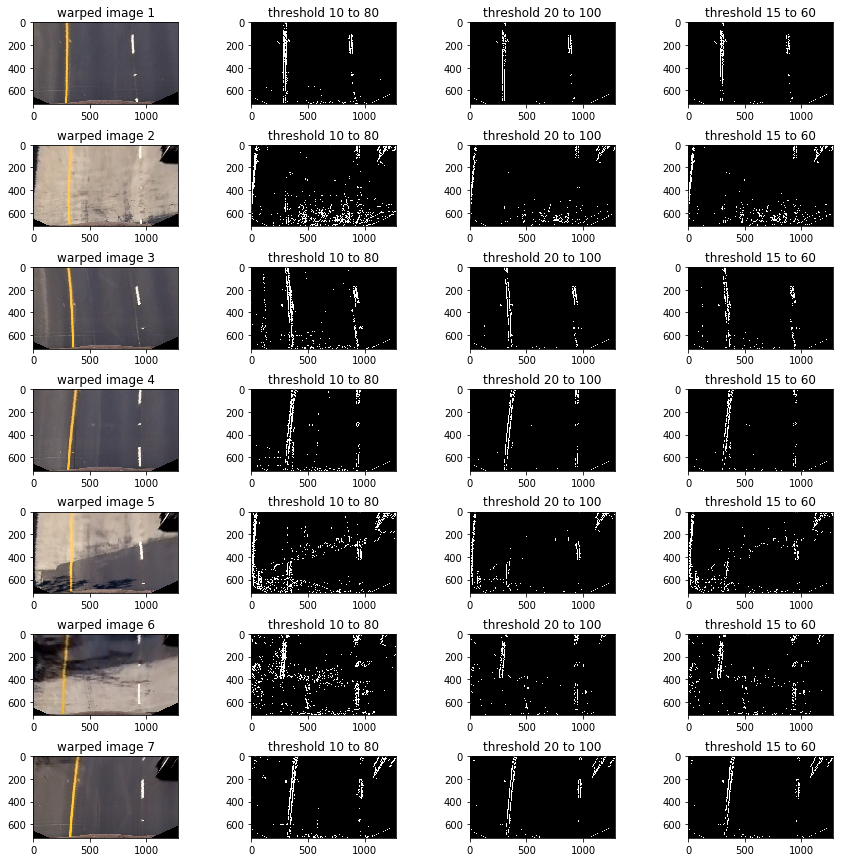

In [37]:
threshVal= [(10,80),(20,100),(15,60)]

f,axes= plt.subplots(len(Warped_images),4, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
    #image= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
    sobel_applied_image1= sobel_image(image, 'x', threshVal[0][0], threshVal[0][1], True)
    axes[row,1].imshow(sobel_applied_image1,cmap='gray')
    axes[row,1].set_title('threshold '+str(threshVal[0][0])+' to '+str(threshVal[0][1]))
    sobel_applied_image2= sobel_image(image, 'x', threshVal[1][0], threshVal[1][1], True)
    axes[row,2].imshow(sobel_applied_image2,cmap='gray')
    axes[row,2].set_title('threshold '+str(threshVal[1][0])+' to '+str(threshVal[1][1]))
    sobel_applied_image3= sobel_image(image, 'x', threshVal[2][0], threshVal[2][1], True)
    axes[row,3].imshow(sobel_applied_image3,cmap='gray')
    axes[row,3].set_title('threshold '+str(threshVal[2][0])+' to '+str(threshVal[2][1]))
    row+=1


In image 2, 5 and 6, the left lane line is completely getting misidentified. Sobel is identifying road edge as the lane line

### Sobel Gradient

In [38]:
def sobel_gradient_image(img, thresh=(0, np.pi/2), convert=True):
    gray= img
    if(convert):
        gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx= cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=15)
    sobely= cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=15)
    
    abs_sobelx= np.absolute(sobelx)
    abs_sobely= np.absolute(sobely)
    
    grad= np.arctan2(abs_sobely, abs_sobelx)
    
    binary_output=np.zeros_like(grad)
    binary_output[(grad>thresh[0])&(grad<thresh[1])]=1
    return binary_output

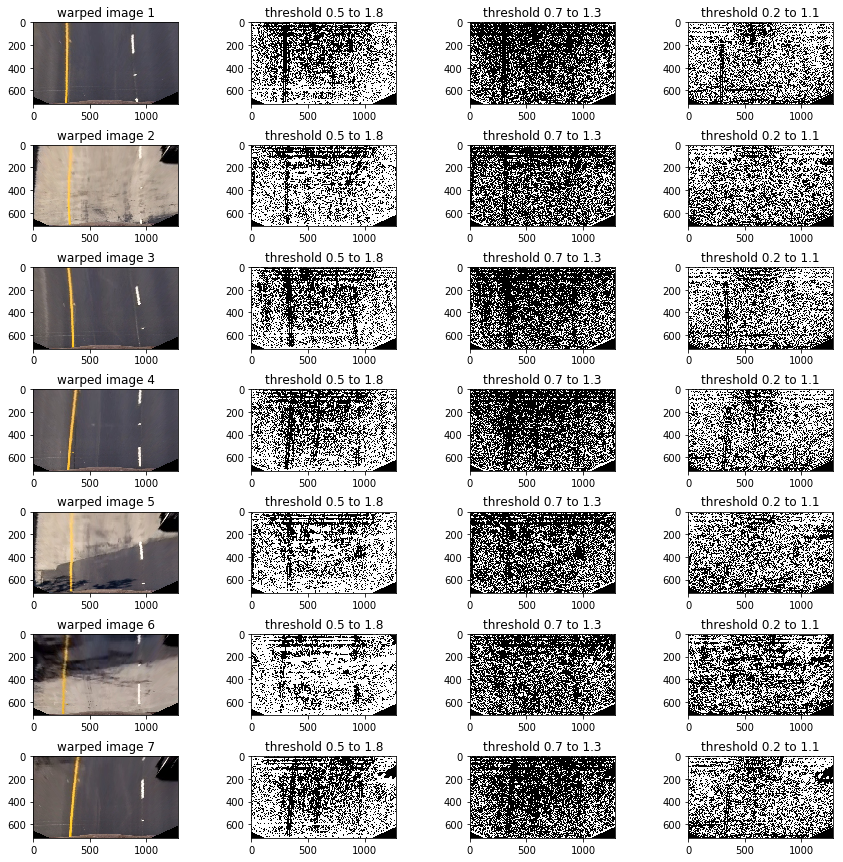

In [39]:
threshGrad= [(0.5,1.8),(0.7,1.3),(0.2,1.1)]

f,axes= plt.subplots(len(Warped_images),4, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
convert=True
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
#     image= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
#     convert=False
    sobel_grd_output= sobel_gradient_image(image, threshGrad[0], convert)
    axes[row,1].imshow(sobel_grd_output,cmap='gray')
    axes[row,1].set_title('threshold '+str(threshGrad[0][0])+' to '+str(threshGrad[0][1]))
    sobel_grd_output_2= sobel_gradient_image(image,  threshGrad[1], convert)
    axes[row,2].imshow(sobel_grd_output_2,cmap='gray')
    axes[row,2].set_title('threshold '+str(threshGrad[1][0])+' to '+str(threshGrad[1][1]))
    sobel_grd_output_3= sobel_gradient_image(image,  threshGrad[2], convert)
    axes[row,3].imshow(sobel_grd_output_3,cmap='gray')
    axes[row,3].set_title('threshold '+str(threshGrad[2][0])+' to '+str(threshGrad[2][1]))
    row+=1

### Combine Sobel with Channels

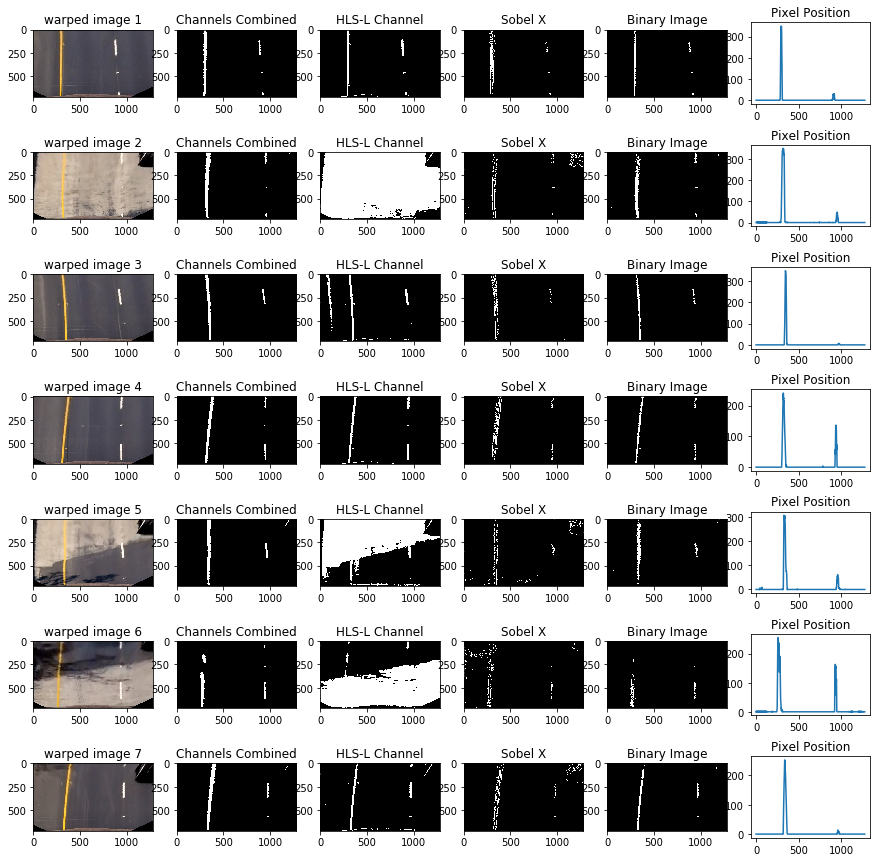

In [40]:
f,axes= plt.subplots(len(Warped_images),6, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
convert=True
FinalBinary_Image=[]
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
    
    #image= cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)[:,:,1]
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(image)
    
    Ybinary= channel_threshold(imgY,(215,255))
    Crbinary= channel_threshold(imgCr,(215,255))
    Lbinary= channel_threshold(imgLab_L,(215,255))
    Sbinary= channel_threshold(imgHL_S,(200,255))
    combined1 = np.zeros_like(imgY)
    combined1[(Crbinary==1)|(Ybinary==1)|((Lbinary==1)&(Sbinary==1))]=1
    axes[row,1].imshow(combined1,cmap='gray')
    axes[row,1].set_title('Channels Combined')
    
    l_channel= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 120) & (l_channel <= 255)] = 1
    axes[row,2].imshow(l_binary,cmap='gray')
    axes[row,2].set_title('HLS-L Channel')
    image_S_channel= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
    convert=False
    
    sobelx_image= sobel_image(image_S_channel,'x', 15,60, convert)
    axes[row,3].imshow(sobelx_image,cmap='gray')
    axes[row,3].set_title('Sobel X')
    
    
    combined_YCrSL = np.zeros_like(sobelx_image)
    #combined_YCrSL[((Crbinary==1)|(Ybinary==1)|((Lbinary==1)& (Sbinary == 1) )|(sobelx_image==1))& (l_binary == 1)]=1
    combined_YCrSL[((Sbinary == 1) | (sobelx_image == 1)) & (l_binary == 1) ] = 1
    axes[row,4].imshow(combined_YCrSL,cmap='gray')
    axes[row,4].set_title('Binary Image')
    FinalBinary_Image.append(combined_YCrSL)
    histogram = np.sum(combined_YCrSL[combined_YCrSL.shape[0]//2:,:], axis=0)
    axes[row,5].plot(histogram)
    axes[row,5].set_title('Pixel Position')  
    

    
    row+=1

### Finding Line on detected lanes and plotting windows

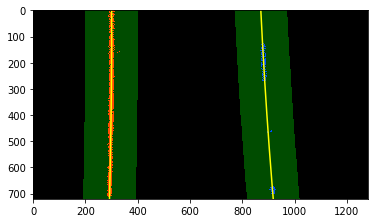

In [41]:
def locate_lines(binary_warped, nwindows = 9, margin = 100, minpix = 50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy

def locate_line_further(left_fit, right_fit, binary_warped):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                       & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
     
    return left_fit, right_fit

def visulizeLanes(left_fit, right_fit, left_lane_inds, right_lane_inds, binary_warped, nonzerox, nonzeroy, margin = 100):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    

warped_img = FinalBinary_Image[0]
    
left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(warped_img) 
visulizeLanes(left_fit, right_fit, left_lane_inds, right_lane_inds, warped_img, nonzerox, nonzeroy, margin = 100)
    

### Radius of Curvature

In [42]:
#Radius of Curvature
def radius_curvature(binary_warped, left_fit, right_fit):
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curvature =  ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.
    center_image = 640
    center = (lane_center - center_image)*xm_per_pix #Convert to meters
    position = "left" if center < 0 else "right"
    center = "Vehicle is {:.2f}m {}".format(center, position)
    
    # Now our radius of curvature is in meters
    return left_curvature, right_curvature, center 

In [43]:
left_curvature, right_curvature, center = radius_curvature(warped_img, left_fit, right_fit)

### Final Image

In [44]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, show_values = False):
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y,x = warped_img.shape
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    Minv = np.linalg.inv(M)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (x,y)) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    cv2.putText(result, 'Left curvature: {:.0f} m'.format(left_curvature), (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Right curvature: {:.0f} m'.format(right_curvature), (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, '{}'.format(center), (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(20, 10))
        ax.imshow(result)
        
    return result

array([[[174, 191, 209],
        [133, 154, 175],
        [118, 144, 171],
        ...,
        [ 32,  72,  98],
        [  6,  41,  61],
        [ 12,  45,  62]],

       [[131, 152, 173],
        [117, 141, 165],
        [100, 127, 157],
        ...,
        [ 75, 119, 148],
        [ 47,  85, 108],
        [  2,  37,  57]],

       [[116, 143, 170],
        [101, 130, 160],
        [ 91, 124, 159],
        ...,
        [ 82, 128, 162],
        [ 76, 120, 149],
        [ 33,  75, 100]],

       ...,

       [[128, 117, 115],
        [100,  89,  87],
        [ 95,  81,  80],
        ...,
        [ 85,  70,  67],
        [101,  85,  85],
        [133, 117, 117]],

       [[147, 135, 135],
        [121, 110, 108],
        [102,  91,  89],
        ...,
        [ 91,  76,  73],
        [125, 109, 109],
        [149, 135, 134]],

       [[189, 177, 177],
        [144, 132, 132],
        [129, 118, 116],
        ...,
        [127, 112, 109],
        [146, 132, 131],
        [191, 177, 176]]

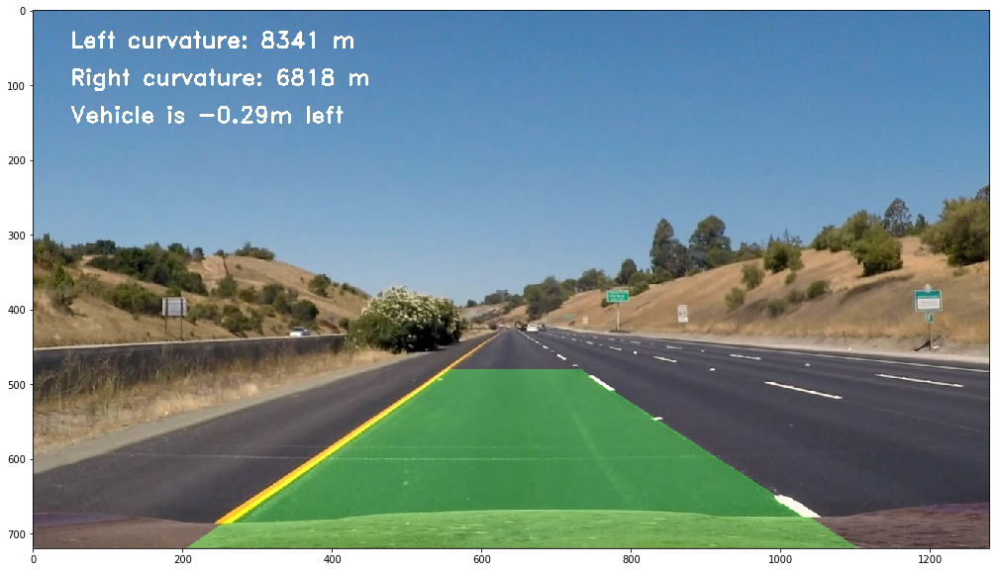

In [45]:
img = cv2.cvtColor(img_test1, cv2.COLOR_BGR2RGB)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, True)

### Creating pipleline video

In [46]:
def is_lane_valid(left_fit, right_fit):
    
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False

    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)

        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)

        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.6:
            status = True
        else:
            status = False
            
    return status

[-7.71723415e-05  1.07985730e-01  3.13395582e+02]
-----------
[2.40908605e-05 4.85420707e-02 8.70758474e+02]
[ 2.11551774e-05 -1.08802424e-01  3.76567434e+02]
-----------
[2.40908605e-05 4.85420707e-02 8.70758474e+02]
[-4.60576798e-05  2.67391647e-02  3.36033846e+02]
-----------
[2.40908605e-05 4.85420707e-02 8.70758474e+02]
[ 3.25921152e-05 -3.82144567e-02  3.03116417e+02]
-----------
[2.40908605e-05 4.85420707e-02 8.70758474e+02]
[ 1.01074705e-05 -5.32477521e-02  3.61540144e+02]
-----------
[2.40908605e-05 4.85420707e-02 8.70758474e+02]


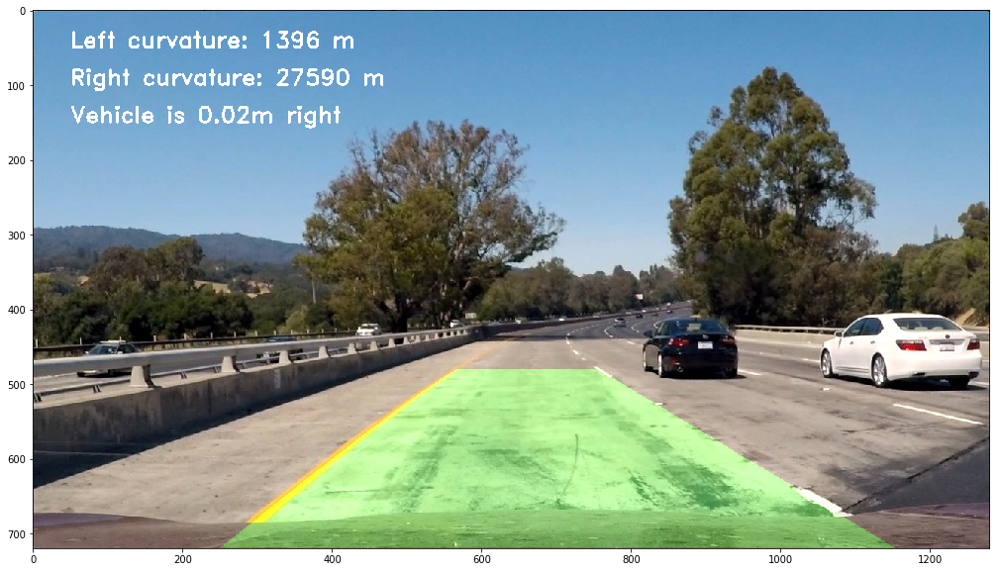

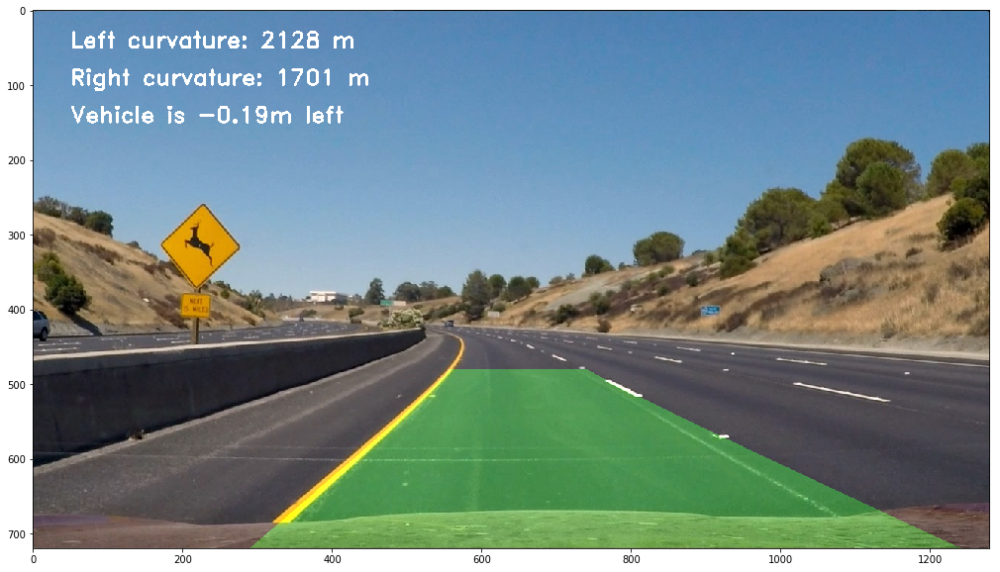

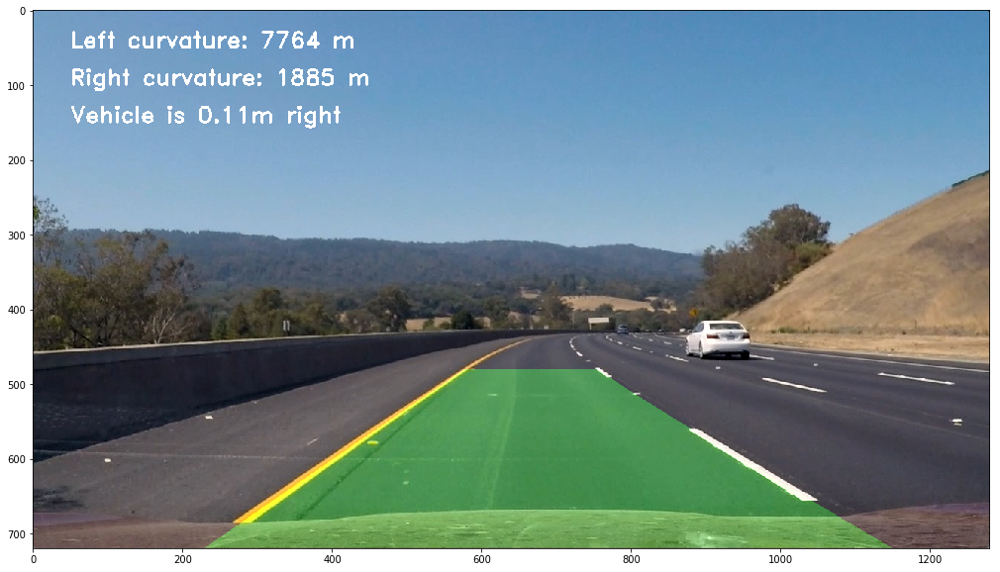

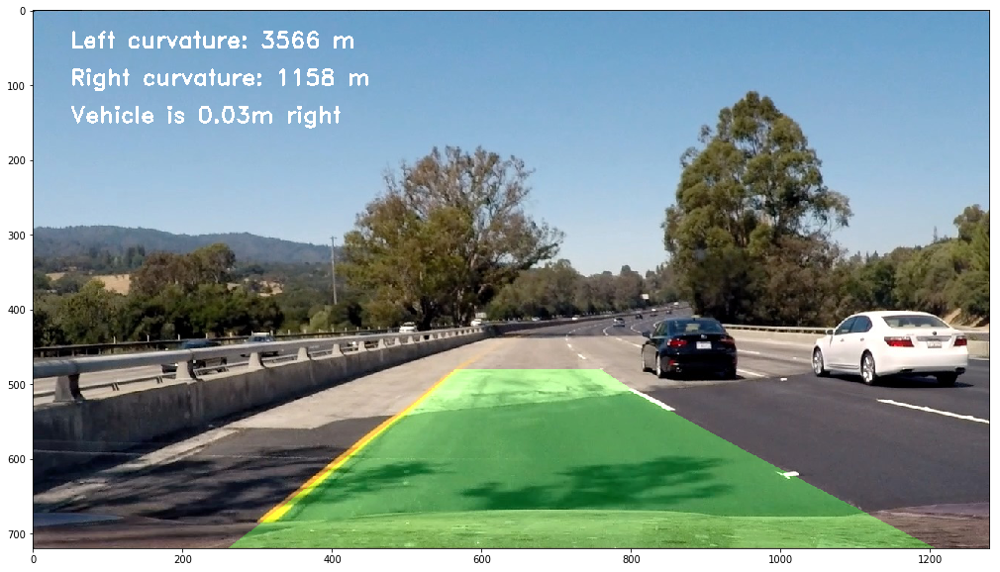

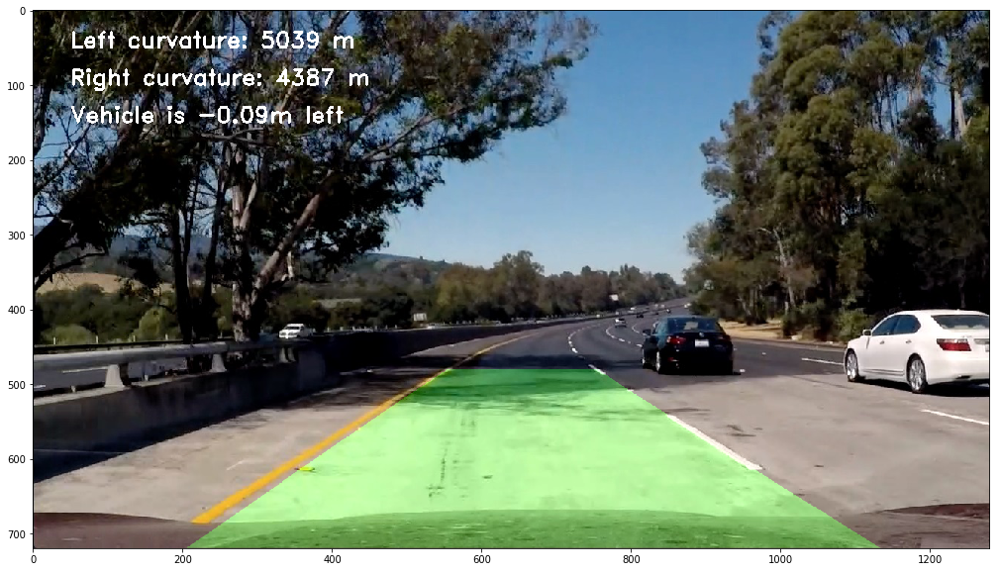

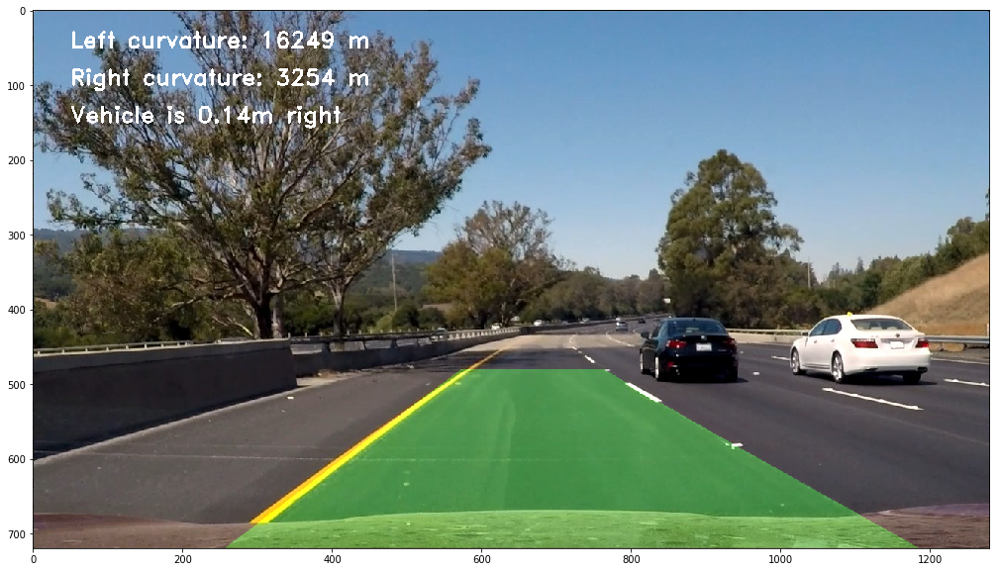

In [48]:
# Define a class to receive the characteristics of each line detection
class Lane():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.counter = 0
        self.reset_counter = 0
        
lane = Lane()

def find_lanes(img):
    #img = undistort(img, mtx, dist)
    #combined_binary = combined_s_gradient_thresholds(img)
    #warped_img, M = transform_image(combined_binary, nx, ny) 
    undist_img = undistort(img)

    # Do a perspective Transform
    warp_img, M, Minv = warper(undist_img, src, dst)
   
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(warp_img)
    
    Ybinary= channel_threshold(imgY,(215,255))
    Crbinary= channel_threshold(imgCr,(215,255))
    Lbinary= channel_threshold(imgLab_L,(215,255))
    Sbinary= channel_threshold(imgHL_S,(200,255))
    combined1 = np.zeros_like(imgY)
    combined1[(Crbinary==1)|(Ybinary==1)|((Lbinary==1)&(Sbinary==1))]=1
    #axes.imshow(combined1,cmap='gray')
    #axes.set_title('Channels Combined')
    
    l_channel= cv2.cvtColor(warp_img, cv2.COLOR_RGB2HLS)[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 120) & (l_channel <= 255)] = 1
    #axes[0,1].imshow(l_binary,cmap='gray')
    #axes[0,1].set_title('HLS-L Channel')
    image_S_channel= cv2.cvtColor(warp_img, cv2.COLOR_RGB2HLS)[:,:,2]
    convert=False
    
    sobelx_image= sobel_image(image_S_channel,'x', 15,60, convert)
    #axes[0,2].imshow(sobelx_image,cmap='gray')
    #axes[0,2].set_title('Sobel X')
    
    
    combined_YCrSL = np.zeros_like(sobelx_image)
    #combined_YCrSL[((Crbinary==1)|(Ybinary==1)|((Lbinary==1)& (Sbinary == 1) )|(sobelx_image==1))& (l_binary == 1)]=1
    combined_YCrSL[((Sbinary == 1) | (sobelx_image == 1)) & (l_binary == 1) ] = 1
    
    if lane.counter == 0:
        lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(combined_YCrSL)
    else:
        lane.left_fit, lane.right_fit  = locate_line_further(lane.left_fit, lane.right_fit, combined_YCrSL)
        print(lane.left_fit)
        print("-----------")
        print(right_fit)
    
    #Sanity check
    status = is_lane_valid(lane.left_fit, lane.right_fit)
    
    if status == True:        
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.counter += 1
        lane.reset_counter = 0
    else:
        #Reset
        if lane.reset_counter > 4:
            lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(combined_YCrSL)
            
            print(lane.left_fit)
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right

        lane.reset_counter += 1
    
    return combined_YCrSL, lane.left_fit, lane.right_fit, M


def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)

    left_curvature, right_curvature, center = radius_curvature(warped_img, left_fit, right_fit)
    
    return draw_on_image(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, show_values)
    
#images = ['challenge_video_002.jpg', 'challenge_video_003.jpg','challenge_video_004.jpg', 'challenge_video_005.jpg', 'challenge_video_006.jpg', 'challenge_video_007.jpg']
images = ['test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)


In [22]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [26]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'project_video_Output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

Bye
[MoviePy] >>>> Building video project_video_Output.mp4
[MoviePy] Writing video project_video_Output.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

[-5.57298529e-05  9.05492990e-02  3.11582908e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 1/1261 [00:00<04:10,  5.03it/s]

[-6.34516843e-05  9.49531796e-02  3.12517379e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 2/1261 [00:00<04:09,  5.04it/s]

[-7.18964453e-05  9.95677847e-02  3.13236765e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 3/1261 [00:00<04:15,  4.92it/s]

[-8.40754133e-05  1.09716108e-01  3.12310050e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 4/1261 [00:00<04:14,  4.95it/s]

[-9.63129519e-05  1.20409730e-01  3.10791037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 5/1261 [00:01<04:10,  5.01it/s]

[-9.47942080e-05  1.22323104e-01  3.10546921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 6/1261 [00:01<04:05,  5.10it/s]

[-9.03943593e-05  1.23137139e-01  3.09104050e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▏                                        | 7/1261 [00:01<04:01,  5.20it/s]

[-9.19910033e-05  1.26429128e-01  3.09552196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 8/1261 [00:01<03:55,  5.32it/s]

[-8.90261393e-05  1.28117301e-01  3.06856909e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 9/1261 [00:01<04:03,  5.14it/s]

[-8.80063166e-05  1.30552923e-01  3.04408980e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 10/1261 [00:01<03:58,  5.24it/s]

[-8.99609865e-05  1.33285564e-01  3.03791409e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 11/1261 [00:02<03:58,  5.25it/s]

[-8.72950083e-05  1.38862028e-01  2.96952708e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 12/1261 [00:02<04:01,  5.17it/s]

[-8.79046073e-05  1.41728093e-01  2.95987069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 13/1261 [00:02<04:21,  4.78it/s]

[-8.40021120e-05  1.39820208e-01  2.95547143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 14/1261 [00:02<04:15,  4.89it/s]

[-8.87733483e-05  1.43429065e-01  2.96131731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 15/1261 [00:02<04:09,  5.00it/s]

[-9.15540444e-05  1.45063640e-01  2.96458448e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 16/1261 [00:03<04:04,  5.08it/s]

[-9.89078145e-05  1.50939584e-01  2.94447295e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 17/1261 [00:03<04:05,  5.07it/s]

[-9.52891149e-05  1.49249044e-01  2.94030753e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 18/1261 [00:03<04:01,  5.15it/s]

[-8.98455354e-05  1.48349143e-01  2.91196934e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▌                                       | 19/1261 [00:03<04:06,  5.05it/s]

[-8.05813192e-05  1.44119578e-01  2.89145299e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 20/1261 [00:03<04:02,  5.13it/s]

[-6.33774872e-05  1.34160527e-01  2.87558536e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 21/1261 [00:04<04:13,  4.90it/s]

[-4.39982422e-05  1.23264119e-01  2.85322629e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 22/1261 [00:04<04:15,  4.85it/s]

[-3.42486363e-05  1.16525337e-01  2.83368196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 23/1261 [00:04<04:15,  4.85it/s]

[-2.78405851e-05  1.06154445e-01  2.86481627e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 24/1261 [00:04<04:17,  4.81it/s]

[-2.61359579e-05  9.94656627e-02  2.88707407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 25/1261 [00:04<04:14,  4.85it/s]

[-2.20428789e-05  9.60829400e-02  2.86937602e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 26/1261 [00:05<04:11,  4.92it/s]

[-1.81597895e-05  8.95367647e-02  2.87941622e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 27/1261 [00:05<04:05,  5.02it/s]

[-1.71471628e-05  8.75842075e-02  2.85876170e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 28/1261 [00:05<04:06,  5.00it/s]

[-2.62866882e-05  8.84169292e-02  2.88539216e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 29/1261 [00:05<04:03,  5.07it/s]

[-4.42999107e-05  9.42185318e-02  2.91152997e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 30/1261 [00:05<04:10,  4.92it/s]

[-6.35566086e-05  1.04074615e-01  2.93143889e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 31/1261 [00:06<04:15,  4.81it/s]

[-7.50755732e-05  1.08021774e-01  2.96343628e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 32/1261 [00:06<04:14,  4.83it/s]

[-7.78571172e-05  1.10064443e-01  2.95117568e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 33/1261 [00:06<04:15,  4.80it/s]

[-8.03242065e-05  1.11485591e-01  2.96565051e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 34/1261 [00:06<04:08,  4.93it/s]

[-7.70310290e-05  1.08110475e-01  2.98604002e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 35/1261 [00:07<04:11,  4.87it/s]

[-8.42626640e-05  1.13777545e-01  3.00055007e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 36/1261 [00:07<04:18,  4.74it/s]

[-8.32712324e-05  1.13997690e-01  3.00813500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 37/1261 [00:07<04:10,  4.88it/s]

[-7.96449356e-05  1.10738285e-01  3.02736787e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 38/1261 [00:07<04:05,  4.99it/s]

[-8.20811977e-05  1.12037983e-01  3.03931281e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 39/1261 [00:07<04:15,  4.78it/s]

[-8.79788404e-05  1.18163428e-01  3.02414979e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 40/1261 [00:08<04:29,  4.54it/s]

[-8.81926077e-05  1.19544848e-01  3.02288819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 41/1261 [00:08<04:18,  4.72it/s]

[-9.24012510e-05  1.25674929e-01  3.01083481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 42/1261 [00:08<04:09,  4.89it/s]

[-1.04564777e-04  1.37676354e-01  2.98381965e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 43/1261 [00:08<04:38,  4.37it/s]

[-1.04589457e-04  1.41363996e-01  2.95707739e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▍                                      | 44/1261 [00:08<04:25,  4.59it/s]

[-1.07629671e-04  1.46180263e-01  2.93925734e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 45/1261 [00:09<04:10,  4.85it/s]

[-1.12306659e-04  1.51620992e-01  2.92159976e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 46/1261 [00:09<03:57,  5.12it/s]

[-1.17011296e-04  1.58645782e-01  2.89142740e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 47/1261 [00:09<03:51,  5.25it/s]

[-1.12351954e-04  1.57362127e-01  2.88721190e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 48/1261 [00:09<03:46,  5.34it/s]

[-1.08606890e-04  1.58951660e-01  2.85484571e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 49/1261 [00:09<03:47,  5.33it/s]

[-1.09972290e-04  1.63247471e-01  2.84074860e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 50/1261 [00:10<03:44,  5.40it/s]

[-1.08407806e-04  1.65372187e-01  2.82299070e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 51/1261 [00:10<03:48,  5.29it/s]

[-1.03990667e-04  1.62899394e-01  2.82817161e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 52/1261 [00:10<03:42,  5.43it/s]

[-1.01899673e-04  1.63007103e-01  2.82169216e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 53/1261 [00:10<03:42,  5.44it/s]

[-9.55101619e-05  1.58868920e-01  2.81864306e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 54/1261 [00:10<03:39,  5.49it/s]

[-9.57312070e-05  1.61120642e-01  2.79555966e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 55/1261 [00:10<03:41,  5.45it/s]

[-9.39561857e-05  1.62379665e-01  2.77278237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                      | 56/1261 [00:11<03:39,  5.48it/s]

[-8.69568141e-05  1.57959257e-01  2.77110176e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 57/1261 [00:11<03:39,  5.48it/s]

[-7.77489688e-05  1.50040106e-01  2.77534911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 58/1261 [00:11<03:37,  5.53it/s]

[-6.31831106e-05  1.35331050e-01  2.81770093e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 59/1261 [00:11<03:38,  5.51it/s]

[-4.56818226e-05  1.18784200e-01  2.85562750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 60/1261 [00:11<03:34,  5.59it/s]

[-4.10959703e-05  1.11668899e-01  2.87383327e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 61/1261 [00:12<03:40,  5.43it/s]

[-3.05672155e-05  9.92291964e-02  2.90587606e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 62/1261 [00:12<03:36,  5.53it/s]

[-1.75110642e-05  8.70958844e-02  2.91381857e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 63/1261 [00:12<03:42,  5.40it/s]

[-1.58051168e-05  7.98885205e-02  2.94503610e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 64/1261 [00:12<03:41,  5.41it/s]

[-1.94055562e-05  7.99746102e-02  2.93403970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 65/1261 [00:12<03:42,  5.38it/s]

[-3.46920417e-05  8.69398125e-02  2.94111603e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 66/1261 [00:12<03:37,  5.49it/s]

[-3.76290375e-05  8.67238428e-02  2.94023175e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 67/1261 [00:13<03:38,  5.45it/s]

[-5.62666750e-05  9.91033416e-02  2.91020574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 68/1261 [00:13<03:38,  5.46it/s]

[-7.01057723e-05  1.06151165e-01  2.91794029e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 69/1261 [00:13<03:35,  5.52it/s]

[-8.33691218e-05  1.17538939e-01  2.87903199e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▏                                     | 70/1261 [00:13<03:35,  5.54it/s]

[-1.01543564e-04  1.31581922e-01  2.86168056e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 71/1261 [00:13<03:48,  5.21it/s]

[-1.03861914e-04  1.36384306e-01  2.83022338e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 72/1261 [00:14<04:00,  4.94it/s]

[-1.07170272e-04  1.41699113e-01  2.80465745e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 73/1261 [00:14<04:08,  4.79it/s]

[-1.04297222e-04  1.43003627e-01  2.78841688e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 74/1261 [00:14<04:10,  4.75it/s]

[-9.60975802e-05  1.41341057e-01  2.75629828e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 75/1261 [00:14<03:58,  4.98it/s]

[-8.63928692e-05  1.35689624e-01  2.75986705e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 76/1261 [00:14<03:50,  5.15it/s]

[-6.75831157e-05  1.26976401e-01  2.72136046e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 77/1261 [00:15<03:46,  5.22it/s]

[-5.49773554e-05  1.20658590e-01  2.70427233e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 78/1261 [00:15<03:45,  5.25it/s]

[-3.66783683e-05  1.08087828e-01  2.69525138e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 79/1261 [00:15<03:40,  5.37it/s]

[-2.49317070e-05  9.73054754e-02  2.70229184e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 80/1261 [00:15<03:38,  5.41it/s]

[-2.08437276e-05  9.03475936e-02  2.71801975e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 81/1261 [00:15<03:42,  5.31it/s]

[-1.64903214e-05  8.52110823e-02  2.71100621e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▌                                     | 82/1261 [00:16<03:59,  4.92it/s]

[-1.09728842e-05  7.79307560e-02  2.71557611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 83/1261 [00:16<03:53,  5.04it/s]

[-1.00068545e-05  7.92730339e-02  2.67091273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 84/1261 [00:16<03:54,  5.02it/s]

[-1.05536403e-05  7.50609373e-02  2.68690393e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 85/1261 [00:16<03:54,  5.01it/s]

[-1.68377855e-05  7.35785757e-02  2.71111444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 86/1261 [00:16<03:55,  4.98it/s]

[-1.76976683e-05  6.31780287e-02  2.79429282e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 87/1261 [00:17<03:55,  4.99it/s]

[-2.73178798e-05  6.31081218e-02  2.84244054e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 88/1261 [00:17<03:53,  5.03it/s]

[-2.90506423e-05  5.88384996e-02  2.88145877e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 89/1261 [00:17<04:00,  4.87it/s]

[-3.71805966e-05  5.89514414e-02  2.93677490e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 90/1261 [00:17<04:02,  4.83it/s]

[-4.01492584e-05  6.15485450e-02  2.92718072e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 91/1261 [00:17<04:00,  4.87it/s]

[-4.67007596e-05  6.79804479e-02  2.91940314e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 92/1261 [00:18<04:02,  4.81it/s]

[-6.19134628e-05  7.58916869e-02  2.93802550e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 93/1261 [00:18<04:01,  4.84it/s]

[-7.15990375e-05  8.25625956e-02  2.94663004e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 94/1261 [00:18<04:03,  4.79it/s]

[-8.10521424e-05  9.15583722e-02  2.92000368e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 95/1261 [00:18<04:02,  4.82it/s]

[-9.07258634e-05  9.88516719e-02  2.91481628e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 96/1261 [00:18<04:01,  4.82it/s]

[-9.16195880e-05  1.02248812e-01  2.91068762e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 97/1261 [00:19<04:02,  4.81it/s]

[-8.17022128e-05  9.82882564e-02  2.89569431e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 98/1261 [00:19<04:01,  4.81it/s]

[-8.62133277e-05  1.02246570e-01  2.90651082e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 99/1261 [00:19<04:02,  4.79it/s]

[-7.96251064e-05  1.00098423e-01  2.89747824e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                    | 100/1261 [00:19<04:04,  4.74it/s]

[-7.53421497e-05  9.81542733e-02  2.90952859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                    | 101/1261 [00:20<04:15,  4.54it/s]

[-6.98409383e-05  9.38438740e-02  2.92992968e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                   | 102/1261 [00:20<04:19,  4.47it/s]

[-6.55375837e-05  9.16129010e-02  2.93447885e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                   | 103/1261 [00:20<04:20,  4.44it/s]

[-6.35942615e-05  9.12834553e-02  2.94150251e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                   | 104/1261 [00:20<04:11,  4.60it/s]

[-5.47826024e-05  8.84448305e-02  2.92145257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                   | 105/1261 [00:20<04:14,  4.55it/s]

[-6.15223132e-05  9.34127119e-02  2.91109663e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 106/1261 [00:21<04:15,  4.52it/s]

[-5.92197703e-05  9.27501484e-02  2.90476524e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 107/1261 [00:21<04:22,  4.40it/s]

[-6.49028539e-05  9.44316070e-02  2.93933779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▎                                   | 108/1261 [00:21<04:21,  4.41it/s]

[-6.51022909e-05  9.38067875e-02  2.94563467e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▎                                   | 109/1261 [00:21<04:21,  4.41it/s]

[-6.88223464e-05  9.56622230e-02  2.95090400e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 110/1261 [00:22<04:21,  4.40it/s]

[-6.83315458e-05  9.42454672e-02  2.96736540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 111/1261 [00:22<04:18,  4.44it/s]

[-6.73574394e-05  9.69052897e-02  2.93462409e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 112/1261 [00:22<04:25,  4.33it/s]

[-7.15451605e-05  9.73405210e-02  2.96732438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 113/1261 [00:22<04:19,  4.43it/s]

[-6.51426269e-05  9.09172905e-02  2.99485175e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 114/1261 [00:22<04:11,  4.56it/s]

[-6.66261965e-05  8.97215587e-02  3.02581112e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 115/1261 [00:23<04:14,  4.50it/s]

[-6.86073345e-05  8.91214477e-02  3.04364091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 116/1261 [00:23<04:22,  4.37it/s]

[-7.40095930e-05  9.55988580e-02  3.02703555e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 117/1261 [00:23<04:31,  4.21it/s]

[-8.43930760e-05  1.04525180e-01  3.01885881e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 118/1261 [00:23<04:20,  4.38it/s]

[-8.50027732e-05  1.06341867e-01  3.01931656e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 119/1261 [00:24<04:15,  4.48it/s]

[-8.87624935e-05  1.08433590e-01  3.04225820e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 120/1261 [00:24<04:27,  4.27it/s]

[-9.08001533e-05  1.12867552e-01  3.02999022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 121/1261 [00:24<04:11,  4.53it/s]

[-9.37421992e-05  1.15416609e-01  3.03868093e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 122/1261 [00:24<03:56,  4.82it/s]

[-9.03575586e-05  1.12717946e-01  3.05868205e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 123/1261 [00:24<03:47,  5.01it/s]

[-9.05811465e-05  1.14060888e-01  3.05976730e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 124/1261 [00:25<03:42,  5.10it/s]

[-8.82925224e-05  1.13765702e-01  3.06709305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 125/1261 [00:25<03:44,  5.05it/s]

[-7.54189081e-05  1.07242621e-01  3.05326519e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 126/1261 [00:25<03:40,  5.14it/s]

[-7.48460674e-05  1.07030102e-01  3.06351480e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 127/1261 [00:25<03:34,  5.28it/s]

[-7.77345471e-05  1.12353815e-01  3.04325324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 128/1261 [00:25<03:34,  5.28it/s]

[-8.65356583e-05  1.17989175e-01  3.06307927e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 129/1261 [00:26<03:41,  5.11it/s]

[-9.04463000e-05  1.22325143e-01  3.04636073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 130/1261 [00:26<03:37,  5.19it/s]

[-9.57674913e-05  1.27014246e-01  3.04230836e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 131/1261 [00:26<03:36,  5.23it/s]

[-1.03199696e-04  1.33417635e-01  3.04694168e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 132/1261 [00:26<03:32,  5.31it/s]

[-1.06114546e-04  1.37999229e-01  3.03527589e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████                                   | 133/1261 [00:26<03:39,  5.15it/s]

[-1.01275216e-04  1.35553144e-01  3.04807018e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 134/1261 [00:27<03:40,  5.10it/s]

[-8.99734648e-05  1.30256803e-01  3.04767604e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 135/1261 [00:27<03:39,  5.14it/s]

[-8.48598215e-05  1.28679824e-01  3.04326216e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 136/1261 [00:27<03:33,  5.28it/s]

[-7.92514615e-05  1.25449356e-01  3.03708656e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 137/1261 [00:27<03:34,  5.23it/s]

[-7.43833879e-05  1.23633853e-01  3.01535324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 138/1261 [00:27<03:31,  5.32it/s]

[-6.06355057e-05  1.12719482e-01  3.02393759e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 139/1261 [00:27<03:33,  5.26it/s]

[-5.28689358e-05  1.09615777e-01  2.99650776e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 140/1261 [00:28<03:32,  5.28it/s]

[-5.27833241e-05  1.07743052e-01  3.00098744e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 141/1261 [00:28<03:31,  5.29it/s]

[-4.81212334e-05  1.02584162e-01  3.00964925e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 142/1261 [00:28<03:29,  5.33it/s]

[-5.78433785e-05  1.05019899e-01  3.03063590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 143/1261 [00:28<03:32,  5.27it/s]

[-6.38682893e-05  1.07825584e-01  3.02583611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 144/1261 [00:28<03:27,  5.40it/s]

[-6.94215164e-05  1.11984546e-01  3.01327882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 145/1261 [00:29<03:29,  5.33it/s]

[-7.97709171e-05  1.17284990e-01  3.02255733e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 146/1261 [00:29<03:25,  5.41it/s]

[-8.47167012e-05  1.21736882e-01  3.01146978e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 147/1261 [00:29<03:43,  4.97it/s]

[-8.69474969e-05  1.19879270e-01  3.05812032e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 148/1261 [00:29<03:50,  4.83it/s]

[-8.70960267e-05  1.19851379e-01  3.06099481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 149/1261 [00:29<03:51,  4.80it/s]

[-7.52018739e-05  1.15183831e-01  3.04169166e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 150/1261 [00:30<03:52,  4.77it/s]

[-6.89134455e-05  1.11343529e-01  3.03376950e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 151/1261 [00:30<03:45,  4.92it/s]

[-5.78373063e-05  1.04990722e-01  3.01774866e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 152/1261 [00:30<03:37,  5.11it/s]

[-4.95636876e-05  9.69756567e-02  3.04139605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 153/1261 [00:30<03:35,  5.15it/s]

[-4.04004636e-05  9.34051274e-02  3.01208582e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 154/1261 [00:30<03:28,  5.30it/s]

[-3.66093868e-05  9.12843970e-02  2.99282750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 155/1261 [00:31<03:33,  5.17it/s]

[-3.25758404e-05  8.80326792e-02  2.98820745e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 156/1261 [00:31<03:28,  5.30it/s]

[-3.77756716e-05  9.18040010e-02  2.97337778e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 157/1261 [00:31<03:26,  5.35it/s]

[-4.55829895e-05  9.27164637e-02  2.99306236e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 158/1261 [00:31<03:24,  5.40it/s]

[-5.19984600e-05  9.74779026e-02  2.96518406e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 159/1261 [00:31<03:24,  5.39it/s]

[-5.76820502e-05  9.99881575e-02  2.96229186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 160/1261 [00:32<03:24,  5.38it/s]

[-5.89420830e-05  1.03709539e-01  2.92813952e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 161/1261 [00:32<03:26,  5.34it/s]

[-6.07124665e-05  1.06136349e-01  2.90712720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 162/1261 [00:32<03:23,  5.39it/s]

[-6.90452994e-05  1.14891007e-01  2.87319493e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 163/1261 [00:32<03:23,  5.40it/s]

[-6.62084141e-05  1.10324687e-01  2.89484481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 164/1261 [00:32<03:24,  5.35it/s]

[-6.88082689e-05  1.10964525e-01  2.91071674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 165/1261 [00:32<03:21,  5.43it/s]

[-6.58142896e-05  1.10723506e-01  2.89142251e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 166/1261 [00:33<03:24,  5.36it/s]

[-7.14936419e-05  1.12207829e-01  2.90655020e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 167/1261 [00:33<03:20,  5.46it/s]

[-7.16983367e-05  1.17884002e-01  2.85756823e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 168/1261 [00:33<03:19,  5.47it/s]

[-7.41190930e-05  1.22317282e-01  2.82663231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 169/1261 [00:33<03:20,  5.43it/s]

[-7.73159352e-05  1.28019231e-01  2.78157259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▎                                 | 170/1261 [00:33<03:21,  5.42it/s]

[-8.07617586e-05  1.31796809e-01  2.76261269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 171/1261 [00:34<03:18,  5.48it/s]

[-8.18680469e-05  1.34090381e-01  2.74597424e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 172/1261 [00:34<03:21,  5.42it/s]

[-8.21706834e-05  1.33394718e-01  2.74631248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 173/1261 [00:34<03:18,  5.48it/s]

[-8.19249451e-05  1.31534441e-01  2.76211991e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 174/1261 [00:34<03:23,  5.34it/s]

[-7.72517063e-05  1.27704697e-01  2.77079779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 175/1261 [00:34<03:18,  5.47it/s]

[-7.37090572e-05  1.25123643e-01  2.76617189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 176/1261 [00:34<03:18,  5.47it/s]

[-6.37804470e-05  1.22109464e-01  2.72873972e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 177/1261 [00:35<03:16,  5.51it/s]

[-4.88245855e-05  1.10415247e-01  2.73890106e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 178/1261 [00:35<03:19,  5.43it/s]

[-3.40920053e-05  9.86720595e-02  2.75380489e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 179/1261 [00:35<03:17,  5.49it/s]

[-2.00141051e-05  8.52859634e-02  2.77125661e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 180/1261 [00:35<03:14,  5.54it/s]

[-1.50986431e-05  7.35440146e-02  2.82717120e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 181/1261 [00:35<03:15,  5.53it/s]

[-8.97198976e-06  6.65475130e-02  2.82789845e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▋                                 | 182/1261 [00:36<03:18,  5.45it/s]

[-1.77018246e-05  6.50006016e-02  2.87157691e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 183/1261 [00:36<03:17,  5.47it/s]

[-2.94057393e-05  6.81118386e-02  2.90011323e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 184/1261 [00:36<03:15,  5.51it/s]

[-4.78598488e-05  7.71756214e-02  2.91438289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 185/1261 [00:36<03:16,  5.47it/s]

[-7.73999924e-05  9.13875709e-02  2.96278879e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 186/1261 [00:36<03:14,  5.53it/s]

[-9.57198473e-05  1.04651379e-01  2.95827715e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 187/1261 [00:36<03:16,  5.48it/s]

[-1.12417878e-04  1.16022559e-01  2.97025307e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 188/1261 [00:37<03:16,  5.46it/s]

[-1.19460945e-04  1.23077963e-01  2.96854712e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 189/1261 [00:37<03:14,  5.52it/s]

[-1.28528188e-04  1.33794076e-01  2.95879932e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 190/1261 [00:37<03:15,  5.48it/s]

[-1.22839440e-04  1.31150667e-01  2.98274682e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 191/1261 [00:37<03:15,  5.48it/s]

[-1.16601642e-04  1.31533045e-01  2.97005960e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 192/1261 [00:37<03:15,  5.46it/s]

[-1.11655625e-04  1.31633853e-01  2.98424051e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 193/1261 [00:38<03:16,  5.43it/s]

[-9.90837111e-05  1.26178260e-01  2.98849775e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                 | 194/1261 [00:38<03:20,  5.31it/s]

[-9.23888886e-05  1.23284157e-01  2.98761589e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                 | 195/1261 [00:38<03:19,  5.34it/s]

[-8.79906194e-05  1.27443201e-01  2.91545140e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 196/1261 [00:38<03:14,  5.46it/s]

[-8.13095592e-05  1.28088267e-01  2.85337588e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 197/1261 [00:38<03:16,  5.41it/s]

[-7.54123874e-05  1.30461015e-01  2.78015034e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 198/1261 [00:38<03:16,  5.40it/s]

[-7.15374863e-05  1.33115049e-01  2.71737874e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 199/1261 [00:39<03:17,  5.38it/s]

[-7.16256306e-05  1.33228453e-01  2.71258747e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 200/1261 [00:39<03:14,  5.46it/s]

[-7.04961769e-05  1.33193906e-01  2.68607207e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 201/1261 [00:39<03:18,  5.34it/s]

[-6.93880274e-05  1.27834991e-01  2.71171776e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 202/1261 [00:39<03:15,  5.42it/s]

[-7.63289286e-05  1.30585135e-01  2.71661745e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 203/1261 [00:39<03:16,  5.40it/s]

[-8.54502056e-05  1.36627306e-01  2.69888787e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 204/1261 [00:40<03:15,  5.42it/s]

[-8.64217292e-05  1.34764160e-01  2.72619664e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 205/1261 [00:40<03:13,  5.46it/s]

[-8.27465832e-05  1.30917798e-01  2.74492683e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 206/1261 [00:40<03:14,  5.43it/s]

[-7.65729989e-05  1.21965196e-01  2.80425594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 207/1261 [00:40<03:18,  5.32it/s]

[-7.31829007e-05  1.16140885e-01  2.83992754e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 208/1261 [00:40<03:14,  5.42it/s]

[-5.91170416e-05  1.08056150e-01  2.83404536e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▍                                | 209/1261 [00:41<03:17,  5.32it/s]

[-4.95295520e-05  1.02761602e-01  2.82287868e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▍                                | 210/1261 [00:41<03:13,  5.43it/s]

[-4.52476845e-05  1.03174832e-01  2.78766705e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 211/1261 [00:41<03:14,  5.41it/s]

[-4.77782792e-05  1.03046215e-01  2.79939164e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 212/1261 [00:41<03:11,  5.47it/s]

[-5.31271410e-05  1.06591328e-01  2.78948909e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 213/1261 [00:41<03:17,  5.32it/s]

[-6.40625345e-05  1.12732005e-01  2.79001404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 214/1261 [00:41<03:13,  5.40it/s]

[-7.77776498e-05  1.22136645e-01  2.77476994e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 215/1261 [00:42<03:12,  5.42it/s]

[-8.70393130e-05  1.29400594e-01  2.75503742e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 216/1261 [00:42<03:10,  5.50it/s]

[-9.84278911e-05  1.37066227e-01  2.74437317e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 217/1261 [00:42<03:11,  5.44it/s]

[-1.04939934e-04  1.45574599e-01  2.70119117e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 218/1261 [00:42<03:10,  5.47it/s]

[-1.12399902e-04  1.51156559e-01  2.70666896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 219/1261 [00:42<03:11,  5.44it/s]

[-9.69758205e-05  1.45153377e-01  2.67399849e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 220/1261 [00:43<03:18,  5.23it/s]

[-9.97312174e-05  1.51301715e-01  2.65497880e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 221/1261 [00:43<03:18,  5.23it/s]

[-8.30654525e-05  1.41160555e-01  2.65621053e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 222/1261 [00:43<03:12,  5.40it/s]

[-7.58281500e-05  1.37420183e-01  2.64973498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 223/1261 [00:43<03:11,  5.41it/s]

[-7.85855220e-05  1.37064165e-01  2.67828217e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 224/1261 [00:43<03:09,  5.46it/s]

[-7.76804338e-05  1.38403084e-01  2.65573816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 225/1261 [00:44<03:18,  5.23it/s]

[-7.46303497e-05  1.32602358e-01  2.68155827e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 226/1261 [00:44<03:14,  5.32it/s]

[-7.46414397e-05  1.33982392e-01  2.65977583e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 227/1261 [00:44<03:13,  5.33it/s]

[-7.65626711e-05  1.37321918e-01  2.62819013e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 228/1261 [00:44<03:11,  5.40it/s]

[-7.79314955e-05  1.37712445e-01  2.61781647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 229/1261 [00:44<03:12,  5.36it/s]

[-7.67635833e-05  1.40368156e-01  2.57374236e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 230/1261 [00:44<03:10,  5.41it/s]

[-7.27817470e-05  1.36831495e-01  2.57588230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 231/1261 [00:45<03:13,  5.34it/s]

[-6.77722178e-05  1.36346611e-01  2.53483933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 232/1261 [00:45<03:11,  5.38it/s]

[-6.36836935e-05  1.32799071e-01  2.52789498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 233/1261 [00:45<03:11,  5.35it/s]

[-5.91463335e-05  1.29215009e-01  2.52044160e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▏                               | 234/1261 [00:45<03:10,  5.39it/s]

[-5.74063011e-05  1.27415883e-01  2.50681004e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 235/1261 [00:45<03:09,  5.43it/s]

[-5.73109707e-05  1.22218874e-01  2.54161159e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 236/1261 [00:46<03:08,  5.43it/s]

[-5.22760597e-05  1.17908904e-01  2.53640057e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 237/1261 [00:46<03:07,  5.46it/s]

[-5.10829354e-05  1.14314399e-01  2.55134068e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 238/1261 [00:46<03:04,  5.53it/s]

[-4.89312763e-05  1.09353617e-01  2.56445062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 239/1261 [00:46<03:05,  5.52it/s]

[-4.03243151e-05  1.01436218e-01  2.56868684e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 240/1261 [00:46<03:02,  5.59it/s]

[-4.08973533e-05  1.00222799e-01  2.57089603e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 241/1261 [00:46<03:05,  5.49it/s]

[-3.65971281e-05  9.82377531e-02  2.53977574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 242/1261 [00:47<03:03,  5.55it/s]

[-4.09820236e-05  9.56893990e-02  2.57883283e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 243/1261 [00:47<03:11,  5.33it/s]

[-4.69876058e-05  9.97465673e-02  2.56174848e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 244/1261 [00:47<03:10,  5.33it/s]

[-5.77335405e-05  1.02814764e-01  2.58190512e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 245/1261 [00:47<03:20,  5.07it/s]

[-5.95610724e-05  1.01834846e-01  2.59149213e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▌                               | 246/1261 [00:47<03:18,  5.10it/s]

[-6.52552833e-05  1.06530260e-01  2.57114300e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 247/1261 [00:48<03:20,  5.06it/s]

[-6.27760058e-05  1.00531299e-01  2.61428822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 248/1261 [00:48<03:16,  5.15it/s]

[-6.40954721e-05  1.03883993e-01  2.58667421e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 249/1261 [00:48<03:19,  5.06it/s]

[-6.41918376e-05  1.01353455e-01  2.60422438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 250/1261 [00:48<03:18,  5.10it/s]

[-5.90285437e-05  9.95644950e-02  2.58937269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 251/1261 [00:48<03:17,  5.12it/s]

[-5.85060674e-05  1.00225339e-01  2.58155643e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 252/1261 [00:49<03:15,  5.15it/s]

[-6.42480094e-05  1.02259778e-01  2.58782819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 253/1261 [00:49<03:17,  5.10it/s]

[-6.74957720e-05  1.07449267e-01  2.56207110e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 254/1261 [00:49<03:19,  5.06it/s]

[-7.32855240e-05  1.07470589e-01  2.59802617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 255/1261 [00:49<03:18,  5.07it/s]

[-7.45629056e-05  1.07859846e-01  2.59702501e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 256/1261 [00:49<03:18,  5.05it/s]

[-7.93630909e-05  1.08561941e-01  2.62068523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 257/1261 [00:50<03:20,  5.01it/s]

[-7.73203208e-05  1.04317111e-01  2.64800198e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 258/1261 [00:50<03:16,  5.11it/s]

[-7.45618158e-05  1.02267787e-01  2.64964000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 259/1261 [00:50<03:18,  5.04it/s]

[-6.95329452e-05  9.59472635e-02  2.69045574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 260/1261 [00:50<03:13,  5.17it/s]

[-5.65206826e-05  8.94944893e-02  2.67880785e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 261/1261 [00:50<03:13,  5.17it/s]

[-4.97178658e-05  8.30638179e-02  2.70549347e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 262/1261 [00:51<03:14,  5.13it/s]

[-4.10965199e-05  7.61272235e-02  2.72051133e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 263/1261 [00:51<03:13,  5.15it/s]

[-3.63562757e-05  7.01683060e-02  2.73086532e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 264/1261 [00:51<03:14,  5.14it/s]

[-4.09228367e-05  7.20644651e-02  2.73198939e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 265/1261 [00:51<03:11,  5.19it/s]

[-4.51589173e-05  7.64187258e-02  2.70127500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 266/1261 [00:51<03:11,  5.20it/s]

[-5.31035575e-05  7.82161173e-02  2.72976240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 267/1261 [00:52<03:14,  5.12it/s]

[-6.03475581e-05  8.33647078e-02  2.71796793e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 268/1261 [00:52<03:21,  4.94it/s]

[-6.04858986e-05  8.43713156e-02  2.69777071e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 269/1261 [00:52<03:18,  5.00it/s]

[-6.35379539e-05  8.44262729e-02  2.71090185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 270/1261 [00:52<03:15,  5.08it/s]

[-6.38341281e-05  8.22884365e-02  2.73679107e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▍                              | 271/1261 [00:52<03:10,  5.20it/s]

[-6.31201885e-05  7.61527613e-02  2.80051148e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 272/1261 [00:52<03:07,  5.29it/s]

[-5.99403441e-05  7.38019345e-02  2.81473596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 273/1261 [00:53<03:04,  5.35it/s]

[-5.87942149e-05  6.90732209e-02  2.86295415e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 274/1261 [00:53<03:03,  5.37it/s]

[-5.38119425e-05  6.68172040e-02  2.86401271e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 275/1261 [00:53<03:00,  5.46it/s]

[-5.57358378e-05  7.10371023e-02  2.84339266e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 276/1261 [00:53<03:01,  5.42it/s]

[-5.64677547e-05  7.08396722e-02  2.84900324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 277/1261 [00:53<02:58,  5.51it/s]

[-5.89870145e-05  7.44579398e-02  2.83528009e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 278/1261 [00:54<03:04,  5.33it/s]

[-6.27369729e-05  7.46511954e-02  2.87019782e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 279/1261 [00:54<03:02,  5.39it/s]

[-6.56627175e-05  7.60598015e-02  2.88095453e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 280/1261 [00:54<02:59,  5.46it/s]

[-6.63849420e-05  7.67944826e-02  2.89024430e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 281/1261 [00:54<03:00,  5.43it/s]

[-6.19965675e-05  7.16587616e-02  2.92498327e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 282/1261 [00:54<02:58,  5.48it/s]

[-5.76174894e-05  7.10016092e-02  2.91614974e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▊                              | 283/1261 [00:55<02:57,  5.51it/s]

[-5.91420542e-05  7.13310845e-02  2.93988922e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 284/1261 [00:55<02:56,  5.52it/s]

[-5.21192179e-05  6.72548416e-02  2.94373693e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 285/1261 [00:55<03:01,  5.36it/s]

[-4.53692214e-05  6.41646766e-02  2.93646797e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 286/1261 [00:55<03:02,  5.34it/s]

[-4.39611430e-05  6.17717893e-02  2.95468861e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 287/1261 [00:55<03:02,  5.34it/s]

[-4.35618386e-05  6.16913088e-02  2.95129581e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 288/1261 [00:55<02:59,  5.41it/s]

[-4.78577493e-05  5.97820972e-02  3.00530978e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 289/1261 [00:56<03:03,  5.29it/s]

[-4.65246714e-05  5.88313037e-02  3.00548250e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 290/1261 [00:56<03:01,  5.36it/s]

[-4.78482582e-05  5.53849075e-02  3.05407021e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 291/1261 [00:56<02:59,  5.41it/s]

[-4.57681627e-05  5.22275976e-02  3.08120749e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 292/1261 [00:56<02:58,  5.42it/s]

[-4.54464767e-05  5.33073069e-02  3.07806414e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 293/1261 [00:56<03:02,  5.30it/s]

[-3.99417869e-05  4.81755861e-02  3.10291930e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 294/1261 [00:57<02:59,  5.40it/s]

[-3.54476640e-05  4.67204429e-02  3.09792549e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 295/1261 [00:57<02:57,  5.45it/s]

[-3.32348510e-05  4.39322207e-02  3.11555658e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▏                             | 296/1261 [00:57<02:55,  5.51it/s]

[-3.16020849e-05  4.48562953e-02  3.09942722e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 297/1261 [00:57<02:55,  5.51it/s]

[-2.43165253e-05  4.03914168e-02  3.09550588e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 298/1261 [00:57<02:55,  5.49it/s]

[-2.01210714e-05  3.86399301e-02  3.08779152e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 299/1261 [00:57<02:54,  5.52it/s]

[-1.82561327e-05  3.91733718e-02  3.06644517e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 300/1261 [00:58<02:54,  5.52it/s]

[-2.72039346e-05  4.41866932e-02  3.06544929e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 301/1261 [00:58<02:51,  5.58it/s]

[-2.69594780e-05  4.91881990e-02  3.01600006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 302/1261 [00:58<02:55,  5.47it/s]

[-3.04955017e-05  5.08423825e-02  3.01531748e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 303/1261 [00:58<02:54,  5.50it/s]

[-3.91155507e-05  5.62959633e-02  3.01228893e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 304/1261 [00:58<02:54,  5.50it/s]

[-4.14834952e-05  6.01075515e-02  2.99102345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 305/1261 [00:59<02:55,  5.44it/s]

[-4.29594323e-05  5.67030817e-02  3.03606038e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 306/1261 [00:59<02:55,  5.44it/s]

[-4.13006200e-05  5.96100256e-02  3.00793830e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 307/1261 [00:59<02:53,  5.51it/s]

[-4.02455494e-05  5.11975983e-02  3.09037472e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                             | 308/1261 [00:59<02:55,  5.44it/s]

[-3.53825763e-05  4.84253612e-02  3.09405402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 309/1261 [00:59<02:54,  5.47it/s]

[-2.35445822e-05  3.59276066e-02  3.13958328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 310/1261 [00:59<02:56,  5.38it/s]

[-1.63579679e-05  2.59757260e-02  3.19157522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 311/1261 [01:00<02:55,  5.41it/s]

[-7.60993062e-06  1.86731037e-02  3.20959039e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 312/1261 [01:00<02:55,  5.41it/s]

[-1.38183728e-05  1.55296798e-02  3.27613455e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 313/1261 [01:00<02:53,  5.46it/s]

[-1.49285014e-05  1.63051682e-02  3.27436623e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 314/1261 [01:00<02:55,  5.38it/s]

[-2.26171634e-05  2.22981833e-02  3.26903934e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 315/1261 [01:00<02:54,  5.42it/s]

[-2.29797135e-05  2.46144930e-02  3.25275846e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 316/1261 [01:01<03:03,  5.15it/s]

[-2.59377348e-05  2.70416765e-02  3.24831775e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 317/1261 [01:01<02:58,  5.30it/s]

[-2.52867123e-05  2.16583288e-02  3.30037599e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 318/1261 [01:01<02:56,  5.33it/s]

[-2.47663384e-05  2.25587550e-02  3.29109913e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 319/1261 [01:01<02:52,  5.45it/s]

[-1.93399077e-05  1.50212774e-02  3.33228251e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 320/1261 [01:01<02:57,  5.30it/s]

[-1.51046658e-05  1.46942500e-02  3.31876987e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 321/1261 [01:02<02:54,  5.39it/s]

[-6.89398844e-06  8.90505610e-03  3.32512547e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 322/1261 [01:02<02:55,  5.34it/s]

[3.01789381e-06 1.54442600e-03 3.34132130e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 323/1261 [01:02<02:53,  5.41it/s]

[ 1.23769747e-05 -1.69601525e-03  3.30885075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 324/1261 [01:02<02:54,  5.38it/s]

[ 1.60527553e-05 -7.59399236e-03  3.33481928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 325/1261 [01:02<02:53,  5.38it/s]

[ 1.37718660e-05 -7.96320567e-03  3.33818844e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 326/1261 [01:02<02:52,  5.41it/s]

[ 1.18857721e-05 -5.77198403e-03  3.31420376e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 327/1261 [01:03<02:51,  5.43it/s]

[ 4.05452923e-06 -4.74099926e-04  3.30197225e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 328/1261 [01:03<02:52,  5.42it/s]

[3.75448479e-07 5.98394794e-03 3.25031284e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 329/1261 [01:03<02:52,  5.40it/s]

[ 3.47566588e-06 -1.81460501e-04  3.28918646e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 330/1261 [01:03<02:53,  5.36it/s]

[ 7.25909479e-06 -7.05686038e-03  3.32115641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 331/1261 [01:03<02:54,  5.33it/s]

[ 5.99539335e-06 -1.39050546e-02  3.38987558e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 332/1261 [01:04<02:51,  5.41it/s]

[ 5.15292419e-06 -1.66535553e-02  3.41357791e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 333/1261 [01:04<02:52,  5.39it/s]

[ 9.77033149e-06 -1.93137796e-02  3.41351162e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 334/1261 [01:04<02:50,  5.44it/s]

[ 1.37306005e-05 -2.19229849e-02  3.41945463e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▎                            | 335/1261 [01:04<02:51,  5.41it/s]

[ 1.41099664e-05 -1.41912241e-02  3.35459995e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 336/1261 [01:04<02:49,  5.46it/s]

[ 8.83899177e-06 -1.18722298e-02  3.35834554e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 337/1261 [01:04<02:51,  5.37it/s]

[ 6.86842515e-06 -1.11812177e-02  3.36124299e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 338/1261 [01:05<02:49,  5.44it/s]

[ 4.02786108e-06 -9.37245765e-03  3.36189296e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 339/1261 [01:05<02:49,  5.44it/s]

[-5.02541276e-07 -1.09661448e-02  3.40326359e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 340/1261 [01:05<02:47,  5.50it/s]

[-1.09804546e-05 -3.64842026e-03  3.40133402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 341/1261 [01:05<02:47,  5.50it/s]

[-1.79473395e-05 -2.34138495e-03  3.44263751e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 342/1261 [01:05<02:46,  5.53it/s]

[-1.26194745e-05 -1.63249960e-03  3.41154901e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 343/1261 [01:06<02:46,  5.50it/s]

[-1.83270306e-05  7.46697487e-03  3.37380138e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 344/1261 [01:06<02:47,  5.47it/s]

[-1.28614965e-05  7.06785042e-03  3.35739278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 345/1261 [01:06<02:49,  5.40it/s]

[-9.94196070e-06  9.27816054e-03  3.32525585e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 346/1261 [01:06<02:49,  5.41it/s]

[ 3.92780649e-06 -3.40298713e-03  3.36628476e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▋                            | 347/1261 [01:06<02:49,  5.40it/s]

[ 1.13110252e-05 -4.89427982e-03  3.34043379e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 348/1261 [01:07<02:46,  5.47it/s]

[ 1.82617923e-05 -1.42191960e-02  3.37540584e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 349/1261 [01:07<02:48,  5.43it/s]

[ 2.53304486e-05 -1.77546955e-02  3.35723114e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 350/1261 [01:07<02:46,  5.48it/s]

[ 2.82624272e-05 -2.28012091e-02  3.37321665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 351/1261 [01:07<02:48,  5.41it/s]

[ 2.55695222e-05 -2.22000451e-02  3.37374635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 352/1261 [01:07<02:44,  5.53it/s]

[ 2.46984779e-05 -2.00874759e-02  3.34589625e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 353/1261 [01:07<02:45,  5.47it/s]

[ 2.47835105e-05 -2.44620200e-02  3.37165882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 354/1261 [01:08<02:45,  5.49it/s]

[ 1.87376583e-05 -2.14353409e-02  3.36275604e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 355/1261 [01:08<02:46,  5.45it/s]

[ 9.73356215e-06 -1.70184505e-02  3.36944013e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 356/1261 [01:08<02:44,  5.50it/s]

[-3.37051923e-06 -1.15013556e-02  3.40197928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 357/1261 [01:08<02:45,  5.48it/s]

[-1.47007833e-05 -8.22771630e-04  3.37816512e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 358/1261 [01:08<02:46,  5.44it/s]

[-2.13336513e-05  2.63718279e-03  3.40534018e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 359/1261 [01:09<02:49,  5.31it/s]

[-2.88163419e-05  1.12064697e-02  3.37987787e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 360/1261 [01:09<02:48,  5.35it/s]

[-3.39573610e-05  1.82102638e-02  3.36597088e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 361/1261 [01:09<02:50,  5.29it/s]

[-4.30057295e-05  2.54550833e-02  3.37092573e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 362/1261 [01:09<02:49,  5.30it/s]

[-4.68765435e-05  3.29597429e-02  3.35082320e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 363/1261 [01:09<02:48,  5.31it/s]

[-4.99025318e-05  3.39222239e-02  3.38378241e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 364/1261 [01:09<02:44,  5.44it/s]

[-4.82205451e-05  3.81117011e-02  3.35315319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 365/1261 [01:10<02:48,  5.31it/s]

[-3.18345285e-05  2.80329857e-02  3.36081210e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 366/1261 [01:10<02:49,  5.28it/s]

[-1.46914416e-05  1.96020738e-02  3.34370338e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 367/1261 [01:10<02:49,  5.29it/s]

[3.92806168e-06 9.96583178e-03 3.32553217e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 368/1261 [01:10<02:46,  5.38it/s]

[ 2.33229006e-05 -8.66573922e-03  3.37366173e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 369/1261 [01:10<02:44,  5.41it/s]

[ 3.81127139e-05 -1.78707596e-02  3.35783222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 370/1261 [01:11<02:43,  5.44it/s]

[ 5.53700687e-05 -3.39145036e-02  3.38114635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 371/1261 [01:11<02:44,  5.42it/s]

[ 6.44110050e-05 -4.09263913e-02  3.36171042e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 372/1261 [01:11<02:45,  5.39it/s]

[ 7.46844895e-05 -5.06664875e-02  3.36056967e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 373/1261 [01:11<02:47,  5.29it/s]

[ 7.62262552e-05 -5.97177655e-02  3.39650253e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 374/1261 [01:11<02:44,  5.38it/s]

[ 7.38849538e-05 -6.52963766e-02  3.42567636e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 375/1261 [01:12<02:47,  5.28it/s]

[ 6.04742294e-05 -6.70366867e-02  3.48785124e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 376/1261 [01:12<02:45,  5.35it/s]

[ 4.88106287e-05 -6.17855215e-02  3.48585348e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 377/1261 [01:12<02:48,  5.26it/s]

[ 3.89252851e-05 -5.93353062e-02  3.50460189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 378/1261 [01:12<02:48,  5.24it/s]

[ 3.18882490e-05 -5.31777767e-02  3.48160512e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 379/1261 [01:12<02:47,  5.26it/s]

[ 2.36691996e-05 -4.62689311e-02  3.46823940e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 380/1261 [01:12<02:44,  5.36it/s]

[ 2.15418793e-05 -4.31889075e-02  3.45603863e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 381/1261 [01:13<02:47,  5.24it/s]

[ 1.77250419e-05 -4.10434465e-02  3.45645385e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 382/1261 [01:13<02:45,  5.30it/s]

[ 6.86646572e-06 -3.50631377e-02  3.47055309e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 383/1261 [01:13<02:47,  5.24it/s]

[-2.29458156e-06 -2.78716341e-02  3.46678581e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▉                           | 384/1261 [01:13<02:46,  5.26it/s]

[-1.52458494e-05 -1.53400402e-02  3.44246797e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 385/1261 [01:13<02:46,  5.26it/s]

[-2.92687160e-05 -1.56178076e-03  3.40221133e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 386/1261 [01:14<02:44,  5.30it/s]

[-3.48340360e-05  1.00450530e-02  3.34700142e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 387/1261 [01:14<02:44,  5.32it/s]

[-3.68329694e-05  1.24460946e-02  3.35243936e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 388/1261 [01:14<02:42,  5.38it/s]

[-4.21179814e-05  2.16101659e-02  3.31135741e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 389/1261 [01:14<02:42,  5.35it/s]

[-3.92395234e-05  2.49450929e-02  3.27719746e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 390/1261 [01:14<02:39,  5.46it/s]

[-2.66065837e-05  1.80498658e-02  3.27419085e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 391/1261 [01:15<02:41,  5.38it/s]

[-1.77602454e-05  1.65885631e-02  3.24525771e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 392/1261 [01:15<02:40,  5.41it/s]

[-5.86839352e-06  7.68883464e-03  3.27393713e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 393/1261 [01:15<02:41,  5.36it/s]

[6.75849941e-06 1.79451866e-03 3.25257024e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 394/1261 [01:15<02:39,  5.42it/s]

[ 1.81734926e-05 -7.19899875e-03  3.26418484e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 395/1261 [01:15<02:40,  5.40it/s]

[ 2.22980094e-05 -1.11160093e-02  3.26136581e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 396/1261 [01:15<02:39,  5.43it/s]

[ 1.78945311e-05 -5.15599678e-03  3.22752009e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▎                          | 397/1261 [01:16<02:44,  5.26it/s]

[ 9.52658901e-06 -4.14409233e-04  3.21950037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 398/1261 [01:16<02:40,  5.38it/s]

[2.14889991e-06 5.34987197e-03 3.19612437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 399/1261 [01:16<02:42,  5.30it/s]

[-7.60682835e-06  9.91022244e-03  3.20118105e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 400/1261 [01:16<02:42,  5.31it/s]

[-1.97927508e-05  2.04073792e-02  3.17203025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 401/1261 [01:16<02:39,  5.39it/s]

[-2.82952869e-05  2.83837760e-02  3.14888031e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 402/1261 [01:17<02:39,  5.38it/s]

[-3.50356133e-05  3.35281845e-02  3.15069731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 403/1261 [01:17<02:42,  5.27it/s]

[-3.41843086e-05  3.64860007e-02  3.11702005e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 404/1261 [01:17<02:45,  5.18it/s]

[-3.71487580e-05  3.84882561e-02  3.12254359e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 405/1261 [01:17<02:45,  5.18it/s]

[-3.04482108e-05  3.76813350e-02  3.08993869e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 406/1261 [01:17<02:43,  5.24it/s]

[-2.08479777e-05  3.31089673e-02  3.07485935e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 407/1261 [01:18<02:43,  5.23it/s]

[-5.76180713e-06  2.26821005e-02  3.08008644e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 408/1261 [01:18<02:43,  5.21it/s]

[3.65158131e-06 1.70192254e-02 3.07303161e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                          | 409/1261 [01:18<02:43,  5.22it/s]

[4.08272303e-06 1.33029012e-02 3.09028788e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 410/1261 [01:18<02:39,  5.33it/s]

[1.09548557e-05 7.85650091e-03 3.08323127e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 411/1261 [01:18<02:39,  5.33it/s]

[1.90888624e-05 3.31937739e-04 3.09386545e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 412/1261 [01:18<02:38,  5.35it/s]

[ 2.32253573e-05 -5.33692387e-03  3.10166711e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 413/1261 [01:19<02:39,  5.31it/s]

[ 1.77648874e-05 -2.82897363e-03  3.10098049e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 414/1261 [01:19<02:40,  5.29it/s]

[ 1.31561706e-05 -7.48500689e-03  3.14592349e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 415/1261 [01:19<02:39,  5.29it/s]

[ 9.68934841e-06 -1.37964022e-03  3.09633334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 416/1261 [01:19<02:39,  5.30it/s]

[ 8.43564643e-06 -5.12808697e-03  3.11936135e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 417/1261 [01:19<02:38,  5.33it/s]

[ 4.12901715e-06 -1.65125679e-03  3.10431876e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 418/1261 [01:20<02:41,  5.23it/s]

[-1.30953438e-06  3.92662296e-03  3.08400525e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 419/1261 [01:20<02:40,  5.25it/s]

[-2.63141017e-07 -2.45957327e-04  3.11943601e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 420/1261 [01:20<02:38,  5.30it/s]

[-3.43742180e-06  2.48540896e-03  3.11139968e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 421/1261 [01:20<02:37,  5.32it/s]

[-9.70638880e-06  1.64762645e-03  3.14606078e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 422/1261 [01:20<02:36,  5.35it/s]

[-1.49306508e-05  8.65338611e-03  3.10548028e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 423/1261 [01:21<02:38,  5.29it/s]

[-1.93226939e-05  1.35598014e-02  3.08141807e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 424/1261 [01:21<02:37,  5.31it/s]

[-2.30869901e-05  1.77626153e-02  3.06808724e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 425/1261 [01:21<02:39,  5.26it/s]

[-2.4741034e-05  2.5636388e-02  3.0036519e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 426/1261 [01:21<02:38,  5.28it/s]

[-2.64043332e-05  2.63420217e-02  3.00987274e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 427/1261 [01:21<02:40,  5.19it/s]

[-2.36858563e-05  2.53602410e-02  3.00130666e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 428/1261 [01:22<02:57,  4.69it/s]

[-1.79003473e-05  1.98555391e-02  3.01375632e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 429/1261 [01:22<02:53,  4.79it/s]

[-1.25575409e-05  1.77801645e-02  3.00226865e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 430/1261 [01:22<02:52,  4.81it/s]

[-1.18068867e-05  2.23806393e-02  2.95082984e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 431/1261 [01:22<02:47,  4.96it/s]

[-7.53427535e-06  1.90303287e-02  2.95460876e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 432/1261 [01:22<02:41,  5.15it/s]

[-5.59533025e-06  2.26414374e-02  2.90045230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 433/1261 [01:23<02:42,  5.10it/s]

[-8.95120285e-06  2.14110090e-02  2.91685928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 434/1261 [01:23<02:38,  5.21it/s]

[-1.12638592e-05  2.27636520e-02  2.91181040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 435/1261 [01:23<02:49,  4.87it/s]

[-8.53628275e-06  1.80498127e-02  2.92978038e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▍                         | 436/1261 [01:23<03:00,  4.58it/s]

[-8.10398733e-06  1.23186006e-02  2.97703176e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 437/1261 [01:23<02:54,  4.73it/s]

[-4.54109489e-06  1.30007529e-02  2.94088514e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 438/1261 [01:24<02:49,  4.84it/s]

[-7.52438998e-06  9.99935830e-03  2.98608091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 439/1261 [01:24<02:44,  4.99it/s]

[-4.82019401e-06  3.06159280e-03  3.02975569e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 440/1261 [01:24<02:42,  5.05it/s]

[-3.02753877e-06  4.81490217e-03  3.00109632e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 441/1261 [01:24<02:41,  5.09it/s]

[2.65662364e-06 1.32990092e-03 2.99515998e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 442/1261 [01:24<02:40,  5.09it/s]

[2.49488070e-06 1.00416281e-02 2.90547665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 443/1261 [01:25<02:37,  5.20it/s]

[1.05602637e-05 1.81963222e-03 2.91848245e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 444/1261 [01:25<02:37,  5.18it/s]

[ 1.99841169e-05 -4.10119877e-03  2.89666457e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 445/1261 [01:25<02:34,  5.27it/s]

[ 2.21597842e-05 -1.06071480e-02  2.92196304e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 446/1261 [01:25<02:54,  4.66it/s]

[ 2.49472756e-05 -1.96970706e-02  2.97525148e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 447/1261 [01:26<03:19,  4.07it/s]

[ 3.05454249e-05 -2.50265868e-02  2.97355458e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▊                         | 448/1261 [01:26<03:22,  4.02it/s]

[ 3.37348790e-05 -3.44433914e-02  3.02012289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 449/1261 [01:26<03:08,  4.30it/s]

[ 3.68246594e-05 -3.75108122e-02  3.01495936e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 450/1261 [01:26<02:58,  4.53it/s]

[ 2.95241075e-05 -3.58468618e-02  3.02640413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 451/1261 [01:26<02:54,  4.65it/s]

[ 2.12494231e-05 -3.08940728e-02  3.02177505e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 452/1261 [01:27<03:02,  4.43it/s]

[ 1.64228302e-05 -2.73153810e-02  3.00513682e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 453/1261 [01:27<03:08,  4.28it/s]

[ 1.04791338e-05 -2.84662890e-02  3.05837041e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 454/1261 [01:27<03:03,  4.40it/s]

[ 8.33522507e-06 -2.97710158e-02  3.07842756e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 455/1261 [01:27<02:55,  4.58it/s]

[ 8.03189390e-06 -2.97356151e-02  3.08421670e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 456/1261 [01:28<02:49,  4.75it/s]

[ 8.44323588e-06 -3.15005381e-02  3.10918591e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 457/1261 [01:28<02:43,  4.93it/s]

[ 9.01290850e-06 -3.21032393e-02  3.11980874e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 458/1261 [01:28<02:38,  5.08it/s]

[ 9.01765346e-06 -3.82019734e-02  3.17996940e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 459/1261 [01:28<02:35,  5.16it/s]

[ 8.46437037e-06 -3.64296772e-02  3.16712201e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 460/1261 [01:28<02:32,  5.25it/s]

[ 9.56723401e-06 -3.70242960e-02  3.17253278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 461/1261 [01:28<02:31,  5.26it/s]

[ 1.24042705e-05 -3.59530088e-02  3.14541456e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 462/1261 [01:29<02:32,  5.22it/s]

[ 1.10765502e-05 -3.06416224e-02  3.10857052e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 463/1261 [01:29<02:28,  5.39it/s]

[ 1.02159577e-05 -3.64057340e-02  3.16818813e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 464/1261 [01:29<02:35,  5.11it/s]

[ 3.26181494e-06 -3.13851710e-02  3.16295648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 465/1261 [01:29<02:33,  5.20it/s]

[ 3.34318670e-06 -3.57620914e-02  3.20325868e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 466/1261 [01:29<02:34,  5.15it/s]

[-1.84442199e-07 -3.22979743e-02  3.19443646e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 467/1261 [01:30<02:34,  5.15it/s]

[-5.04000207e-06 -2.69018272e-02  3.18888358e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 468/1261 [01:30<02:34,  5.13it/s]

[-1.03556695e-05 -2.17175024e-02  3.18659913e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 469/1261 [01:30<02:35,  5.09it/s]

[-1.27834668e-05 -1.35565887e-02  3.13018685e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 470/1261 [01:30<02:39,  4.96it/s]

[-2.15935007e-05 -8.86710371e-03  3.15035855e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 471/1261 [01:30<02:35,  5.07it/s]

[-2.66667601e-05 -1.34898512e-03  3.12334196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 472/1261 [01:31<02:37,  4.99it/s]

[-3.11278929e-05  5.48454000e-03  3.11054913e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 473/1261 [01:31<02:35,  5.06it/s]

[-3.42109985e-05  8.42660630e-03  3.11943804e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 474/1261 [01:31<02:34,  5.10it/s]

[-3.98644606e-05  2.08744408e-02  3.05044819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 475/1261 [01:31<02:33,  5.12it/s]

[-3.87545386e-05  2.17519086e-02  3.05430200e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 476/1261 [01:31<02:48,  4.65it/s]

[-3.78200439e-05  2.65701025e-02  3.01259937e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 477/1261 [01:32<02:50,  4.60it/s]

[-2.92279908e-05  2.59481981e-02  2.98874351e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 478/1261 [01:32<02:49,  4.62it/s]

[-1.92619017e-05  2.12333668e-02  2.98164896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 479/1261 [01:32<02:50,  4.58it/s]

[-1.12215807e-05  2.01868302e-02  2.94573316e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 480/1261 [01:32<02:51,  4.54it/s]

[8.55791169e-06 2.75571274e-03 2.98970275e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 481/1261 [01:33<02:49,  4.61it/s]

[1.27595705e-05 2.50152628e-03 2.95058064e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 482/1261 [01:33<02:48,  4.63it/s]

[ 2.30468757e-05 -5.19063285e-03  2.94498700e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 483/1261 [01:33<02:46,  4.66it/s]

[ 2.39614337e-05 -1.14703974e-02  2.98398451e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 484/1261 [01:33<02:48,  4.62it/s]

[ 2.18659440e-05 -1.25395472e-02  2.98796784e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████                        | 485/1261 [01:33<02:44,  4.73it/s]

[ 2.40882378e-05 -2.15253390e-02  3.04738914e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 486/1261 [01:34<02:46,  4.65it/s]

[ 1.47148225e-05 -1.64898123e-02  3.05345181e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 487/1261 [01:34<02:47,  4.63it/s]

[ 8.24981912e-06 -1.81474775e-02  3.09963362e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 488/1261 [01:34<02:48,  4.59it/s]

[ 2.64505957e-06 -1.81217116e-02  3.13096410e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 489/1261 [01:34<02:53,  4.46it/s]

[ 4.19285771e-06 -1.88690775e-02  3.12916437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 490/1261 [01:35<03:03,  4.20it/s]

[ 3.96772195e-06 -1.99831127e-02  3.14944539e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 491/1261 [01:35<03:03,  4.19it/s]

[ 4.65020617e-06 -1.63024376e-02  3.11465703e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 492/1261 [01:35<03:04,  4.18it/s]

[ 5.18836027e-06 -1.61504380e-02  3.11298392e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 493/1261 [01:35<02:57,  4.33it/s]

[ 5.28736804e-06 -1.14734990e-02  3.07169059e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 494/1261 [01:35<02:56,  4.35it/s]

[ 5.78200934e-06 -9.38001430e-03  3.05196305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 495/1261 [01:36<03:01,  4.23it/s]

[ 8.38742615e-06 -1.22914136e-02  3.06312959e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 496/1261 [01:36<02:54,  4.40it/s]

[ 3.38321396e-06 -9.01852421e-03  3.05989022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 497/1261 [01:36<02:53,  4.40it/s]

[ 3.25571685e-06 -1.09411053e-02  3.08045518e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▍                       | 498/1261 [01:36<03:01,  4.20it/s]

[-2.15709247e-06 -3.63902490e-03  3.03936332e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 499/1261 [01:38<07:10,  1.77it/s]

[-4.56209903e-06  2.82467938e-03  2.99106659e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 500/1261 [01:38<05:52,  2.16it/s]

[-5.69073715e-06  8.23034272e-03  2.95689399e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 501/1261 [01:38<04:53,  2.59it/s]

[6.43764465e-07 9.68341025e-03 2.91863477e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 502/1261 [01:38<04:22,  2.89it/s]

[6.27156579e-06 2.72100825e-04 2.97857520e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 503/1261 [01:39<03:50,  3.29it/s]

[ 1.38771690e-05 -5.18698485e-03  2.98511093e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 504/1261 [01:39<03:25,  3.68it/s]

[ 1.09650891e-05 -3.11327637e-03  2.98249607e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 505/1261 [01:39<03:03,  4.11it/s]

[ 5.22790737e-06 -8.46943915e-04  2.98874509e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 506/1261 [01:39<02:51,  4.39it/s]

[6.05315274e-07 5.16400368e-03 2.95661442e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 507/1261 [01:39<02:40,  4.70it/s]

[2.31945686e-07 4.15019706e-03 2.96665263e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 508/1261 [01:40<02:36,  4.80it/s]

[-6.79509478e-06  1.02794892e-02  2.93983424e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 509/1261 [01:40<02:31,  4.96it/s]

[-2.65504432e-06  5.84811530e-03  2.95540970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                       | 510/1261 [01:40<02:29,  5.03it/s]

[-5.16332354e-06  8.72480936e-03  2.94629420e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 511/1261 [01:40<02:23,  5.23it/s]

[-1.25829278e-05  1.40322684e-02  2.94698087e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 512/1261 [01:40<02:23,  5.23it/s]

[-1.91505079e-05  1.63856977e-02  2.97940882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 513/1261 [01:40<02:20,  5.33it/s]

[-1.27250682e-05  1.65330844e-02  2.95266328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 514/1261 [01:41<02:21,  5.28it/s]

[-7.16517127e-06  1.23424143e-02  2.96395228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 515/1261 [01:41<02:19,  5.37it/s]

[-9.18288910e-06  1.75710858e-02  2.92986183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 516/1261 [01:41<02:18,  5.40it/s]

[-2.95628198e-06  1.61040643e-02  2.90899877e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 517/1261 [01:41<02:18,  5.37it/s]

[-2.23462995e-06  1.34200466e-02  2.92571420e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 518/1261 [01:41<02:16,  5.43it/s]

[3.81041158e-06 1.15505722e-02 2.91117829e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 519/1261 [01:42<02:16,  5.42it/s]

[9.38309863e-06 1.20375713e-03 2.96823365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 520/1261 [01:42<02:19,  5.31it/s]

[ 1.53390289e-05 -4.79292203e-03  2.98682137e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 521/1261 [01:42<02:17,  5.38it/s]

[ 2.45041049e-05 -1.32460200e-02  3.00892617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▏                      | 522/1261 [01:42<02:18,  5.33it/s]

[ 2.29837525e-05 -1.60771631e-02  3.03885069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▏                      | 523/1261 [01:42<02:17,  5.39it/s]

[ 1.68643582e-05 -1.79115514e-02  3.07504607e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 524/1261 [01:43<02:18,  5.33it/s]

[ 7.37238683e-06 -1.61372613e-02  3.10521927e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 525/1261 [01:43<02:17,  5.34it/s]

[ 4.96705516e-06 -9.62013801e-03  3.05127727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 526/1261 [01:43<02:20,  5.25it/s]

[ 9.23533267e-06 -1.00214485e-02  3.02696519e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 527/1261 [01:43<02:17,  5.34it/s]

[ 8.67269340e-06 -3.62672228e-03  2.97505635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 528/1261 [01:43<02:16,  5.35it/s]

[ 1.06630985e-05 -8.19488807e-03  3.00716186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 529/1261 [01:43<02:16,  5.37it/s]

[ 1.37877574e-06 -9.60004729e-03  3.07511852e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 530/1261 [01:44<02:37,  4.64it/s]

[-3.86932761e-06 -8.86720698e-03  3.10919943e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 531/1261 [01:44<02:40,  4.55it/s]

[-4.72063452e-06 -1.59743716e-02  3.18849430e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 532/1261 [01:44<02:47,  4.36it/s]

[-9.86913252e-06 -1.20746642e-02  3.18951674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 533/1261 [01:44<02:48,  4.33it/s]

[-1.13803852e-05 -8.51639659e-03  3.17867011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 534/1261 [01:45<02:45,  4.40it/s]

[-2.05940414e-05  5.65135066e-03  3.12290836e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 535/1261 [01:45<02:40,  4.52it/s]

[-1.88052061e-05  1.14324809e-02  3.07494293e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▌                      | 536/1261 [01:45<02:40,  4.53it/s]

[-1.00383464e-05  4.66850497e-03  3.09047751e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▌                      | 537/1261 [01:45<02:32,  4.76it/s]

[ 1.31914569e-05 -8.78025149e-03  3.08315896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 538/1261 [01:45<02:26,  4.95it/s]

[ 1.19742149e-05 -1.14539732e-02  3.11082398e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 539/1261 [01:46<02:21,  5.09it/s]

[ 7.16110852e-06 -7.94922739e-03  3.09747206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 540/1261 [01:46<02:18,  5.20it/s]

[ 2.30625488e-06 -7.07743143e-03  3.11738519e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 541/1261 [01:46<02:16,  5.26it/s]

[ 7.10825132e-06 -1.50119164e-02  3.15062702e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 542/1261 [01:46<02:14,  5.33it/s]

[ 1.39163656e-05 -1.90788247e-02  3.14949185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 543/1261 [01:46<02:14,  5.33it/s]

[ 3.24669528e-06 -1.27406502e-02  3.16176731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 544/1261 [01:47<02:15,  5.30it/s]

[ 2.53834037e-06 -9.17754336e-03  3.13253910e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 545/1261 [01:47<02:12,  5.41it/s]

[-1.33529874e-05  5.41477402e-03  3.10673268e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 546/1261 [01:47<02:15,  5.27it/s]

[ 6.19861178e-06 -9.77791173e-03  3.12165153e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 547/1261 [01:47<02:18,  5.17it/s]

[-2.19166715e-05  1.82165447e-02  3.05711165e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 548/1261 [01:47<02:15,  5.27it/s]

[-4.28954387e-05  3.70258227e-02  3.02167566e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|████████████████▉                      | 549/1261 [01:48<02:17,  5.18it/s]

[-6.71565757e-05  6.71955200e-02  2.89735662e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 550/1261 [01:48<02:15,  5.24it/s]

[-6.03273066e-05  6.29791790e-02  2.89356423e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 551/1261 [01:48<02:15,  5.25it/s]

[-6.90944540e-05  7.51514182e-02  2.84374850e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 552/1261 [01:48<02:15,  5.23it/s]

[-1.80332661e-05  3.34092915e-02  2.92051413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 553/1261 [01:48<02:18,  5.13it/s]

[-1.58396682e-05  3.42562092e-02  2.89869931e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 554/1261 [01:49<02:16,  5.17it/s]

[1.37332572e-05 1.03485483e-02 2.94931822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 555/1261 [01:49<02:16,  5.16it/s]

[ 2.96464278e-05 -9.45937284e-03  3.03017307e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 556/1261 [01:49<02:13,  5.28it/s]

[ 1.47263863e-05 -2.77125438e-04  3.02753177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 557/1261 [01:49<02:15,  5.21it/s]

[8.02730629e-06 3.19547898e-03 3.00132139e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 558/1261 [01:49<02:13,  5.26it/s]

[ 3.31724374e-05 -7.93133765e-03  2.91508553e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 559/1261 [01:49<02:13,  5.25it/s]

[4.27709590e-05 1.16938326e-02 2.67852825e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 560/1261 [01:50<02:14,  5.21it/s]

[2.86616693e-05 2.81906877e-02 2.57651554e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 561/1261 [01:50<02:16,  5.12it/s]

[1.87661976e-06 5.94843307e-02 2.44525888e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 562/1261 [01:50<02:14,  5.21it/s]

[-1.25790674e-05  3.95034341e-02  2.65727319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 563/1261 [01:50<02:16,  5.13it/s]

[-3.55804712e-05  3.91902251e-02  2.80437167e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 564/1261 [01:50<02:14,  5.20it/s]

[-3.15465998e-05  2.63065944e-02  2.91185466e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 565/1261 [01:51<02:16,  5.09it/s]

[-4.06481482e-05  2.37729884e-02  3.01080586e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 566/1261 [01:51<02:12,  5.23it/s]

[ 3.34975086e-06 -1.60435134e-02  3.12296942e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 567/1261 [01:51<02:13,  5.21it/s]

[ 1.24341259e-05 -2.11458434e-02  3.14232022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 568/1261 [01:51<02:10,  5.32it/s]

[-8.35774089e-06  6.69161145e-03  3.02823175e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 569/1261 [01:51<02:09,  5.33it/s]

[ 7.11977951e-06 -5.13519306e-03  3.04323407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 570/1261 [01:52<02:09,  5.36it/s]

[-1.80952393e-06  9.54406191e-03  2.96092067e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 571/1261 [01:52<02:10,  5.27it/s]

[-6.78391265e-06  1.48922366e-02  2.96048483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 572/1261 [01:52<02:11,  5.25it/s]

[-3.11065835e-05  3.89617283e-02  2.88210044e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 573/1261 [01:52<02:15,  5.09it/s]

[-3.20577563e-05  3.86197558e-02  2.90800612e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 574/1261 [01:52<02:13,  5.14it/s]

[-2.73695379e-05  3.24068430e-02  2.93794385e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 575/1261 [01:53<02:14,  5.09it/s]

[ 1.91295963e-05 -1.14531626e-02  3.04580122e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 576/1261 [01:53<02:14,  5.11it/s]

[ 4.64192897e-05 -3.95014925e-02  3.11967845e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 577/1261 [01:53<02:14,  5.07it/s]

[ 1.89794527e-05 -2.19244972e-02  3.12197534e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 578/1261 [01:53<02:16,  5.00it/s]

[ 8.80698325e-07 -7.53084945e-03  3.10771495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 579/1261 [01:53<02:18,  4.93it/s]

[-2.60738894e-05  1.95032975e-02  3.04707641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 580/1261 [01:54<02:15,  5.01it/s]

[-1.91305700e-05  1.30266428e-02  3.05796976e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 581/1261 [01:54<02:19,  4.88it/s]

[-4.51493658e-06 -1.85636840e-03  3.08058227e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 582/1261 [01:54<02:19,  4.87it/s]

[ 1.37360152e-05 -1.97412856e-02  3.11638082e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 583/1261 [01:54<02:16,  4.95it/s]

[-1.33736400e-05 -8.39021199e-04  3.11638799e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 584/1261 [01:54<02:18,  4.90it/s]

[-2.12540619e-05  1.53381252e-02  3.01256044e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 585/1261 [01:55<02:17,  4.92it/s]

[-2.59883506e-07 -7.81100516e-03  3.11315436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 586/1261 [01:55<02:19,  4.85it/s]

[ 3.41792381e-06 -7.61571863e-03  3.08248248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 587/1261 [01:55<02:20,  4.81it/s]

[-4.47968704e-06 -1.37821453e-03  3.09556395e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 588/1261 [01:55<02:23,  4.68it/s]

[-4.38874110e-06  3.58195979e-03  3.05732239e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 589/1261 [01:55<02:19,  4.81it/s]

[-2.27647348e-05  2.89167850e-02  2.93811015e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 590/1261 [01:56<02:19,  4.83it/s]

[-3.51763020e-05  4.41357932e-02  2.86163222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 591/1261 [01:56<02:19,  4.79it/s]

[-4.87467232e-05  5.39927411e-02  2.84750193e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 592/1261 [01:56<02:16,  4.90it/s]

[-2.58617394e-05  4.00049663e-02  2.83543841e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 593/1261 [01:56<02:17,  4.87it/s]

[-2.78969843e-05  4.00198654e-02  2.81567734e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 594/1261 [01:56<02:19,  4.78it/s]

[-5.17002284e-05  6.11273121e-02  2.77838969e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 595/1261 [01:57<02:20,  4.74it/s]

[-2.84196534e-05  4.73230627e-02  2.75664128e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 596/1261 [01:57<02:19,  4.75it/s]

[-4.60610156e-05  6.83367201e-02  2.68835562e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 597/1261 [01:57<02:18,  4.80it/s]

[-4.59047159e-05  7.15977153e-02  2.64522958e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 598/1261 [01:57<02:16,  4.85it/s]

[-1.15260752e-05  4.13083913e-02  2.69072297e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 599/1261 [01:58<02:14,  4.91it/s]

[-1.60699881e-05  4.37303836e-02  2.68005135e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 600/1261 [01:58<02:16,  4.83it/s]

[1.98201826e-05 1.81580437e-02 2.67168416e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 601/1261 [01:58<02:11,  5.01it/s]

[1.98180841e-05 1.94869541e-02 2.63392700e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 602/1261 [01:58<02:09,  5.09it/s]

[-3.78792860e-06  3.56828919e-02  2.60740404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 603/1261 [01:58<02:07,  5.17it/s]

[-4.67163339e-07  2.84067967e-02  2.62842303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 604/1261 [01:58<02:07,  5.16it/s]

[-1.97043455e-06  1.61119646e-02  2.71704017e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 605/1261 [01:59<02:06,  5.21it/s]

[ 1.18848603e-06 -8.27293895e-04  2.82741546e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 606/1261 [01:59<02:08,  5.10it/s]

[ 2.17630845e-05 -2.56893909e-02  2.90162302e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 607/1261 [01:59<02:06,  5.19it/s]

[ 3.43115341e-05 -3.47844830e-02  2.87162981e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 608/1261 [01:59<02:04,  5.24it/s]

[ 2.24071841e-05 -2.37803092e-02  2.82106875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 609/1261 [01:59<02:03,  5.28it/s]

[ 1.24682054e-05 -9.51357960e-03  2.75703367e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 610/1261 [02:00<02:04,  5.24it/s]

[-5.21760926e-06  9.06521542e-03  2.68739842e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▉                    | 611/1261 [02:00<02:04,  5.21it/s]

[-1.99034061e-07  1.38735936e-03  2.73766550e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 612/1261 [02:00<02:03,  5.24it/s]

[ 9.76310070e-06 -5.37779135e-03  2.72894168e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 613/1261 [02:00<02:01,  5.31it/s]

[ 5.93240029e-05 -4.70495824e-02  2.78555040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 614/1261 [02:00<02:02,  5.26it/s]

[ 7.77685314e-05 -6.65663729e-02  2.82704558e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 615/1261 [02:01<02:00,  5.35it/s]

[ 1.04428651e-04 -9.71824140e-02  2.90096789e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 616/1261 [02:01<02:01,  5.29it/s]

[ 1.36645962e-04 -1.40339810e-01  3.04372424e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 617/1261 [02:01<02:01,  5.30it/s]

[ 1.53140206e-04 -1.59375319e-01  3.09226478e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 618/1261 [02:01<02:03,  5.22it/s]

[ 1.57634703e-04 -1.79972214e-01  3.22408308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 619/1261 [02:01<02:03,  5.21it/s]

[ 1.51345357e-04 -1.79395371e-01  3.23405960e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 620/1261 [02:02<02:03,  5.19it/s]

[ 9.72411502e-05 -1.49701377e-01  3.24622623e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 621/1261 [02:02<02:01,  5.28it/s]

[ 3.62421738e-05 -1.00481772e-01  3.16636587e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 622/1261 [02:02<02:02,  5.23it/s]

[ 2.56376975e-05 -9.27556231e-02  3.19040587e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▎                   | 623/1261 [02:02<02:03,  5.19it/s]

[ 2.88389342e-05 -9.67652144e-02  3.22301190e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▎                   | 624/1261 [02:02<02:03,  5.17it/s]

[ 7.83225210e-05 -1.58789274e-01  3.51529845e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 625/1261 [02:02<02:03,  5.15it/s]

[ 1.37641154e-04 -2.10252682e-01  3.65600751e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 626/1261 [02:03<02:01,  5.25it/s]

[ 1.55990352e-04 -2.26611665e-01  3.70869432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 627/1261 [02:03<02:01,  5.20it/s]

[ 1.60758430e-04 -2.47599538e-01  3.87702878e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 628/1261 [02:03<02:01,  5.23it/s]

[ 1.38812526e-04 -2.28559274e-01  3.82896202e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 629/1261 [02:03<01:58,  5.31it/s]

[ 1.22914207e-04 -1.96055325e-01  3.63523829e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 630/1261 [02:03<01:59,  5.28it/s]

[ 9.70170848e-05 -1.65050149e-01  3.48024475e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 631/1261 [02:04<01:58,  5.31it/s]

[ 8.23813311e-05 -1.45114729e-01  3.37457460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 632/1261 [02:04<01:58,  5.32it/s]

[ 7.21528275e-05 -1.37972778e-01  3.35521735e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 633/1261 [02:04<01:56,  5.39it/s]

[ 6.44286000e-05 -1.44232989e-01  3.44774165e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 634/1261 [02:04<01:57,  5.35it/s]

[ 6.41953007e-05 -1.60404531e-01  3.60431556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 635/1261 [02:04<01:58,  5.29it/s]

[ 7.81810028e-05 -1.88146290e-01  3.79501584e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 636/1261 [02:05<02:00,  5.17it/s]

[ 8.68440198e-05 -2.12312159e-01  3.99695761e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▋                   | 637/1261 [02:05<02:01,  5.16it/s]

[ 8.22013615e-05 -2.07297766e-01  4.01895215e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▋                   | 638/1261 [02:05<01:59,  5.21it/s]

[ 7.88213998e-05 -1.94769649e-01  3.95480503e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 639/1261 [02:05<01:59,  5.22it/s]

[ 7.38496112e-05 -1.72736622e-01  3.81456134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 640/1261 [02:05<01:58,  5.22it/s]

[ 6.65092051e-05 -1.46892784e-01  3.65859080e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 641/1261 [02:06<02:00,  5.16it/s]

[ 6.05086022e-05 -1.37681986e-01  3.62537711e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 642/1261 [02:06<01:58,  5.22it/s]

[ 6.40445348e-05 -1.45130107e-01  3.69025318e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 643/1261 [02:06<01:59,  5.17it/s]

[ 6.53407067e-05 -1.53186553e-01  3.77837101e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 644/1261 [02:06<01:57,  5.24it/s]

[ 5.85653194e-05 -1.49698237e-01  3.80901235e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 645/1261 [02:06<01:56,  5.27it/s]

[ 5.67561591e-05 -1.54077716e-01  3.87886648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 646/1261 [02:06<01:56,  5.30it/s]

[ 5.39887907e-05 -1.49479001e-01  3.87118179e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 647/1261 [02:07<01:58,  5.18it/s]

[ 4.73288848e-05 -1.40993787e-01  3.85235833e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 648/1261 [02:07<01:58,  5.19it/s]

[ 4.31542403e-05 -1.34849830e-01  3.84615440e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 649/1261 [02:07<01:56,  5.25it/s]

[ 3.77806227e-05 -1.23403876e-01  3.79426123e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████                   | 650/1261 [02:07<01:55,  5.31it/s]

[ 3.52554497e-05 -1.18952135e-01  3.79074006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 651/1261 [02:07<01:54,  5.32it/s]

[ 3.44052541e-05 -1.16077156e-01  3.78219965e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 652/1261 [02:08<01:54,  5.33it/s]

[ 3.39490557e-05 -1.14055219e-01  3.79657099e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 653/1261 [02:08<01:56,  5.20it/s]

[ 2.45115599e-05 -1.03163728e-01  3.78115608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 654/1261 [02:08<01:55,  5.25it/s]

[ 3.24712862e-05 -1.06009746e-01  3.79162703e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 655/1261 [02:08<01:54,  5.31it/s]

[ 3.44155207e-05 -1.03211548e-01  3.77954890e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 656/1261 [02:08<01:54,  5.30it/s]

[ 3.77242693e-05 -1.02744817e-01  3.77836811e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 657/1261 [02:09<01:54,  5.27it/s]

[ 4.73465834e-05 -1.11302890e-01  3.81125587e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 658/1261 [02:09<01:53,  5.30it/s]

[ 5.50167600e-05 -1.12531909e-01  3.78314933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 659/1261 [02:09<01:51,  5.41it/s]

[ 6.46788918e-05 -1.20628944e-01  3.80031833e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 660/1261 [02:09<01:52,  5.36it/s]

[ 6.93934112e-05 -1.19589192e-01  3.77113985e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 661/1261 [02:09<01:52,  5.31it/s]

[ 7.31068666e-05 -1.18099025e-01  3.73841021e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 662/1261 [02:10<01:54,  5.24it/s]

[ 8.20472702e-05 -1.25629218e-01  3.74660426e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 663/1261 [02:10<01:54,  5.21it/s]

[ 8.43001474e-05 -1.28036806e-01  3.74684452e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 664/1261 [02:10<01:57,  5.08it/s]

[ 9.04548185e-05 -1.36187951e-01  3.77941501e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 665/1261 [02:10<01:57,  5.09it/s]

[ 8.57949027e-05 -1.38792128e-01  3.81154915e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 666/1261 [02:10<01:54,  5.18it/s]

[ 8.19673907e-05 -1.39077421e-01  3.83215922e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 667/1261 [02:10<01:53,  5.24it/s]

[ 7.88844509e-05 -1.33752743e-01  3.80014036e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 668/1261 [02:11<01:52,  5.25it/s]

[ 7.60723595e-05 -1.32137942e-01  3.79350921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 669/1261 [02:11<01:51,  5.31it/s]

[ 7.38616904e-05 -1.30726330e-01  3.78960651e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 670/1261 [02:11<01:51,  5.28it/s]

[ 7.49616169e-05 -1.32210353e-01  3.79298202e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 671/1261 [02:11<01:51,  5.28it/s]

[ 7.33931489e-05 -1.36032112e-01  3.83512625e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 672/1261 [02:11<01:52,  5.25it/s]

[ 6.70077544e-05 -1.31203889e-01  3.82650535e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 673/1261 [02:12<01:52,  5.20it/s]

[ 6.54875274e-05 -1.31312118e-01  3.84047584e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 674/1261 [02:12<01:50,  5.30it/s]

[ 7.18342450e-05 -1.37802370e-01  3.86365097e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 675/1261 [02:12<01:52,  5.21it/s]

[ 6.87683732e-05 -1.37549273e-01  3.88578536e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 676/1261 [02:12<01:53,  5.15it/s]

[ 6.38627089e-05 -1.35315180e-01  3.89536860e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 677/1261 [02:12<01:55,  5.06it/s]

[ 5.18714812e-05 -1.23821443e-01  3.86794480e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 678/1261 [02:13<01:55,  5.03it/s]

[ 5.05552895e-05 -1.23241371e-01  3.88103837e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 679/1261 [02:13<01:55,  5.04it/s]

[ 4.33648874e-05 -1.15601779e-01  3.86378279e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 680/1261 [02:13<01:53,  5.12it/s]

[ 4.11045974e-05 -1.12610418e-01  3.86213334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 681/1261 [02:13<01:56,  4.97it/s]

[ 3.72640788e-05 -1.07670566e-01  3.84729651e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 682/1261 [02:13<01:52,  5.12it/s]

[ 3.65448893e-05 -1.04666435e-01  3.83762278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 683/1261 [02:14<01:53,  5.11it/s]

[ 3.39129035e-05 -9.92645351e-02  3.81137794e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 684/1261 [02:14<01:51,  5.16it/s]

[ 4.04128738e-05 -1.03297879e-01  3.81943742e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 685/1261 [02:14<01:52,  5.13it/s]

[ 4.08353626e-05 -1.04418029e-01  3.84046834e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 686/1261 [02:14<01:51,  5.15it/s]

[ 4.85167693e-05 -1.09424222e-01  3.84267662e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 687/1261 [02:14<01:51,  5.15it/s]

[ 5.45214830e-05 -1.09475225e-01  3.82101385e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 688/1261 [02:15<01:50,  5.17it/s]

[ 5.13401902e-05 -1.00359352e-01  3.76154209e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 689/1261 [02:15<01:49,  5.21it/s]

[ 5.02891014e-05 -9.93263181e-02  3.76443468e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 690/1261 [02:15<01:50,  5.16it/s]

[ 4.13572182e-05 -9.21601401e-02  3.75241370e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 691/1261 [02:15<01:50,  5.18it/s]

[ 3.71348458e-05 -9.05343357e-02  3.76649948e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 692/1261 [02:15<01:47,  5.31it/s]

[ 3.68407859e-05 -8.82915241e-02  3.75291840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 693/1261 [02:16<01:47,  5.30it/s]

[ 3.41856014e-05 -8.46798551e-02  3.73340142e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 694/1261 [02:16<01:49,  5.17it/s]

[ 3.69450476e-05 -8.56183917e-02  3.72897605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 695/1261 [02:16<01:48,  5.20it/s]

[ 3.65325366e-05 -8.44286288e-02  3.71779414e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 696/1261 [02:16<01:47,  5.25it/s]

[ 4.74331273e-05 -9.40272240e-02  3.74631519e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 697/1261 [02:16<01:49,  5.13it/s]

[ 6.32975958e-05 -1.07088921e-01  3.77283365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 698/1261 [02:16<01:48,  5.21it/s]

[ 8.02223836e-05 -1.21563615e-01  3.80315305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 699/1261 [02:17<01:50,  5.10it/s]

[ 9.14332402e-05 -1.33618305e-01  3.84208503e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 700/1261 [02:17<01:48,  5.15it/s]

[ 1.08175302e-04 -1.49513389e-01  3.87784467e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 701/1261 [02:17<01:47,  5.22it/s]

[ 1.12975661e-04 -1.52738691e-01  3.86571040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 702/1261 [02:17<01:46,  5.24it/s]

[ 1.04657764e-04 -1.50708062e-01  3.87072483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 703/1261 [02:17<01:46,  5.24it/s]

[ 1.00251648e-04 -1.49511302e-01  3.87449779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 704/1261 [02:18<01:45,  5.26it/s]

[ 9.51051278e-05 -1.50658558e-01  3.89324131e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 705/1261 [02:18<01:43,  5.36it/s]

[ 8.35405880e-05 -1.42438110e-01  3.87194233e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 706/1261 [02:18<01:44,  5.30it/s]

[ 7.29975044e-05 -1.34287792e-01  3.85154134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 707/1261 [02:18<01:45,  5.25it/s]

[ 6.54016862e-05 -1.29183304e-01  3.84088755e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 708/1261 [02:18<01:44,  5.29it/s]

[ 5.91206345e-05 -1.26753157e-01  3.85250816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 709/1261 [02:19<01:44,  5.29it/s]

[ 5.61885615e-05 -1.25197078e-01  3.85450727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 710/1261 [02:19<01:46,  5.18it/s]

[ 5.47950285e-05 -1.22190826e-01  3.84608846e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 711/1261 [02:19<01:44,  5.25it/s]

[ 5.36170751e-05 -1.17837269e-01  3.81703183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████                 | 712/1261 [02:19<01:44,  5.27it/s]

[ 6.64963338e-05 -1.26983133e-01  3.82235930e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 713/1261 [02:19<01:42,  5.33it/s]

[ 7.57539799e-05 -1.36992672e-01  3.86481716e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 714/1261 [02:20<01:44,  5.22it/s]

[ 7.39376463e-05 -1.40217427e-01  3.89790480e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 715/1261 [02:20<01:44,  5.20it/s]

[ 7.56024828e-05 -1.40243388e-01  3.90125921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 716/1261 [02:20<01:45,  5.18it/s]

[ 7.62919852e-05 -1.37833515e-01  3.87857019e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 717/1261 [02:20<01:42,  5.30it/s]

[ 7.08841384e-05 -1.32958417e-01  3.86237944e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 718/1261 [02:20<01:40,  5.39it/s]

[ 7.05264161e-05 -1.33819333e-01  3.87650421e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 719/1261 [02:20<01:40,  5.39it/s]

[ 6.26283230e-05 -1.27224014e-01  3.86321337e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 720/1261 [02:21<01:39,  5.41it/s]

[ 5.46804009e-05 -1.21890540e-01  3.86282360e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 721/1261 [02:21<01:40,  5.37it/s]

[ 5.12917009e-05 -1.18794218e-01  3.85825351e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 722/1261 [02:21<01:37,  5.51it/s]

[ 5.05444665e-05 -1.18057297e-01  3.86518657e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 723/1261 [02:21<01:40,  5.35it/s]

[ 5.03568072e-05 -1.17603473e-01  3.86441022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 724/1261 [02:21<01:39,  5.40it/s]

[ 5.35161019e-05 -1.16439712e-01  3.84521445e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 725/1261 [02:22<01:40,  5.32it/s]

[ 5.17696126e-05 -1.15205578e-01  3.86277765e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 726/1261 [02:22<01:40,  5.30it/s]

[ 5.27799049e-05 -1.18321443e-01  3.88458890e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 727/1261 [02:22<01:41,  5.24it/s]

[ 5.05610835e-05 -1.17381738e-01  3.90278294e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 728/1261 [02:22<01:42,  5.19it/s]

[ 4.88842039e-05 -1.17277828e-01  3.91536981e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 729/1261 [02:22<01:41,  5.26it/s]

[ 5.46099078e-05 -1.21098306e-01  3.93071896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 730/1261 [02:23<01:42,  5.20it/s]

[ 6.30943651e-05 -1.29824358e-01  3.97171433e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 731/1261 [02:23<01:42,  5.17it/s]

[ 7.13158539e-05 -1.40626242e-01  4.02228970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 732/1261 [02:23<01:40,  5.25it/s]

[ 7.38527920e-05 -1.46578104e-01  4.06764368e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 733/1261 [02:23<01:40,  5.23it/s]

[ 7.69789541e-05 -1.49399328e-01  4.07756709e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 734/1261 [02:23<01:40,  5.24it/s]

[ 7.90174684e-05 -1.49536177e-01  4.07753829e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 735/1261 [02:23<01:41,  5.20it/s]

[ 8.61495382e-05 -1.55796254e-01  4.09773442e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 736/1261 [02:24<01:40,  5.21it/s]

[ 8.64085753e-05 -1.56587678e-01  4.10123894e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 737/1261 [02:24<01:40,  5.21it/s]

[ 8.60254929e-05 -1.58407507e-01  4.12629563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▊                | 738/1261 [02:24<01:39,  5.24it/s]

[ 8.41045365e-05 -1.55051502e-01  4.11459330e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▊                | 739/1261 [02:24<01:38,  5.31it/s]

[ 7.76669927e-05 -1.54928049e-01  4.15046426e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 740/1261 [02:24<01:38,  5.29it/s]

[ 7.66824483e-05 -1.55188623e-01  4.16077972e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 741/1261 [02:25<01:37,  5.33it/s]

[ 7.04927868e-05 -1.52544401e-01  4.18132234e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 742/1261 [02:25<01:36,  5.37it/s]

[ 6.79280553e-05 -1.50477465e-01  4.18990999e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 743/1261 [02:25<01:39,  5.21it/s]

[ 7.53955077e-05 -1.57812460e-01  4.21782237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 744/1261 [02:25<01:38,  5.24it/s]

[ 7.19727793e-05 -1.53204482e-01  4.20961610e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 745/1261 [02:25<01:38,  5.26it/s]

[ 6.76695435e-05 -1.48244126e-01  4.19923544e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 746/1261 [02:26<01:39,  5.15it/s]

[ 6.67232776e-05 -1.45342612e-01  4.20092029e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 747/1261 [02:26<01:38,  5.22it/s]

[ 7.74279378e-05 -1.51865814e-01  4.20739680e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 748/1261 [02:26<01:40,  5.13it/s]

[ 7.53755068e-05 -1.48788233e-01  4.20371279e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 749/1261 [02:26<01:40,  5.08it/s]

[ 7.38553575e-05 -1.47647954e-01  4.21849483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 750/1261 [02:26<01:38,  5.20it/s]

[ 7.44944294e-05 -1.49304613e-01  4.23995655e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▏               | 751/1261 [02:27<01:47,  4.73it/s]

[ 6.60909726e-05 -1.42198056e-01  4.23226433e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 752/1261 [02:27<01:45,  4.84it/s]

[ 6.23344487e-05 -1.41074001e-01  4.25644779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 753/1261 [02:27<01:49,  4.66it/s]

[ 5.89873659e-05 -1.44146997e-01  4.31424859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 754/1261 [02:27<01:45,  4.81it/s]

[ 5.40398864e-05 -1.41281438e-01  4.33645234e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 755/1261 [02:27<01:40,  5.06it/s]

[ 5.38081291e-05 -1.37579243e-01  4.32198572e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 756/1261 [02:28<01:38,  5.12it/s]

[ 4.90692321e-05 -1.31213807e-01  4.31487370e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 757/1261 [02:28<01:40,  5.04it/s]

[ 5.49390869e-05 -1.32261774e-01  4.30548277e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 758/1261 [02:28<01:39,  5.04it/s]

[ 5.20717421e-05 -1.26533967e-01  4.29548549e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 759/1261 [02:28<01:37,  5.13it/s]

[ 5.77257848e-05 -1.28940514e-01  4.29903513e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 760/1261 [02:28<01:36,  5.17it/s]

[ 6.53651937e-05 -1.32374705e-01  4.30160184e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 761/1261 [02:29<01:35,  5.25it/s]

[ 6.22518747e-05 -1.24299348e-01  4.26175336e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 762/1261 [02:29<01:37,  5.14it/s]

[ 5.67506053e-05 -1.18149820e-01  4.24574278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▌               | 763/1261 [02:29<01:36,  5.18it/s]

[ 4.50505304e-05 -1.07723327e-01  4.22234577e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 764/1261 [02:29<01:36,  5.16it/s]

[ 4.28355310e-05 -1.03618705e-01  4.20721459e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 765/1261 [02:29<01:34,  5.25it/s]

[ 3.79744378e-05 -1.00430506e-01  4.21370140e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 766/1261 [02:30<01:36,  5.14it/s]

[ 4.21767949e-05 -9.96798178e-02  4.19471102e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 767/1261 [02:30<01:36,  5.14it/s]

[ 5.36540394e-05 -1.08402133e-01  4.21394112e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 768/1261 [02:30<01:37,  5.07it/s]

[ 6.30873740e-05 -1.16409134e-01  4.24587870e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 769/1261 [02:30<01:34,  5.21it/s]

[ 7.20292001e-05 -1.23233260e-01  4.26456997e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 770/1261 [02:30<01:35,  5.14it/s]

[ 7.72579370e-05 -1.26202700e-01  4.26428959e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 771/1261 [02:31<01:37,  5.00it/s]

[ 8.92009158e-05 -1.31120838e-01  4.24285251e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 772/1261 [02:31<01:38,  4.97it/s]

[ 9.81976712e-05 -1.39437549e-01  4.24471540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 773/1261 [02:31<01:39,  4.91it/s]

[ 9.74948894e-05 -1.39400345e-01  4.24539951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 774/1261 [02:31<01:49,  4.45it/s]

[ 1.01645332e-04 -1.43225885e-01  4.24709476e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 775/1261 [02:31<01:55,  4.20it/s]

[ 9.57066736e-05 -1.44938906e-01  4.27885503e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 776/1261 [02:32<01:56,  4.18it/s]

[ 9.29388745e-05 -1.45913420e-01  4.29633237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 777/1261 [02:32<01:50,  4.39it/s]

[ 8.97078033e-05 -1.48982637e-01  4.32878189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 778/1261 [02:32<01:45,  4.59it/s]

[ 8.44437340e-05 -1.46113927e-01  4.33139012e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 779/1261 [02:32<01:43,  4.66it/s]

[ 7.82319008e-05 -1.40974693e-01  4.32054446e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 780/1261 [02:33<01:40,  4.79it/s]

[ 6.14775313e-05 -1.25592054e-01  4.28547096e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 781/1261 [02:33<01:40,  4.79it/s]

[ 6.31027940e-05 -1.20874597e-01  4.23481301e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 782/1261 [02:33<01:39,  4.82it/s]

[ 5.69341396e-05 -1.15861019e-01  4.22652617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 783/1261 [02:33<01:52,  4.24it/s]

[ 5.05540366e-05 -1.07371531e-01  4.19543484e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 784/1261 [02:33<01:49,  4.38it/s]

[ 4.68379969e-05 -1.00396529e-01  4.15915069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 785/1261 [02:34<02:04,  3.82it/s]

[ 5.65403891e-05 -1.08241397e-01  4.18356374e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 786/1261 [02:34<02:04,  3.82it/s]

[ 5.12326061e-05 -1.03834050e-01  4.17278477e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 787/1261 [02:34<01:59,  3.97it/s]

[ 5.93513567e-05 -1.11815968e-01  4.19990091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 788/1261 [02:35<01:53,  4.16it/s]

[ 5.94000786e-05 -1.13371983e-01  4.22114715e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 789/1261 [02:35<01:51,  4.22it/s]

[ 5.75936141e-05 -1.12891894e-01  4.23093634e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 790/1261 [02:35<01:45,  4.47it/s]

[ 5.05891330e-05 -1.05413324e-01  4.21819223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 791/1261 [02:35<01:42,  4.57it/s]

[ 5.40370707e-05 -1.04186398e-01  4.19479392e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 792/1261 [02:35<01:41,  4.64it/s]

[ 4.57264846e-05 -1.00056988e-01  4.20713595e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 793/1261 [02:36<01:43,  4.53it/s]

[ 4.50148680e-05 -9.85489233e-02  4.19940992e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 794/1261 [02:36<01:42,  4.54it/s]

[ 5.37176357e-05 -1.07219570e-01  4.22583043e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 795/1261 [02:36<01:42,  4.55it/s]

[ 6.90935393e-05 -1.21040204e-01  4.26545585e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 796/1261 [02:36<01:41,  4.60it/s]

[ 6.32264277e-05 -1.12626971e-01  4.23154986e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 797/1261 [02:36<01:42,  4.54it/s]

[ 7.09635376e-05 -1.16365674e-01  4.22898838e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 798/1261 [02:37<01:40,  4.63it/s]

[ 6.60655760e-05 -1.08317823e-01  4.18076286e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 799/1261 [02:37<01:38,  4.69it/s]

[ 6.02391683e-05 -9.96279657e-02  4.13907815e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 800/1261 [02:37<01:36,  4.80it/s]

[ 4.87757257e-05 -8.77590696e-02  4.09707089e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 801/1261 [02:37<01:32,  4.98it/s]

[ 3.32944103e-05 -7.38013507e-02  4.05518441e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 802/1261 [02:37<01:31,  5.00it/s]

[ 1.48689607e-05 -5.90566801e-02  4.02501567e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 803/1261 [02:38<01:31,  4.99it/s]

[-1.22236111e-06 -4.95370130e-02  4.03940148e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 804/1261 [02:38<01:31,  4.97it/s]

[-3.95663418e-06 -4.79197954e-02  4.05499608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 805/1261 [02:38<01:33,  4.90it/s]

[-5.12654447e-07 -4.65422363e-02  4.03601246e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 806/1261 [02:38<01:32,  4.91it/s]

[ 9.13635822e-06 -4.87118713e-02  4.01352506e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 807/1261 [02:38<01:31,  4.96it/s]

[ 2.49670443e-05 -5.75099486e-02  4.01764444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 808/1261 [02:39<01:31,  4.96it/s]

[ 3.94126798e-05 -6.04572921e-02  3.97232846e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 809/1261 [02:39<01:30,  4.99it/s]

[ 4.61334475e-05 -5.95085002e-02  3.92628034e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 810/1261 [02:39<01:29,  5.03it/s]

[ 4.46359725e-05 -5.56457892e-02  3.88949334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 811/1261 [02:39<01:29,  5.03it/s]

[ 4.69232322e-05 -5.15766501e-02  3.82529035e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 812/1261 [02:39<01:28,  5.10it/s]

[ 4.18710360e-05 -4.59823421e-02  3.78669397e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▏             | 813/1261 [02:40<01:28,  5.04it/s]

[ 3.92522290e-05 -4.28954352e-02  3.75140454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 814/1261 [02:40<01:27,  5.11it/s]

[ 3.94431851e-05 -4.51696535e-02  3.73956694e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 815/1261 [02:40<01:28,  5.03it/s]

[ 4.63876926e-05 -5.62777656e-02  3.78073569e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 816/1261 [02:40<01:28,  5.03it/s]

[ 5.22016598e-05 -6.76007868e-02  3.82736664e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 817/1261 [02:40<01:28,  5.03it/s]

[ 6.26884252e-05 -7.72971636e-02  3.84013444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 818/1261 [02:41<01:30,  4.92it/s]

[ 7.58444068e-05 -8.42632134e-02  3.82172437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 819/1261 [02:41<01:30,  4.88it/s]

[ 9.32102377e-05 -9.93440833e-02  3.83154801e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 820/1261 [02:41<01:28,  5.00it/s]

[ 9.59730764e-05 -9.90865023e-02  3.79839273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 821/1261 [02:41<01:26,  5.08it/s]

[ 9.59641528e-05 -9.69988218e-02  3.74897114e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 822/1261 [02:41<01:25,  5.13it/s]

[ 8.42295472e-05 -9.20184120e-02  3.73437807e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 823/1261 [02:42<01:24,  5.15it/s]

[ 7.34113708e-05 -8.80732288e-02  3.72997028e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 824/1261 [02:42<01:24,  5.18it/s]

[ 6.75371222e-05 -8.96633187e-02  3.74130570e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▌             | 825/1261 [02:42<01:24,  5.14it/s]

[ 5.67918313e-05 -8.57335374e-02  3.75356509e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 826/1261 [02:42<01:25,  5.11it/s]

[ 3.92237047e-05 -7.50140839e-02  3.74362765e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 827/1261 [02:42<01:25,  5.07it/s]

[ 2.90173667e-05 -6.78748090e-02  3.73079177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 828/1261 [02:43<01:25,  5.05it/s]

[ 2.40447000e-05 -6.38392663e-02  3.72535375e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 829/1261 [02:43<01:27,  4.92it/s]

[ 2.27410360e-05 -6.01821607e-02  3.69884831e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 830/1261 [02:43<01:26,  5.01it/s]

[ 2.93876757e-05 -6.21936478e-02  3.68598580e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 831/1261 [02:43<01:25,  5.05it/s]

[ 3.85625000e-05 -6.42543407e-02  3.66104670e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 832/1261 [02:43<01:26,  4.97it/s]

[ 4.18717110e-05 -6.48158713e-02  3.64517946e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 833/1261 [02:44<01:25,  5.00it/s]

[ 4.58073354e-05 -6.25080412e-02  3.59198111e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 834/1261 [02:44<01:23,  5.13it/s]

[ 4.58752615e-05 -6.16980177e-02  3.56355092e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 835/1261 [02:44<01:21,  5.24it/s]

[ 4.83012569e-05 -5.68845221e-02  3.50154380e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 836/1261 [02:44<01:21,  5.22it/s]

[ 5.58287017e-05 -5.82188144e-02  3.45281121e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 837/1261 [02:44<01:21,  5.22it/s]

[ 5.92947570e-05 -6.28028552e-02  3.45350257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 838/1261 [02:45<01:22,  5.11it/s]

[ 6.13887020e-05 -6.55855787e-02  3.45053639e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|█████████████████████████▉             | 839/1261 [02:45<01:22,  5.09it/s]

[ 5.58482650e-05 -6.54317179e-02  3.44726555e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|█████████████████████████▉             | 840/1261 [02:45<01:21,  5.18it/s]

[ 5.30834464e-05 -6.16135245e-02  3.41104143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 841/1261 [02:45<01:20,  5.21it/s]

[ 5.91888668e-05 -6.00300327e-02  3.34372797e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 842/1261 [02:45<01:22,  5.08it/s]

[ 6.90976557e-05 -6.76341134e-02  3.33091356e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 843/1261 [02:46<01:22,  5.07it/s]

[ 8.03029112e-05 -7.37971070e-02  3.30044769e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 844/1261 [02:46<01:22,  5.05it/s]

[ 8.49176165e-05 -8.09200231e-02  3.30550184e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 845/1261 [02:46<01:20,  5.20it/s]

[ 8.71155513e-05 -9.03155041e-02  3.34910146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 846/1261 [02:46<01:19,  5.23it/s]

[ 8.83304700e-05 -9.52558363e-02  3.34976652e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 847/1261 [02:46<01:17,  5.32it/s]

[ 8.22620693e-05 -8.97027149e-02  3.31002081e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 848/1261 [02:47<01:19,  5.20it/s]

[ 7.93667668e-05 -9.04264112e-02  3.31152417e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 849/1261 [02:47<01:19,  5.20it/s]

[ 7.48773956e-05 -9.28175834e-02  3.33242966e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 850/1261 [02:47<01:19,  5.20it/s]

[ 7.19344013e-05 -9.58650571e-02  3.36329191e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 851/1261 [02:47<01:19,  5.16it/s]

[ 6.82981144e-05 -9.58377917e-02  3.36581491e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▎            | 852/1261 [02:47<01:18,  5.24it/s]

[ 7.64930219e-05 -1.10360230e-01  3.42286661e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 853/1261 [02:47<01:17,  5.23it/s]

[ 7.62860357e-05 -1.08826231e-01  3.40818296e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 854/1261 [02:48<01:18,  5.19it/s]

[ 7.98655666e-05 -1.12785221e-01  3.40990683e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 855/1261 [02:48<01:17,  5.21it/s]

[ 8.33166040e-05 -1.18204073e-01  3.44167700e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 856/1261 [02:48<01:17,  5.21it/s]

[ 8.42947417e-05 -1.21018866e-01  3.45546795e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 857/1261 [02:48<01:19,  5.11it/s]

[ 6.09936258e-05 -1.09394794e-01  3.46582892e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 858/1261 [02:48<01:18,  5.14it/s]

[ 4.62098855e-05 -9.97992764e-02  3.47187874e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 859/1261 [02:49<01:19,  5.09it/s]

[ 3.17254806e-05 -8.79770011e-02  3.44910208e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 860/1261 [02:49<01:16,  5.24it/s]

[ 1.32933732e-05 -7.40940697e-02  3.44720746e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 861/1261 [02:49<01:17,  5.15it/s]

[ 8.23222657e-06 -6.33153988e-02  3.40711665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 862/1261 [02:49<01:14,  5.34it/s]

[ 1.12100945e-05 -6.18557196e-02  3.38927874e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 863/1261 [02:49<01:17,  5.11it/s]

[ 1.74179568e-05 -5.77364659e-02  3.34783951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▋            | 864/1261 [02:50<01:15,  5.23it/s]

[ 2.75559627e-05 -5.82021117e-02  3.30445063e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 865/1261 [02:50<01:16,  5.17it/s]

[ 4.76396893e-05 -7.53124369e-02  3.35072157e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 866/1261 [02:50<01:16,  5.18it/s]

[ 6.21358856e-05 -7.91276544e-02  3.31176972e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 867/1261 [02:50<01:17,  5.11it/s]

[ 7.96993993e-05 -9.63529180e-02  3.35113824e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 868/1261 [02:50<01:16,  5.16it/s]

[ 8.61728984e-05 -1.05069352e-01  3.39280843e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 869/1261 [02:51<01:15,  5.20it/s]

[ 7.02016563e-05 -9.43278518e-02  3.36889004e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 870/1261 [02:51<01:13,  5.32it/s]

[ 5.53916163e-05 -8.64000031e-02  3.37812093e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 871/1261 [02:51<01:14,  5.20it/s]

[ 4.61191997e-05 -7.50718340e-02  3.32558483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 872/1261 [02:51<01:13,  5.29it/s]

[ 3.05181296e-05 -6.38886583e-02  3.30957216e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 873/1261 [02:51<01:13,  5.24it/s]

[ 1.63884259e-05 -4.91248516e-02  3.25969350e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 874/1261 [02:51<01:13,  5.30it/s]

[ 1.75334720e-05 -4.90222603e-02  3.25927943e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 875/1261 [02:52<01:16,  5.05it/s]

[ 2.23331144e-05 -5.59667352e-02  3.30374173e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 876/1261 [02:52<01:14,  5.15it/s]

[ 3.28547185e-05 -5.80469685e-02  3.27961224e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████            | 877/1261 [02:52<01:15,  5.11it/s]

[ 4.65645850e-05 -6.57617299e-02  3.27494450e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 878/1261 [02:52<01:15,  5.10it/s]

[ 6.26301919e-05 -8.01803837e-02  3.31446134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 879/1261 [02:52<01:12,  5.25it/s]

[ 7.56725315e-05 -9.02495259e-02  3.32719815e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 880/1261 [02:53<01:14,  5.15it/s]

[ 7.82548095e-05 -9.51103193e-02  3.34497958e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 881/1261 [02:53<01:11,  5.35it/s]

[ 7.13412229e-05 -8.75174303e-02  3.29288844e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 882/1261 [02:53<01:11,  5.31it/s]

[ 6.97030055e-05 -9.17328168e-02  3.31931599e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 883/1261 [02:53<01:10,  5.35it/s]

[ 6.25815246e-05 -9.06622467e-02  3.34455588e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 884/1261 [02:53<01:11,  5.31it/s]

[ 6.15813591e-05 -9.51651618e-02  3.37648243e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 885/1261 [02:54<01:09,  5.38it/s]

[ 7.56089075e-05 -1.15660468e-01  3.47353011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 886/1261 [02:54<01:10,  5.29it/s]

[ 7.94247159e-05 -1.18516993e-01  3.47904117e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 887/1261 [02:54<01:10,  5.28it/s]

[ 8.68912530e-05 -1.30168212e-01  3.52972723e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 888/1261 [02:54<01:10,  5.31it/s]

[ 8.29301016e-05 -1.29034735e-01  3.54949036e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 889/1261 [02:54<01:11,  5.19it/s]

[ 7.67374457e-05 -1.21381622e-01  3.51176336e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 890/1261 [02:55<01:13,  5.02it/s]

[ 6.63607281e-05 -1.11629222e-01  3.49351562e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 891/1261 [02:55<01:12,  5.07it/s]

[ 5.46363243e-05 -1.00577307e-01  3.46723297e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 892/1261 [02:55<01:13,  5.03it/s]

[ 4.36745975e-05 -9.47888399e-02  3.48088925e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 893/1261 [02:55<01:12,  5.06it/s]

[ 2.86454916e-05 -8.56795620e-02  3.49252593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 894/1261 [02:55<01:12,  5.06it/s]

[ 2.40722471e-05 -8.65826635e-02  3.53601365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 895/1261 [02:56<01:11,  5.13it/s]

[ 1.64231704e-05 -8.18462916e-02  3.56223112e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 896/1261 [02:56<01:10,  5.14it/s]

[ 1.94295403e-05 -7.81331741e-02  3.53993222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 897/1261 [02:56<01:11,  5.08it/s]

[ 2.24707758e-05 -7.73545513e-02  3.54288432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 898/1261 [02:56<01:10,  5.15it/s]

[ 2.94004912e-05 -7.73110395e-02  3.52951374e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 899/1261 [02:56<01:09,  5.23it/s]

[ 2.80836980e-05 -7.70339140e-02  3.55261269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 900/1261 [02:57<01:08,  5.26it/s]

[ 2.10706814e-05 -7.30061995e-02  3.57711887e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 901/1261 [02:57<01:09,  5.21it/s]

[ 1.79182490e-05 -6.48294810e-02  3.53272353e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 902/1261 [02:57<01:10,  5.08it/s]

[ 2.98680325e-05 -7.06700338e-02  3.52708050e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 903/1261 [02:57<01:08,  5.20it/s]

[ 3.89595430e-05 -7.21696275e-02  3.49873319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 904/1261 [02:57<01:08,  5.19it/s]

[ 4.25295189e-05 -7.03167169e-02  3.46550327e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 905/1261 [02:57<01:08,  5.20it/s]

[ 4.54298759e-05 -7.27587971e-02  3.47218127e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 906/1261 [02:58<01:08,  5.16it/s]

[ 4.99642399e-05 -7.19856026e-02  3.44047485e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 907/1261 [02:58<01:07,  5.24it/s]

[ 4.95931523e-05 -7.50120613e-02  3.46659255e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 908/1261 [02:58<01:07,  5.21it/s]

[ 4.28844417e-05 -6.98124018e-02  3.45594678e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 909/1261 [02:58<01:06,  5.26it/s]

[ 3.75115820e-05 -6.97049003e-02  3.47624355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 910/1261 [02:58<01:06,  5.25it/s]

[ 3.21079600e-05 -6.35131354e-02  3.46110756e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 911/1261 [02:59<01:09,  5.07it/s]

[ 2.69513597e-05 -5.54027056e-02  3.41011446e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 912/1261 [02:59<01:08,  5.09it/s]

[ 2.75180837e-05 -5.68411929e-02  3.42933185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 913/1261 [02:59<01:10,  4.92it/s]

[ 3.21903754e-05 -5.74122929e-02  3.41528494e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▎          | 914/1261 [02:59<01:10,  4.92it/s]

[ 4.23374556e-05 -6.07112712e-02  3.38694639e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 915/1261 [02:59<01:10,  4.91it/s]

[ 6.17050294e-05 -7.55966144e-02  3.41385011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 916/1261 [03:00<01:09,  4.93it/s]

[ 6.91985381e-05 -7.90468496e-02  3.38655926e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 917/1261 [03:00<01:10,  4.88it/s]

[ 7.61373248e-05 -8.78439784e-02  3.40663396e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 918/1261 [03:00<01:09,  4.94it/s]

[ 8.05873140e-05 -9.09174543e-02  3.39106659e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 919/1261 [03:00<01:09,  4.93it/s]

[ 7.95918664e-05 -9.60183251e-02  3.41689896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 920/1261 [03:01<01:10,  4.83it/s]

[ 7.59068335e-05 -9.78142157e-02  3.43756948e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 921/1261 [03:01<01:11,  4.74it/s]

[ 7.49473496e-05 -9.81070381e-02  3.42224571e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 922/1261 [03:01<01:11,  4.73it/s]

[ 7.09240311e-05 -9.88825173e-02  3.43433790e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 923/1261 [03:01<01:10,  4.81it/s]

[ 7.91700492e-05 -1.06499530e-01  3.44178611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 924/1261 [03:01<01:08,  4.91it/s]

[ 8.24917112e-05 -1.18393750e-01  3.50416219e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 925/1261 [03:02<01:07,  4.99it/s]

[ 8.81784427e-05 -1.26786321e-01  3.53530344e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▋          | 926/1261 [03:02<01:09,  4.81it/s]

[ 9.28075398e-05 -1.29037512e-01  3.51983371e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 927/1261 [03:02<01:08,  4.90it/s]

[ 1.01492475e-04 -1.38868859e-01  3.54023035e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 928/1261 [03:02<01:08,  4.87it/s]

[ 9.08968041e-05 -1.29671727e-01  3.51364244e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 929/1261 [03:02<01:07,  4.91it/s]

[ 8.03792680e-05 -1.26918792e-01  3.53590538e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 930/1261 [03:03<01:07,  4.92it/s]

[ 6.60507991e-05 -1.19143349e-01  3.54671045e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 931/1261 [03:03<01:07,  4.87it/s]

[ 4.89917778e-05 -1.08474429e-01  3.54432810e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 932/1261 [03:03<01:09,  4.72it/s]

[ 3.81063479e-05 -1.04184158e-01  3.57444101e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 933/1261 [03:03<01:09,  4.71it/s]

[ 3.31215556e-05 -9.71987268e-02  3.55784584e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 934/1261 [03:03<01:07,  4.83it/s]

[ 3.14146176e-05 -9.89227409e-02  3.59384790e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 935/1261 [03:04<01:06,  4.94it/s]

[ 2.84388339e-05 -9.46279867e-02  3.60463254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 936/1261 [03:04<01:05,  4.96it/s]

[ 3.09303179e-05 -9.23837852e-02  3.59264223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 937/1261 [03:04<01:04,  5.05it/s]

[ 4.13697746e-05 -1.00910962e-01  3.62272171e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 938/1261 [03:04<01:02,  5.18it/s]

[ 3.65288771e-05 -9.30101359e-02  3.59788508e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 939/1261 [03:04<01:01,  5.25it/s]

[ 3.80857745e-05 -9.34241505e-02  3.60044127e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 940/1261 [03:05<01:01,  5.26it/s]

[ 3.39595452e-05 -8.77327053e-02  3.58629923e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 941/1261 [03:05<01:02,  5.10it/s]

[ 3.35048055e-05 -8.44589694e-02  3.55919578e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 942/1261 [03:05<01:01,  5.19it/s]

[ 3.43656187e-05 -8.57661192e-02  3.57363549e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 943/1261 [03:05<01:02,  5.06it/s]

[ 3.87173785e-05 -8.04464165e-02  3.50350964e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 944/1261 [03:05<01:01,  5.16it/s]

[ 5.32541471e-05 -9.60961242e-02  3.55685091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 945/1261 [03:06<01:00,  5.19it/s]

[ 7.08782307e-05 -1.07631148e-01  3.56967214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 946/1261 [03:06<01:00,  5.24it/s]

[ 8.21835098e-05 -1.13412997e-01  3.55148099e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 947/1261 [03:06<01:00,  5.17it/s]

[ 9.61612468e-05 -1.29839507e-01  3.61447450e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 948/1261 [03:06<01:00,  5.21it/s]

[ 9.84673121e-05 -1.30698862e-01  3.59853733e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 949/1261 [03:06<00:59,  5.21it/s]

[ 9.83754468e-05 -1.34120034e-01  3.61347436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 950/1261 [03:06<00:59,  5.19it/s]

[ 1.03632961e-04 -1.38422570e-01  3.60978765e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 951/1261 [03:07<01:00,  5.13it/s]

[ 9.45849052e-05 -1.28563645e-01  3.55312720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 952/1261 [03:07<01:00,  5.15it/s]

[ 7.28293268e-05 -1.21746957e-01  3.59910496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▍         | 953/1261 [03:07<01:00,  5.13it/s]

[ 5.89908773e-05 -1.08797354e-01  3.55742599e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 954/1261 [03:07<00:59,  5.16it/s]

[ 4.65421006e-05 -1.04792974e-01  3.58401586e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 955/1261 [03:07<00:58,  5.22it/s]

[ 4.06612537e-05 -1.05522344e-01  3.63005588e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 956/1261 [03:08<00:58,  5.19it/s]

[ 3.73339844e-05 -1.00354991e-01  3.61192471e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 957/1261 [03:08<00:58,  5.23it/s]

[ 4.48869099e-05 -1.10618721e-01  3.67514076e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 958/1261 [03:08<00:58,  5.20it/s]

[ 4.99893506e-05 -1.08945576e-01  3.65763427e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 959/1261 [03:08<00:58,  5.17it/s]

[ 5.80037703e-05 -1.21432526e-01  3.73502600e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 960/1261 [03:08<00:57,  5.28it/s]

[ 5.95862322e-05 -1.22135039e-01  3.75815698e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 961/1261 [03:09<00:57,  5.23it/s]

[ 6.62327809e-05 -1.26069045e-01  3.77158579e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 962/1261 [03:09<00:56,  5.26it/s]

[ 7.07609152e-05 -1.35168687e-01  3.83188331e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 963/1261 [03:09<00:57,  5.21it/s]

[ 6.97402328e-05 -1.31030420e-01  3.82266819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 964/1261 [03:09<00:55,  5.34it/s]

[ 5.83607747e-05 -1.27260578e-01  3.85248319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▊         | 965/1261 [03:09<00:57,  5.19it/s]

[ 5.33116655e-05 -1.26393307e-01  3.88834393e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 966/1261 [03:10<00:56,  5.24it/s]

[ 4.44766512e-05 -1.17309425e-01  3.87211874e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 967/1261 [03:10<00:55,  5.29it/s]

[ 4.42321033e-05 -1.19214858e-01  3.90561777e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 968/1261 [03:10<00:56,  5.18it/s]

[ 4.92400579e-05 -1.19093507e-01  3.89574779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 969/1261 [03:10<00:56,  5.18it/s]

[ 4.58726088e-05 -1.10516264e-01  3.85285227e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 970/1261 [03:10<00:54,  5.33it/s]

[ 3.93350550e-05 -1.03891980e-01  3.84903333e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 971/1261 [03:10<00:54,  5.29it/s]

[ 4.52846070e-05 -1.06818780e-01  3.84530192e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 972/1261 [03:11<00:54,  5.30it/s]

[ 3.90706839e-05 -1.02139926e-01  3.85533258e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 973/1261 [03:11<00:54,  5.27it/s]

[ 4.95059407e-05 -1.05452314e-01  3.84085919e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 974/1261 [03:11<00:54,  5.27it/s]

[ 5.10386081e-05 -1.08739937e-01  3.85686270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 975/1261 [03:11<00:53,  5.32it/s]

[ 5.52525571e-05 -1.11804746e-01  3.88130653e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 976/1261 [03:11<00:52,  5.41it/s]

[ 2.47825316e-05 -8.26659061e-02  3.81870525e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 977/1261 [03:12<00:53,  5.28it/s]

[ 1.44853591e-05 -7.51344743e-02  3.83624008e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▏        | 978/1261 [03:12<00:54,  5.20it/s]

[ 3.95269684e-06 -6.11239653e-02  3.80569986e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 979/1261 [03:12<00:54,  5.13it/s]

[ 1.36403869e-05 -6.48939858e-02  3.79953568e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 980/1261 [03:12<00:54,  5.20it/s]

[ 5.15491894e-06 -5.52070755e-02  3.78355315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 981/1261 [03:12<00:53,  5.25it/s]

[ 8.79998953e-06 -5.07240177e-02  3.74041257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 982/1261 [03:13<00:52,  5.33it/s]

[ 3.72547477e-05 -6.99973291e-02  3.75725766e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 983/1261 [03:13<00:52,  5.30it/s]

[ 7.27368765e-05 -8.51365728e-02  3.72113289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 984/1261 [03:13<00:51,  5.42it/s]

[ 9.60130428e-05 -1.04914761e-01  3.74611249e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 985/1261 [03:13<00:52,  5.28it/s]

[ 9.60880492e-05 -1.03644474e-01  3.73307432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 986/1261 [03:13<00:51,  5.35it/s]

[ 7.70803974e-05 -8.83755982e-02  3.69116371e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 987/1261 [03:14<00:53,  5.12it/s]

[ 4.54379033e-05 -6.89580553e-02  3.67713088e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 988/1261 [03:14<00:53,  5.12it/s]

[-1.27352459e-06 -2.80475535e-02  3.55825117e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 989/1261 [03:14<00:51,  5.25it/s]

[-3.69034887e-05  5.41348541e-03  3.46475562e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▌        | 990/1261 [03:14<00:51,  5.27it/s]

[-5.27643253e-05  2.10089024e-02  3.41752544e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 991/1261 [03:14<00:51,  5.21it/s]

[-6.72912833e-05  4.43041858e-02  3.30997687e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 992/1261 [03:14<00:52,  5.15it/s]

[-2.48354072e-05  1.20541540e-02  3.36621009e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 993/1261 [03:15<00:51,  5.19it/s]

[-1.37352052e-05  6.38241756e-03  3.35179004e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 994/1261 [03:15<00:53,  5.00it/s]

[ 2.48354488e-05 -2.06228062e-02  3.37714195e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 995/1261 [03:15<00:52,  5.10it/s]

[ 6.96336407e-05 -4.90619989e-02  3.38549202e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 996/1261 [03:15<00:52,  5.08it/s]

[ 1.00175766e-04 -6.52968452e-02  3.34026736e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 997/1261 [03:15<00:51,  5.14it/s]

[ 1.71032160e-04 -1.32632023e-01  3.45047307e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 998/1261 [03:16<00:51,  5.07it/s]

[ 1.37981395e-04 -1.02597791e-01  3.33161963e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 999/1261 [03:16<00:51,  5.07it/s]

[ 1.44448171e-04 -1.20211104e-01  3.36567125e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▏       | 1000/1261 [03:16<00:51,  5.06it/s]

[ 1.06152361e-04 -9.34222184e-02  3.27875977e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▏       | 1001/1261 [03:16<00:51,  5.09it/s]

[ 5.51041629e-05 -3.96017719e-02  3.04738197e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▏       | 1002/1261 [03:16<00:50,  5.14it/s]

[ 4.24219078e-05 -2.43316408e-02  2.91940944e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▏       | 1003/1261 [03:17<00:50,  5.10it/s]

[1.74183692e-05 1.07985368e-02 2.73065133e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▎       | 1004/1261 [03:17<00:51,  5.03it/s]

[2.27323926e-05 1.81357649e-04 2.77584578e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▎       | 1005/1261 [03:17<00:50,  5.06it/s]

[-1.56739246e-07 -1.51159849e-02  3.08690936e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▎       | 1006/1261 [03:17<00:49,  5.14it/s]

[ 6.28701038e-05 -8.23781783e-02  3.25345701e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▎       | 1007/1261 [03:17<00:49,  5.12it/s]

[ 4.12435796e-05 -8.09068790e-02  3.35684968e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▍       | 1008/1261 [03:18<00:49,  5.08it/s]

[ 5.81293330e-05 -9.07343908e-02  3.34102236e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▍       | 1009/1261 [03:18<00:49,  5.14it/s]

[ 4.53871324e-05 -7.22388950e-02  3.21451363e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▍       | 1010/1261 [03:18<00:49,  5.08it/s]

[ 4.45844930e-05 -7.56509555e-02  3.22737973e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▍       | 1011/1261 [03:18<00:48,  5.18it/s]

[ 8.81685058e-07 -1.91014548e-02  2.96397721e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▍       | 1012/1261 [03:18<00:48,  5.15it/s]

[-3.33659385e-05  1.54706470e-02  2.84273334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▌       | 1013/1261 [03:19<00:47,  5.20it/s]

[-5.12835705e-05  3.34235460e-02  2.81273635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▌       | 1014/1261 [03:19<00:48,  5.08it/s]

[-4.46814108e-05  3.63735813e-02  2.74947483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|██████████████████████████████▌       | 1015/1261 [03:19<00:48,  5.08it/s]

[-1.84645072e-05  1.70261480e-02  2.78954044e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▌       | 1016/1261 [03:19<00:49,  4.97it/s]

[-3.21303832e-05  2.94681674e-02  2.75313577e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▋       | 1017/1261 [03:19<00:48,  5.03it/s]

[-1.66405032e-05  1.13678153e-02  2.80404613e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▋       | 1018/1261 [03:20<00:49,  4.92it/s]

[-4.71937087e-06 -1.46274188e-03  2.83149532e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▋       | 1019/1261 [03:20<00:48,  5.03it/s]

[ 1.58671219e-05 -1.88022345e-02  2.84763544e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▋       | 1020/1261 [03:20<00:48,  4.98it/s]

[-1.37034064e-05 -5.95180661e-03  2.90189985e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▊       | 1021/1261 [03:20<00:47,  5.05it/s]

[-5.04964660e-06 -6.72657252e-03  2.84765214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▊       | 1022/1261 [03:20<00:47,  4.98it/s]

[-7.42928565e-06  9.17304238e-04  2.75504735e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▊       | 1023/1261 [03:21<00:47,  5.05it/s]

[-2.47633629e-05  2.03293737e-02  2.67247408e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▊       | 1024/1261 [03:21<00:48,  4.93it/s]

[ 1.94892908e-05 -1.35262477e-02  2.68589252e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▉       | 1025/1261 [03:21<00:47,  4.95it/s]

[ 8.00434909e-07 -8.23257670e-03  2.75199170e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▉       | 1026/1261 [03:21<00:47,  4.99it/s]

[ 1.65990709e-05 -3.46839830e-02  2.86098729e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|██████████████████████████████▉       | 1027/1261 [03:21<00:48,  4.79it/s]

[ 4.72865412e-05 -7.76274244e-02  3.02675654e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|██████████████████████████████▉       | 1028/1261 [03:22<00:51,  4.53it/s]

[ 3.54123037e-05 -6.91888128e-02  3.03285627e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████       | 1029/1261 [03:22<00:50,  4.58it/s]

[ 7.76257816e-05 -1.01016688e-01  3.04454675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████       | 1030/1261 [03:22<00:48,  4.74it/s]

[ 6.14485588e-05 -8.84145182e-02  3.02863460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████       | 1031/1261 [03:22<00:47,  4.80it/s]

[ 8.96518431e-05 -1.24742875e-01  3.12744915e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████       | 1032/1261 [03:22<00:46,  4.94it/s]

[ 8.27093372e-05 -1.16529177e-01  3.07172240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▏      | 1033/1261 [03:23<00:46,  4.93it/s]

[ 1.09334020e-04 -1.53587258e-01  3.23155035e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▏      | 1034/1261 [03:23<00:45,  5.01it/s]

[ 9.40132402e-05 -1.42099418e-01  3.25289072e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▏      | 1035/1261 [03:23<00:47,  4.76it/s]

[ 6.54290829e-05 -1.28930293e-01  3.31732681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▏      | 1036/1261 [03:23<00:50,  4.47it/s]

[ 1.20496858e-04 -1.89176942e-01  3.47293219e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▏      | 1037/1261 [03:24<00:48,  4.64it/s]

[ 1.30867856e-04 -1.96382844e-01  3.46758964e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▎      | 1038/1261 [03:24<00:47,  4.74it/s]

[-5.25112706e-05 -3.53398839e-02  3.18168627e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▎      | 1039/1261 [03:24<00:45,  4.90it/s]

[ 4.70692706e-05 -1.16031129e-01  3.31649105e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▎      | 1040/1261 [03:24<00:43,  5.10it/s]

[ 5.43354069e-05 -1.07936448e-01  3.23729938e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▎      | 1041/1261 [03:24<00:42,  5.15it/s]

[ 5.12728300e-05 -1.03071029e-01  3.23830599e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▍      | 1042/1261 [03:25<00:42,  5.21it/s]

[ 5.96298910e-05 -1.05417104e-01  3.19285268e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▍      | 1043/1261 [03:25<00:41,  5.22it/s]

[ 5.30666336e-05 -9.87202129e-02  3.17048824e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▍      | 1044/1261 [03:25<00:41,  5.23it/s]

[ 4.47999598e-05 -7.25387242e-02  3.03074935e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▍      | 1045/1261 [03:25<00:42,  5.13it/s]

[ 1.18284253e-04 -1.50664804e-01  3.21952269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▌      | 1046/1261 [03:25<00:41,  5.13it/s]

[ 1.78615663e-04 -1.65686023e-01  3.23175006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▌      | 1047/1261 [03:25<00:40,  5.26it/s]

[ 1.40525498e-04 -1.34751428e-01  3.02778889e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▌      | 1048/1261 [03:26<00:40,  5.30it/s]

[ 1.31795726e-04 -1.32939126e-01  3.00379766e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▌      | 1049/1261 [03:26<00:39,  5.33it/s]

[ 1.39043440e-04 -1.40238485e-01  2.95483293e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1050/1261 [03:26<00:40,  5.24it/s]

[ 1.19726964e-04 -1.56338840e-01  3.10943060e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1051/1261 [03:26<00:45,  4.60it/s]

[ 1.33722863e-04 -1.74099850e-01  3.16347617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1052/1261 [03:27<00:45,  4.54it/s]

[ 1.16917886e-04 -1.63695568e-01  3.13790076e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▋      | 1053/1261 [03:27<00:44,  4.70it/s]

[ 1.06713516e-04 -1.90958581e-01  3.41781094e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1054/1261 [03:27<00:42,  4.85it/s]

[ 8.85430733e-05 -1.91240476e-01  3.55198754e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1055/1261 [03:27<00:41,  5.00it/s]

[ 6.68074005e-05 -1.81226504e-01  3.61759653e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1056/1261 [03:27<00:41,  4.93it/s]

[ 5.39480512e-05 -1.78703553e-01  3.70403131e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1057/1261 [03:28<00:46,  4.39it/s]

[ 2.93999407e-05 -1.60053606e-01  3.71449528e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1058/1261 [03:28<00:47,  4.25it/s]

[ 1.92441045e-05 -1.56366486e-01  3.80387231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1059/1261 [03:28<00:46,  4.39it/s]

[ 1.96113603e-05 -1.56126212e-01  3.88334907e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1060/1261 [03:28<00:44,  4.56it/s]

[ 2.89018020e-05 -1.65945717e-01  3.98608233e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1061/1261 [03:28<00:43,  4.61it/s]

[ 3.80903421e-05 -1.63461887e-01  3.98186448e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1062/1261 [03:29<00:42,  4.69it/s]

[ 3.83126749e-05 -1.36005827e-01  3.79267260e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1063/1261 [03:29<00:41,  4.79it/s]

[ 4.55656196e-05 -1.27831845e-01  3.70867278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1064/1261 [03:29<00:40,  4.88it/s]

[ 4.25037064e-05 -1.07551712e-01  3.57065557e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1065/1261 [03:29<00:39,  5.00it/s]

[ 4.52401989e-05 -1.00730382e-01  3.50217570e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████      | 1066/1261 [03:29<00:39,  4.94it/s]

[ 5.05118866e-05 -1.07666319e-01  3.54294528e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1067/1261 [03:30<00:39,  4.90it/s]

[ 5.36672973e-05 -1.06431988e-01  3.53021231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1068/1261 [03:30<00:39,  4.84it/s]

[ 6.26934144e-05 -1.20747806e-01  3.60908150e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1069/1261 [03:30<00:38,  4.94it/s]

[ 5.48476193e-05 -1.18003351e-01  3.62821427e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1070/1261 [03:30<00:38,  5.02it/s]

[ 5.51785543e-05 -1.12203875e-01  3.58025012e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1071/1261 [03:31<00:38,  4.93it/s]

[ 4.89949410e-05 -1.12017784e-01  3.62154413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1072/1261 [03:31<00:38,  4.95it/s]

[ 3.72553305e-05 -1.00842472e-01  3.59858895e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1073/1261 [03:31<00:38,  4.90it/s]

[ 2.90423910e-05 -9.69097330e-02  3.61734704e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1074/1261 [03:31<00:38,  4.88it/s]

[ 2.57977113e-05 -9.56648280e-02  3.64496000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1075/1261 [03:31<00:38,  4.83it/s]

[ 1.18166787e-05 -8.07861254e-02  3.61446969e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1076/1261 [03:32<00:38,  4.84it/s]

[ 1.41298207e-05 -8.97280031e-02  3.72020888e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1077/1261 [03:32<00:38,  4.75it/s]

[ 2.45103259e-05 -9.58691564e-02  3.75450611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1078/1261 [03:32<00:38,  4.75it/s]

[ 3.39930849e-05 -9.93205262e-02  3.74836753e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1079/1261 [03:32<00:38,  4.79it/s]

[ 3.55038153e-05 -9.47645559e-02  3.73067497e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1080/1261 [03:32<00:37,  4.81it/s]

[ 3.58392851e-05 -8.41043861e-02  3.64887471e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1081/1261 [03:33<00:37,  4.81it/s]

[ 4.62743715e-05 -9.47786720e-02  3.68825300e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1082/1261 [03:33<00:40,  4.38it/s]

[ 5.85304480e-05 -1.02758162e-01  3.69791770e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1083/1261 [03:33<00:41,  4.33it/s]

[ 6.76304604e-05 -1.08342664e-01  3.68881334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1084/1261 [03:33<00:41,  4.28it/s]

[ 6.84051626e-05 -1.11823881e-01  3.71549836e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1085/1261 [03:34<00:40,  4.31it/s]

[ 5.93172797e-05 -9.85241597e-02  3.64346189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1086/1261 [03:34<00:39,  4.38it/s]

[ 5.76252163e-05 -1.03772220e-01  3.69174062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1087/1261 [03:34<00:39,  4.38it/s]

[ 4.05294405e-05 -9.27237274e-02  3.70004367e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1088/1261 [03:34<00:38,  4.44it/s]

[ 3.53392788e-05 -8.89563010e-02  3.69956423e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1089/1261 [03:34<00:39,  4.40it/s]

[ 3.32895725e-05 -9.17506375e-02  3.74633189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1090/1261 [03:35<00:38,  4.41it/s]

[ 3.85185452e-05 -8.72285399e-02  3.69561634e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1091/1261 [03:35<00:38,  4.39it/s]

[ 4.26004239e-05 -8.74885995e-02  3.67862733e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1092/1261 [03:35<00:38,  4.33it/s]

[ 3.82929912e-05 -8.08601152e-02  3.65601201e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1093/1261 [03:35<00:38,  4.31it/s]

[ 5.17226167e-05 -8.60946361e-02  3.63387910e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1094/1261 [03:36<00:38,  4.33it/s]

[ 6.59174614e-05 -1.05420402e-01  3.72114209e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1095/1261 [03:36<00:37,  4.37it/s]

[ 6.75535187e-05 -1.08143792e-01  3.73937964e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1096/1261 [03:36<00:39,  4.20it/s]

[ 7.06943946e-05 -1.13949604e-01  3.76940325e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1097/1261 [03:36<00:39,  4.20it/s]

[ 6.33625171e-05 -1.12049468e-01  3.79112421e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1098/1261 [03:37<00:39,  4.08it/s]

[ 5.14299011e-05 -1.02044741e-01  3.78045413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1099/1261 [03:37<00:39,  4.07it/s]

[ 3.48052566e-05 -9.03974598e-02  3.79139522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1100/1261 [03:37<00:40,  3.97it/s]

[ 2.53516201e-05 -8.50369699e-02  3.80684444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1101/1261 [03:37<00:39,  4.03it/s]

[ 1.83436576e-05 -6.69590776e-02  3.69843533e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1102/1261 [03:38<00:39,  4.06it/s]

[ 1.01659274e-05 -6.18241486e-02  3.72532739e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1103/1261 [03:38<00:38,  4.09it/s]

[-7.39411294e-06 -4.39476594e-02  3.68562638e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1104/1261 [03:38<00:39,  4.01it/s]

[-5.63322176e-06 -4.25310888e-02  3.68219185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1105/1261 [03:38<00:37,  4.11it/s]

[ 1.48949113e-07 -5.04759959e-02  3.74274474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1106/1261 [03:39<00:36,  4.26it/s]

[ 8.57376045e-06 -4.50804569e-02  3.66867111e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1107/1261 [03:39<00:35,  4.30it/s]

[ 1.44507038e-05 -5.14106148e-02  3.70598969e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1108/1261 [03:39<00:36,  4.15it/s]

[ 2.46070688e-05 -5.17071350e-02  3.66967591e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1109/1261 [03:39<00:38,  3.96it/s]

[ 3.04662293e-05 -5.56836617e-02  3.67083814e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1110/1261 [03:40<00:38,  3.97it/s]

[ 3.87693597e-05 -6.68545265e-02  3.72020726e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1111/1261 [03:40<00:37,  4.00it/s]

[ 4.70144648e-05 -6.79853754e-02  3.67530356e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1112/1261 [03:40<00:37,  3.94it/s]

[ 5.66500883e-05 -7.86255956e-02  3.71272611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1113/1261 [03:40<00:34,  4.31it/s]

[ 6.80820430e-05 -8.61897808e-02  3.69941196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1114/1261 [03:40<00:31,  4.61it/s]

[ 7.57818216e-05 -8.72391416e-02  3.65737692e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1115/1261 [03:41<00:31,  4.63it/s]

[ 7.48578981e-05 -9.97871790e-02  3.75607849e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1116/1261 [03:41<00:30,  4.79it/s]

[ 6.88627296e-05 -9.84155221e-02  3.77479790e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1117/1261 [03:41<00:30,  4.74it/s]

[ 6.28110926e-05 -9.47492312e-02  3.76702911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1118/1261 [03:41<00:29,  4.93it/s]

[ 5.18028936e-05 -8.46133395e-02  3.73255203e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1119/1261 [03:41<00:28,  5.02it/s]

[ 3.52318245e-05 -6.86114972e-02  3.67149434e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1120/1261 [03:42<00:27,  5.08it/s]

[ 2.00077906e-05 -5.30767358e-02  3.62066848e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1121/1261 [03:42<00:27,  5.14it/s]

[ 1.27789404e-05 -4.19222866e-02  3.56252008e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1122/1261 [03:42<00:27,  5.13it/s]

[ 9.45709283e-07 -2.52475420e-02  3.48135764e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1123/1261 [03:42<00:26,  5.14it/s]

[ 2.52295716e-06 -3.04033437e-02  3.52991038e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1124/1261 [03:42<00:26,  5.23it/s]

[ 2.42592792e-06 -2.28999209e-02  3.46990007e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1125/1261 [03:43<00:26,  5.22it/s]

[ 1.87369054e-05 -3.53501700e-02  3.49133653e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1126/1261 [03:43<00:26,  5.18it/s]

[ 1.87191431e-05 -3.69028442e-02  3.51203428e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1127/1261 [03:43<00:26,  5.13it/s]

[ 2.23194109e-05 -3.34008730e-02  3.46339300e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1128/1261 [03:43<00:25,  5.18it/s]

[ 3.13813399e-05 -4.67052878e-02  3.53057534e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1129/1261 [03:43<00:25,  5.26it/s]

[ 4.06672452e-05 -5.65478581e-02  3.55920618e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1130/1261 [03:44<00:26,  5.04it/s]

[ 4.68734397e-05 -6.20917930e-02  3.55682387e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1131/1261 [03:44<00:25,  5.13it/s]

[ 6.16848109e-05 -8.31480753e-02  3.64467524e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1132/1261 [03:44<00:24,  5.21it/s]

[ 6.36797713e-05 -7.69149276e-02  3.56374678e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1133/1261 [03:44<00:24,  5.26it/s]

[ 7.61207824e-05 -9.06413569e-02  3.59142033e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1134/1261 [03:44<00:24,  5.23it/s]

[ 8.30461076e-05 -9.79945176e-02  3.59954120e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1135/1261 [03:45<00:24,  5.17it/s]

[ 8.38199785e-05 -1.03055826e-01  3.61986173e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1136/1261 [03:45<00:24,  5.09it/s]

[ 7.88173434e-05 -1.06782377e-01  3.67206380e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1137/1261 [03:45<00:24,  5.11it/s]

[ 7.19032024e-05 -1.02183469e-01  3.65969063e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1138/1261 [03:45<00:27,  4.44it/s]

[ 5.41912984e-05 -9.43808578e-02  3.66578684e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1139/1261 [03:45<00:27,  4.44it/s]

[ 4.93176280e-05 -9.30378872e-02  3.67984259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1140/1261 [03:46<00:26,  4.51it/s]

[ 3.83813932e-05 -7.87095724e-02  3.61529125e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▍   | 1141/1261 [03:46<00:27,  4.35it/s]

[ 3.72320621e-05 -7.89766668e-02  3.62623574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1142/1261 [03:46<00:28,  4.19it/s]

[ 2.30102019e-05 -6.73578021e-02  3.61397365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1143/1261 [03:46<00:28,  4.18it/s]

[ 2.10569094e-05 -6.50804554e-02  3.61305979e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1144/1261 [03:47<00:28,  4.13it/s]

[ 1.33525475e-05 -6.27767102e-02  3.65913418e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1145/1261 [03:47<00:26,  4.45it/s]

[ 1.64014553e-05 -5.76620196e-02  3.61172582e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1146/1261 [03:47<00:24,  4.66it/s]

[ 1.73923703e-05 -5.69276883e-02  3.60613784e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1147/1261 [03:47<00:23,  4.85it/s]

[ 1.91001805e-05 -5.79553557e-02  3.61611142e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1148/1261 [03:47<00:23,  4.84it/s]

[ 2.03644223e-05 -4.86737019e-02  3.53854429e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1149/1261 [03:48<00:22,  5.02it/s]

[ 2.36706902e-05 -5.43942110e-02  3.56516654e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1150/1261 [03:48<00:22,  4.98it/s]

[ 3.11748371e-05 -5.60639514e-02  3.55109222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1151/1261 [03:48<00:21,  5.04it/s]

[ 4.27836977e-05 -6.52487087e-02  3.55662927e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1152/1261 [03:48<00:21,  5.16it/s]

[ 5.10285251e-05 -7.20532003e-02  3.57011674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1153/1261 [03:48<00:21,  5.11it/s]

[ 5.27040902e-05 -6.52756529e-02  3.49424065e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1154/1261 [03:49<00:20,  5.12it/s]

[ 5.46940144e-05 -7.17397052e-02  3.52160430e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1155/1261 [03:49<00:20,  5.09it/s]

[ 5.41599694e-05 -7.23725179e-02  3.51835944e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1156/1261 [03:49<00:20,  5.17it/s]

[ 4.98583328e-05 -6.17302719e-02  3.43977006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1157/1261 [03:49<00:20,  5.11it/s]

[ 4.32398543e-05 -6.24641090e-02  3.47244110e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1158/1261 [03:49<00:19,  5.22it/s]

[ 4.01036382e-05 -6.05654015e-02  3.46430181e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1159/1261 [03:50<00:19,  5.27it/s]

[ 4.04531393e-05 -6.64449435e-02  3.50326853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1160/1261 [03:50<00:19,  5.15it/s]

[ 2.39221504e-05 -6.21307587e-02  3.54632273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1161/1261 [03:50<00:19,  5.20it/s]

[ 2.93181066e-05 -6.17097664e-02  3.50808209e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1162/1261 [03:50<00:19,  5.15it/s]

[ 4.00542770e-05 -7.50165109e-02  3.56240447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1163/1261 [03:50<00:18,  5.21it/s]

[ 5.01425896e-05 -8.31243727e-02  3.57099574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1164/1261 [03:50<00:18,  5.22it/s]

[ 5.81409792e-05 -8.27062723e-02  3.51291476e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1165/1261 [03:51<00:18,  5.20it/s]

[ 8.47815744e-05 -1.06634739e-01  3.56435603e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████▏  | 1166/1261 [03:51<00:18,  5.24it/s]

[ 9.56427646e-05 -1.15892573e-01  3.57333440e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1167/1261 [03:51<00:17,  5.22it/s]

[ 1.01412688e-04 -1.24508078e-01  3.59233530e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1168/1261 [03:51<00:18,  5.14it/s]

[ 9.61488261e-05 -1.30809367e-01  3.65637132e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1169/1261 [03:51<00:17,  5.11it/s]

[ 8.75550718e-05 -1.26932529e-01  3.65775723e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1170/1261 [03:52<00:18,  5.05it/s]

[ 8.30760137e-05 -1.34768433e-01  3.72838752e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1171/1261 [03:52<00:17,  5.11it/s]

[ 7.21560399e-05 -1.29653281e-01  3.73900725e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1172/1261 [03:52<00:17,  5.08it/s]

[ 5.18807721e-05 -1.14516958e-01  3.70848616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1173/1261 [03:52<00:17,  5.10it/s]

[ 4.24155753e-05 -1.14683992e-01  3.77200667e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1174/1261 [03:52<00:16,  5.19it/s]

[ 3.69526644e-05 -1.07963283e-01  3.76149146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1175/1261 [03:53<00:16,  5.10it/s]

[ 3.36520824e-05 -1.02902350e-01  3.75179212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1176/1261 [03:53<00:16,  5.03it/s]

[ 3.43677422e-05 -1.05156173e-01  3.79499095e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1177/1261 [03:53<00:16,  5.05it/s]

[ 3.16403044e-05 -9.50927846e-02  3.74829219e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1178/1261 [03:53<00:16,  5.10it/s]

[ 2.53128336e-05 -9.26658235e-02  3.77735722e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▌  | 1179/1261 [03:53<00:15,  5.17it/s]

[ 2.08443073e-05 -8.81783784e-02  3.78133404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1180/1261 [03:54<00:16,  5.04it/s]

[ 2.26129030e-05 -8.53149984e-02  3.76358843e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1181/1261 [03:54<00:15,  5.12it/s]

[ 3.70386141e-05 -9.80129884e-02  3.81833291e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1182/1261 [03:54<00:15,  5.21it/s]

[ 3.57558926e-05 -9.22064937e-02  3.80010875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1183/1261 [03:54<00:15,  5.18it/s]

[ 2.64749143e-05 -8.72967961e-02  3.81703394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1184/1261 [03:54<00:14,  5.25it/s]

[ 2.73045175e-05 -9.20692695e-02  3.87685564e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1185/1261 [03:55<00:14,  5.24it/s]

[ 2.48171216e-05 -8.30623233e-02  3.83351473e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1186/1261 [03:55<00:14,  5.25it/s]

[ 2.96387994e-05 -8.48690723e-02  3.84267346e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1187/1261 [03:55<00:14,  5.16it/s]

[ 2.99524969e-05 -8.38938706e-02  3.84716811e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1188/1261 [03:55<00:14,  5.14it/s]

[ 2.89893940e-05 -7.61086595e-02  3.79068233e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1189/1261 [03:55<00:13,  5.15it/s]

[ 2.61128162e-05 -7.47845317e-02  3.80884746e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1190/1261 [03:56<00:13,  5.14it/s]

[ 2.56357587e-05 -7.20350486e-02  3.79997337e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▉  | 1191/1261 [03:56<00:13,  5.16it/s]

[ 3.50283072e-05 -7.93119295e-02  3.82308963e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1192/1261 [03:56<00:13,  5.19it/s]

[ 5.15219910e-05 -9.35021401e-02  3.86576041e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1193/1261 [03:56<00:13,  5.04it/s]

[ 5.93380375e-05 -9.27889029e-02  3.82531214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1194/1261 [03:56<00:13,  5.13it/s]

[ 6.47819226e-05 -1.04099356e-01  3.87976066e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1195/1261 [03:57<00:12,  5.15it/s]

[ 7.00016516e-05 -1.09878279e-01  3.90435678e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1196/1261 [03:57<00:12,  5.04it/s]

[ 7.10193586e-05 -1.06960485e-01  3.87148490e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1197/1261 [03:57<00:12,  5.03it/s]

[ 7.50000667e-05 -1.05940392e-01  3.83953779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1198/1261 [03:57<00:12,  5.16it/s]

[ 7.05635091e-05 -9.24572114e-02  3.73841209e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1199/1261 [03:57<00:11,  5.21it/s]

[ 6.19054128e-05 -7.98050011e-02  3.66479023e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1200/1261 [03:57<00:11,  5.18it/s]

[ 5.79102155e-05 -8.57558753e-02  3.73333380e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1201/1261 [03:58<00:11,  5.22it/s]

[ 5.23260828e-05 -8.19557654e-02  3.72677129e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1202/1261 [03:58<00:11,  5.17it/s]

[ 5.13010913e-05 -8.77023355e-02  3.77999706e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▎ | 1203/1261 [03:58<00:11,  5.21it/s]

[ 5.41270045e-05 -9.79546223e-02  3.85512433e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▎ | 1204/1261 [03:58<00:10,  5.19it/s]

[ 4.70712437e-05 -9.68319757e-02  3.89316183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1205/1261 [03:58<00:10,  5.17it/s]

[ 4.70546911e-05 -1.04150631e-01  3.98048059e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1206/1261 [03:59<00:10,  5.21it/s]

[ 3.56936535e-05 -1.00512472e-01  4.02080394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1207/1261 [03:59<00:10,  5.22it/s]

[ 3.87462655e-05 -9.93036807e-02  4.01159864e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1208/1261 [03:59<00:10,  5.18it/s]

[ 5.07197537e-05 -1.15119952e-01  4.09350294e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1209/1261 [03:59<00:09,  5.21it/s]

[ 5.49407702e-05 -1.13735851e-01  4.07524996e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1210/1261 [03:59<00:10,  5.08it/s]

[ 6.76466114e-05 -1.24049317e-01  4.09930437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1211/1261 [04:00<00:09,  5.11it/s]

[ 7.44782987e-05 -1.27780682e-01  4.10071850e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1212/1261 [04:00<00:09,  5.10it/s]

[ 7.56508543e-05 -1.18880952e-01  4.02865971e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1213/1261 [04:00<00:09,  5.10it/s]

[ 8.18649520e-05 -1.26633486e-01  4.05997769e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1214/1261 [04:00<00:09,  5.12it/s]

[ 9.50140706e-05 -1.40925923e-01  4.09838674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1215/1261 [04:00<00:08,  5.14it/s]

[ 8.53214453e-05 -1.31296884e-01  4.05852761e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▋ | 1216/1261 [04:01<00:08,  5.13it/s]

[ 6.79311589e-05 -1.22685242e-01  4.07895788e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1217/1261 [04:01<00:08,  4.94it/s]

[ 4.49243510e-05 -1.06428221e-01  4.05276282e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1218/1261 [04:01<00:08,  5.03it/s]

[ 4.00613116e-05 -1.01710868e-01  4.04418898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1219/1261 [04:01<00:08,  5.07it/s]

[ 4.11161348e-05 -1.04714895e-01  4.07993489e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1220/1261 [04:01<00:08,  5.12it/s]

[ 3.85108234e-05 -9.88295989e-02  4.05603378e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1221/1261 [04:02<00:07,  5.14it/s]

[ 4.70968800e-05 -1.09099586e-01  4.10964199e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1222/1261 [04:02<00:07,  5.11it/s]

[ 5.26871998e-05 -1.18970403e-01  4.17327458e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1223/1261 [04:02<00:07,  5.00it/s]

[ 5.04226751e-05 -1.14293597e-01  4.15955557e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1224/1261 [04:02<00:07,  5.01it/s]

[ 5.39060013e-05 -1.18781189e-01  4.19748748e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1225/1261 [04:02<00:07,  5.10it/s]

[ 5.29570058e-05 -1.10205447e-01  4.13901682e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1226/1261 [04:03<00:06,  5.07it/s]

[ 7.34485489e-05 -1.17804718e-01  4.09146037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1227/1261 [04:03<00:06,  5.12it/s]

[ 5.58257000e-05 -1.00542005e-01  4.04543958e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|█████████████████████████████████████ | 1228/1261 [04:03<00:06,  5.09it/s]

[ 3.52510906e-05 -7.87985902e-02  3.96456859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|█████████████████████████████████████ | 1229/1261 [04:03<00:06,  5.13it/s]

[ 2.24204544e-05 -6.75411720e-02  3.94786809e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1230/1261 [04:03<00:06,  5.00it/s]

[ 1.44882369e-05 -6.23251332e-02  3.95738062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1231/1261 [04:04<00:05,  5.06it/s]

[ 6.35281274e-06 -5.39643148e-02  3.94201032e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1232/1261 [04:04<00:05,  4.97it/s]

[ 1.46373286e-05 -6.34273588e-02  4.00194018e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1233/1261 [04:04<00:05,  4.96it/s]

[ 3.33315575e-05 -7.52975172e-02  4.01252521e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1234/1261 [04:04<00:05,  4.75it/s]

[ 4.46086690e-05 -7.89038742e-02  3.99188021e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1235/1261 [04:04<00:05,  4.78it/s]

[ 5.31744672e-05 -8.51999864e-02  4.00313440e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1236/1261 [04:05<00:05,  4.77it/s]

[ 6.17643590e-05 -8.74677263e-02  3.97628066e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1237/1261 [04:05<00:04,  4.88it/s]

[ 7.28790569e-05 -9.61719249e-02  3.99030496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1238/1261 [04:05<00:04,  4.78it/s]

[ 5.83997003e-05 -9.01816001e-02  4.01648024e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1239/1261 [04:05<00:04,  4.86it/s]

[ 2.39258149e-05 -6.43323520e-02  3.97484909e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1240/1261 [04:05<00:04,  4.80it/s]

[-5.28858636e-06 -4.20621895e-02  3.95644429e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1241/1261 [04:06<00:04,  4.73it/s]

[-1.59367174e-05 -3.18411022e-02  3.93887021e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1242/1261 [04:06<00:03,  4.78it/s]

[-1.71233073e-05 -2.15719945e-02  3.87466638e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1243/1261 [04:06<00:03,  4.83it/s]

[-1.75069026e-05 -2.01532422e-02  3.88844888e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1244/1261 [04:06<00:03,  4.79it/s]

[-6.69959698e-06 -2.04989950e-02  3.85758540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1245/1261 [04:06<00:03,  4.84it/s]

[ 5.84382886e-06 -2.48386564e-02  3.84337516e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1246/1261 [04:07<00:03,  4.78it/s]

[ 1.66878340e-05 -3.70712804e-02  3.91269859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1247/1261 [04:07<00:02,  4.80it/s]

[ 2.93569053e-05 -4.13765520e-02  3.89160855e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1248/1261 [04:07<00:02,  4.84it/s]

[ 3.38036454e-05 -4.46077795e-02  3.90054617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1249/1261 [04:07<00:02,  4.83it/s]

[ 3.21052822e-05 -4.50417538e-02  3.90816330e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1250/1261 [04:08<00:02,  4.84it/s]

[ 1.41526060e-05 -2.70915636e-02  3.83190967e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1251/1261 [04:08<00:02,  4.74it/s]

[ 3.94337949e-06 -1.78864290e-02  3.79902451e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1252/1261 [04:08<00:01,  4.79it/s]

[ 3.82869657e-06 -1.50911268e-02  3.77046425e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▊| 1253/1261 [04:08<00:01,  4.81it/s]

[ 2.59007405e-06 -8.26031464e-03  3.71261900e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▊| 1254/1261 [04:08<00:01,  4.85it/s]

[ 6.93401115e-06 -1.27459413e-02  3.72138932e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1255/1261 [04:09<00:01,  4.76it/s]

[ 1.13364470e-05 -1.25271236e-02  3.68784157e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1256/1261 [04:09<00:01,  4.67it/s]

[ 1.46286528e-05 -1.21259293e-02  3.65882535e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1257/1261 [04:09<00:00,  4.86it/s]

[ 1.43140682e-05 -1.25802183e-02  3.66001084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1258/1261 [04:09<00:00,  5.03it/s]

[ 1.10071720e-05 -2.85345705e-03  3.58541168e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1259/1261 [04:09<00:00,  5.10it/s]

[ 2.23708403e-05 -1.01451384e-02  3.56935361e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1260/1261 [04:10<00:00,  5.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_Output.mp4 

Wall time: 4min 11s


In [24]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'challenge_video_Output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

Bye
[MoviePy] >>>> Building video challenge_video_Output.mp4
[MoviePy] Writing video challenge_video_Output.mp4


  0%|                                                  | 0/485 [00:00<?, ?it/s]

[ 1.05113222e-04 -3.05424534e-01  5.15111816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                          | 1/485 [00:00<01:46,  4.55it/s]

[ 1.08533151e-04 -3.01262726e-01  5.11564205e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                         | 2/485 [00:00<01:45,  4.56it/s]

[ 1.21939438e-04 -3.13788036e-01  5.14867982e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                         | 3/485 [00:00<01:45,  4.56it/s]

[ 1.09094181e-04 -2.97987959e-01  5.10897134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                         | 4/485 [00:00<01:47,  4.46it/s]

[ 1.15449675e-04 -3.03678566e-01  5.12786001e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                         | 5/485 [00:01<01:50,  4.33it/s]

[ 1.23310857e-04 -3.09341325e-01  5.11021817e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                         | 6/485 [00:01<01:52,  4.26it/s]

[ 1.26267992e-04 -3.21428772e-01  5.18216252e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                         | 7/485 [00:01<01:48,  4.39it/s]

[ 1.29384327e-04 -3.25544255e-01  5.19276322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                         | 8/485 [00:01<01:49,  4.36it/s]

[ 1.43599615e-04 -3.33698849e-01  5.20027840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                         | 9/485 [00:02<01:45,  4.51it/s]

[ 6.21110357e-05 -2.59301749e-01  5.05806559e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                        | 10/485 [00:02<01:48,  4.38it/s]

[ 6.19739804e-05 -2.63714811e-01  5.05293658e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                        | 11/485 [00:02<01:50,  4.27it/s]

[ 4.06750998e-05 -2.36080549e-01  4.97664353e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|█                                        | 12/485 [00:02<01:53,  4.17it/s]

[ 6.44780122e-05 -2.51039955e-01  4.96606213e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                        | 13/485 [00:03<01:52,  4.19it/s]

[ 5.12080173e-05 -2.35663210e-01  4.91448180e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                       | 14/485 [00:03<01:50,  4.26it/s]

[ 4.84127456e-05 -2.32454783e-01  4.90264048e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                       | 15/485 [00:03<01:49,  4.30it/s]

[ 5.86073531e-05 -2.42187722e-01  4.91280928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                       | 16/485 [00:03<01:48,  4.31it/s]

[ 6.64238908e-05 -2.44693801e-01  4.89775447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                       | 17/485 [00:03<01:46,  4.38it/s]

[ 5.91952403e-05 -2.39108970e-01  4.89172339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                       | 18/485 [00:04<01:47,  4.34it/s]

[ 4.59040031e-05 -2.32257423e-01  4.87476635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                       | 19/485 [00:04<01:46,  4.37it/s]

[ 1.00587194e-04 -2.75816863e-01  4.94260172e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                       | 20/485 [00:04<01:52,  4.14it/s]

[ 1.00794980e-04 -2.78511167e-01  4.93607956e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                       | 21/485 [00:04<01:45,  4.40it/s]

[ 9.66055607e-05 -2.75907969e-01  4.93227015e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                       | 22/485 [00:05<01:40,  4.61it/s]

[ 8.05460986e-05 -2.57420429e-01  4.85055417e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                       | 23/485 [00:05<01:46,  4.35it/s]

[ 4.15471841e-05 -2.30064998e-01  4.83480682e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                       | 24/485 [00:05<01:38,  4.70it/s]

[ 4.98652480e-05 -2.40267537e-01  4.86888527e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                       | 25/485 [00:05<01:31,  5.01it/s]

[ 4.16862118e-05 -2.40915372e-01  4.92449194e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                      | 26/485 [00:05<01:27,  5.25it/s]

[ 5.87445206e-05 -2.56285007e-01  4.94989427e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                      | 27/485 [00:05<01:24,  5.44it/s]

[-9.15864596e-06 -2.03562818e-01  4.87739146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                      | 28/485 [00:06<01:22,  5.56it/s]

[-4.70836455e-05 -1.69383505e-01  4.80652767e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                      | 29/485 [00:06<01:21,  5.63it/s]

[-5.94436789e-05 -1.57895340e-01  4.77800478e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                      | 30/485 [00:06<01:19,  5.69it/s]

[ 2.51030758e-05 -2.26025563e-01  4.89308328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                      | 31/485 [00:06<01:19,  5.74it/s]

[ 4.58730372e-05 -2.43629740e-01  4.92108981e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                      | 32/485 [00:06<01:18,  5.79it/s]

[ 6.43662653e-05 -2.52281020e-01  4.90770107e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                      | 33/485 [00:06<01:17,  5.84it/s]

[ 5.40217327e-05 -2.50345869e-01  4.91864062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                      | 34/485 [00:07<01:16,  5.89it/s]

[ 7.56722846e-05 -2.59200702e-01  4.90220603e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                      | 35/485 [00:07<01:16,  5.91it/s]

[ 1.18432092e-04 -2.96568966e-01  4.98058832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|███                                      | 36/485 [00:07<01:15,  5.94it/s]

[ 1.18521059e-04 -3.05263347e-01  5.03817278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                     | 37/485 [00:07<01:16,  5.85it/s]

[ 1.30166377e-04 -3.18577670e-01  5.07709672e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                     | 38/485 [00:07<01:16,  5.86it/s]

[ 1.30991416e-04 -3.15688477e-01  5.04868178e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                     | 39/485 [00:08<01:15,  5.91it/s]

[ 1.19443447e-04 -3.05100173e-01  5.01461594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▍                                     | 40/485 [00:08<01:15,  5.91it/s]

[ 1.41346165e-04 -3.19241538e-01  4.98678559e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▍                                     | 41/485 [00:08<01:15,  5.91it/s]

[ 1.41249847e-04 -3.17544010e-01  4.96266681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                     | 42/485 [00:08<01:14,  5.91it/s]

[ 1.19508265e-04 -2.99512818e-01  4.92744385e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                     | 43/485 [00:08<01:16,  5.81it/s]

[ 1.57526498e-04 -3.40062092e-01  5.02071812e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                     | 44/485 [00:08<01:17,  5.69it/s]

[ 1.64311726e-04 -3.60693483e-01  5.12073646e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▊                                     | 45/485 [00:09<01:18,  5.59it/s]

[ 1.21363111e-04 -3.22309192e-01  5.01202810e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▉                                     | 46/485 [00:09<01:17,  5.65it/s]

[ 1.50284116e-04 -3.46421610e-01  5.03375749e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                     | 47/485 [00:09<01:18,  5.60it/s]

[ 1.39320238e-04 -3.40432630e-01  5.01059016e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                     | 48/485 [00:09<01:17,  5.63it/s]

[ 2.23267978e-04 -4.39772533e-01  5.29893586e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████▏                                    | 49/485 [00:09<01:16,  5.70it/s]

[ 2.02372439e-04 -4.12264776e-01  5.21891258e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████▏                                    | 50/485 [00:09<01:17,  5.62it/s]

[ 2.02178380e-04 -4.22796508e-01  5.27273406e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                    | 51/485 [00:10<01:18,  5.55it/s]

[ 1.95973992e-04 -4.23551642e-01  5.29395794e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                    | 52/485 [00:10<01:19,  5.46it/s]

[ 1.94790053e-04 -4.34494695e-01  5.36296060e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                    | 53/485 [00:10<01:26,  5.00it/s]

[ 1.71920393e-04 -4.02025540e-01  5.22150348e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▌                                    | 54/485 [00:10<01:27,  4.91it/s]

[ 1.63465300e-04 -3.87188496e-01  5.16469418e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▋                                    | 55/485 [00:10<01:27,  4.91it/s]

[ 1.87798869e-04 -4.20050550e-01  5.26372705e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                    | 56/485 [00:11<01:29,  4.82it/s]

[ 1.87830290e-04 -4.28883901e-01  5.32921647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                    | 57/485 [00:11<01:25,  4.99it/s]

[ 1.66361376e-04 -4.22507353e-01  5.36689253e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▉                                    | 58/485 [00:11<01:23,  5.11it/s]

[ 1.31458148e-04 -3.94251888e-01  5.33601120e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▉                                    | 59/485 [00:11<01:22,  5.19it/s]

[ 1.01088851e-04 -3.69914167e-01  5.28063666e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|█████                                    | 60/485 [00:12<01:29,  4.74it/s]

[ 1.17033431e-04 -3.71163373e-01  5.23733466e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                   | 61/485 [00:12<01:29,  4.73it/s]

[ 1.03484178e-04 -3.61282480e-01  5.20342135e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                   | 62/485 [00:12<01:27,  4.83it/s]

[ 1.47044262e-04 -4.01797650e-01  5.30166337e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▎                                   | 63/485 [00:12<01:23,  5.04it/s]

[ 1.08374381e-04 -3.78311760e-01  5.29700228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▍                                   | 64/485 [00:12<01:25,  4.94it/s]

[ 9.25680933e-05 -3.69606154e-01  5.31265089e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▍                                   | 65/485 [00:13<01:29,  4.69it/s]

[ 6.41896792e-05 -3.38495320e-01  5.24668920e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                   | 66/485 [00:13<01:31,  4.60it/s]

[ 2.59403141e-05 -3.17739436e-01  5.27313080e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▋                                   | 67/485 [00:13<01:32,  4.50it/s]

[ 4.92194975e-05 -3.35782190e-01  5.30665323e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▋                                   | 68/485 [00:13<01:36,  4.33it/s]

[ 4.02874775e-05 -3.31345773e-01  5.35072303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▊                                   | 69/485 [00:14<01:45,  3.96it/s]

[ 5.70900049e-05 -3.48538996e-01  5.39439943e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▉                                   | 70/485 [00:14<01:41,  4.10it/s]

[ 8.90533999e-05 -3.73981175e-01  5.45470175e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                   | 71/485 [00:14<01:40,  4.13it/s]

[ 1.70620417e-04 -4.54617192e-01  5.63921186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                   | 72/485 [00:14<01:40,  4.12it/s]

[ 2.16662517e-04 -5.02451085e-01  5.76211553e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████▏                                  | 73/485 [00:15<01:40,  4.10it/s]

[ 1.93521745e-04 -4.68966541e-01  5.65174813e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████▎                                  | 74/485 [00:15<01:36,  4.26it/s]

[ 1.04913443e-04 -3.90324696e-01  5.50676603e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████▎                                  | 75/485 [00:15<01:35,  4.31it/s]

[ 9.26764422e-05 -3.81465936e-01  5.50133036e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                  | 76/485 [00:15<01:37,  4.20it/s]

[ 1.13515854e-04 -3.96770084e-01  5.52418709e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▌                                  | 77/485 [00:16<02:06,  3.24it/s]

[ 1.00776118e-04 -3.83270669e-01  5.50157325e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▌                                  | 78/485 [00:16<01:55,  3.53it/s]

[ 1.20306187e-04 -3.96960047e-01  5.53129163e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▋                                  | 79/485 [00:16<01:50,  3.68it/s]

[ 1.28076003e-04 -4.09659211e-01  5.58281232e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▊                                  | 80/485 [00:16<01:53,  3.57it/s]

[ 1.46626793e-04 -4.24479278e-01  5.63046172e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                  | 81/485 [00:17<01:46,  3.80it/s]

[ 1.98120904e-04 -4.58495707e-01  5.62973969e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▉                                  | 82/485 [00:17<01:38,  4.09it/s]

[ 2.33565904e-04 -4.91576668e-01  5.68590278e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|███████                                  | 83/485 [00:17<01:32,  4.35it/s]

[ 2.48712189e-04 -5.04035906e-01  5.70075843e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|███████                                  | 84/485 [00:17<01:30,  4.43it/s]

[ 2.31430358e-04 -4.92559965e-01  5.69724208e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                                 | 85/485 [00:18<01:35,  4.18it/s]

[ 2.70134227e-04 -5.21155246e-01  5.74548266e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▎                                 | 86/485 [00:18<01:38,  4.05it/s]

[ 2.62554445e-04 -5.16567848e-01  5.77541241e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▎                                 | 87/485 [00:18<01:36,  4.14it/s]

[ 1.93504036e-04 -4.71786562e-01  5.75148377e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▍                                 | 88/485 [00:18<01:34,  4.21it/s]

[ 1.56332302e-04 -4.48533301e-01  5.73669252e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▌                                 | 89/485 [00:19<01:34,  4.21it/s]

[ 1.37761657e-04 -4.26542780e-01  5.66544170e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                                 | 90/485 [00:19<01:30,  4.35it/s]

[ 1.49484875e-04 -4.43019656e-01  5.73086010e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▋                                 | 91/485 [00:19<01:40,  3.93it/s]

[ 1.24577231e-04 -4.18615841e-01  5.68643458e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▊                                 | 92/485 [00:19<01:46,  3.67it/s]

[ 1.32376601e-04 -4.25813581e-01  5.68849348e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▊                                 | 93/485 [00:20<01:49,  3.59it/s]

[ 1.13528686e-04 -4.01031208e-01  5.61854236e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▉                                 | 94/485 [00:20<01:53,  3.43it/s]

[ 7.64609854e-05 -3.74359002e-01  5.61746474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|████████                                 | 95/485 [00:21<02:51,  2.28it/s]

[ 8.10090369e-05 -3.72210590e-01  5.62941948e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|████████                                 | 96/485 [00:21<02:23,  2.70it/s]

[ 7.16612704e-05 -3.79600405e-01  5.76867889e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|████████▏                                | 97/485 [00:21<02:05,  3.10it/s]

[ 7.57095341e-05 -3.81113389e-01  5.79277718e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|████████▎                                | 98/485 [00:24<07:52,  1.22s/it]

[ 4.19090882e-05 -3.50476213e-01  5.76018738e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|████████▎                                | 99/485 [00:25<05:57,  1.08it/s]

[ 4.97506683e-05 -3.50615845e-01  5.75171082e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                               | 100/485 [00:25<04:35,  1.39it/s]

[ 6.16534827e-05 -3.48905951e-01  5.67560358e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                               | 101/485 [00:25<03:46,  1.70it/s]

[ 3.80825212e-05 -3.13798949e-01  5.53694879e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▍                               | 102/485 [00:25<03:02,  2.10it/s]

[ 1.14278973e-04 -3.73579800e-01  5.61934406e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▍                               | 103/485 [00:26<02:28,  2.58it/s]

[ 6.23453173e-05 -3.08982281e-01  5.39383073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▌                               | 104/485 [00:26<02:04,  3.05it/s]

[ 6.27816055e-05 -2.99397460e-01  5.32733918e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                               | 105/485 [00:26<01:48,  3.51it/s]

[ 4.76966221e-05 -2.83158414e-01  5.27089593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                               | 106/485 [00:26<01:35,  3.96it/s]

[ 6.68807784e-05 -2.89293021e-01  5.24954616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▊                               | 107/485 [00:26<01:29,  4.20it/s]

[ 6.26670540e-05 -2.83803303e-01  5.24223713e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▉                               | 108/485 [00:27<01:25,  4.43it/s]

[ 5.81152193e-05 -2.89439526e-01  5.28121714e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▉                               | 109/485 [00:27<01:21,  4.63it/s]

[ 4.19106517e-05 -2.70786360e-01  5.23478039e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                               | 110/485 [00:27<01:16,  4.88it/s]

[ 2.49105923e-05 -2.58695174e-01  5.22766276e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▏                              | 111/485 [00:27<01:15,  4.98it/s]

[ 1.55853158e-06 -2.31608631e-01  5.13976968e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▏                              | 112/485 [00:27<01:13,  5.10it/s]

[-5.75024790e-08 -2.29912221e-01  5.15133410e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▎                              | 113/485 [00:28<01:13,  5.03it/s]

[ 2.83547776e-06 -2.14973502e-01  5.03966251e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                              | 114/485 [00:28<01:12,  5.09it/s]

[ 1.08755619e-05 -2.18615772e-01  5.02339034e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                              | 115/485 [00:28<01:12,  5.09it/s]

[-3.41886436e-05 -1.66316586e-01  4.85852801e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                              | 116/485 [00:28<01:11,  5.13it/s]

[-2.45904687e-05 -1.72753100e-01  4.86373720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▋                              | 117/485 [00:28<01:12,  5.08it/s]

[-7.19273610e-06 -1.89378389e-01  4.91396970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▋                              | 118/485 [00:29<01:11,  5.12it/s]

[ 7.22007617e-06 -2.11803193e-01  5.01005088e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                              | 119/485 [00:29<01:11,  5.14it/s]

[-1.44305188e-05 -1.88082001e-01  4.95890963e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                              | 120/485 [00:29<01:10,  5.16it/s]

[-7.57744170e-05 -1.19325956e-01  4.78052728e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                              | 121/485 [00:29<01:13,  4.94it/s]

[-8.81919699e-05 -8.97389202e-02  4.63349642e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|██████████                              | 122/485 [00:29<01:15,  4.82it/s]

[-6.15340427e-05 -1.20380207e-01  4.71829470e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|██████████▏                             | 123/485 [00:30<01:16,  4.72it/s]

[ 6.79408444e-05 -2.55473294e-01  5.05454716e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                             | 124/485 [00:30<01:18,  4.61it/s]

[ 1.38606618e-04 -3.53792872e-01  5.38721687e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                             | 125/485 [00:30<01:19,  4.50it/s]

[ 2.23790881e-04 -4.42823218e-01  5.59425155e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▍                             | 126/485 [00:30<01:18,  4.59it/s]

[ 1.35807899e-04 -3.47740484e-01  5.35632254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▍                             | 127/485 [00:30<01:17,  4.64it/s]

[ 2.08028018e-04 -4.30869163e-01  5.58676088e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▌                             | 128/485 [00:31<01:16,  4.69it/s]

[ 1.97997232e-04 -4.29637075e-01  5.59086608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                             | 129/485 [00:31<01:15,  4.72it/s]

[-1.08694816e-04 -4.88223571e-02  4.40210605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                             | 130/485 [00:31<01:13,  4.86it/s]

[ 6.06645729e-04 -9.48715315e-01  7.22390002e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▊                             | 131/485 [00:31<01:13,  4.83it/s]

[-4.31132446e-02  5.52840826e+01 -1.73579818e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▉                             | 132/485 [00:31<01:12,  4.87it/s]

[-2.50187825e-02  3.39599789e+01 -1.11665282e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▉                             | 133/485 [00:32<01:13,  4.78it/s]

[-1.08694816e-04 -4.88223571e-02  4.40210605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                             | 134/485 [00:32<01:12,  4.86it/s]

[-1.08694816e-04 -4.88223571e-02  4.40210605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████▏                            | 135/485 [00:32<01:11,  4.87it/s]

[-1.08694816e-04 -4.88223571e-02  4.40210605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████▏                            | 136/485 [00:32<01:11,  4.85it/s]

[ 5.56018864e-02 -2.45697558e-01  4.51928658e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████▎                            | 137/485 [00:32<01:11,  4.85it/s]

[ 8.45836924e-03 -3.57026352e-01  4.75528058e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████▍                            | 138/485 [00:33<01:11,  4.82it/s]

[-7.04334627e-04  1.79934141e-01  4.69571000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                            | 139/485 [00:33<01:11,  4.83it/s]

[-2.90563549e-03  4.52436051e-01  4.75175930e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▌                            | 140/485 [00:33<01:10,  4.87it/s]

[-6.45565895e-04  9.14964185e-02  4.87277305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▋                            | 141/485 [00:33<01:10,  4.87it/s]

[-8.41968418e-04  8.88982904e-02  4.93135777e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▋                            | 142/485 [00:34<01:14,  4.58it/s]

[-1.81130619e-04 -1.28008633e-01  5.12886715e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▊                            | 143/485 [00:34<01:15,  4.51it/s]

[-3.92557066e-04 -4.15219659e-02  5.00164183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▉                            | 144/485 [00:34<01:15,  4.53it/s]

[-1.58461357e-04 -9.52529490e-02  5.00593674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▉                            | 145/485 [00:34<01:17,  4.39it/s]

[ 8.71832288e-05 -2.17802812e-01  5.04301728e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|████████████                            | 146/485 [00:34<01:15,  4.49it/s]

[ 1.23374437e-04 -2.34598631e-01  5.01734176e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|████████████                            | 147/485 [00:35<01:17,  4.34it/s]

[ 4.59396263e-04 -4.39786567e-01  5.26308998e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                           | 148/485 [00:35<01:14,  4.50it/s]

[ 3.03371820e-04 -3.44826870e-01  5.11530588e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▎                           | 149/485 [00:35<01:13,  4.57it/s]

[ 2.19399324e-04 -3.05128515e-01  5.07735449e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▎                           | 150/485 [00:35<01:14,  4.47it/s]

[ 3.14351748e-04 -3.71969857e-01  5.22134297e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▍                           | 151/485 [00:36<01:20,  4.17it/s]

[ 1.69306031e-04 -3.09269340e-01  5.18570960e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▌                           | 152/485 [00:37<02:59,  1.85it/s]

[ 8.73612822e-05 -2.65394779e-01  5.14205577e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                           | 153/485 [00:37<02:28,  2.23it/s]

[ 1.67728384e-04 -3.20259585e-01  5.20572611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                           | 154/485 [00:37<02:04,  2.65it/s]

[ 1.53854430e-04 -3.10383497e-01  5.16437392e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▊                           | 155/485 [00:38<01:48,  3.03it/s]

[ 1.22662838e-04 -2.88206442e-01  5.12157979e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 1.25429430e-04 -2.91591578e-01  5.12328073e+02]


 32%|████████████▊                           | 156/485 [00:38<01:42,  3.22it/s]

[ 8.75671359e-05 -2.59181070e-01  5.04199327e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▉                           | 157/485 [00:38<01:29,  3.68it/s]

[ 6.20332766e-05 -2.45148523e-01  5.04478286e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                           | 158/485 [00:38<01:21,  4.02it/s]

[ 3.36094883e-05 -2.19685864e-01  4.97034971e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                           | 159/485 [00:38<01:13,  4.42it/s]

[ 7.07325225e-06 -1.97458403e-01  4.92485355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████▏                          | 160/485 [00:39<01:10,  4.63it/s]

[-1.53212345e-05 -1.84457283e-01  4.90756479e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████▎                          | 161/485 [00:39<01:07,  4.81it/s]

[ 6.31414501e-06 -2.08822797e-01  4.96529396e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████▎                          | 162/485 [00:39<01:04,  4.98it/s]

[ 4.80191989e-06 -2.06689059e-01  4.94784159e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                          | 163/485 [00:39<01:02,  5.16it/s]

[ 4.02945104e-05 -2.45234834e-01  5.03732508e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▌                          | 164/485 [00:39<01:01,  5.22it/s]

[ 4.59892888e-05 -2.55210153e-01  5.07418664e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▌                          | 165/485 [00:39<01:00,  5.28it/s]

[ 3.46581882e-05 -2.49661260e-01  5.07757308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▋                          | 166/485 [00:40<01:01,  5.18it/s]

[ 6.15807518e-05 -2.68514969e-01  5.09769158e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▊                          | 167/485 [00:40<01:00,  5.23it/s]

[ 5.96061092e-05 -2.70877692e-01  5.12882027e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                          | 168/485 [00:40<00:59,  5.35it/s]

[ 8.55607697e-05 -2.99063228e-01  5.20417898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▉                          | 169/485 [00:40<00:59,  5.30it/s]

[ 7.41859684e-05 -2.93150153e-01  5.23459146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|██████████████                          | 170/485 [00:40<00:59,  5.32it/s]

[ 7.81981742e-05 -2.97841600e-01  5.25247242e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|██████████████                          | 171/485 [00:41<00:58,  5.35it/s]

[ 5.73842662e-05 -2.70464338e-01  5.15609385e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|██████████████▏                         | 172/485 [00:41<00:58,  5.35it/s]

[ 7.29826552e-05 -2.85356274e-01  5.19721062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▎                         | 173/485 [00:41<00:58,  5.36it/s]

[ 8.78335492e-05 -2.93279100e-01  5.17549495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▎                         | 174/485 [00:41<00:57,  5.37it/s]

[ 7.98271421e-05 -2.90081580e-01  5.16559725e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▍                         | 175/485 [00:41<00:57,  5.42it/s]

[ 6.02607096e-05 -2.73846839e-01  5.12706785e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▌                         | 176/485 [00:42<00:57,  5.36it/s]

[ 4.16536045e-05 -2.55084215e-01  5.06352215e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▌                         | 177/485 [00:42<00:57,  5.31it/s]

[ 4.23763986e-05 -2.63007939e-01  5.12389479e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▋                         | 178/485 [00:42<00:58,  5.27it/s]

[ 2.26662217e-05 -2.46871798e-01  5.08129760e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▊                         | 179/485 [00:42<00:58,  5.23it/s]

[ 2.19060440e-05 -2.46438825e-01  5.06918263e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▊                         | 180/485 [00:42<00:58,  5.24it/s]

[ 3.78397676e-05 -2.53043172e-01  5.04848389e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▉                         | 181/485 [00:42<00:57,  5.33it/s]

[ 4.05285433e-05 -2.58420451e-01  5.09077754e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████                         | 182/485 [00:43<00:58,  5.18it/s]

[ 6.98168470e-05 -2.81484295e-01  5.12829803e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████                         | 183/485 [00:43<01:01,  4.90it/s]

[ 8.70715976e-05 -2.90240257e-01  5.10308463e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████▏                        | 184/485 [00:43<01:03,  4.76it/s]

[ 9.41219018e-05 -2.99864126e-01  5.14388465e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████▎                        | 185/485 [00:43<01:04,  4.67it/s]

[ 9.52447398e-05 -3.01122648e-01  5.14697563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████▎                        | 186/485 [00:44<01:06,  4.48it/s]

[ 1.05976437e-04 -3.11603586e-01  5.17998314e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▍                        | 187/485 [00:44<01:06,  4.49it/s]

[ 1.07885364e-04 -3.13712183e-01  5.19306264e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▌                        | 188/485 [00:44<01:06,  4.49it/s]

[ 8.08261403e-05 -2.95874335e-01  5.18721078e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▌                        | 189/485 [00:44<01:08,  4.31it/s]

[ 9.33790630e-05 -3.13314427e-01  5.24390303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▋                        | 190/485 [00:45<01:08,  4.32it/s]

[ 1.32041138e-04 -3.48762974e-01  5.29490879e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▊                        | 191/485 [00:45<01:06,  4.39it/s]

[ 1.20922789e-04 -3.39042425e-01  5.26500575e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                        | 192/485 [00:45<01:06,  4.42it/s]

[ 9.83223880e-05 -3.20144471e-01  5.23715866e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▉                        | 193/485 [00:45<01:02,  4.68it/s]

[ 1.14303831e-04 -3.41497063e-01  5.31889371e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|████████████████                        | 194/485 [00:45<00:59,  4.86it/s]

[ 7.27513298e-05 -3.05426177e-01  5.27105866e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|████████████████                        | 195/485 [00:46<00:58,  4.96it/s]

[ 8.13240313e-05 -3.18735326e-01  5.32546920e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|████████████████▏                       | 196/485 [00:46<00:56,  5.07it/s]

[ 8.60527724e-05 -3.23211125e-01  5.34337860e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▏                       | 197/485 [00:46<00:56,  5.14it/s]

[ 6.52787819e-05 -3.01761167e-01  5.28014832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▎                       | 198/485 [00:46<00:54,  5.24it/s]

[ 5.36981345e-05 -2.90658879e-01  5.25018967e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▍                       | 199/485 [00:46<00:54,  5.29it/s]

[ 7.90428685e-05 -3.10331879e-01  5.28303689e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▍                       | 200/485 [00:46<00:53,  5.37it/s]

[ 6.80778288e-05 -2.92088426e-01  5.21320625e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▌                       | 201/485 [00:47<00:52,  5.41it/s]

[ 7.07866058e-05 -3.00918858e-01  5.25041540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▋                       | 202/485 [00:47<00:51,  5.45it/s]

[ 8.41540682e-05 -3.14021692e-01  5.28521435e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▋                       | 203/485 [00:47<00:51,  5.45it/s]

[ 7.41903727e-05 -3.10259531e-01  5.29791912e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▊                       | 204/485 [00:47<00:51,  5.46it/s]

[ 1.03349798e-04 -3.33808409e-01  5.35980932e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▉                       | 205/485 [00:47<00:51,  5.47it/s]

[ 8.47880152e-05 -3.17886267e-01  5.33011172e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▉                       | 206/485 [00:48<00:51,  5.46it/s]

[ 7.48655752e-05 -3.08661392e-01  5.29920590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|█████████████████                       | 207/485 [00:48<00:51,  5.42it/s]

[ 9.06350416e-05 -3.17415306e-01  5.27392011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|█████████████████▏                      | 208/485 [00:48<00:51,  5.37it/s]

[ 1.09624955e-04 -3.28758795e-01  5.25241081e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|█████████████████▏                      | 209/485 [00:48<00:51,  5.40it/s]

[ 1.00436780e-04 -3.17759756e-01  5.21478446e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|█████████████████▎                      | 210/485 [00:48<00:51,  5.39it/s]

[ 9.82412893e-05 -3.27590702e-01  5.26582779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▍                      | 211/485 [00:48<00:50,  5.44it/s]

[ 1.13848624e-04 -3.51989807e-01  5.37035513e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▍                      | 212/485 [00:49<00:49,  5.52it/s]

[ 1.39497698e-04 -3.71356999e-01  5.40685231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▌                      | 213/485 [00:49<00:49,  5.48it/s]

[ 1.47814553e-04 -3.73720063e-01  5.37749027e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▋                      | 214/485 [00:49<00:49,  5.49it/s]

[ 1.25592712e-04 -3.53651022e-01  5.33132008e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▋                      | 215/485 [00:49<00:49,  5.46it/s]

[ 1.22653679e-04 -3.47572120e-01  5.28682018e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▊                      | 216/485 [00:49<00:49,  5.47it/s]

[ 1.12833853e-04 -3.43156159e-01  5.29378495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▉                      | 217/485 [00:50<00:49,  5.36it/s]

[ 1.21811268e-04 -3.50445047e-01  5.30637146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▉                      | 218/485 [00:50<00:49,  5.45it/s]

[ 1.18748161e-04 -3.58245636e-01  5.37305386e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|██████████████████                      | 219/485 [00:50<00:49,  5.36it/s]

[ 1.09740665e-04 -3.45102244e-01  5.32162734e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|██████████████████▏                     | 220/485 [00:50<00:48,  5.45it/s]

[ 1.02190666e-04 -3.37723405e-01  5.29750249e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▏                     | 221/485 [00:50<00:48,  5.48it/s]

[ 1.19225885e-04 -3.48638827e-01  5.27417149e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▎                     | 222/485 [00:51<00:47,  5.52it/s]

[ 1.08460243e-04 -3.46363108e-01  5.27244785e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▍                     | 223/485 [00:51<00:48,  5.40it/s]

[ 9.04277662e-05 -3.26883268e-01  5.22644720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▍                     | 224/485 [00:51<00:47,  5.44it/s]

[ 8.04142069e-05 -3.17267214e-01  5.23386237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▌                     | 225/485 [00:51<00:48,  5.41it/s]

[ 8.91826711e-05 -3.28810320e-01  5.28157902e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▋                     | 226/485 [00:51<00:47,  5.47it/s]

[ 8.74374032e-05 -3.28238439e-01  5.28793629e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▋                     | 227/485 [00:51<00:47,  5.40it/s]

[ 8.40809026e-05 -3.26878451e-01  5.30404962e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▊                     | 228/485 [00:52<00:47,  5.45it/s]

[ 1.00487705e-04 -3.47719968e-01  5.36572591e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▉                     | 229/485 [00:52<00:46,  5.48it/s]

[ 1.13410409e-04 -3.60007973e-01  5.39099495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▉                     | 230/485 [00:52<00:47,  5.38it/s]

[ 1.11674913e-04 -3.56027894e-01  5.35450214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|███████████████████                     | 231/485 [00:52<00:48,  5.23it/s]

[ 9.77787896e-05 -3.36979860e-01  5.27662082e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|███████████████████▏                    | 232/485 [00:52<00:48,  5.19it/s]

[ 1.36553377e-04 -3.75675675e-01  5.39002178e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|███████████████████▏                    | 233/485 [00:53<00:49,  5.11it/s]

[ 1.13434679e-04 -3.55135295e-01  5.30944512e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|███████████████████▎                    | 234/485 [00:53<00:48,  5.14it/s]

[ 8.77142635e-05 -3.36267187e-01  5.26777727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|███████████████████▍                    | 235/485 [00:53<00:48,  5.16it/s]

[ 9.85328527e-05 -3.39968987e-01  5.25801210e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▍                    | 236/485 [00:53<00:48,  5.12it/s]

[ 9.31830155e-05 -3.49143954e-01  5.34824312e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▌                    | 237/485 [00:53<00:48,  5.12it/s]

[ 1.00185202e-04 -3.60032703e-01  5.39910596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▋                    | 238/485 [00:54<00:49,  5.02it/s]

[ 9.77822555e-05 -3.63280984e-01  5.46368096e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▋                    | 239/485 [00:54<00:48,  5.03it/s]

[ 9.80695484e-05 -3.58910341e-01  5.44774941e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▊                    | 240/485 [00:54<00:48,  5.04it/s]

[ 7.10517415e-05 -3.32639003e-01  5.38642428e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▉                    | 241/485 [00:54<00:48,  5.08it/s]

[ 1.39120706e-04 -3.85026388e-01  5.44360786e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▉                    | 242/485 [00:54<00:47,  5.08it/s]

[ 7.46025840e-05 -3.31170228e-01  5.35189899e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|████████████████████                    | 243/485 [00:55<00:48,  4.95it/s]

[ 6.33847547e-05 -3.17418597e-01  5.30275795e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|████████████████████                    | 244/485 [00:55<00:47,  5.06it/s]

[ 5.58194681e-05 -3.09024296e-01  5.28000613e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████▏                   | 245/485 [00:55<00:47,  5.03it/s]

[ 6.65421653e-05 -3.15080262e-01  5.28212771e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████▎                   | 246/485 [00:55<00:46,  5.11it/s]

[ 2.81332670e-05 -2.76885928e-01  5.21295304e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████▎                   | 247/485 [00:55<00:47,  5.02it/s]

[ 3.93254047e-05 -2.83098067e-01  5.21769210e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████▍                   | 248/485 [00:56<00:46,  5.07it/s]

[ 2.17886875e-05 -2.71477495e-01  5.21953629e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████▌                   | 249/485 [00:56<00:46,  5.02it/s]

[ 4.59926263e-05 -2.85952462e-01  5.22838933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▌                   | 250/485 [00:56<00:47,  4.95it/s]

[-7.84991227e-07 -2.54618849e-01  5.22368645e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▋                   | 251/485 [00:56<00:48,  4.85it/s]

[ 5.01461517e-05 -2.93100622e-01  5.28156573e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▊                   | 252/485 [00:56<00:48,  4.85it/s]

[ 1.73598773e-05 -2.65735328e-01  5.23962917e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▊                   | 253/485 [00:57<00:47,  4.89it/s]

[ 1.78488510e-05 -2.58423840e-01  5.19089324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▉                   | 254/485 [00:57<00:47,  4.91it/s]

[ 7.43359973e-05 -3.08097688e-01  5.27284447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|█████████████████████                   | 255/485 [00:57<00:45,  5.05it/s]

[ 4.21341216e-05 -2.74196158e-01  5.16538652e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|█████████████████████                   | 256/485 [00:57<00:44,  5.14it/s]

[ 2.17466771e-05 -2.54876605e-01  5.11285896e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|█████████████████████▏                  | 257/485 [00:57<00:44,  5.17it/s]

[ 2.52553023e-05 -2.55461866e-01  5.10082762e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|█████████████████████▎                  | 258/485 [00:58<00:43,  5.26it/s]

[ 7.66386600e-06 -2.41919723e-01  5.07023593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|█████████████████████▎                  | 259/485 [00:58<00:42,  5.37it/s]

[ 2.48839798e-05 -2.58564314e-01  5.10408274e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▍                  | 260/485 [00:58<00:42,  5.34it/s]

[ 3.77940337e-05 -2.76203009e-01  5.17602065e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▌                  | 261/485 [00:58<00:41,  5.38it/s]

[ 6.83078028e-05 -3.01168964e-01  5.22572029e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▌                  | 262/485 [00:58<00:41,  5.36it/s]

[ 8.60365418e-05 -3.19316071e-01  5.29415399e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▋                  | 263/485 [00:58<00:41,  5.40it/s]

[ 6.88335170e-05 -3.11042149e-01  5.30409438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▊                  | 264/485 [00:59<00:40,  5.41it/s]

[ 8.28073301e-05 -3.25751815e-01  5.34135620e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▊                  | 265/485 [00:59<00:40,  5.44it/s]

[ 1.03574145e-04 -3.39685153e-01  5.34153068e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▉                  | 266/485 [00:59<00:40,  5.43it/s]

[ 8.71110727e-05 -3.31500322e-01  5.34745277e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|██████████████████████                  | 267/485 [00:59<00:39,  5.46it/s]

[ 1.14904837e-04 -3.53802343e-01  5.37699495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|██████████████████████                  | 268/485 [00:59<00:40,  5.42it/s]

[ 1.45493796e-04 -3.71622534e-01  5.36116298e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|██████████████████████▏                 | 269/485 [01:00<00:40,  5.35it/s]

[ 1.48900986e-04 -3.73820204e-01  5.34967269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████▎                 | 270/485 [01:00<00:40,  5.34it/s]

[ 1.22673278e-04 -3.63788666e-01  5.38200342e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████▎                 | 271/485 [01:00<00:40,  5.29it/s]

[ 1.06933970e-04 -3.52328972e-01  5.37969343e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████▍                 | 272/485 [01:00<00:39,  5.38it/s]

[ 1.15970399e-04 -3.63742063e-01  5.42292624e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████▌                 | 273/485 [01:00<00:39,  5.36it/s]

[ 1.24366395e-04 -3.74909588e-01  5.47304507e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████▌                 | 274/485 [01:00<00:38,  5.44it/s]

[ 9.94531845e-05 -3.56851409e-01  5.46395452e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▋                 | 275/485 [01:01<00:38,  5.41it/s]

[ 9.42236793e-05 -3.56930661e-01  5.50074508e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▊                 | 276/485 [01:01<00:38,  5.39it/s]

[ 1.17810325e-04 -3.76780476e-01  5.55185670e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▊                 | 277/485 [01:01<00:39,  5.30it/s]

[ 1.18418909e-04 -3.82641739e-01  5.59682998e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▉                 | 278/485 [01:01<00:38,  5.37it/s]

[ 9.43423547e-05 -3.67412897e-01  5.60623456e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|███████████████████████                 | 279/485 [01:01<00:38,  5.40it/s]

[ 7.69961320e-05 -3.54207991e-01  5.59314295e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|███████████████████████                 | 280/485 [01:02<00:38,  5.32it/s]

[ 1.10167270e-04 -3.79852716e-01  5.63066481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|███████████████████████▏                | 281/485 [01:02<00:37,  5.38it/s]

[ 1.33009801e-04 -3.95449140e-01  5.62483005e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|███████████████████████▎                | 282/485 [01:02<00:37,  5.35it/s]

[ 1.41491479e-04 -3.93763402e-01  5.59549164e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|███████████████████████▎                | 283/485 [01:02<00:37,  5.33it/s]

[ 1.41097978e-04 -3.90134297e-01  5.55422222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▍                | 284/485 [01:02<00:37,  5.35it/s]

[ 1.38199718e-04 -3.83534509e-01  5.49563140e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▌                | 285/485 [01:03<00:36,  5.45it/s]

[ 1.09983601e-04 -3.53562456e-01  5.39600878e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▌                | 286/485 [01:03<00:36,  5.41it/s]

[ 7.91271474e-05 -3.26732899e-01  5.32090303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▋                | 287/485 [01:03<00:36,  5.42it/s]

[ 6.36555339e-05 -3.13515639e-01  5.29592315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▊                | 288/485 [01:03<00:36,  5.44it/s]

[ 5.39845165e-05 -3.03047194e-01  5.26820157e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▊                | 289/485 [01:03<00:35,  5.51it/s]

[ 5.38978108e-05 -3.04025026e-01  5.29230087e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▉                | 290/485 [01:03<00:35,  5.49it/s]

[ 7.80817269e-05 -3.21918878e-01  5.31341618e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|████████████████████████                | 291/485 [01:04<00:36,  5.37it/s]

[ 6.79937912e-05 -3.20975414e-01  5.35708522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|████████████████████████                | 292/485 [01:04<00:35,  5.42it/s]

[ 4.56243667e-05 -2.97562415e-01  5.32530126e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|████████████████████████▏               | 293/485 [01:04<00:35,  5.41it/s]

[ 7.93939386e-05 -3.23761270e-01  5.34035914e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|████████████████████████▏               | 294/485 [01:04<00:35,  5.33it/s]

[ 8.94097632e-05 -3.29503886e-01  5.33076902e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|████████████████████████▎               | 295/485 [01:04<00:35,  5.35it/s]

[ 1.31744474e-04 -3.60266648e-01  5.34589735e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|████████████████████████▍               | 296/485 [01:05<00:34,  5.44it/s]

[ 1.34437951e-04 -3.52759869e-01  5.28871317e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 1.31156747e-04 -3.49399950e-01  5.28073160e+02]


 61%|████████████████████████▍               | 297/485 [01:05<00:35,  5.26it/s]

[ 1.02913897e-04 -3.26429914e-01  5.21137187e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|████████████████████████▌               | 298/485 [01:05<00:35,  5.31it/s]

[ 9.34082924e-05 -3.17774848e-01  5.16607365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▋               | 299/485 [01:05<00:34,  5.32it/s]

[ 1.02779452e-04 -3.22159283e-01  5.16498821e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▋               | 300/485 [01:05<00:35,  5.24it/s]

[ 1.06855716e-04 -3.24460955e-01  5.15289117e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▊               | 301/485 [01:06<00:35,  5.22it/s]

[ 1.06990444e-04 -3.27181526e-01  5.17572675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▉               | 302/485 [01:06<00:34,  5.32it/s]

[ 9.01277881e-05 -3.13998188e-01  5.13685907e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▉               | 303/485 [01:06<00:34,  5.33it/s]

[ 9.23362331e-05 -3.22638695e-01  5.18335037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|█████████████████████████               | 304/485 [01:06<00:33,  5.36it/s]

[ 1.08064998e-04 -3.36149856e-01  5.22336522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|█████████████████████████▏              | 305/485 [01:06<00:33,  5.33it/s]

[ 6.91082278e-05 -3.07690117e-01  5.21081286e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|█████████████████████████▏              | 306/485 [01:06<00:33,  5.41it/s]

[ 6.58892560e-05 -3.06665684e-01  5.22777009e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|█████████████████████████▎              | 307/485 [01:07<00:33,  5.32it/s]

[ 4.43075699e-05 -2.90135155e-01  5.19950868e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▍              | 308/485 [01:07<00:33,  5.28it/s]

[ 7.39817743e-05 -3.11700419e-01  5.24530568e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▍              | 309/485 [01:07<00:32,  5.42it/s]

[ 4.17087904e-05 -2.72730593e-01  5.13269833e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▌              | 310/485 [01:07<00:32,  5.41it/s]

[ 5.41471906e-05 -2.81134267e-01  5.14099046e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▋              | 311/485 [01:07<00:32,  5.37it/s]

[ 2.17111184e-05 -2.57693702e-01  5.07249791e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▋              | 312/485 [01:08<00:32,  5.34it/s]

[ 2.09155073e-05 -2.52664023e-01  5.03822495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▊              | 313/485 [01:08<00:32,  5.31it/s]

[ 3.23797623e-05 -2.53818314e-01  5.01239727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▉              | 314/485 [01:08<00:31,  5.38it/s]

[ 4.45817325e-05 -2.62246374e-01  5.02317423e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▉              | 315/485 [01:08<00:31,  5.41it/s]

[ 5.21579542e-05 -2.70591912e-01  5.04588047e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|██████████████████████████              | 316/485 [01:08<00:31,  5.45it/s]

[ 5.01188751e-05 -2.68623602e-01  5.05707933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|██████████████████████████▏             | 317/485 [01:09<00:30,  5.43it/s]

[ 4.59659342e-05 -2.66299931e-01  5.06098325e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|██████████████████████████▏             | 318/485 [01:09<00:30,  5.41it/s]

[ 1.44356812e-05 -2.40217521e-01  5.00129004e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|██████████████████████████▎             | 319/485 [01:09<00:30,  5.42it/s]

[ 2.33695401e-05 -2.43753415e-01  4.98185261e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|██████████████████████████▍             | 320/485 [01:09<00:30,  5.48it/s]

[ 3.12867580e-05 -2.44567636e-01  4.94099329e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|██████████████████████████▍             | 321/485 [01:09<00:30,  5.40it/s]

[ 3.27110035e-06 -2.30477194e-01  4.94188253e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|██████████████████████████▌             | 322/485 [01:09<00:30,  5.29it/s]

[ 1.71143253e-05 -2.42039966e-01  4.96751439e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▋             | 323/485 [01:10<00:30,  5.32it/s]

[ 5.47739481e-05 -2.76750656e-01  5.04253486e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▋             | 324/485 [01:10<00:29,  5.39it/s]

[ 6.00249991e-05 -2.89052145e-01  5.11150383e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▊             | 325/485 [01:10<00:29,  5.35it/s]

[ 3.37196370e-05 -2.65446480e-01  5.07467368e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▉             | 326/485 [01:10<00:29,  5.39it/s]

[ 6.44155340e-05 -2.84913147e-01  5.07851164e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▉             | 327/485 [01:10<00:28,  5.46it/s]

[ 7.80795825e-05 -2.97148134e-01  5.12371924e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|███████████████████████████             | 328/485 [01:11<00:28,  5.47it/s]

[ 9.51794604e-05 -3.11551453e-01  5.16055685e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|███████████████████████████▏            | 329/485 [01:11<00:28,  5.45it/s]

[ 8.48412381e-05 -2.98254588e-01  5.13228162e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|███████████████████████████▏            | 330/485 [01:11<00:28,  5.45it/s]

[ 4.67696453e-05 -2.74917169e-01  5.16364409e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|███████████████████████████▎            | 331/485 [01:11<00:28,  5.43it/s]

[ 5.20907405e-05 -2.73495082e-01  5.14809760e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|███████████████████████████▍            | 332/485 [01:11<00:28,  5.41it/s]

[ 8.02912455e-05 -2.90155731e-01  5.15362858e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████▍            | 333/485 [01:11<00:27,  5.44it/s]

[ 9.26005024e-05 -2.92485233e-01  5.10974947e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████▌            | 334/485 [01:12<00:28,  5.37it/s]

[ 1.03404869e-04 -3.05189583e-01  5.13908801e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████▋            | 335/485 [01:12<00:28,  5.35it/s]

[ 8.94517898e-05 -2.93191650e-01  5.10302361e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████▋            | 336/485 [01:12<00:27,  5.42it/s]

[ 6.17164768e-05 -2.67173250e-01  5.06122639e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████▊            | 337/485 [01:12<00:27,  5.39it/s]

[ 7.71226441e-05 -2.81716482e-01  5.09364000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▉            | 338/485 [01:12<00:27,  5.42it/s]

[ 6.25853666e-05 -2.67797424e-01  5.03248690e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▉            | 339/485 [01:13<00:27,  5.34it/s]

[ 7.30615383e-05 -2.76844378e-01  5.05250620e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|████████████████████████████            | 340/485 [01:13<00:26,  5.40it/s]

[ 3.69425228e-05 -2.37429229e-01  4.92214852e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|████████████████████████████            | 341/485 [01:13<00:26,  5.42it/s]

[ 2.47374636e-05 -2.29035649e-01  4.91741553e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|████████████████████████████▏           | 342/485 [01:13<00:26,  5.41it/s]

[ 1.40290022e-05 -2.18457353e-01  4.91063168e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|████████████████████████████▎           | 343/485 [01:13<00:26,  5.41it/s]

[ 1.54783615e-05 -2.13849630e-01  4.83898421e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|████████████████████████████▎           | 344/485 [01:13<00:25,  5.47it/s]

[ 3.00655533e-05 -2.11040916e-01  4.72264250e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|████████████████████████████▍           | 345/485 [01:14<00:25,  5.45it/s]

[ 2.19648465e-05 -2.05932540e-01  4.73702818e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|████████████████████████████▌           | 346/485 [01:14<00:25,  5.48it/s]

[ 4.87170490e-06 -1.97686668e-01  4.74554647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▌           | 347/485 [01:14<00:26,  5.28it/s]

[ 7.86491252e-06 -2.10496989e-01  4.83267428e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▋           | 348/485 [01:14<00:25,  5.37it/s]

[ 1.16306252e-05 -2.02102006e-01  4.74769891e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▊           | 349/485 [01:14<00:25,  5.33it/s]

[ 4.03207725e-06 -1.98719369e-01  4.77232269e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▊           | 350/485 [01:15<00:25,  5.35it/s]

[ 1.34826476e-05 -2.03719998e-01  4.76705481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▉           | 351/485 [01:15<00:24,  5.38it/s]

[ 4.30993497e-05 -2.33083762e-01  4.84010027e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|█████████████████████████████           | 352/485 [01:15<00:24,  5.42it/s]

[ 3.77880210e-05 -2.25047741e-01  4.80838207e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|█████████████████████████████           | 353/485 [01:15<00:24,  5.31it/s]

[ 4.26741872e-05 -2.28822697e-01  4.79936133e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|█████████████████████████████▏          | 354/485 [01:15<00:25,  5.18it/s]

[ 5.23410363e-05 -2.38431962e-01  4.80977142e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|█████████████████████████████▎          | 355/485 [01:16<00:24,  5.25it/s]

[ 3.14885698e-05 -2.30267018e-01  4.84266109e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|█████████████████████████████▎          | 356/485 [01:16<00:24,  5.31it/s]

[ 4.77910293e-05 -2.42812963e-01  4.85319099e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████▍          | 357/485 [01:16<00:24,  5.28it/s]

[ 2.76214304e-05 -2.27327327e-01  4.82962792e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████▌          | 358/485 [01:16<00:23,  5.31it/s]

[ 4.68917946e-05 -2.36412527e-01  4.81449279e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████▌          | 359/485 [01:16<00:23,  5.38it/s]

[ 4.34372005e-05 -2.40096145e-01  4.86376825e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████▋          | 360/485 [01:17<00:23,  5.32it/s]

[ 2.82739495e-05 -2.30294266e-01  4.85043052e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████▊          | 361/485 [01:17<00:23,  5.34it/s]

[ 3.14574168e-05 -2.38172064e-01  4.90269122e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▊          | 362/485 [01:17<00:22,  5.41it/s]

[ 2.85721185e-05 -2.28914728e-01  4.83114065e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▉          | 363/485 [01:17<00:22,  5.47it/s]

[ 3.52053674e-05 -2.36897793e-01  4.85714807e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|██████████████████████████████          | 364/485 [01:17<00:22,  5.50it/s]

[ 2.24460061e-05 -2.25269568e-01  4.83572361e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|██████████████████████████████          | 365/485 [01:17<00:21,  5.49it/s]

[-8.63440956e-06 -2.04712559e-01  4.84409102e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|██████████████████████████████▏         | 366/485 [01:18<00:21,  5.47it/s]

[ 1.40091614e-05 -2.27291950e-01  4.92315853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|██████████████████████████████▎         | 367/485 [01:18<00:21,  5.47it/s]

[ 2.24773870e-05 -2.31910700e-01  4.92544148e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|██████████████████████████████▎         | 368/485 [01:18<00:21,  5.51it/s]

[ 7.07726418e-06 -2.11913682e-01  4.85769304e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|██████████████████████████████▍         | 369/485 [01:18<00:21,  5.48it/s]

[ 3.09997522e-06 -1.97405689e-01  4.74592449e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|██████████████████████████████▌         | 370/485 [01:18<00:21,  5.45it/s]

[ 1.19978760e-05 -1.94636355e-01  4.67891341e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|██████████████████████████████▌         | 371/485 [01:19<00:20,  5.53it/s]

[ 7.83959878e-06 -1.89955063e-01  4.64127283e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▋         | 372/485 [01:19<00:21,  5.38it/s]

[ 1.44255320e-05 -1.94737669e-01  4.63240225e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▊         | 373/485 [01:19<00:20,  5.43it/s]

[ 4.33885248e-05 -2.15447191e-01  4.66575038e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▊         | 374/485 [01:19<00:20,  5.54it/s]

[ 2.92551868e-05 -2.00790578e-01  4.60084481e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▉         | 375/485 [01:19<00:20,  5.47it/s]

[ 1.94375119e-05 -1.93742925e-01  4.59991626e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|███████████████████████████████         | 376/485 [01:19<00:20,  5.38it/s]

[ 1.64835097e-05 -1.85711555e-01  4.56099468e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|███████████████████████████████         | 377/485 [01:20<00:20,  5.36it/s]

[ 4.34655316e-05 -2.10674164e-01  4.61706147e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|███████████████████████████████▏        | 378/485 [01:20<00:19,  5.36it/s]

[ 4.28547951e-05 -2.05439174e-01  4.57522487e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|███████████████████████████████▎        | 379/485 [01:20<00:20,  5.24it/s]

[ 7.91880490e-05 -2.46449817e-01  4.68005882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|███████████████████████████████▎        | 380/485 [01:20<00:19,  5.27it/s]

[ 6.77257697e-05 -2.28349475e-01  4.59304574e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|███████████████████████████████▍        | 381/485 [01:20<00:19,  5.29it/s]

[ 6.46064120e-05 -2.29606381e-01  4.57229012e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|███████████████████████████████▌        | 382/485 [01:21<00:19,  5.29it/s]

[ 6.05917178e-05 -2.30818939e-01  4.57003674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|███████████████████████████████▌        | 383/485 [01:21<00:18,  5.39it/s]

[ 1.04549799e-04 -2.59925104e-01  4.56557503e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|███████████████████████████████▋        | 384/485 [01:21<00:19,  5.30it/s]

[ 6.50067931e-05 -2.34334271e-01  4.56933334e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|███████████████████████████████▊        | 385/485 [01:21<00:18,  5.30it/s]

[ 7.85850953e-05 -2.52046704e-01  4.63123079e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▊        | 386/485 [01:21<00:18,  5.39it/s]

[ 1.00874378e-04 -2.82869338e-01  4.70876523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▉        | 387/485 [01:21<00:17,  5.44it/s]

[ 9.35495200e-05 -2.75830159e-01  4.68745188e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|████████████████████████████████        | 388/485 [01:22<00:17,  5.42it/s]

[ 1.04218738e-04 -2.82907842e-01  4.67645799e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|████████████████████████████████        | 389/485 [01:22<00:17,  5.46it/s]

[ 1.14946635e-04 -2.89475752e-01  4.66406465e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|████████████████████████████████▏       | 390/485 [01:22<00:18,  5.24it/s]

[ 6.97880720e-05 -2.50655010e-01  4.59370572e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|████████████████████████████████▏       | 391/485 [01:22<00:17,  5.31it/s]

[ 9.33676721e-05 -2.79606713e-01  4.68236420e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|████████████████████████████████▎       | 392/485 [01:22<00:17,  5.43it/s]

[ 1.01708486e-04 -2.91729946e-01  4.73974923e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|████████████████████████████████▍       | 393/485 [01:23<00:16,  5.45it/s]

[ 1.21955134e-04 -3.07163195e-01  4.73505928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|████████████████████████████████▍       | 394/485 [01:23<00:16,  5.47it/s]

[ 6.44600464e-05 -2.66951696e-01  4.71249303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|████████████████████████████████▌       | 395/485 [01:23<00:16,  5.40it/s]

[ 2.36831272e-05 -2.32299956e-01  4.62817274e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▋       | 396/485 [01:23<00:16,  5.48it/s]

[-1.04214634e-05 -2.13088859e-01  4.63991618e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▋       | 397/485 [01:23<00:16,  5.40it/s]

[ 1.83308928e-05 -2.38400137e-01  4.72449572e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▊       | 398/485 [01:24<00:15,  5.45it/s]

[-3.15137330e-07 -2.32452236e-01  4.78979635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▉       | 399/485 [01:24<00:15,  5.47it/s]

[ 4.12689075e-05 -2.72918824e-01  4.89165740e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▉       | 400/485 [01:24<00:15,  5.49it/s]

[ 6.26198845e-05 -2.88493233e-01  4.89210449e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|█████████████████████████████████       | 401/485 [01:24<00:15,  5.45it/s]

[ 5.08604659e-05 -2.67050390e-01  4.80387183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|█████████████████████████████████▏      | 402/485 [01:24<00:15,  5.42it/s]

[ 3.41422260e-05 -2.55452567e-01  4.79841647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|█████████████████████████████████▏      | 403/485 [01:24<00:15,  5.38it/s]

[ 7.58657787e-05 -2.92685793e-01  4.88119030e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|█████████████████████████████████▎      | 404/485 [01:25<00:14,  5.46it/s]

[ 5.39231297e-05 -2.82195041e-01  4.93537944e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|█████████████████████████████████▍      | 405/485 [01:25<00:14,  5.41it/s]

[ 7.42586822e-05 -3.04714178e-01  5.03092295e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|█████████████████████████████████▍      | 406/485 [01:25<00:14,  5.47it/s]

[ 1.25729223e-04 -3.62220871e-01  5.21442849e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|█████████████████████████████████▌      | 407/485 [01:25<00:14,  5.48it/s]

[ 6.05726011e-05 -3.13410951e-01  5.21589859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|█████████████████████████████████▋      | 408/485 [01:25<00:14,  5.47it/s]

[ 3.04122233e-05 -2.74085624e-01  5.05597883e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|█████████████████████████████████▋      | 409/485 [01:26<00:13,  5.49it/s]

[ 8.34812354e-06 -2.49184465e-01  4.99331879e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|█████████████████████████████████▊      | 410/485 [01:26<00:13,  5.36it/s]

[ 2.17366939e-05 -2.44622729e-01  4.90211350e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|█████████████████████████████████▉      | 411/485 [01:26<00:13,  5.37it/s]

[ 1.98484523e-05 -2.44202043e-01  4.89489154e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|█████████████████████████████████▉      | 412/485 [01:26<00:13,  5.34it/s]

[ 3.95452636e-05 -2.58053017e-01  4.90766794e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|██████████████████████████████████      | 413/485 [01:26<00:13,  5.35it/s]

[ 9.21731495e-05 -3.19888856e-01  5.10077866e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|██████████████████████████████████▏     | 414/485 [01:26<00:13,  5.37it/s]

[ 6.37167668e-05 -2.91918017e-01  5.07204819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|██████████████████████████████████▏     | 415/485 [01:27<00:13,  5.36it/s]

[ 6.45381934e-05 -2.98130661e-01  5.10549059e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|██████████████████████████████████▎     | 416/485 [01:27<00:12,  5.38it/s]

[ 6.53058345e-05 -3.01116539e-01  5.11312767e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|██████████████████████████████████▍     | 417/485 [01:27<00:12,  5.39it/s]

[ 6.38794040e-05 -2.94437991e-01  5.10526755e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|██████████████████████████████████▍     | 418/485 [01:27<00:12,  5.42it/s]

[ 7.84907384e-05 -3.10377467e-01  5.15896557e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|██████████████████████████████████▌     | 419/485 [01:27<00:11,  5.51it/s]

[ 3.99095304e-05 -2.69959732e-01  5.05477556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|██████████████████████████████████▋     | 420/485 [01:28<00:12,  5.41it/s]

[ 4.16291497e-05 -2.73631800e-01  5.07025544e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|██████████████████████████████████▋     | 421/485 [01:28<00:11,  5.47it/s]

[ 5.56023764e-05 -2.71415859e-01  4.98914839e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|██████████████████████████████████▊     | 422/485 [01:28<00:11,  5.54it/s]

[ 5.94133401e-05 -2.73761858e-01  4.97662085e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|██████████████████████████████████▉     | 423/485 [01:28<00:11,  5.51it/s]

[ 8.47074441e-05 -2.93677433e-01  5.00793816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|██████████████████████████████████▉     | 424/485 [01:28<00:11,  5.50it/s]

[-3.47208605e-05 -1.73682454e-01  4.74214344e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|███████████████████████████████████     | 425/485 [01:28<00:10,  5.57it/s]

[ 7.30815007e-05 -2.87066409e-01  5.05382618e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|███████████████████████████████████▏    | 426/485 [01:29<00:10,  5.38it/s]

[ 6.71870501e-05 -2.84100909e-01  5.07824606e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|███████████████████████████████████▏    | 427/485 [01:29<00:10,  5.35it/s]

[ 7.20339170e-05 -2.89357945e-01  5.12350682e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|███████████████████████████████████▎    | 428/485 [01:29<00:10,  5.45it/s]

[ 1.03044343e-04 -3.23162208e-01  5.21874557e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|███████████████████████████████████▍    | 429/485 [01:29<00:10,  5.43it/s]

[ 1.00542263e-04 -3.03631995e-01  5.08740792e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|███████████████████████████████████▍    | 430/485 [01:29<00:10,  5.43it/s]

[ 9.36362952e-05 -2.88577384e-01  5.02229750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|███████████████████████████████████▌    | 431/485 [01:30<00:09,  5.44it/s]

[ 1.18734672e-05 -2.12604833e-01  4.84846292e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|███████████████████████████████████▋    | 432/485 [01:30<00:09,  5.53it/s]

[-3.02271667e-05 -1.69294942e-01  4.71442809e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|███████████████████████████████████▋    | 433/485 [01:30<00:09,  5.45it/s]

[-5.91769650e-05 -1.43760648e-01  4.66164923e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|███████████████████████████████████▊    | 434/485 [01:30<00:09,  5.57it/s]

[-4.70922831e-05 -1.45453162e-01  4.61707921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|███████████████████████████████████▉    | 435/485 [01:30<00:09,  5.44it/s]

[-5.68103124e-05 -1.41315430e-01  4.64111143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|███████████████████████████████████▉    | 436/485 [01:31<00:08,  5.48it/s]

[-7.81684690e-05 -1.20627738e-01  4.59768706e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|████████████████████████████████████    | 437/485 [01:31<00:08,  5.47it/s]

[-7.91754834e-05 -1.19455696e-01  4.61163379e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|████████████████████████████████████    | 438/485 [01:31<00:08,  5.53it/s]

[-5.29677933e-05 -1.32589667e-01  4.58198149e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|████████████████████████████████████▏   | 439/485 [01:31<00:08,  5.46it/s]

[-4.58514865e-05 -1.43244713e-01  4.64074840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|████████████████████████████████████▎   | 440/485 [01:31<00:08,  5.47it/s]

[-3.05601499e-05 -1.44483774e-01  4.57678535e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|████████████████████████████████████▎   | 441/485 [01:31<00:08,  5.47it/s]

[-3.27694062e-05 -1.43330535e-01  4.56590264e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|████████████████████████████████████▍   | 442/485 [01:32<00:07,  5.42it/s]

[ 1.91829800e-07 -1.66495521e-01  4.58848032e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|████████████████████████████████████▌   | 443/485 [01:32<00:07,  5.39it/s]

[ 2.07193014e-05 -1.85651804e-01  4.66209355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|████████████████████████████████████▌   | 444/485 [01:32<00:07,  5.39it/s]

[ 4.58866529e-05 -2.04668881e-01  4.70714750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|████████████████████████████████████▋   | 445/485 [01:32<00:07,  5.45it/s]

[ 5.62996479e-05 -2.14312117e-01  4.76592411e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|████████████████████████████████████▊   | 446/485 [01:32<00:07,  5.42it/s]

[ 6.86375911e-05 -2.26371815e-01  4.80992089e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|████████████████████████████████████▊   | 447/485 [01:33<00:06,  5.43it/s]

[ 3.30993368e-05 -2.02962690e-01  4.80009661e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|████████████████████████████████████▉   | 448/485 [01:33<00:06,  5.46it/s]

[ 4.10864791e-05 -2.02466030e-01  4.78186984e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|█████████████████████████████████████   | 449/485 [01:33<00:06,  5.38it/s]

[ 9.66096181e-06 -1.71891682e-01  4.71611387e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|█████████████████████████████████████   | 450/485 [01:33<00:06,  5.36it/s]

[ 1.87842866e-05 -1.78625796e-01  4.72542577e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|█████████████████████████████████████▏  | 451/485 [01:33<00:06,  5.48it/s]

[ 1.55556747e-05 -1.72012632e-01  4.70438651e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|█████████████████████████████████████▎  | 452/485 [01:33<00:06,  5.41it/s]

[ 4.18654621e-05 -1.95326343e-01  4.75199299e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|█████████████████████████████████████▎  | 453/485 [01:34<00:05,  5.44it/s]

[ 4.76167471e-05 -1.95875639e-01  4.73090223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|█████████████████████████████████████▍  | 454/485 [01:34<00:05,  5.49it/s]

[ 1.54872098e-05 -1.64930078e-01  4.64785286e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|█████████████████████████████████████▌  | 455/485 [01:34<00:05,  5.44it/s]

[ 3.79614995e-05 -1.77784969e-01  4.64498345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|█████████████████████████████████████▌  | 456/485 [01:34<00:05,  5.41it/s]

[ 2.35678464e-05 -1.69282769e-01  4.64897866e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|█████████████████████████████████████▋  | 457/485 [01:34<00:05,  5.45it/s]

[-7.43863282e-06 -1.45508859e-01  4.61551117e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|█████████████████████████████████████▊  | 458/485 [01:35<00:05,  5.39it/s]

[-1.06790732e-05 -1.41933606e-01  4.63653884e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|█████████████████████████████████████▊  | 459/485 [01:35<00:04,  5.45it/s]

[-1.64744633e-05 -1.38098258e-01  4.64010760e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|█████████████████████████████████████▉  | 460/485 [01:35<00:04,  5.48it/s]

[-2.78475166e-05 -1.25315427e-01  4.59813078e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|██████████████████████████████████████  | 461/485 [01:35<00:04,  5.18it/s]

[-1.65948657e-05 -1.34105299e-01  4.60311286e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|██████████████████████████████████████  | 462/485 [01:35<00:04,  5.27it/s]

[-2.99583661e-05 -1.17521202e-01  4.54853651e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|██████████████████████████████████████▏ | 463/485 [01:36<00:04,  5.31it/s]

[-2.63693080e-05 -1.16250427e-01  4.52418809e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|██████████████████████████████████████▎ | 464/485 [01:36<00:03,  5.31it/s]

[-5.82245351e-05 -8.83401623e-02  4.46564007e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|██████████████████████████████████████▎ | 465/485 [01:36<00:03,  5.32it/s]

[-4.98669571e-05 -9.19002705e-02  4.45106289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|██████████████████████████████████████▍ | 466/485 [01:36<00:03,  5.40it/s]

[-2.48739558e-05 -1.15917495e-01  4.52417522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|██████████████████████████████████████▌ | 467/485 [01:36<00:03,  5.40it/s]

[-4.46741883e-05 -1.04804718e-01  4.53941376e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|██████████████████████████████████████▌ | 468/485 [01:36<00:03,  5.38it/s]

[-5.05103174e-05 -9.73100866e-02  4.52585206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|██████████████████████████████████████▋ | 469/485 [01:37<00:02,  5.39it/s]

[-7.29549399e-05 -8.01999833e-02  4.48535473e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|██████████████████████████████████████▊ | 470/485 [01:37<00:02,  5.48it/s]

[-4.57746025e-05 -9.53838037e-02  4.51453370e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|██████████████████████████████████████▊ | 471/485 [01:37<00:02,  5.46it/s]

[-7.44109885e-05 -7.24469659e-02  4.47202507e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|██████████████████████████████████████▉ | 472/485 [01:37<00:02,  5.41it/s]

[-6.00691773e-05 -7.94240423e-02  4.46086201e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|███████████████████████████████████████ | 473/485 [01:37<00:02,  5.44it/s]

[-5.21883930e-05 -7.93317022e-02  4.41776746e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|███████████████████████████████████████ | 474/485 [01:38<00:01,  5.51it/s]

[-5.21046852e-05 -8.34123494e-02  4.43634015e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|███████████████████████████████████████▏| 475/485 [01:38<00:01,  5.55it/s]

[-5.22167823e-05 -8.28675295e-02  4.44664333e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|███████████████████████████████████████▎| 476/485 [01:38<00:01,  5.59it/s]

[-3.89762461e-05 -9.50610045e-02  4.48012042e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|███████████████████████████████████████▎| 477/485 [01:38<00:01,  5.44it/s]

[-3.10901759e-05 -1.09131713e-01  4.52360270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|███████████████████████████████████████▍| 478/485 [01:38<00:01,  5.45it/s]

[-1.68651096e-05 -1.26302590e-01  4.55353576e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|███████████████████████████████████████▌| 479/485 [01:38<00:01,  5.46it/s]

[ 1.37626537e-05 -1.57074335e-01  4.63962811e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|███████████████████████████████████████▌| 480/485 [01:39<00:00,  5.51it/s]

[-1.91502788e-05 -1.23648967e-01  4.56453490e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|███████████████████████████████████████▋| 481/485 [01:39<00:00,  5.48it/s]

[ 2.42931593e-06 -1.45496152e-01  4.62300946e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|███████████████████████████████████████▊| 482/485 [01:39<00:00,  5.48it/s]

[ 6.62920028e-06 -1.48092013e-01  4.62325839e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|███████████████████████████████████████▊| 483/485 [01:39<00:00,  5.51it/s]

[-1.76290077e-05 -1.31466185e-01  4.58043003e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|███████████████████████████████████████▉| 484/485 [01:39<00:00,  5.47it/s]

[-1.76290077e-05 -1.31466185e-01  4.58043003e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|████████████████████████████████████████| 485/485 [01:40<00:00,  4.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_Output.mp4 

Wall time: 1min 41s


In [25]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'harder_challenge_video_Output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

Bye
[MoviePy] >>>> Building video harder_challenge_video_Output.mp4
[MoviePy] Writing video harder_challenge_video_Output.mp4


  0%|                                                 | 0/1200 [00:00<?, ?it/s]

[-1.70975648e-04  2.22919834e-01  2.08062582e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 1/1200 [00:00<04:17,  4.65it/s]

[-1.52110423e-04  2.17725907e-01  2.00490467e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 2/1200 [00:00<04:23,  4.55it/s]

[-1.44861883e-04  2.19684130e-01  1.94657680e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 3/1200 [00:00<04:21,  4.58it/s]

[-1.41042918e-04  2.23492277e-01  1.90082984e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 4/1200 [00:00<04:21,  4.58it/s]

[-1.35194205e-04  2.23907847e-01  1.86855380e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 5/1200 [00:01<04:18,  4.62it/s]

[-1.30192931e-04  2.26162599e-01  1.83591590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 6/1200 [00:01<04:26,  4.48it/s]

[-1.28246311e-04  2.26192717e-01  1.83832164e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▏                                        | 7/1200 [00:01<04:38,  4.29it/s]

[-1.34788679e-04  2.29409006e-01  1.86829970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 8/1200 [00:01<04:37,  4.30it/s]

[-1.25183883e-04  2.19267086e-01  1.91001708e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 9/1200 [00:02<04:36,  4.30it/s]

[-1.02231650e-04  2.00413570e-01  1.94231608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 10/1200 [00:02<04:39,  4.25it/s]

[-1.06974830e-04  2.12722043e-01  1.85650438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 11/1200 [00:02<04:53,  4.06it/s]

[-1.17860803e-04  2.27807251e-01  1.78914900e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 12/1200 [00:02<04:54,  4.04it/s]

[-1.10641236e-04  2.28532624e-01  1.73317154e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 13/1200 [00:03<05:01,  3.93it/s]

[-1.37614512e-04  2.55394210e-01  1.66340640e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 14/1200 [00:03<05:00,  3.94it/s]

[-1.59552132e-04  2.76796045e-01  1.61162186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 15/1200 [00:03<04:59,  3.95it/s]

[-1.77284080e-04  2.96046303e-01  1.55453454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 16/1200 [00:03<05:06,  3.86it/s]

[-2.07654316e-04  3.22600415e-01  1.50678861e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 17/1200 [00:04<05:10,  3.81it/s]

[-2.21758098e-04  3.38013908e-01  1.46409483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▌                                       | 18/1200 [00:04<04:55,  4.00it/s]

[-2.56563175e-04  3.68232192e-01  1.40859547e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 19/1200 [00:04<04:48,  4.10it/s]

[-2.83653218e-04  3.94638783e-01  1.34387726e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 20/1200 [00:04<04:58,  3.96it/s]

[-2.88629796e-04  4.04510365e-01  1.27607454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 21/1200 [00:05<05:02,  3.90it/s]

[-2.83714055e-04  4.06658822e-01  1.21436832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 22/1200 [00:05<04:46,  4.11it/s]

[-2.83985223e-04  4.13845188e-01  1.13390700e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 23/1200 [00:05<04:32,  4.32it/s]

[-2.86213280e-04  4.21617509e-01  1.06372822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 24/1200 [00:05<04:49,  4.06it/s]

[-2.95538976e-04  4.34242209e-01  9.92867470e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 25/1200 [00:06<04:26,  4.40it/s]

[-3.07374050e-04  4.49389203e-01  9.23967325e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 26/1200 [00:06<04:15,  4.60it/s]

[-3.20252060e-04  4.65480639e-01  8.49630239e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 27/1200 [00:06<04:10,  4.68it/s]

[-3.43369715e-04  4.88510610e-01  7.79719175e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 28/1200 [00:06<04:02,  4.83it/s]

[-3.65912373e-04  5.10792834e-01  7.14226040e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 29/1200 [00:06<03:53,  5.02it/s]

[-3.83117905e-04  5.26434598e-01  6.70070726e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|█                                       | 30/1200 [00:06<03:46,  5.17it/s]

[-3.95216063e-04  5.37922116e-01  6.25208205e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 31/1200 [00:07<03:41,  5.29it/s]

[-3.97101123e-04  5.39869626e-01  6.08755294e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 32/1200 [00:07<03:35,  5.42it/s]

[-4.14398172e-04  5.56216731e-01  5.72160363e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 33/1200 [00:07<03:33,  5.48it/s]

[-4.46463283e-04  5.83925182e-01  5.34909831e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 34/1200 [00:07<03:30,  5.54it/s]

[-5.30379959e-04  6.53633764e-01  4.50966701e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 35/1200 [00:07<03:29,  5.57it/s]

[-6.17784688e-04  7.30795395e-01  3.47368054e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 36/1200 [00:08<03:28,  5.57it/s]

[-6.90616668e-04  7.94054350e-01  2.61690741e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 37/1200 [00:08<03:28,  5.59it/s]

[-7.79035897e-04  8.72117242e-01  1.49587057e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 38/1200 [00:08<03:25,  5.64it/s]

[-8.21717181e-04  9.20489743e-01  5.60038818e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 39/1200 [00:08<03:29,  5.54it/s]

[-8.67476091e-04  9.71678601e-01 -4.27349619e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 40/1200 [00:08<03:28,  5.57it/s]

[-9.12751422e-04  1.02402101e+00 -1.52059648e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 41/1200 [00:08<03:27,  5.59it/s]

[-9.47844805e-04  1.06558251e+00 -2.53208007e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 42/1200 [00:09<03:27,  5.59it/s]

[-9.68859583e-04  1.09413798e+00 -3.33724319e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 43/1200 [00:09<03:34,  5.41it/s]

[-9.84623006e-04  1.11975302e+00 -4.17389923e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 44/1200 [00:09<03:44,  5.14it/s]

[-1.00895998e-03  1.15325355e+00 -5.18657369e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 45/1200 [00:09<03:44,  5.15it/s]

[-1.04344184e-03  1.19443420e+00 -6.36340891e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 46/1200 [00:09<03:40,  5.23it/s]

[-1.07729232e-03  1.23188109e+00 -7.39909609e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 47/1200 [00:10<03:43,  5.16it/s]

[-1.12984092e-03  1.27376562e+00 -8.33630140e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 48/1200 [00:10<03:47,  5.07it/s]

[-1.14491519e-03  1.29379887e+00 -8.96778006e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 49/1200 [00:10<03:45,  5.10it/s]

[-1.12319760e-03  1.28906265e+00 -9.24444905e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 50/1200 [00:10<03:57,  4.85it/s]

[-1.10401920e-03  1.27619103e+00 -9.24545181e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 51/1200 [00:11<04:45,  4.03it/s]

[-1.10246683e-03  1.29242747e+00 -1.00081387e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 52/1200 [00:11<05:02,  3.80it/s]

[-1.16084255e-03  1.34667742e+00 -1.12219016e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                      | 53/1200 [00:11<05:12,  3.67it/s]

[-1.13436136e-03  1.34389348e+00 -1.17015495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                      | 54/1200 [00:11<04:59,  3.83it/s]

[-1.12860882e-03  1.35694271e+00 -1.24601394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 55/1200 [00:12<04:40,  4.08it/s]

[-1.13015106e-03  1.37772673e+00 -1.33438608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 56/1200 [00:12<04:19,  4.40it/s]

[-1.14604327e-03  1.40920784e+00 -1.44122237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 57/1200 [00:12<04:07,  4.62it/s]

[-1.14234681e-03  1.42241274e+00 -1.51387935e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 58/1200 [00:12<03:59,  4.77it/s]

[-1.10430293e-03  1.39731871e+00 -1.49483222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 59/1200 [00:12<03:54,  4.87it/s]

[-1.09523373e-03  1.40230975e+00 -1.54321280e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 60/1200 [00:13<03:51,  4.92it/s]

[-1.07294682e-03  1.39114895e+00 -1.54861498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 61/1200 [00:13<03:56,  4.81it/s]

[-1.07308240e-03  1.40769405e+00 -1.62863254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 62/1200 [00:13<03:54,  4.85it/s]

[-1.05881402e-03  1.40958364e+00 -1.67647345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 63/1200 [00:13<03:54,  4.84it/s]

[-1.09394658e-03  1.46033607e+00 -1.83066489e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 64/1200 [00:13<03:55,  4.82it/s]

[-1.11867014e-03  1.50467071e+00 -1.98271845e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 65/1200 [00:14<03:57,  4.78it/s]

[-1.11747837e-03  1.52111400e+00 -2.06964729e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▏                                     | 66/1200 [00:14<03:58,  4.76it/s]

[-1.12076884e-03  1.54172692e+00 -2.17036719e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▏                                     | 67/1200 [00:14<04:00,  4.72it/s]

[-1.10422268e-03  1.54097112e+00 -2.21777015e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 68/1200 [00:14<04:03,  4.65it/s]

[-1.09023541e-03  1.54407959e+00 -2.27985996e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 69/1200 [00:15<04:15,  4.43it/s]

[-1.07593722e-03  1.54297757e+00 -2.32040447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 70/1200 [00:15<04:35,  4.10it/s]

[-1.02428448e-03  1.50620023e+00 -2.28658776e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 71/1200 [00:15<04:36,  4.09it/s]

[-9.69820683e-04  1.46591546e+00 -2.23563816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 72/1200 [00:15<05:14,  3.59it/s]

[-9.22633988e-04  1.43325914e+00 -2.20644534e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 73/1200 [00:16<05:28,  3.43it/s]

[-8.72928757e-04  1.40217814e+00 -2.18970365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 74/1200 [00:16<05:15,  3.57it/s]

[-8.17811959e-04  1.35911528e+00 -2.14504244e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 75/1200 [00:16<05:20,  3.51it/s]

[-8.06081078e-04  1.35395751e+00 -2.16824546e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 76/1200 [00:17<05:14,  3.58it/s]

[-7.62020190e-04  1.32433693e+00 -2.15080080e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 77/1200 [00:17<05:08,  3.64it/s]

[-6.93294478e-04  1.27831960e+00 -2.11377567e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 78/1200 [00:17<05:30,  3.40it/s]

[-6.88576693e-04  1.27849603e+00 -2.14862049e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 79/1200 [00:17<05:43,  3.26it/s]

[-7.00248121e-04  1.28898248e+00 -2.19011118e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 80/1200 [00:18<05:25,  3.44it/s]

[-6.96888086e-04  1.29207172e+00 -2.22458460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 81/1200 [00:18<05:10,  3.61it/s]

[-6.56779854e-04  1.25365541e+00 -2.15537176e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 82/1200 [00:18<05:04,  3.67it/s]

[-6.38431765e-04  1.23908985e+00 -2.13960918e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 83/1200 [00:18<04:53,  3.80it/s]

[-6.11573245e-04  1.21570981e+00 -2.11028459e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 84/1200 [00:19<04:41,  3.96it/s]

[-6.00178350e-04  1.20799389e+00 -2.11227343e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 85/1200 [00:19<04:48,  3.86it/s]

[-5.77920105e-04  1.19102545e+00 -2.10228561e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 86/1200 [00:19<04:49,  3.85it/s]

[-5.67992040e-04  1.18612084e+00 -2.11353813e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 87/1200 [00:19<04:45,  3.90it/s]

[-6.16819795e-04  1.23006689e+00 -2.19144322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 88/1200 [00:20<04:47,  3.87it/s]

[-6.79101062e-04  1.26156016e+00 -2.13891230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 89/1200 [00:20<05:37,  3.29it/s]

[-6.53845310e-04  1.22879565e+00 -2.04374856e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 90/1200 [00:20<05:21,  3.45it/s]

[-2.46415025e-04  7.68108955e-01 -7.88816707e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 91/1200 [00:21<05:04,  3.64it/s]

[-4.13270132e-04  9.92901516e-01 -1.55564053e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 92/1200 [00:21<05:06,  3.61it/s]

[-4.35075150e-04  1.03233412e+00 -1.74025523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 93/1200 [00:21<05:23,  3.42it/s]

[-1.11615242e-03  1.88891174e+00 -4.43964240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 94/1200 [00:22<05:25,  3.40it/s]

[-1.07324235e-03  1.81991747e+00 -4.19800316e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 95/1200 [00:22<05:15,  3.50it/s]

[-8.49361491e-04  1.54548954e+00 -3.38496853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 96/1200 [00:22<04:58,  3.70it/s]

[-6.73898985e-04  1.31858495e+00 -2.67984965e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 97/1200 [00:22<04:45,  3.86it/s]

[-7.07339337e-04  1.32968865e+00 -2.63621619e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                    | 98/1200 [00:22<04:24,  4.16it/s]

[-6.70063319e-04  1.27839232e+00 -2.47716527e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                    | 99/1200 [00:23<04:07,  4.44it/s]

[-5.06448411e-04  1.10465258e+00 -2.04857033e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 100/1200 [00:23<03:58,  4.61it/s]

[-4.90197044e-04  1.08284435e+00 -1.97899273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 101/1200 [00:23<03:51,  4.75it/s]

[-4.65517507e-04  1.05342952e+00 -1.89743143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 102/1200 [00:23<03:43,  4.91it/s]

[-4.09454248e-04  9.90287700e-01 -1.73322065e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▎                                   | 103/1200 [00:23<03:37,  5.03it/s]

[-2.29468101e-04  7.98363081e-01 -1.24706631e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 104/1200 [00:24<03:35,  5.09it/s]

[-1.55622597e-04  7.13817527e-01 -1.01755108e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 105/1200 [00:24<03:33,  5.13it/s]

[-1.23889370e-04  6.74528692e-01 -8.98372098e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 106/1200 [00:24<03:32,  5.14it/s]

[-1.27594740e-04  6.70021922e-01 -8.59898907e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 107/1200 [00:24<03:35,  5.07it/s]

[-1.03589124e-04  6.35490031e-01 -7.38945697e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 108/1200 [00:24<03:34,  5.08it/s]

[-1.77843642e-05  5.42802396e-01 -4.94499162e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 109/1200 [00:25<03:34,  5.08it/s]

[ 3.33718622e-05  4.77736119e-01 -2.80365450e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 110/1200 [00:25<03:35,  5.05it/s]

[ 6.48621309e-05  4.39128728e-01 -1.63651646e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 111/1200 [00:25<03:36,  5.03it/s]

[ 9.53919556e-05  4.02694397e-01 -4.63578449e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 112/1200 [00:25<03:37,  5.01it/s]

[1.03411498e-04 3.80897037e-01 6.25154513e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 113/1200 [00:25<03:32,  5.11it/s]

[9.13735091e-05 3.67845382e-01 1.99478741e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 114/1200 [00:26<03:31,  5.13it/s]

[9.95267368e-05 3.37754136e-01 3.63605987e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 115/1200 [00:26<03:28,  5.21it/s]

[1.25624377e-04 2.92621842e-01 5.58373229e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 116/1200 [00:26<03:31,  5.14it/s]

[1.58799113e-04 2.40450067e-01 7.61552185e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 117/1200 [00:26<03:29,  5.17it/s]

[1.94871245e-04 1.87930565e-01 9.53913798e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 118/1200 [00:26<03:30,  5.15it/s]

[2.11966943e-04 1.47404565e-01 1.14727099e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 119/1200 [00:27<03:27,  5.21it/s]

[2.21775586e-04 1.12451085e-01 1.34213073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 120/1200 [00:27<03:26,  5.23it/s]

[2.28238417e-04 7.78524225e-02 1.55596048e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 121/1200 [00:27<03:25,  5.25it/s]

[2.52256499e-04 2.59747094e-02 1.82225796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 122/1200 [00:27<03:30,  5.13it/s]

[ 2.79106065e-04 -2.85043441e-02  2.09165011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 123/1200 [00:27<03:43,  4.81it/s]

[ 3.13483278e-04 -8.97693109e-02  2.36610722e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 124/1200 [00:28<03:53,  4.60it/s]

[ 3.53189293e-04 -1.53802354e-01  2.64868305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 125/1200 [00:28<04:03,  4.41it/s]

[ 4.12325864e-04 -2.29702018e-01  2.93141257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 126/1200 [00:28<04:04,  4.39it/s]

[ 4.51135884e-04 -2.87802969e-01  3.17664315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 127/1200 [00:28<03:57,  4.52it/s]

[ 4.85257719e-04 -3.40419684e-01  3.40197141e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 128/1200 [00:29<03:55,  4.56it/s]

[ 5.47929546e-04 -4.18932899e-01  3.68589530e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 129/1200 [00:29<03:50,  4.64it/s]

[ 5.95610108e-04 -4.89699852e-01  3.96127067e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 130/1200 [00:29<03:47,  4.69it/s]

[ 6.24597278e-04 -5.52404044e-01  4.25349339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 131/1200 [00:29<03:45,  4.74it/s]

[ 6.62176096e-04 -6.20109165e-01  4.53918706e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 132/1200 [00:29<03:43,  4.77it/s]

[ 6.93297384e-04 -6.83605027e-01  4.82131641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 133/1200 [00:30<04:02,  4.41it/s]

[ 7.19312794e-04 -7.45065058e-01  5.11273200e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 134/1200 [00:30<03:56,  4.51it/s]

[ 7.73971435e-04 -8.22554415e-01  5.40032415e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 135/1200 [00:30<03:53,  4.56it/s]

[ 8.22770789e-04 -8.86920169e-01  5.63686402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 136/1200 [00:30<03:49,  4.63it/s]

[ 8.63074520e-04 -9.43251933e-01  5.84130496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 137/1200 [00:30<03:53,  4.56it/s]

[ 8.43545840e-04 -9.61960091e-01  6.01946391e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▍                                  | 138/1200 [00:31<04:04,  4.34it/s]

[ 8.58586230e-04 -1.00838886e+00  6.24796306e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 139/1200 [00:31<04:01,  4.39it/s]

[ 8.74892392e-04 -1.05173648e+00  6.45539914e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 140/1200 [00:31<03:56,  4.49it/s]

[ 8.77014741e-04 -1.08475351e+00  6.65050798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 141/1200 [00:31<03:56,  4.48it/s]

[ 8.57338888e-04 -1.09536295e+00  6.79170818e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 142/1200 [00:32<03:54,  4.52it/s]

[ 8.43805232e-04 -1.11238588e+00  6.94655275e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 143/1200 [00:32<03:51,  4.57it/s]

[ 8.26096251e-04 -1.12616941e+00  7.09425299e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 144/1200 [00:32<03:59,  4.41it/s]

[ 8.06153241e-04 -1.13268162e+00  7.20582302e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 145/1200 [00:32<04:02,  4.34it/s]

[ 8.15511180e-04 -1.15891546e+00  7.31658526e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 146/1200 [00:33<04:05,  4.30it/s]

[ 8.03808763e-04 -1.16859736e+00  7.41206556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 147/1200 [00:33<03:59,  4.39it/s]

[ 8.12046701e-04 -1.19643896e+00  7.54450119e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 148/1200 [00:33<03:56,  4.46it/s]

[ 7.82241109e-04 -1.18710721e+00  7.59093745e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 149/1200 [00:33<03:59,  4.39it/s]

[ 7.73817846e-04 -1.19986408e+00  7.69989122e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▉                                  | 150/1200 [00:33<04:15,  4.11it/s]

[ 7.45790663e-04 -1.19292654e+00  7.75589325e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 151/1200 [00:34<04:14,  4.12it/s]

[ 7.32996765e-04 -1.20257565e+00  7.85689151e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 152/1200 [00:34<04:16,  4.09it/s]

[ 7.22057246e-04 -1.21133596e+00  7.95441373e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 153/1200 [00:34<04:11,  4.16it/s]

[ 6.93310557e-04 -1.20480997e+00  8.02329736e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 154/1200 [00:34<04:20,  4.01it/s]

[ 6.72020332e-04 -1.20274485e+00  8.09525319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 155/1200 [00:35<04:11,  4.15it/s]

[ 6.46325539e-04 -1.19748986e+00  8.16432605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 156/1200 [00:35<04:04,  4.27it/s]

[ 6.21857987e-04 -1.19498033e+00  8.26474674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 157/1200 [00:35<04:06,  4.23it/s]

[ 6.03959782e-04 -1.20135988e+00  8.39444869e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 158/1200 [00:35<04:16,  4.06it/s]

[ 6.22887747e-04 -1.24152538e+00  8.59523474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 159/1200 [00:36<04:12,  4.13it/s]

[ 6.41203084e-04 -1.28368647e+00  8.81261134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 160/1200 [00:36<04:11,  4.14it/s]

[ 6.50532824e-04 -1.31369511e+00  8.97342010e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 161/1200 [00:36<04:12,  4.11it/s]

[ 6.62748583e-04 -1.34624840e+00  9.14332031e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 162/1200 [00:36<04:11,  4.12it/s]

[ 6.61815444e-04 -1.35473665e+00  9.19980615e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 163/1200 [00:37<03:58,  4.35it/s]

[ 6.50718799e-04 -1.35171391e+00  9.22387961e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 164/1200 [00:37<03:49,  4.51it/s]

[ 6.03068659e-04 -1.30181496e+00  9.08490050e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 165/1200 [00:37<03:39,  4.71it/s]

[ 6.21457566e-04 -1.31883612e+00  9.11267947e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 166/1200 [00:37<03:36,  4.79it/s]

[ 5.59678089e-04 -1.24836645e+00  8.91105490e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 167/1200 [00:37<03:33,  4.83it/s]

[ 5.44964591e-04 -1.22658926e+00  8.81883084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 168/1200 [00:38<03:29,  4.93it/s]

[ 5.13029187e-04 -1.18542827e+00  8.68389394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 169/1200 [00:38<03:29,  4.93it/s]

[ 4.90357934e-04 -1.15480349e+00  8.57683206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 170/1200 [00:38<03:24,  5.04it/s]

[ 4.96931109e-04 -1.16334693e+00  8.62571789e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 171/1200 [00:38<04:01,  4.26it/s]

[ 4.93383007e-04 -1.16292085e+00  8.66636555e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 172/1200 [00:38<03:50,  4.47it/s]

[ 4.28035885e-04 -1.09085428e+00  8.50123460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 173/1200 [00:39<03:54,  4.38it/s]

[ 4.16523027e-04 -1.06617811e+00  8.42268474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▋                                 | 174/1200 [00:39<03:47,  4.51it/s]

[ 3.63596940e-04 -1.00059817e+00  8.24475293e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 175/1200 [00:39<03:41,  4.64it/s]

[ 4.19541689e-04 -1.05479705e+00  8.37773830e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 176/1200 [00:39<03:37,  4.70it/s]

[ 5.55501054e-04 -1.20547912e+00  8.79749447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 177/1200 [00:40<03:32,  4.82it/s]

[ 6.30968809e-04 -1.29304665e+00  9.06288740e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 178/1200 [00:40<03:30,  4.87it/s]

[ 6.94444925e-04 -1.37582334e+00  9.33928075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 6.92014212e-04 -1.37187180e+00  9.32411474e+02]


 15%|█████▊                                 | 179/1200 [00:40<03:37,  4.69it/s]

[ 8.38932599e-04 -1.53945433e+00  9.79726369e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 180/1200 [00:40<03:31,  4.82it/s]

[ 1.22293409e-03 -2.01148769e+00  1.12361308e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 181/1200 [00:40<03:23,  5.01it/s]

[ 1.80484394e-03 -2.79539487e+00  1.38667348e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 182/1200 [00:41<03:19,  5.09it/s]

[ 3.23044774e-03 -4.71523591e+00  2.02980234e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 183/1200 [00:41<03:18,  5.11it/s]

[ 2.75528714e-03 -4.20042541e+00  1.89805081e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 184/1200 [00:41<03:19,  5.09it/s]

[ 1.48440876e-04 -7.84056441e-01  7.82582884e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                 | 185/1200 [00:41<03:15,  5.19it/s]

[-1.74912040e-03  1.75368353e+00 -6.31516480e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 186/1200 [00:41<03:16,  5.17it/s]

[ 4.46314722e-03 -6.38773216e+00  2.60047704e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 187/1200 [00:42<03:27,  4.87it/s]

[-2.12885100e-03  1.93260098e+00 -3.33740459e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 1.05754660e-02 -1.46575526e+01  5.38213721e+03]


 16%|██████                                 | 188/1200 [00:42<03:36,  4.68it/s]

[ 1.10261437e-02 -1.50753532e+01  5.47182276e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 189/1200 [00:42<03:35,  4.69it/s]

[ 1.77861173e-03 -2.65119642e+00  1.30780282e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 190/1200 [00:42<03:35,  4.68it/s]

[ 1.86568241e-03 -2.73999936e+00  1.32776577e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 191/1200 [00:42<03:26,  4.88it/s]

[ 1.61551318e-03 -2.42155173e+00  1.22279808e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 192/1200 [00:43<03:21,  5.00it/s]

[ 2.43218664e-03 -3.43338227e+00  1.53309593e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 193/1200 [00:43<03:17,  5.10it/s]

[ 1.28475392e-03 -2.03983793e+00  1.11738754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 194/1200 [00:43<03:09,  5.30it/s]

[ 6.99199122e-04 -1.39217743e+00  9.38216351e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 195/1200 [00:43<03:11,  5.25it/s]

[-2.86616572e-03  9.80724010e-01  5.24864499e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 196/1200 [00:43<03:08,  5.31it/s]

[-6.02664181e-03  3.47110238e+00  4.13151592e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 197/1200 [00:44<03:11,  5.23it/s]

[-5.09687598e-03  3.17433152e+00  2.12056904e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 198/1200 [00:44<03:10,  5.25it/s]

[-3.40355694e-03  2.15891076e+00  1.55460998e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▍                                | 199/1200 [00:44<03:08,  5.32it/s]

[-3.04637272e-03  2.08976620e+00  1.16448248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 200/1200 [00:44<03:06,  5.35it/s]

[-4.10293234e-03  3.26419991e+00 -2.01877766e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 201/1200 [00:44<03:05,  5.38it/s]

[-5.08109036e-03  4.46231443e+00 -5.53085593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 202/1200 [00:44<03:04,  5.42it/s]

[-3.60764327e-03  3.23550606e+00 -3.12683796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 203/1200 [00:45<03:07,  5.31it/s]

[-1.20853204e-02  1.23355166e+01 -2.75524698e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 204/1200 [00:45<03:05,  5.37it/s]

[-1.24935586e-03  6.78200980e-01  3.72934345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 205/1200 [00:45<03:08,  5.28it/s]

[-1.30840834e-03  7.64199655e-01  3.51858581e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 206/1200 [00:45<03:11,  5.20it/s]

[-1.19235808e-03  7.51841620e-01  3.22385362e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 207/1200 [00:45<03:09,  5.24it/s]

[-1.03461229e-03  7.01464832e-01  2.96806248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 208/1200 [00:46<03:12,  5.16it/s]

[-9.94291226e-04  7.39145937e-01  2.59279404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 209/1200 [00:46<03:12,  5.14it/s]

[-1.06547159e-03  8.68449391e-01  2.07438206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 210/1200 [00:46<03:12,  5.13it/s]

[-1.11952365e-03  9.86763918e-01  1.56713436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 211/1200 [00:46<03:16,  5.02it/s]

[-1.23417735e-03  1.15557076e+00  9.68625013e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 212/1200 [00:46<03:22,  4.88it/s]

[-1.04603942e-03  1.00463831e+00  1.11554563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 213/1200 [00:47<03:23,  4.84it/s]

[-1.19521400e-03  1.12089048e+00  8.29660369e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 214/1200 [00:47<03:22,  4.87it/s]

[-1.58547824e-03  1.42632550e+00  1.68238367e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 215/1200 [00:47<03:21,  4.88it/s]

[-1.31187079e-03  1.21790702e+00  5.00314243e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 216/1200 [00:47<03:21,  4.88it/s]

[-1.60001563e-03  1.53235112e+00 -3.70160955e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-2.34115258e-03  2.23387579e+00 -2.21695438e+02]


 18%|███████                                | 217/1200 [00:47<03:34,  4.59it/s]

[-2.41620092e-03  2.34917715e+00 -2.67063779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 218/1200 [00:48<03:31,  4.64it/s]

[-2.44514020e-03  2.37949047e+00 -2.86355365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 219/1200 [00:48<03:29,  4.67it/s]

[-2.32308407e-03  2.30899143e+00 -2.89008084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 220/1200 [00:48<03:30,  4.66it/s]

[-2.18226070e-03  2.23187413e+00 -2.89877228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 221/1200 [00:48<03:32,  4.61it/s]

[-1.95739262e-03  2.07972505e+00 -2.73907316e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 222/1200 [00:49<03:34,  4.56it/s]

[-1.76616502e-03  1.95204562e+00 -2.60762049e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▏                               | 223/1200 [00:49<03:34,  4.56it/s]

[-1.63117129e-03  1.86933248e+00 -2.54282183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 224/1200 [00:49<03:32,  4.59it/s]

[-1.54934400e-03  1.82548760e+00 -2.54195713e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 225/1200 [00:49<03:33,  4.57it/s]

[-1.53262243e-03  1.83500783e+00 -2.63628500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 226/1200 [00:49<03:32,  4.58it/s]

[-1.48911683e-03  1.81647911e+00 -2.65407282e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 227/1200 [00:50<03:38,  4.46it/s]

[-1.44642783e-03  1.79711956e+00 -2.66393084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 228/1200 [00:50<03:34,  4.52it/s]

[-1.43401760e-03  1.80037739e+00 -2.71380215e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.43816815e-03  1.80565001e+00 -2.72912105e+02]


 19%|███████▍                               | 229/1200 [00:50<03:45,  4.31it/s]

[-1.43299108e-03  1.82689478e+00 -2.85889091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 230/1200 [00:50<03:38,  4.43it/s]

[-1.32812089e-03  1.71984129e+00 -2.60881727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 231/1200 [00:51<03:37,  4.46it/s]

[-1.28540335e-03  1.67851448e+00 -2.53694256e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 232/1200 [00:51<03:32,  4.55it/s]

[-1.20832722e-03  1.60160694e+00 -2.38648920e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 233/1200 [00:51<03:28,  4.63it/s]

[-1.16614509e-03  1.55723827e+00 -2.30546242e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.03961262e-03  1.47419185e+00 -2.24023839e+02]


 20%|███████▌                               | 234/1200 [00:51<03:44,  4.31it/s]

[-9.97476849e-04  1.44617835e+00 -2.24573903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 235/1200 [00:51<03:38,  4.42it/s]

[-1.10333083e-03  1.49684127e+00 -2.21848086e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 236/1200 [00:52<03:36,  4.46it/s]

[-8.84662665e-04  1.35844235e+00 -2.17381423e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 237/1200 [00:52<03:33,  4.51it/s]

[-8.69420133e-04  1.35910758e+00 -2.24614757e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 238/1200 [00:52<03:31,  4.54it/s]

[-8.34228879e-04  1.33996739e+00 -2.27722411e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 239/1200 [00:52<03:30,  4.56it/s]

[-8.06593659e-04  1.32831224e+00 -2.32231913e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 240/1200 [00:53<03:33,  4.49it/s]

[-7.73459837e-04  1.30561420e+00 -2.32655212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 241/1200 [00:53<03:29,  4.58it/s]

[-7.28221304e-04  1.27019684e+00 -2.30180681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 242/1200 [00:53<03:29,  4.57it/s]

[-6.84675126e-04  1.23614292e+00 -2.27449643e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 243/1200 [00:53<03:29,  4.56it/s]

[-6.24918615e-04  1.19102803e+00 -2.23808090e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 244/1200 [00:53<03:31,  4.52it/s]

[-5.89814074e-04  1.16355593e+00 -2.21183794e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 245/1200 [00:54<03:31,  4.52it/s]

[-5.37767121e-04  1.11790922e+00 -2.13547290e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 246/1200 [00:54<03:28,  4.58it/s]

[-4.95200746e-04  1.08245586e+00 -2.08110771e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 247/1200 [00:54<03:27,  4.59it/s]

[-4.55496075e-04  1.04762315e+00 -2.02298259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 248/1200 [00:54<03:30,  4.51it/s]

[-4.60882998e-04  1.05464072e+00 -2.04534374e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 249/1200 [00:55<03:37,  4.37it/s]

[-4.40389088e-04  1.03516918e+00 -2.00516648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 250/1200 [00:55<03:34,  4.43it/s]

[-4.30862126e-04  1.02693376e+00 -1.98751149e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 251/1200 [00:55<03:27,  4.56it/s]

[-4.17479005e-04  1.01337865e+00 -1.95304820e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 252/1200 [00:55<03:23,  4.67it/s]

[-3.85467586e-04  9.81692677e-01 -1.88641309e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 253/1200 [00:55<03:21,  4.71it/s]

[-3.97264389e-04  9.89209886e-01 -1.89284440e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 254/1200 [00:56<03:23,  4.65it/s]

[-4.65174958e-04  1.05725959e+00 -2.04696563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 255/1200 [00:56<03:21,  4.70it/s]

[-4.50511947e-04  1.03752181e+00 -1.98320876e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 256/1200 [00:56<03:16,  4.81it/s]

[-4.59822553e-04  1.04492430e+00 -1.98738411e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 257/1200 [00:56<03:14,  4.85it/s]

[-4.47052574e-04  1.02568454e+00 -1.92324294e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 258/1200 [00:56<03:14,  4.85it/s]

[-4.08016014e-04  9.80180742e-01 -1.79366731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 259/1200 [00:57<03:17,  4.76it/s]

[-4.30339798e-04  9.95592834e-01 -1.80410540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 260/1200 [00:57<03:16,  4.79it/s]

[-4.16168894e-04  9.72469241e-01 -1.72045212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 261/1200 [00:57<03:12,  4.87it/s]

[-3.84585421e-04  9.29576888e-01 -1.57692253e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 262/1200 [00:57<03:07,  5.00it/s]

[-2.65358722e-04  7.89356851e-01 -1.16224355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 263/1200 [00:57<03:11,  4.90it/s]

[-2.84804971e-04  7.94540055e-01 -1.10539795e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 264/1200 [00:58<03:09,  4.94it/s]

[-3.45850639e-04  8.57201761e-01 -1.23641590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 265/1200 [00:58<03:08,  4.96it/s]

[-3.16132838e-04  8.10223455e-01 -1.04283556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 266/1200 [00:58<03:06,  5.01it/s]

[-3.25653827e-04  8.08547190e-01 -9.85187801e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 267/1200 [00:58<03:05,  5.03it/s]

[-3.40328184e-04  8.16333608e-01 -9.54198460e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 268/1200 [00:58<03:07,  4.97it/s]

[-3.77965348e-04  8.45209297e-01 -9.69071134e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 269/1200 [00:59<03:03,  5.08it/s]

[-3.89617693e-04  8.39836917e-01 -8.63173656e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.95980868e-04  5.92916980e-01 -8.02568268e+00]


 22%|████████▊                              | 270/1200 [00:59<03:08,  4.94it/s]

[-3.80533082e-04  8.18863420e-01 -7.51790357e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 271/1200 [00:59<03:05,  5.00it/s]

[-3.93052086e-04  8.15803950e-01 -6.69310095e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 272/1200 [00:59<03:04,  5.04it/s]

[-5.20801032e-04  9.37176025e-01 -9.00021924e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 273/1200 [00:59<03:02,  5.09it/s]

[-5.70861903e-04  9.75325745e-01 -9.13033821e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 274/1200 [01:00<03:04,  5.03it/s]

[-7.63827044e-04  1.18010030e+00 -1.38829516e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 275/1200 [01:00<03:03,  5.05it/s]

[-1.08253589e-03  1.52928778e+00 -2.24295966e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 276/1200 [01:00<03:03,  5.04it/s]

[-5.93385373e-04  9.74443930e-01 -7.17674079e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 277/1200 [01:00<03:00,  5.12it/s]

[-1.23210866e-03  1.71623193e+00 -2.73790724e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 278/1200 [01:00<03:00,  5.10it/s]

[-6.01031800e-04  9.63038903e-01 -5.62605362e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 279/1200 [01:01<03:02,  5.04it/s]

[-4.10871337e-04  7.15389043e-01  2.19818549e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 280/1200 [01:01<03:01,  5.06it/s]

[-2.81845644e-04  5.75519871e-01  5.99474033e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▏                             | 281/1200 [01:01<02:59,  5.11it/s]

[-2.34673392e-04  5.01846912e-01  8.70685237e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 282/1200 [01:01<02:58,  5.13it/s]

[-2.95334130e-04  5.49884897e-01  7.93683832e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 283/1200 [01:01<02:56,  5.19it/s]

[-3.32384401e-04  5.82056927e-01  7.40377747e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 284/1200 [01:02<02:58,  5.14it/s]

[-1.61590204e-04  4.36909743e-01  1.01861573e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 285/1200 [01:02<03:00,  5.07it/s]

[-2.05072009e-04  4.52608283e-01  1.04028228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 286/1200 [01:02<02:59,  5.09it/s]

[ 3.83034327e-04 -1.00904032e-01  2.28652202e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 287/1200 [01:02<02:57,  5.14it/s]

[ 8.13714723e-04 -5.51873872e-01  3.44608956e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 288/1200 [01:02<02:57,  5.13it/s]

[ 9.65597165e-04 -7.44780343e-01  4.04669447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 289/1200 [01:03<02:58,  5.11it/s]

[ 1.03457030e-03 -8.55779041e-01  4.42985078e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 290/1200 [01:03<02:54,  5.23it/s]

[ 8.44810763e-04 -6.67793015e-01  3.96720270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 291/1200 [01:03<02:56,  5.14it/s]

[ 4.16118637e-04 -2.61856763e-01  3.11979834e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 292/1200 [01:03<02:55,  5.19it/s]

[ 1.99037716e-04 -3.85928999e-02  2.51144185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                             | 293/1200 [01:03<02:54,  5.18it/s]

[-1.68297787e-04  3.19445263e-01  1.70793159e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                             | 294/1200 [01:04<02:58,  5.07it/s]

[-4.97585697e-05  2.02927092e-01  1.96420347e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 295/1200 [01:04<02:56,  5.12it/s]

[-1.70208052e-04  3.22342634e-01  1.70939989e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 296/1200 [01:04<02:55,  5.16it/s]

[-3.96926383e-04  5.23345122e-01  1.34605798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 297/1200 [01:04<02:52,  5.23it/s]

[-3.96827252e-04  5.31889521e-01  1.36244801e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-3.96827252e-04  5.31889521e-01  1.36244801e+02]


 25%|█████████▋                             | 298/1200 [01:04<02:58,  5.04it/s]

[ 2.13057740e-04 -7.75478475e-02  2.83657822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 299/1200 [01:05<02:56,  5.10it/s]

[ 1.60562793e-04 -2.44347928e-02  2.71089114e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 300/1200 [01:05<02:54,  5.15it/s]

[ 2.36570332e-04 -1.17496355e-01  3.00956223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 301/1200 [01:05<02:51,  5.23it/s]

[ 3.26739097e-04 -2.24837600e-01  3.30785152e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 302/1200 [01:05<02:50,  5.27it/s]

[9.28595661e-05 5.06917974e-03 2.76436870e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 303/1200 [01:05<02:49,  5.30it/s]

[ 2.32134689e-04 -1.54881132e-01  3.26594062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 304/1200 [01:05<02:50,  5.24it/s]

[ 5.32570219e-04 -4.94426052e-01  4.23795578e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 305/1200 [01:06<02:47,  5.33it/s]

[ 6.41701141e-04 -6.69185862e-01  4.90933786e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 306/1200 [01:06<02:49,  5.28it/s]

[ 7.38107185e-04 -8.11241712e-01  5.46570037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 307/1200 [01:06<02:48,  5.29it/s]

[ 1.16915594e-03 -1.36173650e+00  7.24746663e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 308/1200 [01:06<02:46,  5.37it/s]

[ 2.54322800e-03 -3.02261860e+00  1.22800661e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 309/1200 [01:06<02:45,  5.39it/s]

[ 1.29951312e-03 -1.67672140e+00  8.71988770e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 310/1200 [01:07<02:44,  5.42it/s]

[ 1.30003713e-03 -1.72461715e+00  9.08767386e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 311/1200 [01:07<02:44,  5.39it/s]

[-4.00955881e-04  3.66507268e-01  2.73150811e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 312/1200 [01:07<02:49,  5.25it/s]

[-3.64503894e-04  3.41604768e-01  2.79883354e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 313/1200 [01:07<02:48,  5.25it/s]

[-5.45084229e-04  5.52193237e-01  2.22527244e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 314/1200 [01:07<02:52,  5.13it/s]

[ 3.43671616e-05 -6.10156394e-03  3.37822296e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 315/1200 [01:08<02:53,  5.11it/s]

[ 1.35161890e-04 -8.78806588e-02  3.48777252e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 316/1200 [01:08<02:56,  5.02it/s]

[ 6.53031686e-04 -5.99373149e-01  4.65192291e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 317/1200 [01:08<02:54,  5.06it/s]

[ 6.77584164e-04 -6.75375127e-01  4.99736498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 318/1200 [01:08<03:01,  4.86it/s]

[ 8.54075721e-04 -9.80799760e-01  6.10356245e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▎                            | 319/1200 [01:08<02:57,  4.97it/s]

[ 4.20410764e-04 -5.85048341e-01  5.29862494e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 320/1200 [01:09<02:57,  4.96it/s]

[ 5.26434103e-04 -7.19376440e-01  5.74826025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 321/1200 [01:09<02:55,  5.00it/s]

[ 1.68603255e-03 -1.94118911e+00  8.94708543e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 322/1200 [01:09<02:57,  4.93it/s]

[ 1.46012050e-03 -1.75981911e+00  8.71039951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 323/1200 [01:09<02:58,  4.92it/s]

[ 1.37464362e-03 -1.74779433e+00  8.98733741e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 324/1200 [01:09<02:58,  4.91it/s]

[ 1.89169300e-03 -2.40100574e+00  1.10598847e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 325/1200 [01:10<02:56,  4.97it/s]

[ 1.82379854e-03 -2.40288786e+00  1.13426691e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 326/1200 [01:10<02:55,  4.98it/s]

[ 1.82149446e-03 -2.41398226e+00  1.14980239e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 327/1200 [01:10<02:56,  4.95it/s]

[ 1.74088877e-03 -2.37329616e+00  1.15960159e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 328/1200 [01:10<02:55,  4.95it/s]

[ 1.57245780e-03 -2.27791884e+00  1.16601392e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 329/1200 [01:10<02:52,  5.06it/s]

[ 1.55785493e-03 -2.27795886e+00  1.18023405e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▋                            | 330/1200 [01:11<02:53,  5.01it/s]

[ 1.62710058e-03 -2.22620159e+00  1.12764197e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 331/1200 [01:11<02:54,  4.99it/s]

[ 1.69897351e-03 -2.23490978e+00  1.10804386e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 332/1200 [01:11<02:56,  4.93it/s]

[ 1.52903907e-03 -2.06547895e+00  1.06883678e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 333/1200 [01:11<02:55,  4.95it/s]

[ 1.28007998e-03 -1.84873580e+00  1.03319837e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 334/1200 [01:11<02:54,  4.96it/s]

[ 1.06553820e-03 -1.66456937e+00  1.00506130e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 335/1200 [01:12<02:55,  4.94it/s]

[ 8.89741019e-04 -1.51285636e+00  9.83443290e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 336/1200 [01:12<02:59,  4.81it/s]

[ 6.72397716e-04 -1.34272968e+00  9.57865344e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 337/1200 [01:12<02:58,  4.83it/s]

[ 4.10649190e-04 -1.15048830e+00  9.38851347e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 338/1200 [01:12<02:52,  4.98it/s]

[ 4.33341118e-04 -1.19304174e+00  9.43226951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 339/1200 [01:12<02:49,  5.07it/s]

[ 6.12266536e-04 -1.30540572e+00  9.54288055e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 340/1200 [01:13<02:49,  5.08it/s]

[ 7.11577616e-04 -1.37528670e+00  9.65802496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 341/1200 [01:13<02:45,  5.18it/s]

[ 7.60189860e-04 -1.41803523e+00  9.75656324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 342/1200 [01:13<02:45,  5.19it/s]

[ 7.93095683e-04 -1.46246512e+00  9.91338522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 343/1200 [01:13<02:43,  5.25it/s]

[ 9.42315651e-04 -1.53868113e+00  1.00985852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 344/1200 [01:13<02:41,  5.29it/s]

[ 3.25496017e-03 -2.71390320e+00  1.16279006e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 345/1200 [01:14<02:43,  5.23it/s]

[ 3.60946077e-03 -2.97086347e+00  1.21788127e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 346/1200 [01:14<02:43,  5.23it/s]

[ 3.85631452e-03 -3.21854519e+00  1.28202873e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 347/1200 [01:14<02:45,  5.16it/s]

[ 4.04400906e-03 -3.46319121e+00  1.35437426e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 348/1200 [01:14<02:47,  5.09it/s]

[ 4.81149153e-03 -4.20562802e+00  1.53086166e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 349/1200 [01:14<02:48,  5.06it/s]

[ 5.17613635e-03 -4.62309396e+00  1.64689650e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 350/1200 [01:15<02:53,  4.89it/s]

[ 6.01370358e-03 -5.57503546e+00  1.90482004e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 351/1200 [01:15<02:54,  4.86it/s]

[ 6.65623427e-03 -6.36891566e+00  2.13943010e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 352/1200 [01:15<02:49,  4.99it/s]

[ 8.45117669e-03 -8.27263786e+00  2.63177487e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 353/1200 [01:15<02:47,  5.06it/s]

[ 8.47335844e-03 -8.38069317e+00  2.68770031e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 354/1200 [01:15<02:45,  5.11it/s]

[ 7.13981705e-03 -6.82430256e+00  2.25036932e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 355/1200 [01:16<02:44,  5.14it/s]

[ 4.94842739e-03 -4.19420014e+00  1.46806944e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 356/1200 [01:16<02:41,  5.23it/s]

[ 5.42527137e-03 -4.55455847e+00  1.49747534e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 357/1200 [01:16<02:42,  5.18it/s]

[ 5.63331188e-03 -4.71268578e+00  1.51967960e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 358/1200 [01:16<02:40,  5.23it/s]

[ 3.90959540e-03 -3.30056328e+00  1.37612313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 359/1200 [01:16<02:42,  5.17it/s]

[ 3.78114371e-03 -3.15042382e+00  1.34545679e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 360/1200 [01:17<02:47,  5.00it/s]

[ 2.67478373e-03 -2.17893254e+00  1.20719226e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 361/1200 [01:17<02:48,  4.99it/s]

[ 2.15136901e-03 -1.70093050e+00  1.12528578e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 362/1200 [01:17<02:50,  4.91it/s]

[ 2.76306264e-03 -2.18857262e+00  1.18407304e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 363/1200 [01:17<02:49,  4.93it/s]

[ 2.92294192e-03 -2.28937555e+00  1.18906205e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 364/1200 [01:17<02:49,  4.92it/s]

[ 2.95755156e-03 -2.31361324e+00  1.18958964e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 365/1200 [01:18<02:52,  4.85it/s]

[ 2.89420090e-03 -2.26025639e+00  1.17599350e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▉                           | 366/1200 [01:18<02:51,  4.87it/s]

[ 2.85846134e-03 -2.21969043e+00  1.16034606e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 367/1200 [01:18<02:47,  4.97it/s]

[ 2.91301850e-03 -2.30460707e+00  1.18783094e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 368/1200 [01:18<02:44,  5.06it/s]

[ 3.01622629e-03 -2.43162712e+00  1.22156075e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 369/1200 [01:18<02:44,  5.05it/s]

[ 3.17008153e-03 -2.59068711e+00  1.25959799e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 370/1200 [01:19<02:46,  5.00it/s]

[ 3.21574688e-03 -2.61455922e+00  1.26609852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 371/1200 [01:19<02:45,  5.01it/s]

[ 2.99193845e-03 -2.43909294e+00  1.25886499e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 372/1200 [01:19<02:51,  4.84it/s]

[ 2.42097849e-03 -2.01509437e+00  1.24038640e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 373/1200 [01:19<02:51,  4.81it/s]

[ 2.10999012e-03 -1.78414041e+00  1.23299971e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 374/1200 [01:19<02:50,  4.84it/s]

[ 2.05588445e-03 -1.73877896e+00  1.23825150e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 375/1200 [01:20<02:54,  4.74it/s]

[ 1.90793176e-03 -1.63203460e+00  1.23809754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 376/1200 [01:20<02:58,  4.63it/s]

[ 1.75208776e-03 -1.52261310e+00  1.23665525e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▎                          | 377/1200 [01:20<02:55,  4.69it/s]

[ 1.62803841e-03 -1.43530613e+00  1.23463842e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 378/1200 [01:20<02:58,  4.60it/s]

[ 1.51587923e-03 -1.34557737e+00  1.23170706e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 379/1200 [01:20<02:56,  4.65it/s]

[ 1.43891947e-03 -1.29301282e+00  1.23036833e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 380/1200 [01:21<02:56,  4.66it/s]

[ 1.39441024e-03 -1.28511427e+00  1.23484514e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 381/1200 [01:21<02:55,  4.66it/s]

[ 1.32589142e-03 -1.26567879e+00  1.23846556e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 382/1200 [01:21<02:57,  4.62it/s]

[ 1.26627159e-03 -1.24787173e+00  1.24204165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 383/1200 [01:21<02:56,  4.64it/s]

[ 1.18709153e-03 -1.21335994e+00  1.24304057e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 384/1200 [01:22<02:58,  4.56it/s]

[ 1.09036684e-03 -1.17317673e+00  1.24450321e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 385/1200 [01:22<02:58,  4.56it/s]

[ 1.10820909e-03 -1.19890627e+00  1.25043754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 386/1200 [01:22<03:00,  4.52it/s]

[ 1.06207500e-03 -1.18475608e+00  1.25292731e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 387/1200 [01:22<03:00,  4.51it/s]

[ 9.92958036e-04 -1.15652028e+00  1.25434321e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 388/1200 [01:22<03:01,  4.48it/s]

[ 8.88109086e-04 -1.09832934e+00  1.25111613e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                          | 389/1200 [01:23<03:03,  4.41it/s]

[ 7.67386104e-04 -1.02173782e+00  1.24460552e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                          | 390/1200 [01:23<03:05,  4.37it/s]

[ 6.54652815e-04 -9.43042309e-01  1.23616474e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 391/1200 [01:23<03:07,  4.30it/s]

[ 4.67024037e-04 -8.03572929e-01  1.21748489e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 392/1200 [01:23<03:07,  4.31it/s]

[ 2.76433724e-04 -6.48699234e-01  1.19316199e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 393/1200 [01:24<03:11,  4.22it/s]

[ 1.15100923e-04 -5.10596465e-01  1.17043472e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 394/1200 [01:24<03:15,  4.13it/s]

[-5.36783699e-05 -3.63968905e-01  1.14557221e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 395/1200 [01:24<03:13,  4.17it/s]

[-1.78683739e-04 -2.52336551e-01  1.12741376e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 396/1200 [01:24<03:13,  4.15it/s]

[-2.88440008e-04 -1.44884726e-01  1.10796560e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 397/1200 [01:25<03:11,  4.19it/s]

[-4.47870179e-04  6.11672949e-03  1.07993815e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 398/1200 [01:25<03:11,  4.19it/s]

[-5.86345961e-04  1.36620896e-01  1.05693108e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 399/1200 [01:25<03:13,  4.15it/s]

[-6.01055180e-04  1.63153427e-01  1.05254096e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 400/1200 [01:25<03:12,  4.16it/s]

[-6.06820721e-04  1.77485307e-01  1.05105749e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 401/1200 [01:26<03:11,  4.17it/s]

[-6.26543918e-04  1.95146399e-01  1.04959166e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 402/1200 [01:26<03:13,  4.13it/s]

[-6.56657414e-04  2.16510061e-01  1.04745787e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 403/1200 [01:26<03:14,  4.10it/s]

[-6.92888735e-04  2.40958515e-01  1.04484513e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 404/1200 [01:26<03:11,  4.16it/s]

[-7.56972796e-04  2.85344784e-01  1.03893941e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 405/1200 [01:27<03:08,  4.22it/s]

[-8.09202102e-04  3.26667600e-01  1.03268278e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 406/1200 [01:27<03:10,  4.16it/s]

[-8.19272069e-04  3.40498782e-01  1.03016036e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 407/1200 [01:27<03:10,  4.16it/s]

[-8.19591665e-04  3.48129841e-01  1.02860071e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 408/1200 [01:27<03:11,  4.13it/s]

[-8.15641611e-04  3.51564613e-01  1.02770714e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 409/1200 [01:28<03:13,  4.08it/s]

[-8.19587570e-04  3.64456170e-01  1.02461344e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 410/1200 [01:28<03:14,  4.06it/s]

[-8.16713361e-04  3.70146539e-01  1.02283983e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 411/1200 [01:28<03:11,  4.13it/s]

[-8.03347559e-04  3.66446441e-01  1.02291898e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 412/1200 [01:28<03:11,  4.12it/s]

[-7.87186247e-04  3.56881912e-01  1.02440566e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 413/1200 [01:28<03:15,  4.02it/s]

[-7.65337283e-04  3.43053639e-01  1.02640438e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 414/1200 [01:29<03:14,  4.04it/s]

[-7.77941363e-04  3.62207882e-01  1.02196439e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▍                         | 415/1200 [01:29<03:20,  3.92it/s]

[-7.67703049e-04  3.63735068e-01  1.02149147e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 416/1200 [01:29<03:25,  3.82it/s]

[-7.45135884e-04  3.61485603e-01  1.02078939e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 417/1200 [01:30<03:32,  3.68it/s]

[-6.89710638e-04  3.38354039e-01  1.02307507e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 418/1200 [01:30<03:28,  3.74it/s]

[-6.57041578e-04  3.39722232e-01  1.01944882e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 419/1200 [01:30<03:22,  3.85it/s]

[-5.77058066e-04  3.09680148e-01  1.01994292e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 420/1200 [01:30<03:17,  3.95it/s]

[-4.85168494e-04  2.68348037e-01  1.02372213e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 421/1200 [01:31<03:14,  4.00it/s]

[-3.81602779e-04  2.18885390e-01  1.02813441e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 422/1200 [01:31<03:13,  4.03it/s]

[-2.89350870e-04  1.70759664e-01  1.03360525e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 423/1200 [01:31<03:12,  4.04it/s]

[-2.13315554e-04  1.29880747e-01  1.03895490e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 424/1200 [01:31<03:08,  4.12it/s]

[-1.87332484e-04  1.28817577e-01  1.03726084e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 425/1200 [01:32<03:05,  4.19it/s]

[-1.82287332e-04  1.41515233e-01  1.03319977e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▊                         | 426/1200 [01:32<03:03,  4.22it/s]

[-1.32427198e-04  1.16079366e-01  1.03557894e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 427/1200 [01:32<03:03,  4.22it/s]

[-5.29631917e-05  5.46870036e-02  1.04658286e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 428/1200 [01:32<03:02,  4.23it/s]

[ 4.79353906e-05 -3.10380499e-02  1.06297833e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 429/1200 [01:32<03:08,  4.09it/s]

[ 1.41051004e-04 -1.17892866e-01  1.08152285e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 430/1200 [01:33<03:08,  4.09it/s]

[ 2.08630360e-04 -1.88429854e-01  1.09834043e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 431/1200 [01:33<03:02,  4.21it/s]

[ 2.01136845e-04 -1.95827573e-01  1.10397218e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 432/1200 [01:33<02:58,  4.30it/s]

[ 1.78159413e-04 -1.61519429e-01  1.09125743e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 433/1200 [01:33<02:56,  4.34it/s]

[ 2.61430508e-04 -2.27242167e-01  1.09952671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 434/1200 [01:34<02:56,  4.35it/s]

[ 4.33002671e-04 -3.77914320e-01  1.12640578e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 435/1200 [01:34<02:54,  4.38it/s]

[ 6.40906277e-04 -5.61515189e-01  1.15899889e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 436/1200 [01:34<02:52,  4.44it/s]

[ 7.41336977e-04 -6.49512945e-01  1.17368972e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 437/1200 [01:34<02:46,  4.58it/s]

[ 6.88705605e-04 -5.96725279e-01  1.16163548e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 438/1200 [01:34<02:47,  4.55it/s]

[ 3.95461039e-04 -3.09361484e-01  1.09920182e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 439/1200 [01:35<02:43,  4.66it/s]

[ 2.06528629e-04 -1.47448154e-01  1.07405854e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 440/1200 [01:35<02:46,  4.58it/s]

[ 1.95666939e-04 -1.70574471e-01  1.09400934e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 441/1200 [01:35<03:00,  4.20it/s]

[ 1.90450905e-04 -2.01746454e-01  1.11826187e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 442/1200 [01:35<02:58,  4.25it/s]

[ 1.69055610e-04 -2.20408071e-01  1.14531565e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 443/1200 [01:36<02:52,  4.38it/s]

[ 2.46093567e-04 -3.09869014e-01  1.18312993e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 444/1200 [01:36<02:49,  4.47it/s]

[ 1.41019351e-04 -2.47976556e-01  1.19085828e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 445/1200 [01:36<02:47,  4.52it/s]

[-9.52702939e-05 -4.52660488e-02  1.16607300e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 446/1200 [01:36<02:44,  4.59it/s]

[-3.44821389e-04  2.32944581e-01  1.10385339e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 447/1200 [01:37<02:46,  4.52it/s]

[-3.70468119e-04  3.04978959e-01  1.08417165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 448/1200 [01:37<02:43,  4.61it/s]

[-4.57725167e-04  3.81691716e-01  1.08417198e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 449/1200 [01:37<02:42,  4.61it/s]

[-7.41768886e-04  6.02192173e-01  1.06924671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 450/1200 [01:37<02:38,  4.73it/s]

[-6.63350541e-04  5.38959478e-01  1.08661654e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 451/1200 [01:37<02:37,  4.76it/s]

[-6.80864946e-04  5.35551681e-01  1.10233755e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 452/1200 [01:38<02:36,  4.78it/s]

[-6.13719494e-04  4.54581188e-01  1.13290735e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 453/1200 [01:38<02:37,  4.75it/s]

[-9.92686642e-04  7.27250534e-01  1.10477061e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 454/1200 [01:38<02:35,  4.80it/s]

[-1.63102797e-03  1.28915772e+00  1.00459131e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 455/1200 [01:38<02:30,  4.93it/s]

[-2.15113078e-03  1.77475687e+00  8.94017317e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 456/1200 [01:38<02:27,  5.05it/s]

[-2.53565214e-03  2.15913383e+00  7.97391107e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 457/1200 [01:39<02:25,  5.09it/s]

[-2.93618667e-03  2.59665695e+00  6.93759639e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 458/1200 [01:39<02:29,  4.96it/s]

[-2.29831304e-03  1.99206413e+00  8.20586972e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 459/1200 [01:39<02:29,  4.96it/s]

[-2.10117361e-03  1.81483818e+00  8.57911268e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 460/1200 [01:39<02:28,  4.98it/s]

[-2.28452288e-03  1.97152538e+00  8.34385006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 461/1200 [01:39<02:27,  5.01it/s]

[-3.30028949e-03  3.01824160e+00  5.89074936e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████                        | 462/1200 [01:40<02:29,  4.92it/s]

[-3.86298887e-03  3.65381858e+00  4.23175937e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 463/1200 [01:40<02:25,  5.05it/s]

[-5.12339300e-03  5.15779908e+00 -4.13032238e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 464/1200 [01:40<02:27,  5.01it/s]

[-4.62734824e-03  4.79634860e+00  1.78468676e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 465/1200 [01:40<02:24,  5.10it/s]

[-3.88504248e-03  4.23769440e+00  4.91796866e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 466/1200 [01:40<02:21,  5.20it/s]

[-3.24155143e-03  3.76803701e+00  8.09287022e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 467/1200 [01:41<02:26,  5.01it/s]

[-8.41546097e-04  1.99602621e+00  2.00284958e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 468/1200 [01:41<02:30,  4.85it/s]

[5.36435868e-04 9.80949495e-01 2.77542898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 469/1200 [01:41<02:26,  4.99it/s]

[7.14853177e-04 7.37642388e-01 3.08163798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 470/1200 [01:41<02:24,  5.07it/s]

[3.89545950e-04 7.58336609e-01 3.26342675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 471/1200 [01:41<02:24,  5.05it/s]

[-5.82494324e-05  8.76233228e-01  3.36670192e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 472/1200 [01:42<02:24,  5.03it/s]

[-2.72330259e-04  9.36311788e-01  3.50377903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 473/1200 [01:42<02:21,  5.16it/s]

[-2.74979659e-04  9.16486746e-01  3.63054681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 474/1200 [01:42<02:20,  5.17it/s]

[-2.82737212e-04  9.00183866e-01  3.75107165e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 475/1200 [01:42<02:19,  5.21it/s]

[-2.85278715e-04  8.84687961e-01  3.85369558e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 476/1200 [01:42<02:19,  5.18it/s]

[-2.94382914e-04  8.80228638e-01  3.90148280e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 477/1200 [01:42<02:19,  5.18it/s]

[-3.05705436e-04  8.80490647e-01  3.93521311e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 478/1200 [01:43<02:19,  5.17it/s]

[-3.07568473e-04  8.71387424e-01  3.99516911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 479/1200 [01:43<02:18,  5.21it/s]

[-3.16085517e-04  8.65307902e-01  4.07122922e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 480/1200 [01:43<02:16,  5.26it/s]

[-3.17911956e-04  8.49824616e-01  4.18688074e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 481/1200 [01:43<02:17,  5.23it/s]

[-3.22782500e-04  8.38374603e-01  4.28671838e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 482/1200 [01:43<02:18,  5.19it/s]

[-3.18594648e-04  8.29675118e-01  4.33012022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 483/1200 [01:44<02:20,  5.10it/s]

[-3.15779758e-04  8.20206145e-01  4.38420822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 484/1200 [01:44<02:20,  5.11it/s]

[-3.19417669e-04  8.14670560e-01  4.43563857e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                       | 485/1200 [01:44<02:19,  5.11it/s]

[-3.07206968e-04  8.01710423e-01  4.47285531e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                       | 486/1200 [01:44<02:19,  5.13it/s]

[-3.02817541e-04  7.92467487e-01  4.50812471e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 487/1200 [01:44<02:19,  5.11it/s]

[-2.89139802e-04  7.78990349e-01  4.54284897e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 488/1200 [01:45<02:21,  5.05it/s]

[-2.82535114e-04  7.71964811e-01  4.57020138e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 489/1200 [01:45<02:20,  5.05it/s]

[-2.72306098e-04  7.66848840e-01  4.55645882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 490/1200 [01:45<02:21,  5.03it/s]

[-2.45399547e-04  7.42538543e-01  4.59619081e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 491/1200 [01:45<02:18,  5.12it/s]

[-2.19954690e-04  7.17562471e-01  4.64407413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 492/1200 [01:45<02:18,  5.11it/s]

[-2.06800564e-04  7.10090188e-01  4.62452875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 493/1200 [01:46<02:21,  5.01it/s]

[-1.79732234e-04  6.86311269e-01  4.65246677e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 494/1200 [01:46<02:22,  4.96it/s]

[-1.55410722e-04  6.58950308e-01  4.72254043e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 495/1200 [01:46<02:22,  4.96it/s]

[-1.43326830e-04  6.46315814e-01  4.73723561e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 496/1200 [01:46<02:22,  4.95it/s]

[-1.37232269e-04  6.37437214e-01  4.75144546e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▏                      | 497/1200 [01:46<02:22,  4.95it/s]

[-1.26207813e-04  6.17962478e-01  4.82242136e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 498/1200 [01:47<02:21,  4.96it/s]

[-1.28370309e-04  6.14445705e-01  4.82926177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 499/1200 [01:47<02:20,  4.98it/s]

[-1.29584221e-04  6.08730509e-01  4.83835925e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 500/1200 [01:47<02:18,  5.05it/s]

[-1.36846976e-04  6.08434603e-01  4.84481828e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 501/1200 [01:47<02:16,  5.14it/s]

[-1.28793124e-04  5.93293826e-01  4.89623956e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 502/1200 [01:47<02:14,  5.17it/s]

[-1.47541224e-04  5.99147675e-01  4.91921793e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 503/1200 [01:48<02:15,  5.14it/s]

[-1.65071324e-04  6.00992851e-01  4.96629827e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 504/1200 [01:48<02:20,  4.96it/s]

[-1.73439556e-04  5.95275234e-01  5.03188446e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 505/1200 [01:48<02:18,  5.02it/s]

[-1.82042222e-04  5.88238368e-01  5.10040328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 506/1200 [01:48<02:17,  5.06it/s]

[-1.98885595e-04  5.95270641e-01  5.11580407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 507/1200 [01:48<02:17,  5.04it/s]

[-2.20245471e-04  6.11023235e-01  5.08100154e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 508/1200 [01:49<02:17,  5.05it/s]

[-2.38113870e-04  6.27268792e-01  5.03076903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 509/1200 [01:49<02:15,  5.11it/s]

[-2.54677275e-04  6.41357914e-01  4.99479075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 510/1200 [01:49<02:13,  5.16it/s]

[-2.63165398e-04  6.45346092e-01  5.00165872e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▌                      | 511/1200 [01:49<02:12,  5.19it/s]

[-2.71702163e-04  6.41073754e-01  5.07249185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 512/1200 [01:49<02:13,  5.14it/s]

[-2.64635881e-04  6.20260478e-01  5.20161899e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 513/1200 [01:50<02:13,  5.15it/s]

[-2.68951539e-04  6.14653585e-01  5.27676720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 514/1200 [01:50<02:10,  5.25it/s]

[-2.73321583e-04  6.07860745e-01  5.35873814e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 515/1200 [01:50<02:09,  5.28it/s]

[-2.74033024e-04  5.98202886e-01  5.44499652e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 516/1200 [01:50<02:10,  5.24it/s]

[-2.70491001e-04  5.89810004e-01  5.50911437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 517/1200 [01:50<02:10,  5.23it/s]

[-2.75883189e-04  5.89361658e-01  5.55699857e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 518/1200 [01:51<02:11,  5.19it/s]

[-2.86058258e-04  5.95778287e-01  5.57531500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 519/1200 [01:51<02:09,  5.25it/s]

[-3.04551412e-04  6.07820437e-01  5.58956683e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 520/1200 [01:51<02:10,  5.20it/s]

[-3.02850555e-04  6.01889649e-01  5.64251023e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 521/1200 [01:51<02:10,  5.20it/s]

[-3.31888451e-04  6.33100993e-01  5.57186263e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|████████████████▉                      | 522/1200 [01:51<02:11,  5.15it/s]

[-3.39577856e-04  6.43571260e-01  5.54504773e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|████████████████▉                      | 523/1200 [01:51<02:11,  5.16it/s]

[-3.54720782e-04  6.64238237e-01  5.48180892e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 524/1200 [01:52<02:12,  5.09it/s]

[-3.70938754e-04  6.83154844e-01  5.42797999e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 525/1200 [01:52<02:10,  5.17it/s]

[-3.81784938e-04  7.02760416e-01  5.34513556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 526/1200 [01:52<02:10,  5.16it/s]

[-3.81818420e-04  7.11001486e-01  5.29787637e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 527/1200 [01:52<02:11,  5.12it/s]

[-3.87468668e-04  7.29022122e-01  5.19602432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 528/1200 [01:52<02:11,  5.11it/s]

[-3.91875964e-04  7.38997013e-01  5.14121178e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 529/1200 [01:53<02:09,  5.20it/s]

[-3.85972252e-04  7.36187764e-01  5.12998003e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 530/1200 [01:53<02:10,  5.14it/s]

[-3.86198966e-04  7.35435818e-01  5.13337375e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 531/1200 [01:53<02:12,  5.05it/s]

[-3.72123555e-04  7.20883183e-01  5.17684832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 532/1200 [01:53<02:10,  5.11it/s]

[-3.48297669e-04  6.87148110e-01  5.31521012e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 533/1200 [01:53<02:07,  5.21it/s]

[-3.24824690e-04  6.55310385e-01  5.44438635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 534/1200 [01:54<02:10,  5.09it/s]

[-3.09727097e-04  6.31982600e-01  5.54874491e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 535/1200 [01:54<02:11,  5.07it/s]

[-2.89297999e-04  6.05614930e-01  5.65112030e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 536/1200 [01:54<02:10,  5.08it/s]

[-2.68853008e-04  5.83765880e-01  5.71521187e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 537/1200 [01:54<02:12,  5.01it/s]

[-2.59547165e-04  5.77318068e-01  5.71738732e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 538/1200 [01:54<02:12,  5.00it/s]

[-2.46815691e-04  5.61097299e-01  5.77403196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 539/1200 [01:55<02:11,  5.04it/s]

[-2.29656636e-04  5.36062596e-01  5.88192716e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 540/1200 [01:55<02:09,  5.09it/s]

[-2.09919035e-04  5.10607976e-01  5.97550594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 541/1200 [01:55<02:07,  5.19it/s]

[-1.97432864e-04  4.86256123e-01  6.10049073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 542/1200 [01:55<02:06,  5.21it/s]

[-1.84324327e-04  4.61405780e-01  6.23227659e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 543/1200 [01:55<02:04,  5.27it/s]

[-1.72807424e-04  4.42693692e-01  6.32404508e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 544/1200 [01:56<02:04,  5.27it/s]

[-1.61864550e-04  4.25969601e-01  6.39416654e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 545/1200 [01:56<02:04,  5.25it/s]

[-1.52635679e-04  4.12255694e-01  6.45694480e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▋                     | 546/1200 [01:56<02:06,  5.17it/s]

[-1.46554183e-04  3.97375017e-01  6.54437475e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 547/1200 [01:56<02:04,  5.22it/s]

[-1.36223245e-04  3.79934939e-01  6.63059039e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 548/1200 [01:56<02:05,  5.20it/s]

[-1.27157232e-04  3.63256833e-01  6.71695901e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 549/1200 [01:57<02:08,  5.07it/s]

[-1.20548530e-04  3.43272089e-01  6.84701533e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 550/1200 [01:57<02:06,  5.14it/s]

[-1.03970855e-04  3.14682833e-01  6.99864524e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 551/1200 [01:57<02:03,  5.24it/s]

[-9.53825335e-05  2.95641816e-01  7.11767426e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 552/1200 [01:57<02:03,  5.25it/s]

[-8.42197323e-05  2.77922484e-01  7.20755986e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 553/1200 [01:57<02:01,  5.31it/s]

[-6.96035630e-05  2.57420426e-01  7.29696106e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 554/1200 [01:58<02:03,  5.21it/s]

[-7.10843328e-05  2.55414386e-01  7.32177336e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 555/1200 [01:58<02:03,  5.24it/s]

[-6.74826949e-05  2.46717279e-01  7.37167767e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 556/1200 [01:58<02:05,  5.13it/s]

[-7.42298240e-05  2.51174024e-01  7.37556673e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 557/1200 [01:58<02:03,  5.19it/s]

[-6.35230296e-05  2.34022810e-01  7.45612200e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▏                    | 558/1200 [01:58<02:02,  5.25it/s]

[-6.37198553e-05  2.25448774e-01  7.53103329e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 559/1200 [01:58<02:04,  5.15it/s]

[-6.00305586e-05  2.12885814e-01  7.62198307e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 560/1200 [01:59<02:04,  5.13it/s]

[-5.67455929e-05  2.07514403e-01  7.65720983e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 561/1200 [01:59<02:03,  5.18it/s]

[-4.97600064e-05  1.93101323e-01  7.73342949e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 562/1200 [01:59<02:02,  5.20it/s]

[-5.43973298e-05  1.96814626e-01  7.72824647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 563/1200 [01:59<02:01,  5.23it/s]

[-4.97861811e-05  1.93902596e-01  7.73216189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 564/1200 [01:59<01:59,  5.33it/s]

[-4.79570041e-05  1.93403724e-01  7.72466288e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 565/1200 [02:00<02:01,  5.21it/s]

[-4.67353626e-05  1.82339567e-01  7.81223800e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 566/1200 [02:00<02:00,  5.24it/s]

[-4.89045873e-05  1.74145110e-01  7.90605075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 567/1200 [02:00<02:02,  5.17it/s]

[-4.75228996e-05  1.56159893e-01  8.05274928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 568/1200 [02:00<01:59,  5.30it/s]

[-5.22659086e-05  1.42417327e-01  8.20136648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 569/1200 [02:00<01:59,  5.27it/s]

[-4.95239787e-05  1.22096016e-01  8.36432675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 570/1200 [02:01<02:00,  5.24it/s]

[-5.71069367e-05  1.22157181e-01  8.42245875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 571/1200 [02:01<02:01,  5.20it/s]

[-5.93665110e-05  1.17478748e-01  8.49059395e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 572/1200 [02:01<01:58,  5.32it/s]

[-5.89391742e-05  1.08438121e-01  8.58046231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 573/1200 [02:01<01:56,  5.39it/s]

[-8.44866914e-05  1.23312424e-01  8.61850345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 574/1200 [02:01<01:57,  5.34it/s]

[-8.14133283e-05  1.17932158e-01  8.65584315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 575/1200 [02:01<01:56,  5.37it/s]

[-9.54188995e-05  1.33865213e-01  8.62578303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 576/1200 [02:02<01:55,  5.39it/s]

[-1.01403058e-04  1.43536497e-01  8.59696195e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 577/1200 [02:02<01:55,  5.41it/s]

[-1.24456992e-04  1.75703426e-01  8.48581712e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 578/1200 [02:02<01:55,  5.40it/s]

[-1.36914439e-04  1.97826678e-01  8.39482780e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 579/1200 [02:02<01:54,  5.45it/s]

[-1.32253201e-04  1.96359035e-01  8.40249620e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 580/1200 [02:02<01:55,  5.37it/s]

[-1.28573992e-04  1.94362010e-01  8.42076366e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▉                    | 581/1200 [02:03<01:56,  5.31it/s]

[-1.55236724e-04  2.30657898e-01  8.31446964e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▉                    | 582/1200 [02:03<01:57,  5.28it/s]

[-1.67324319e-04  2.49325754e-01  8.25816543e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 583/1200 [02:03<01:57,  5.25it/s]

[-1.27963346e-04  2.07749466e-01  8.37481432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 584/1200 [02:03<01:56,  5.28it/s]

[-5.22778862e-05  1.20493549e-01  8.63104538e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 585/1200 [02:03<01:55,  5.33it/s]

[-6.08598397e-05  1.29167847e-01  8.61359376e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 586/1200 [02:04<01:58,  5.20it/s]

[-9.41888236e-05  1.69767477e-01  8.49320369e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 587/1200 [02:04<01:57,  5.22it/s]

[-2.33023273e-04  3.54365024e-01  7.87004888e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 588/1200 [02:04<01:56,  5.26it/s]

[-2.25952480e-04  3.65239737e-01  7.74019276e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 589/1200 [02:04<01:55,  5.28it/s]

[-6.79092790e-04  9.81547663e-01  5.60969523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 590/1200 [02:04<01:55,  5.30it/s]

[-1.56744353e-03  2.18212804e+00  1.52014628e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 591/1200 [02:05<01:54,  5.31it/s]

[-1.70299761e-03  2.40986327e+00  5.78363874e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 592/1200 [02:05<01:53,  5.36it/s]

[-2.32915234e-02  3.20581253e+01 -1.01223358e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▎                   | 593/1200 [02:05<01:52,  5.41it/s]

[-2.62921347e-02  3.53598097e+01 -1.09694614e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 594/1200 [02:05<01:50,  5.50it/s]

[-2.32388324e-02  3.12415572e+01 -9.58516445e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 595/1200 [02:05<01:50,  5.48it/s]

[-1.59665454e-01  2.25017882e+02 -7.83923050e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 596/1200 [02:05<01:50,  5.46it/s]

[-3.37715490e-01  4.77533994e+02 -1.67916171e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 597/1200 [02:06<01:52,  5.35it/s]

[-3.24804902e-01  4.59862860e+02 -1.61890421e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 598/1200 [02:06<01:51,  5.38it/s]

[-3.92674184e-01  5.54951455e+02 -1.95195706e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 599/1200 [02:06<01:53,  5.32it/s]

[-5.51866980e-01  7.81228942e+02 -2.75582755e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 600/1200 [02:06<01:52,  5.33it/s]

[-2.92482657e-01  4.14345388e+02 -1.45888472e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 601/1200 [02:06<01:52,  5.33it/s]

[-2.92482657e-01  4.14345388e+02 -1.45888472e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 602/1200 [02:07<01:52,  5.30it/s]

[-8.32022612e-01  1.18203636e+03 -4.18964890e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 603/1200 [02:07<01:51,  5.33it/s]

[-8.32022612e-01  1.18203636e+03 -4.18964890e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 604/1200 [02:07<01:52,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 605/1200 [02:07<01:51,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 606/1200 [02:07<01:52,  5.30it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▋                   | 607/1200 [02:07<01:51,  5.31it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 608/1200 [02:08<01:49,  5.40it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 609/1200 [02:08<01:49,  5.38it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 610/1200 [02:08<01:51,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 611/1200 [02:08<01:51,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 612/1200 [02:08<01:50,  5.34it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 613/1200 [02:09<01:50,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 614/1200 [02:09<01:50,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 615/1200 [02:09<01:49,  5.33it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 616/1200 [02:09<01:49,  5.35it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 617/1200 [02:09<01:51,  5.25it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████                   | 618/1200 [02:10<01:50,  5.28it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████                   | 619/1200 [02:10<01:50,  5.26it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 620/1200 [02:10<01:50,  5.26it/s]

[-1.95147679e-02  2.61118144e+01 -8.38062342e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 621/1200 [02:10<01:50,  5.23it/s]

[ 5.63505945e-01 -7.78574765e+02  2.69235238e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 622/1200 [02:10<01:50,  5.25it/s]

[ 5.63505945e-01 -7.78574765e+02  2.69235238e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 623/1200 [02:11<01:51,  5.15it/s]

[-1.57350298e+00  2.02507617e+03 -6.50294101e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 624/1200 [02:11<01:52,  5.11it/s]

[-1.32211285e+00  1.70092061e+03 -5.45824962e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 625/1200 [02:11<01:51,  5.16it/s]

[-9.92983017e-01  1.27910627e+03 -4.10714575e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 626/1200 [02:11<01:49,  5.26it/s]

[-9.52359771e-01  1.22696668e+03 -3.93988080e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 627/1200 [02:11<01:48,  5.29it/s]

[-9.06805367e-01  1.16819595e+03 -3.75044091e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 628/1200 [02:11<01:48,  5.25it/s]

[-7.75947403e-01  9.98731528e+02 -3.20209108e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 629/1200 [02:12<01:49,  5.20it/s]

[-5.69608853e-01  7.32905619e+02 -2.34611953e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 630/1200 [02:12<01:48,  5.23it/s]

[-5.05858866e-01  6.50745431e+02 -2.08144658e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 631/1200 [02:12<01:54,  4.99it/s]

[-3.55233008e-01  4.56902385e+02 -1.45791564e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 632/1200 [02:12<01:50,  5.13it/s]

[-3.07395482e-01  3.95594076e+02 -1.26142894e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 633/1200 [02:12<01:49,  5.17it/s]

[-2.43273924e-01  3.12923632e+02 -9.94968348e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 634/1200 [02:13<01:53,  5.00it/s]

[-1.05671233e-01  1.36242641e+02 -4.27977548e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 635/1200 [02:13<01:51,  5.05it/s]

[-9.62922141e-02  1.24198607e+02 -3.89355364e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 636/1200 [02:13<01:53,  4.98it/s]

[-1.00112950e-01  1.29343262e+02 -4.06495007e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 637/1200 [02:13<02:02,  4.59it/s]

[-8.25336951e-02  1.06696657e+02 -3.33661283e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 638/1200 [02:14<02:04,  4.51it/s]

[-8.36778886e-02  1.07850373e+02 -3.36326626e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 639/1200 [02:14<02:04,  4.51it/s]

[-7.14362330e-02  9.23105567e+01 -2.87134770e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 640/1200 [02:14<02:06,  4.42it/s]

[-4.21735487e-02  5.51375658e+01 -1.69544842e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 641/1200 [02:14<02:09,  4.33it/s]

[-1.95442585e-02  2.64794606e+01 -7.92534752e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▊                  | 642/1200 [02:15<02:11,  4.23it/s]

[-1.33440728e-02  1.85186570e+01 -5.38967844e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 643/1200 [02:15<02:08,  4.32it/s]

[-2.08575323e-02  2.80837631e+01 -8.41764683e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 644/1200 [02:15<02:08,  4.32it/s]

[ 5.63900636e-03 -6.40657631e+00  2.71100523e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 645/1200 [02:15<02:11,  4.23it/s]

[ 3.65504931e-03 -4.42504121e+00  2.22928868e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 646/1200 [02:16<02:24,  3.83it/s]

[ 2.43890774e-03 -3.10985129e+00  1.88489826e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 647/1200 [02:16<02:41,  3.43it/s]

[ 2.08916020e-03 -2.70966657e+00  1.77630709e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 648/1200 [02:16<02:38,  3.48it/s]

[ 1.87740354e-03 -2.45058475e+00  1.70319537e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 649/1200 [02:16<02:41,  3.42it/s]

[ 1.72427690e-03 -2.27893351e+00  1.65859012e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 650/1200 [02:17<02:38,  3.46it/s]

[ 1.83719191e-03 -2.34569361e+00  1.66578288e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 651/1200 [02:17<03:01,  3.03it/s]

[ 1.75119462e-03 -2.21623359e+00  1.62595903e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 652/1200 [02:18<03:28,  2.62it/s]

[ 1.77894695e-03 -2.18623549e+00  1.60649678e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 653/1200 [02:18<03:14,  2.81it/s]

[ 1.73149900e-03 -2.09001547e+00  1.57284906e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 654/1200 [02:18<03:00,  3.02it/s]

[ 1.67564581e-03 -2.00759310e+00  1.54717403e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 655/1200 [02:19<02:53,  3.15it/s]

[ 1.71751660e-03 -2.03277023e+00  1.54871148e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 656/1200 [02:19<02:49,  3.22it/s]

[ 1.76399903e-03 -2.06585247e+00  1.55281109e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 657/1200 [02:19<02:44,  3.30it/s]

[ 1.71185986e-03 -2.02348702e+00  1.54460557e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 658/1200 [02:19<02:46,  3.26it/s]

[ 1.81128457e-03 -2.13069892e+00  1.57150609e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 659/1200 [02:20<02:45,  3.27it/s]

[ 1.99835803e-03 -2.33164948e+00  1.62299095e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 660/1200 [02:20<02:42,  3.33it/s]

[ 1.98948122e-03 -2.33880491e+00  1.62923583e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 661/1200 [02:20<02:38,  3.39it/s]

[ 1.81886409e-03 -2.17395542e+00  1.59192815e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 662/1200 [02:21<02:45,  3.25it/s]

[ 1.65637766e-03 -2.00986005e+00  1.55241167e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 663/1200 [02:21<02:40,  3.34it/s]

[ 1.56064628e-03 -1.91071662e+00  1.52755070e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 664/1200 [02:21<02:37,  3.40it/s]

[ 1.54243883e-03 -1.86948725e+00  1.50991141e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 665/1200 [02:22<02:44,  3.25it/s]

[ 1.46537388e-03 -1.77528213e+00  1.48185931e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 666/1200 [02:22<02:56,  3.02it/s]

[ 1.42907506e-03 -1.72530798e+00  1.46505624e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 667/1200 [02:22<02:54,  3.06it/s]

[ 1.38907658e-03 -1.66343321e+00  1.44219407e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 668/1200 [02:23<02:46,  3.19it/s]

[ 1.52677424e-03 -1.76504578e+00  1.45139734e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 669/1200 [02:23<02:41,  3.29it/s]

[ 1.57430881e-03 -1.79096434e+00  1.44779943e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 670/1200 [02:23<02:35,  3.40it/s]

[ 1.52161052e-03 -1.71816516e+00  1.42169646e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 671/1200 [02:23<02:34,  3.43it/s]

[ 1.54116305e-03 -1.72661874e+00  1.41872316e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 672/1200 [02:24<02:33,  3.43it/s]

[ 1.49082602e-03 -1.67239436e+00  1.40395631e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 673/1200 [02:24<02:33,  3.43it/s]

[ 1.48124312e-03 -1.65879751e+00  1.39862095e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 674/1200 [02:24<02:30,  3.49it/s]

[ 1.41986994e-03 -1.60150301e+00  1.38495972e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 675/1200 [02:25<02:31,  3.46it/s]

[ 1.34258671e-03 -1.53287016e+00  1.36981663e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 676/1200 [02:25<02:30,  3.48it/s]

[ 1.24625390e-03 -1.45899329e+00  1.35683776e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████                 | 677/1200 [02:25<02:30,  3.47it/s]

[ 1.27245638e-03 -1.48248342e+00  1.36110892e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████                 | 678/1200 [02:25<02:28,  3.52it/s]

[ 1.18195618e-03 -1.39374539e+00  1.34207882e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 679/1200 [02:26<02:26,  3.56it/s]

[ 1.22042166e-03 -1.42278383e+00  1.34630394e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 680/1200 [02:26<02:24,  3.59it/s]

[ 1.33423674e-03 -1.54734912e+00  1.37876709e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 681/1200 [02:26<02:21,  3.66it/s]

[ 1.51565973e-03 -1.75026776e+00  1.43335246e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 682/1200 [02:26<02:27,  3.50it/s]

[ 1.77631334e-03 -2.04865335e+00  1.51642270e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 683/1200 [02:27<02:29,  3.46it/s]

[ 2.17204017e-03 -2.51249759e+00  1.64995062e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 684/1200 [02:27<02:25,  3.54it/s]

[ 2.64049309e-03 -3.08377282e+00  1.82177170e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 685/1200 [02:27<02:22,  3.63it/s]

[ 3.12737839e-03 -3.69609748e+00  2.01339741e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 686/1200 [02:28<02:20,  3.67it/s]

[ 3.77639556e-03 -4.53008737e+00  2.28196385e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 687/1200 [02:28<02:16,  3.76it/s]

[ 4.53067043e-03 -5.53166423e+00  2.61406333e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 688/1200 [02:28<02:12,  3.87it/s]

[ 5.79830406e-03 -7.18596544e+00  3.15233165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 689/1200 [02:28<02:08,  3.99it/s]

[ 7.53461670e-03 -9.50445251e+00  3.92403747e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 690/1200 [02:29<02:05,  4.05it/s]

[ 9.90055505e-03 -1.26889848e+01  4.99449063e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 691/1200 [02:29<02:06,  4.01it/s]

[ 1.38525581e-02 -1.80228545e+01  6.79367854e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 692/1200 [02:29<02:03,  4.12it/s]

[ 1.99176500e-02 -2.63667193e+01  9.66098011e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 693/1200 [02:29<02:01,  4.16it/s]

[ 2.48339218e-02 -3.33069182e+01  1.21106836e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 694/1200 [02:30<02:04,  4.05it/s]

[ 3.93686538e-02 -5.36270789e+01  1.92115096e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 695/1200 [02:30<02:06,  3.98it/s]

[ 4.83691659e-02 -6.69086601e+01  2.41073156e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 696/1200 [02:30<02:05,  4.02it/s]

[ 1.12836749e-01 -1.57426970e+02  5.58780110e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 697/1200 [02:30<02:02,  4.09it/s]

[ 9.84013718e-02 -1.36486141e+02  4.82871049e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 698/1200 [02:31<02:05,  3.99it/s]

[ 9.14693180e-02 -1.26316511e+02  4.45617018e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 699/1200 [02:31<02:03,  4.05it/s]

[ 8.02740641e-02 -1.10213723e+02  3.87744610e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 700/1200 [02:31<02:01,  4.12it/s]

[ 9.94379949e-02 -1.37518110e+02  4.84995099e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 701/1200 [02:31<01:59,  4.17it/s]

[ 6.71419189e-02 -9.15336959e+01  3.21304177e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 702/1200 [02:31<02:03,  4.05it/s]

[-5.08649288e-02  7.69992735e+01 -2.80393221e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▊                | 703/1200 [02:33<06:09,  1.35it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 704/1200 [02:34<04:54,  1.68it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 705/1200 [02:34<03:58,  2.07it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 706/1200 [02:34<03:33,  2.32it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 707/1200 [02:34<02:58,  2.76it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 708/1200 [02:35<02:35,  3.17it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 709/1200 [02:35<02:16,  3.59it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 710/1200 [02:35<02:04,  3.94it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 711/1200 [02:35<01:56,  4.19it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 712/1200 [02:35<01:49,  4.46it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 713/1200 [02:36<01:48,  4.48it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▏               | 714/1200 [02:36<01:45,  4.60it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▏               | 715/1200 [02:36<01:45,  4.59it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 716/1200 [02:36<01:44,  4.64it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 717/1200 [02:36<01:40,  4.81it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 718/1200 [02:37<01:40,  4.81it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 719/1200 [02:37<01:42,  4.70it/s]

[ 4.57372365e-01 -5.85979605e+02  1.88087793e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 720/1200 [02:37<01:42,  4.68it/s]

[ 4.57372365e-01 -5.85979605e+02  1.88087793e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 721/1200 [02:37<01:43,  4.61it/s]

[ 5.26232973e-01 -6.72173046e+02  2.15020018e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 722/1200 [02:37<01:41,  4.71it/s]

[1.12783038e-03 6.75570395e-01 4.04666667e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 723/1200 [02:38<01:40,  4.75it/s]

[-2.06558194e-01  2.47722376e+02 -7.30287680e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 724/1200 [02:38<01:38,  4.83it/s]

[-3.20068553e-01  3.85379869e+02 -1.14748851e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 725/1200 [02:38<01:38,  4.84it/s]

[-4.88784770e-01  5.94131893e+02 -1.79277739e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 726/1200 [02:38<01:47,  4.43it/s]

[-1.59485192e-03  6.49345779e-01  1.39580530e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 727/1200 [02:39<01:48,  4.37it/s]

[-9.83886868e-03  1.07571737e+01 -1.67396745e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 728/1200 [02:39<01:49,  4.32it/s]

[-8.26333268e-03  9.16718749e+00 -1.28118576e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 729/1200 [02:39<01:48,  4.34it/s]

[-7.07363822e-03  7.99344304e+00 -1.00005804e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 730/1200 [02:39<01:54,  4.09it/s]

[-4.79358939e-03  5.79050114e+00 -4.76113853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 731/1200 [02:40<02:06,  3.72it/s]

[-4.61246185e-03  5.59849397e+00 -4.26192160e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 732/1200 [02:40<02:07,  3.68it/s]

[-4.24548884e-03  5.22597029e+00 -3.34042819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 733/1200 [02:40<02:10,  3.57it/s]

[-4.31257390e-03  5.25729168e+00 -3.33833616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 734/1200 [02:41<02:12,  3.52it/s]

[-4.49491899e-03  5.37191684e+00 -3.48080377e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 735/1200 [02:41<02:09,  3.59it/s]

[-4.79641276e-03  5.53238184e+00 -3.60466611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 736/1200 [02:41<02:14,  3.46it/s]

[-4.93444750e-03  5.61143118e+00 -3.71898228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 737/1200 [02:41<02:10,  3.54it/s]

[-5.04609054e-03  5.66010696e+00 -3.74615762e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|███████████████████████▉               | 738/1200 [02:42<02:07,  3.62it/s]

[-4.92688939e-03  5.50124803e+00 -3.33373173e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 739/1200 [02:42<02:02,  3.76it/s]

[-4.51095571e-03  5.06101342e+00 -2.28178921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 740/1200 [02:42<01:57,  3.90it/s]

[-4.07305584e-03  4.58381261e+00 -1.09194893e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 741/1200 [02:42<01:54,  4.01it/s]

[-3.71254165e-03  4.15002319e+00  7.03535013e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 742/1200 [02:43<01:51,  4.12it/s]

[-3.18860678e-03  3.55690379e+00  1.60745611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 743/1200 [02:43<01:53,  4.03it/s]

[-2.59901285e-03  2.89726097e+00  3.31258458e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 744/1200 [02:43<01:58,  3.86it/s]

[-1.94124147e-03  2.16670879e+00  5.20775309e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 745/1200 [02:43<02:00,  3.77it/s]

[-1.48381438e-03  1.66995682e+00  6.44094728e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 746/1200 [02:44<01:55,  3.92it/s]

[-1.26592331e-03  1.45203805e+00  6.87337902e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 747/1200 [02:44<01:50,  4.10it/s]

[-1.11108341e-03  1.28315682e+00  7.25102447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 748/1200 [02:44<01:48,  4.16it/s]

[-1.18816639e-03  1.38161950e+00  6.89117273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 749/1200 [02:44<01:49,  4.13it/s]

[-1.78355038e-03  2.09663128e+00  4.73350101e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▍              | 750/1200 [02:45<01:48,  4.16it/s]

[-1.86252521e-03  2.11084295e+00  4.96151974e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 751/1200 [02:45<01:50,  4.06it/s]

[-2.07540629e-03  2.23191508e+00  5.09244878e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 752/1200 [02:45<01:49,  4.10it/s]

[-2.70038507e-03  2.78761633e+00  4.20745259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 753/1200 [02:45<01:42,  4.38it/s]

[-3.81075526e-03  3.94258056e+00  1.61245043e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 754/1200 [02:45<01:39,  4.47it/s]

[-4.30085705e-03  4.39616821e+00  9.11780654e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 755/1200 [02:46<01:38,  4.53it/s]

[-4.53733378e-03  4.57661178e+00  9.03256452e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 756/1200 [02:46<01:36,  4.59it/s]

[-4.92091171e-03  4.85240666e+00  8.20298684e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 757/1200 [02:46<01:33,  4.75it/s]

[-5.09831988e-03  4.97294761e+00  8.67160503e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 758/1200 [02:46<01:35,  4.62it/s]

[-4.63718573e-03  4.67576412e+00  9.72817613e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 759/1200 [02:47<01:37,  4.53it/s]

[-5.39024929e-03  5.19689359e+00  7.26092304e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 760/1200 [02:47<01:35,  4.60it/s]

[-5.33532708e-03  5.13719930e+00  7.27901099e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 761/1200 [02:47<01:35,  4.58it/s]

[-5.30343755e-03  5.14889749e+00  6.18478219e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 762/1200 [02:47<01:36,  4.56it/s]

[-5.29978477e-03  5.14846714e+00  5.95681231e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 763/1200 [02:47<01:39,  4.40it/s]

[-5.1974631e-03  5.0650069e+00  6.3793301e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 764/1200 [02:48<01:39,  4.39it/s]

[-4.88398444e-03  4.83053653e+00  6.69203219e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 765/1200 [02:48<01:35,  4.56it/s]

[-2.27376316e-03  4.50568344e+00  6.62438082e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 766/1200 [02:48<01:33,  4.65it/s]

[-0.33714928 11.68544432 36.56622259]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 767/1200 [02:48<01:32,  4.71it/s]

[-0.37442337 12.29410146 33.76152117]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 768/1200 [02:49<01:36,  4.48it/s]

[-0.28225301  8.88286754 49.12253381]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 769/1200 [02:49<01:33,  4.62it/s]

[-0.21786329  6.63582773 66.60554674]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 770/1200 [02:49<01:32,  4.66it/s]

[-0.20985065  6.63877581 66.27587664]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 771/1200 [02:49<01:31,  4.71it/s]

[-0.17532867  5.59704794 71.46178738]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 772/1200 [02:49<01:30,  4.74it/s]

[ -0.10686516   2.57988418 100.22513565]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 773/1200 [02:50<01:31,  4.68it/s]

[-8.39510083e-02  1.23951302e+00  1.24408790e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▏             | 774/1200 [02:50<01:30,  4.73it/s]

[-5.44761317e-02 -3.16358976e-01  1.47380450e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 775/1200 [02:50<01:29,  4.74it/s]

[-3.21400588e-02 -1.45228055e+00  1.65140541e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 776/1200 [02:50<01:29,  4.74it/s]

[-2.83059032e-02 -1.39439575e+00  1.71337002e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 777/1200 [02:50<01:31,  4.63it/s]

[-3.56842617e-02 -5.99331221e-01  1.78350594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 778/1200 [02:51<01:31,  4.63it/s]

[-6.07008829e-02  1.85683349e+00  1.58584933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 779/1200 [02:51<01:29,  4.70it/s]

[-5.18473620e-02  2.20779738e+00  1.59664729e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 780/1200 [02:51<01:32,  4.55it/s]

[-3.03625741e-02  1.88326891e+00  1.52498887e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 781/1200 [02:51<01:32,  4.53it/s]

[-3.33253223e-02  2.50236762e+00  1.46273665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 782/1200 [02:52<01:35,  4.35it/s]

[-3.23636314e-02  2.70768152e+00  1.40306402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 783/1200 [02:52<01:36,  4.32it/s]

[-3.02465396e-02  2.74902786e+00  1.37143782e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 784/1200 [02:52<01:36,  4.33it/s]

[-2.75705509e-02  2.63639769e+00  1.39703665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▌             | 785/1200 [02:52<01:36,  4.32it/s]

[-2.40034427e-02  2.32193990e+00  1.45621407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 786/1200 [02:53<01:37,  4.26it/s]

[-2.20856396e-02  2.06757366e+00  1.59137010e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 787/1200 [02:53<01:38,  4.21it/s]

[-2.39957204e-02  2.24711245e+00  1.59610779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 788/1200 [02:53<01:38,  4.20it/s]

[-2.16951152e-02  2.00397941e+00  1.70334270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 789/1200 [02:53<01:38,  4.17it/s]

[-1.69675013e-02  1.20056911e+00  2.07685859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 790/1200 [02:53<01:39,  4.11it/s]

[ 9.80069997e-03 -3.73860632e+00  4.32771980e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 791/1200 [02:54<01:38,  4.14it/s]

[ 1.02058561e-02 -3.96415277e+00  4.61711840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 792/1200 [02:54<01:38,  4.13it/s]

[ 1.06345101e-02 -4.31155074e+00  5.24956626e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 793/1200 [02:54<01:38,  4.14it/s]

[ 1.12027373e-02 -4.74996431e+00  6.06291621e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 794/1200 [02:54<01:39,  4.07it/s]

[ 1.18589009e-02 -5.28803105e+00  7.15979764e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 795/1200 [02:55<01:40,  4.03it/s]

[ 1.24476690e-02 -5.81623305e+00  8.33354570e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 796/1200 [02:55<01:40,  4.03it/s]

[ 1.30010747e-02 -6.32308917e+00  9.46792358e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 797/1200 [02:55<01:42,  3.92it/s]

[ 1.33424720e-02 -6.66410888e+00  1.02967790e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 798/1200 [02:55<01:41,  3.96it/s]

[ 1.35443754e-02 -6.87520212e+00  1.08225349e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|█████████████████████████▉             | 799/1200 [02:56<01:40,  4.00it/s]

[ 1.32382031e-02 -6.64610375e+00  1.04184451e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 800/1200 [02:56<01:39,  4.03it/s]

[ 1.27424402e-02 -6.24574917e+00  9.63150960e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 801/1200 [02:56<01:38,  4.05it/s]

[ 1.27248211e-02 -6.22260388e+00  9.54000860e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 802/1200 [02:56<01:38,  4.05it/s]

[ 1.25573860e-02 -6.10357015e+00  9.34868319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 803/1200 [02:57<01:37,  4.06it/s]

[ 1.22487784e-02 -5.89684938e+00  9.03802197e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 804/1200 [02:57<01:39,  3.96it/s]

[ 1.24213127e-02 -6.03325781e+00  9.27427865e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 805/1200 [02:57<01:38,  4.03it/s]

[ 1.25000624e-02 -6.12163662e+00  9.50405454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 806/1200 [02:57<01:40,  3.91it/s]

[ 1.19977593e-02 -5.91868936e+00  9.69011530e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 807/1200 [02:58<01:37,  4.05it/s]

[ 1.16164352e-02 -5.82647579e+00  1.00898408e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 808/1200 [02:58<01:34,  4.15it/s]

[ 2.02391166e-04  5.05789862e+00 -1.59301871e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 809/1200 [02:58<01:33,  4.17it/s]

[-6.09585413e-03  1.04778517e+01 -2.73089769e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▎            | 810/1200 [02:58<01:31,  4.25it/s]

[-1.05624233e-01  1.09490872e+02 -2.73485441e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▎            | 811/1200 [02:59<01:30,  4.29it/s]

[-1.05482908e-01  1.09639228e+02 -2.74741166e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 812/1200 [02:59<01:28,  4.38it/s]

[-1.01351297e-01  1.04590170e+02 -2.59377314e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 813/1200 [02:59<01:26,  4.46it/s]

[-5.56828761e-02  5.07322982e+01 -1.00629112e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 814/1200 [02:59<01:24,  4.55it/s]

[-5.69409095e-01  6.76619344e+02 -2.00641399e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 815/1200 [02:59<01:24,  4.58it/s]

[-5.83361300e-01  6.92408204e+02 -2.05091206e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 816/1200 [03:00<01:22,  4.64it/s]

[-5.70190778e-01  6.76411192e+02 -2.00237398e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 817/1200 [03:00<01:24,  4.54it/s]

[-5.50798334e-01  6.53203450e+02 -1.93298517e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 818/1200 [03:00<01:23,  4.57it/s]

[-5.46193563e-01  6.47490806e+02 -1.91531795e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 819/1200 [03:00<01:24,  4.52it/s]

[ 6.85529527e-01 -8.34239907e+02  2.54080683e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 820/1200 [03:01<01:22,  4.60it/s]

[ 7.25513285e-01 -8.83542399e+02  2.69268924e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 821/1200 [03:01<01:21,  4.62it/s]

[ 7.83812996e-01 -9.55138754e+02  2.91237803e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 822/1200 [03:01<01:22,  4.59it/s]

[ 8.74805607e-01 -1.06665744e+03  3.25389415e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▋            | 823/1200 [03:01<01:21,  4.61it/s]

[ 1.58581020e+00 -1.92259141e+03  5.82986653e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 824/1200 [03:01<01:21,  4.62it/s]

[ 1.67281881e+00 -2.02868037e+03  6.15311148e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 825/1200 [03:02<01:21,  4.62it/s]

[ 1.26316189e+00 -1.53969195e+03  4.69398692e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 826/1200 [03:02<01:20,  4.66it/s]

[ 1.03889848e+00 -1.26353398e+03  3.84434147e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 827/1200 [03:02<01:19,  4.70it/s]

[ 3.33333333e-01 -4.01333333e+02  1.21579500e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 828/1200 [03:02<01:19,  4.66it/s]

[ 2.51497090e-01 -3.02775967e+02  9.19504675e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 829/1200 [03:03<01:18,  4.75it/s]

[ 1.63478603e-01 -1.97706397e+02  6.06333491e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 830/1200 [03:03<01:17,  4.76it/s]

[ 7.68176743e-02 -9.45987215e+01  3.00027092e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 831/1200 [03:03<01:16,  4.84it/s]

[ 5.54485674e-02 -6.92839925e+01  2.25197063e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 832/1200 [03:03<01:16,  4.83it/s]

[ 4.07047716e-02 -5.16802301e+01  1.72814931e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 833/1200 [03:03<01:16,  4.78it/s]

[ 3.45271231e-02 -4.42944167e+01  1.50815096e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████            | 834/1200 [03:04<01:17,  4.73it/s]

[ 2.76488805e-02 -3.56979729e+01  1.24114910e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 835/1200 [03:04<01:17,  4.70it/s]

[ 2.65294803e-02 -3.40486233e+01  1.18344646e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 836/1200 [03:04<01:17,  4.68it/s]

[ 2.36503528e-02 -3.03525614e+01  1.06710613e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 837/1200 [03:04<01:17,  4.69it/s]

[ 2.20816798e-02 -2.84125393e+01  1.00896094e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 838/1200 [03:04<01:17,  4.65it/s]

[ 2.18434966e-02 -2.82671650e+01  1.01039632e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 839/1200 [03:05<01:18,  4.61it/s]

[ 1.60669609e-02 -2.07730521e+01  7.68334604e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 840/1200 [03:05<01:19,  4.53it/s]

[ 1.48398197e-02 -1.93895969e+01  7.31477087e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 841/1200 [03:05<01:20,  4.47it/s]

[ 1.33931367e-02 -1.78377565e+01  6.94045720e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 842/1200 [03:05<01:21,  4.42it/s]

[ 1.12411306e-02 -1.49998826e+01  6.01374868e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 843/1200 [03:06<01:22,  4.34it/s]

[ 1.13815641e-02 -1.49809405e+01  5.94987002e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 844/1200 [03:06<01:24,  4.21it/s]

[ 1.38471854e-05 -2.42434336e+00  2.48566489e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 845/1200 [03:06<01:24,  4.19it/s]

[ 1.15460688e-03 -4.07750215e+00  3.07314706e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 846/1200 [03:06<01:24,  4.19it/s]

[-6.69835420e-03  5.88079773e+00 -5.31367756e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 847/1200 [03:07<01:29,  3.94it/s]

[-6.59512189e-03  5.80762805e+00 -4.18372895e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 848/1200 [03:07<01:34,  3.71it/s]

[-6.56532621e-03  5.79590142e+00 -4.07362098e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 849/1200 [03:07<01:33,  3.77it/s]

[-6.42266232e-03  5.70827496e+00 -2.80518379e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 850/1200 [03:07<01:33,  3.75it/s]

[-0.00616604  5.53650323 -2.25760276]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 851/1200 [03:08<01:33,  3.73it/s]

[-5.95320862e-03  5.39088302e+00  1.98422296e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 852/1200 [03:08<01:33,  3.74it/s]

[-5.91793969e-03  5.36068229e+00  2.42587370e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 853/1200 [03:08<01:32,  3.73it/s]

[-5.61021750e-03  5.11811331e+00  6.84413685e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 854/1200 [03:09<01:32,  3.74it/s]

[-5.49986055e-03  5.03000181e+00  8.40032842e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 855/1200 [03:09<01:32,  3.73it/s]

[-5.59174034e-03  5.07360662e+00  8.20370510e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 856/1200 [03:09<01:32,  3.73it/s]

[-5.63368282e-03  5.10678807e+00  7.71630735e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 857/1200 [03:09<01:33,  3.66it/s]

[-5.58005124e-03  5.06994553e+00  8.37835770e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 858/1200 [03:10<01:35,  3.57it/s]

[-5.46762117e-03  4.99009441e+00  9.76533465e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 859/1200 [03:10<01:35,  3.56it/s]

[-5.36169114e-03  4.91560707e+00  1.09957223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 860/1200 [03:10<01:35,  3.57it/s]

[-5.25359300e-03  4.84108050e+00  1.20949738e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 861/1200 [03:10<01:35,  3.56it/s]

[-5.22021569e-03  4.81673068e+00  1.23755319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 862/1200 [03:11<01:38,  3.44it/s]

[-5.21512471e-03  4.80808155e+00  1.24919141e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 863/1200 [03:11<01:37,  3.47it/s]

[-5.20874633e-03  4.80679990e+00  1.24068977e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 864/1200 [03:11<01:36,  3.49it/s]

[-5.18643282e-03  4.79503894e+00  1.24779413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 865/1200 [03:12<01:36,  3.46it/s]

[-5.15292264e-03  4.78236397e+00  1.25119212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 866/1200 [03:12<01:37,  3.43it/s]

[-5.11156048e-03  4.76312372e+00  1.25832978e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 867/1200 [03:12<01:38,  3.39it/s]

[-5.04242188e-03  4.72449713e+00  1.28089436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 868/1200 [03:13<01:40,  3.31it/s]

[-4.97302707e-03  4.68698882e+00  1.30243660e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 869/1200 [03:13<01:40,  3.30it/s]

[-4.92718005e-03  4.66352027e+00  1.31518985e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▎          | 870/1200 [03:13<01:39,  3.31it/s]

[-4.93416013e-03  4.67024283e+00  1.30559025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 871/1200 [03:13<01:41,  3.26it/s]

[-4.96571402e-03  4.69202928e+00  1.28512665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 872/1200 [03:14<01:42,  3.22it/s]

[-4.98867615e-03  4.71608947e+00  1.25266753e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 873/1200 [03:14<01:43,  3.17it/s]

[-4.99498665e-03  4.73080457e+00  1.22783158e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 874/1200 [03:14<01:43,  3.15it/s]

[-4.99077290e-03  4.72970241e+00  1.22086257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 875/1200 [03:15<01:43,  3.14it/s]

[-5.00741825e-03  4.73466979e+00  1.20939410e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 876/1200 [03:15<01:42,  3.15it/s]

[-4.97970874e-03  4.72450285e+00  1.21834900e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 877/1200 [03:15<01:40,  3.22it/s]

[-4.89692056e-03  4.67506746e+00  1.25324420e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 878/1200 [03:16<01:38,  3.28it/s]

[-4.86301590e-03  4.64806953e+00  1.25757937e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 879/1200 [03:16<01:35,  3.36it/s]

[-4.85921819e-03  4.63879454e+00  1.24833366e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 880/1200 [03:16<01:33,  3.43it/s]

[-4.77952774e-03  4.59086747e+00  1.25841974e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▋          | 881/1200 [03:16<01:30,  3.51it/s]

[-4.74874024e-03  4.56411655e+00  1.24576924e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 882/1200 [03:17<01:28,  3.60it/s]

[-4.65623103e-03  4.49926507e+00  1.29920189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 883/1200 [03:17<01:24,  3.73it/s]

[-4.52521391e-03  4.40797488e+00  1.37098051e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 884/1200 [03:17<01:23,  3.80it/s]

[-4.48960722e-03  4.36540145e+00  1.41610322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 885/1200 [03:18<01:23,  3.79it/s]

[-4.37679745e-03  4.28133741e+00  1.49165724e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 886/1200 [03:18<01:21,  3.84it/s]

[-4.35299587e-03  4.26854628e+00  1.43473367e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 887/1200 [03:18<01:20,  3.90it/s]

[-4.27102070e-03  4.18984231e+00  1.57650955e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 888/1200 [03:18<01:16,  4.05it/s]

[-4.18884777e-03  4.13534796e+00  1.61421254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 889/1200 [03:18<01:16,  4.09it/s]

[-3.98359898e-03  3.92125338e+00  2.10369339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 890/1200 [03:19<01:16,  4.03it/s]

[-3.58911292e-03  3.55297127e+00  2.89854150e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 891/1200 [03:19<01:18,  3.94it/s]

[-3.31471159e-03  3.29295278e+00  3.47913979e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 892/1200 [03:19<01:31,  3.36it/s]

[-3.07343265e-03  3.07346516e+00  3.93352575e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 893/1200 [03:20<01:27,  3.51it/s]

[-3.08246298e-03  3.12357951e+00  3.71512416e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 894/1200 [03:20<01:23,  3.67it/s]

[-3.35722614e-03  3.43238513e+00  2.91138444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 895/1200 [03:20<01:20,  3.81it/s]

[-3.27883388e-03  3.34830034e+00  3.20394174e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 896/1200 [03:20<01:16,  3.97it/s]

[-1.72469759e-03  1.59509681e+00  8.13739302e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 897/1200 [03:21<01:14,  4.05it/s]

[-1.04257824e-03  8.08693264e-01  1.04301253e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 898/1200 [03:21<01:13,  4.12it/s]

[-5.78381942e-04  2.67491377e-01  1.20356660e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 899/1200 [03:21<01:12,  4.16it/s]

[-2.52213400e-04 -7.10004402e-02  1.29477481e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 900/1200 [03:21<01:11,  4.21it/s]

[-3.51182631e-04  1.96876237e-02  1.28107946e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 901/1200 [03:22<01:09,  4.28it/s]

[-3.60657725e-04  4.14006897e-02  1.28239559e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 902/1200 [03:22<01:09,  4.28it/s]

[-5.03411206e-04  1.91390791e-01  1.25445203e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 903/1200 [03:22<01:09,  4.29it/s]

[-3.67662851e-04  8.07590279e-02  1.28399841e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 904/1200 [03:22<01:07,  4.38it/s]

[-5.34122112e-04  2.62294911e-01  1.24395944e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 905/1200 [03:22<01:10,  4.18it/s]

[-5.37348802e-04  2.79161603e-01  1.24306613e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▍         | 906/1200 [03:23<01:09,  4.26it/s]

[-7.80308427e-04  5.41412760e-01  1.17989586e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▍         | 907/1200 [03:23<01:12,  4.06it/s]

[-1.28913156e-03  1.11277078e+00  1.02683179e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 908/1200 [03:23<01:13,  3.99it/s]

[-3.20265560e-03  3.32621573e+00  3.96061617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 909/1200 [03:23<01:14,  3.93it/s]

[-8.56077004e-03  9.70352754e+00 -1.49017760e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 910/1200 [03:24<01:14,  3.92it/s]

[-6.63245829e-03  6.72634870e+00 -3.78254904e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 911/1200 [03:24<01:12,  3.97it/s]

[ 1.03010239e-01 -1.48114771e+02  5.42833231e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 912/1200 [03:24<01:13,  3.93it/s]

[ 8.09886317e-02 -1.17075105e+02  4.33437653e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 913/1200 [03:24<01:11,  4.04it/s]

[ 1.10860050e-01 -1.59475641e+02  5.83866622e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 914/1200 [03:25<01:09,  4.12it/s]

[ 1.30365664e-01 -1.87019431e+02  6.81045316e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 915/1200 [03:25<01:10,  4.05it/s]

[ 1.26017567e-01 -1.80883723e+02  6.59440872e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 916/1200 [03:25<01:06,  4.28it/s]

[ 2.70301376e-02 -4.04152084e+01  1.61167967e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 917/1200 [03:25<01:04,  4.37it/s]

[ 8.26096663e-02 -1.19199041e+02  4.40341050e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 918/1200 [03:26<01:05,  4.28it/s]

[ 3.03984932e-02 -4.51433056e+01  1.77759767e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▊         | 919/1200 [03:26<01:04,  4.37it/s]

[6.71230518e-04 4.82614743e-01 3.47000000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 920/1200 [03:26<01:04,  4.34it/s]

[-4.19987985e-03  5.81090763e+00 -1.08238705e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 921/1200 [03:26<01:01,  4.50it/s]

[-5.65746368e-04  7.00446973e-01  6.96491308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 922/1200 [03:27<01:01,  4.52it/s]

[ 2.71752998e-05 -5.09059041e-02  9.35742354e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 923/1200 [03:27<01:01,  4.54it/s]

[ 1.31114963e-04 -1.79887206e-01  9.75581912e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 924/1200 [03:27<01:00,  4.55it/s]

[-9.04975166e-05  7.03665747e-02  9.07652539e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 925/1200 [03:27<00:59,  4.61it/s]

[-1.29469898e-04  1.04847773e-01  9.01609989e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 926/1200 [03:27<00:59,  4.62it/s]

[ 2.76807751e-05 -8.58837742e-02  9.59217504e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 927/1200 [03:28<00:58,  4.67it/s]

[ 1.03226718e-04 -1.62104500e-01  9.77023881e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 928/1200 [03:28<00:58,  4.69it/s]

[ 1.70943094e-04 -2.23298725e-01  9.89112339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 929/1200 [03:28<00:58,  4.65it/s]

[ 1.82166042e-04 -2.33661456e-01  9.91321750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▏        | 930/1200 [03:28<00:59,  4.53it/s]

[ 1.98300001e-04 -2.53034578e-01  9.97275535e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 931/1200 [03:28<00:58,  4.61it/s]

[ 2.45634629e-04 -3.02259177e-01  1.00931546e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 932/1200 [03:29<00:57,  4.64it/s]

[ 3.21294226e-04 -3.77916264e-01  1.02628538e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 933/1200 [03:29<00:57,  4.61it/s]

[ 3.87530996e-04 -4.47592996e-01  1.04348516e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 934/1200 [03:29<00:58,  4.56it/s]

[ 4.40461199e-04 -5.06063223e-01  1.05891132e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 935/1200 [03:29<00:59,  4.47it/s]

[ 5.70622794e-04 -6.47919461e-01  1.09601520e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 936/1200 [03:30<00:58,  4.49it/s]

[ 6.40317795e-04 -7.34128804e-01  1.12198046e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 937/1200 [03:30<00:57,  4.56it/s]

[ 6.97409266e-04 -8.08666511e-01  1.14571716e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 938/1200 [03:30<00:56,  4.61it/s]

[ 7.49642170e-04 -8.79544415e-01  1.16820257e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 939/1200 [03:30<00:56,  4.64it/s]

[ 8.40659410e-04 -9.99046208e-01  1.20641343e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 940/1200 [03:30<00:56,  4.64it/s]

[ 7.83678263e-04 -9.51651110e-01  1.19976106e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 941/1200 [03:31<00:56,  4.60it/s]

[ 9.12604653e-04 -1.11079079e+00  1.24818916e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 942/1200 [03:31<00:54,  4.69it/s]

[ 1.07584797e-03 -1.32144533e+00  1.31541626e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 943/1200 [03:31<00:54,  4.70it/s]

[ 1.13194443e-03 -1.40562679e+00  1.34713363e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 944/1200 [03:31<00:53,  4.75it/s]

[ 1.26760321e-03 -1.58960799e+00  1.40820646e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 945/1200 [03:31<00:53,  4.78it/s]

[ 1.4010291e-03 -1.7696024e+00  1.4678034e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 946/1200 [03:32<00:53,  4.78it/s]

[ 1.47303919e-03 -1.89234774e+00  1.51491855e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 947/1200 [03:32<00:53,  4.70it/s]

[ 1.55334852e-03 -2.02277341e+00  1.56349851e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 948/1200 [03:32<00:52,  4.81it/s]

[ 1.72332218e-03 -2.25758233e+00  1.64293157e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 949/1200 [03:32<00:52,  4.82it/s]

[ 1.81956736e-03 -2.42107372e+00  1.70716300e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 950/1200 [03:33<00:52,  4.76it/s]

[ 1.92095752e-03 -2.59224217e+00  1.77423637e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 951/1200 [03:33<00:52,  4.79it/s]

[ 1.93297734e-03 -2.66595479e+00  1.81617000e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 952/1200 [03:33<00:51,  4.83it/s]

[ 2.08038082e-03 -2.89703569e+00  1.90420588e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 953/1200 [03:33<00:51,  4.81it/s]

[ 1.97944953e-03 -2.82944750e+00  1.90457665e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 954/1200 [03:33<00:50,  4.91it/s]

[ 2.15182836e-03 -3.09724413e+00  2.00733313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 955/1200 [03:34<00:50,  4.82it/s]

[ 2.35282883e-03 -3.39702085e+00  2.11897235e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 956/1200 [03:34<00:50,  4.87it/s]

[ 2.41871753e-03 -3.53828039e+00  2.18507872e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 957/1200 [03:34<00:50,  4.85it/s]

[ 2.55382710e-03 -3.76002661e+00  2.27529167e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 958/1200 [03:34<00:50,  4.84it/s]

[ 2.69184653e-03 -3.98859987e+00  2.36908242e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 959/1200 [03:34<00:49,  4.84it/s]

[ 2.82982362e-03 -4.21480095e+00  2.46202286e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 960/1200 [03:35<00:49,  4.84it/s]

[ 3.14535556e-03 -4.65200969e+00  2.61797356e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 961/1200 [03:35<00:49,  4.79it/s]

[ 3.18796589e-03 -4.76211517e+00  2.67615978e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 962/1200 [03:35<00:48,  4.88it/s]

[ 3.34189143e-03 -5.01246713e+00  2.77870567e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 963/1200 [03:35<00:48,  4.87it/s]

[ 3.68978000e-03 -5.48908199e+00  2.94688232e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 964/1200 [03:35<00:48,  4.87it/s]

[ 4.32416368e-03 -6.32783493e+00  3.22790534e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 965/1200 [03:36<00:48,  4.85it/s]

[ 4.86254953e-03 -7.05115011e+00  3.47502517e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▍       | 966/1200 [03:36<00:49,  4.77it/s]

[ 4.95246292e-03 -7.25154777e+00  3.57143753e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 967/1200 [03:36<00:48,  4.82it/s]

[ 4.79634953e-03 -7.15252696e+00  3.57752537e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 968/1200 [03:36<00:47,  4.84it/s]

[ 5.00240835e-03 -7.47779933e+00  3.70681376e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 969/1200 [03:36<00:47,  4.82it/s]

[ 5.21979853e-03 -7.81956361e+00  3.84281495e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 970/1200 [03:37<00:48,  4.76it/s]

[ 5.24082960e-03 -7.90480861e+00  3.89531990e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 971/1200 [03:37<00:47,  4.78it/s]

[ 5.30160706e-03 -8.03448104e+00  3.96018197e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 972/1200 [03:37<00:48,  4.74it/s]

[ 5.59026201e-03 -8.44087868e+00  4.10807869e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 973/1200 [03:37<00:49,  4.62it/s]

[ 5.85571246e-03 -8.82583278e+00  4.25162346e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 974/1200 [03:38<00:48,  4.69it/s]

[ 6.10673315e-03 -9.18986662e+00  4.38715895e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 975/1200 [03:38<00:51,  4.34it/s]

[ 6.68467752e-03 -9.97362109e+00  4.65666963e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 976/1200 [03:38<00:51,  4.32it/s]

[ 6.70114931e-03 -1.00409473e+01  4.69884466e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▊       | 977/1200 [03:38<00:52,  4.28it/s]

[ 5.63549662e-03 -8.72311345e+00  4.29779056e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 978/1200 [03:38<00:51,  4.30it/s]

[ 5.63107936e-03 -8.76107828e+00  4.32989169e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 979/1200 [03:39<00:49,  4.49it/s]

[ 6.90648015e-03 -1.04176855e+01  4.87152067e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 980/1200 [03:39<00:46,  4.70it/s]

[ 7.79943383e-03 -1.16237132e+01  5.28306128e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 981/1200 [03:39<00:44,  4.87it/s]

[ 6.43191042e-03 -9.89880882e+00  4.74456852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 982/1200 [03:39<00:44,  4.89it/s]

[ 6.54628912e-03 -1.00918022e+01  4.82694204e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 983/1200 [03:39<00:44,  4.86it/s]

[ 6.21794056e-03 -9.69619724e+00  4.71461313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 984/1200 [03:40<00:44,  4.84it/s]

[ 5.63333895e-03 -8.99650618e+00  4.51299009e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 985/1200 [03:40<00:44,  4.87it/s]

[ 5.34277564e-03 -8.65036269e+00  4.41641586e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 986/1200 [03:40<00:43,  4.88it/s]

[ 4.70308189e-03 -7.85279141e+00  4.17461469e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 987/1200 [03:40<00:42,  4.99it/s]

[ 6.63965213e-03 -1.03962461e+01  5.01459210e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 988/1200 [03:41<00:45,  4.61it/s]

[ 8.13138883e-03 -1.24117438e+01  5.69966323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▏      | 989/1200 [03:41<00:47,  4.43it/s]

[ 8.24144886e-03 -1.26584499e+01  5.81940630e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▏      | 990/1200 [03:41<00:47,  4.39it/s]

[ 9.20462980e-03 -1.40432515e+01  6.31903610e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▏      | 991/1200 [03:41<00:45,  4.57it/s]

[ 1.05007297e-02 -1.58960606e+01  6.98331994e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▏      | 992/1200 [03:41<00:44,  4.64it/s]

[ 5.78353731e-03 -9.76094605e+00  4.99802346e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 993/1200 [03:42<00:43,  4.76it/s]

[ 7.23413101e-03 -1.17939986e+01  5.71441814e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 994/1200 [03:42<00:41,  4.93it/s]

[ 1.19332006e-02 -1.80617213e+01  7.81022387e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 995/1200 [03:42<00:40,  5.01it/s]

[ 1.12323596e-02 -1.72425856e+01  7.58205228e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 996/1200 [03:42<00:40,  5.07it/s]

[ 2.06847572e-02 -2.99750656e+01  1.18741370e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 997/1200 [03:42<00:39,  5.11it/s]

[ 1.63223191e-02 -2.42807610e+01  1.00237894e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 998/1200 [03:43<00:39,  5.11it/s]

[ 8.87234744e-03 -1.46194882e+01  6.90544184e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 999/1200 [03:43<00:39,  5.12it/s]

[ 8.37351461e-03 -1.38593502e+01  6.62998140e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1000/1200 [03:43<00:38,  5.21it/s]

[ 4.28386465e-03 -8.49133649e+00  4.87833993e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1001/1200 [03:43<00:38,  5.19it/s]

[ 5.77526753e-03 -1.03588808e+01  5.46318186e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▋      | 1002/1200 [03:43<00:38,  5.15it/s]

[ 6.36942198e-03 -1.10923416e+01  5.69634622e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1003/1200 [03:44<00:39,  5.04it/s]

[ 8.14530916e-03 -1.33759246e+01  6.43449949e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1004/1200 [03:44<00:39,  4.90it/s]

[ 9.65359061e-03 -1.53858038e+01  7.11024265e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1005/1200 [03:44<00:39,  4.97it/s]

[ 1.01601944e-02 -1.62040395e+01  7.43739673e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1006/1200 [03:44<00:38,  5.06it/s]

[-2.21260207e-02  2.76648605e+01 -7.45699600e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1007/1200 [03:44<00:37,  5.08it/s]

[-2.14647840e-02  2.69181051e+01 -7.24971088e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1008/1200 [03:45<00:37,  5.06it/s]

[-1.30660166e-02  1.69967870e+01 -4.42077607e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1009/1200 [03:45<00:37,  5.11it/s]

[4.10723114e-04 5.52405575e-01 4.42223023e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1010/1200 [03:45<00:37,  5.09it/s]

[3.50070107e-04 5.71777442e-01 4.44025069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1011/1200 [03:45<00:36,  5.12it/s]

[1.31559469e-04 7.42727365e-01 4.23107069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1012/1200 [03:45<00:36,  5.09it/s]

[9.44931005e-05 7.67969452e-01 4.23850396e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1013/1200 [03:46<00:36,  5.06it/s]

[5.29228644e-05 7.93019885e-01 4.11101865e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1014/1200 [03:46<00:36,  5.07it/s]

[-3.27558062e-04  1.02279631e+00  3.95721188e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1015/1200 [03:46<00:36,  5.04it/s]

[-1.75466817e-03  1.88842374e+00  3.25746304e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1016/1200 [03:46<00:36,  5.06it/s]

[-2.36151425e-03  2.22076598e+00  3.08592177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1017/1200 [03:46<00:36,  5.07it/s]

[-3.26027875e-03  2.77439267e+00  2.55194322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1018/1200 [03:47<00:36,  5.05it/s]

[-4.12963626e-03  3.36525360e+00  1.79866818e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1019/1200 [03:47<00:35,  5.05it/s]

[-4.49241901e-03  3.53547968e+00  1.86744040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1020/1200 [03:47<00:35,  5.13it/s]

[-4.21728912e-03  3.09979103e+00  3.37310328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1021/1200 [03:47<00:34,  5.15it/s]

[-2.44365881e-03  1.01469747e+00  9.38691963e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1022/1200 [03:47<00:34,  5.13it/s]

[-2.25925243e-03  8.92529640e-01  9.36519653e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1023/1200 [03:47<00:34,  5.17it/s]

[-2.09537412e-03  7.86397138e-01  9.36447156e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1024/1200 [03:48<00:34,  5.12it/s]

[-2.28602909e-03  9.39961591e-01  9.13895692e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1025/1200 [03:48<00:33,  5.15it/s]

[-2.86031282e-03  1.55249762e+00  7.56011243e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▍     | 1026/1200 [03:48<00:33,  5.16it/s]

[-2.50390100e-03  1.21827645e+00  8.27480797e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1027/1200 [03:48<00:33,  5.18it/s]

[-2.41252572e-03  1.15297850e+00  8.31915551e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1028/1200 [03:48<00:33,  5.07it/s]

[-2.37354155e-03  1.12234508e+00  8.33707478e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1029/1200 [03:49<00:35,  4.86it/s]

[-2.37750085e-03  1.13192159e+00  8.32673867e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1030/1200 [03:49<00:36,  4.67it/s]

[-2.40820816e-03  1.18574820e+00  8.27208627e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1031/1200 [03:49<00:37,  4.54it/s]

[-2.43640195e-03  1.21603359e+00  8.23942911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1032/1200 [03:49<00:38,  4.33it/s]

[-2.56420391e-03  1.29129028e+00  8.18254708e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1033/1200 [03:50<00:42,  3.91it/s]

[-2.69592536e-03  1.36569011e+00  8.12739696e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1034/1200 [03:50<00:46,  3.60it/s]

[-2.76282357e-03  1.39785003e+00  8.10525527e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1035/1200 [03:51<00:54,  3.03it/s]

[-2.79785790e-03  1.41357533e+00  8.10735890e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1036/1200 [03:51<00:54,  3.01it/s]

[-2.75894296e-03  1.37951459e+00  8.15723404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1037/1200 [03:51<00:53,  3.05it/s]

[-2.77728626e-03  1.39543139e+00  8.12287601e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1038/1200 [03:51<00:51,  3.12it/s]

[-2.68727397e-03  1.31941235e+00  8.26904616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1039/1200 [03:52<00:50,  3.19it/s]

[-2.73833371e-03  1.37661585e+00  8.12249174e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1040/1200 [03:52<00:48,  3.28it/s]

[-2.53785631e-03  1.18279364e+00  8.56828361e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1041/1200 [03:52<00:47,  3.36it/s]

[-2.52001393e-03  1.17061274e+00  8.58278439e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1042/1200 [03:53<00:46,  3.40it/s]

[-2.27939000e-03  9.14587704e-01  9.24061238e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1043/1200 [03:53<00:45,  3.47it/s]

[-2.00582759e-03  6.35550956e-01  9.92156428e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1044/1200 [03:53<00:45,  3.44it/s]

[-2.06005426e-03  6.85448636e-01  9.81284040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1045/1200 [03:53<00:44,  3.49it/s]

[-1.92866353e-03  5.48598458e-01  1.01532979e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1046/1200 [03:54<00:45,  3.40it/s]

[-1.96382797e-03  5.82115958e-01  1.00766072e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1047/1200 [03:54<00:44,  3.44it/s]

[-1.80862940e-03  4.29852948e-01  1.04217255e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1048/1200 [03:54<00:43,  3.49it/s]

[-1.81209197e-03  4.26371791e-01  1.04518087e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1049/1200 [03:55<00:42,  3.52it/s]

[-1.82352232e-03  4.37744308e-01  1.04229914e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1050/1200 [03:55<00:41,  3.57it/s]

[-1.79656920e-03  4.07229421e-01  1.05031536e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1051/1200 [03:55<00:41,  3.61it/s]

[-1.82309283e-03  4.26965165e-01  1.04786051e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1052/1200 [03:55<00:40,  3.70it/s]

[-1.73641414e-03  3.25019408e-01  1.07772908e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1053/1200 [03:56<00:39,  3.68it/s]

[-1.95476626e-03  5.30714908e-01  1.03491934e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1054/1200 [03:56<00:39,  3.68it/s]

[-2.42626219e-03  9.99064669e-01  9.27998415e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1055/1200 [03:56<00:39,  3.71it/s]

[-2.48536684e-03  1.00709286e+00  9.47328533e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1056/1200 [03:56<00:37,  3.80it/s]

[-2.94548624e-03  1.47006451e+00  8.40845714e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1057/1200 [03:57<00:37,  3.79it/s]

[-3.59395108e-03  2.19124754e+00  6.49789143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1058/1200 [03:57<00:36,  3.85it/s]

[-3.73219795e-03  2.33676218e+00  6.16389850e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1059/1200 [03:57<00:36,  3.88it/s]

[-3.34206356e-03  1.86435945e+00  7.61330596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1060/1200 [03:58<00:36,  3.86it/s]

[-2.72801474e-03  1.14818276e+00  9.73036837e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1061/1200 [03:58<00:35,  3.90it/s]

[-1.96063971e-03  2.80371040e-01  1.21906828e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▋    | 1062/1200 [03:58<00:34,  3.99it/s]

[-1.21490867e-03 -5.43149560e-01  1.44398123e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1063/1200 [03:58<00:34,  3.99it/s]

[-4.99146982e-04 -1.32584088e+00  1.65306206e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1064/1200 [03:58<00:33,  4.06it/s]

[ 1.42535810e-04 -2.02067127e+00  1.83533591e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1065/1200 [03:59<00:33,  4.07it/s]

[ 5.27856695e-04 -2.44055086e+00  1.94675411e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1066/1200 [03:59<00:32,  4.09it/s]

[ 7.82181855e-04 -2.71769993e+00  2.02047494e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1067/1200 [03:59<00:32,  4.11it/s]

[ 8.37631001e-04 -2.76543563e+00  2.02788351e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1068/1200 [03:59<00:31,  4.23it/s]

[ 8.84632602e-04 -2.79715034e+00  2.02742523e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1069/1200 [04:00<00:30,  4.26it/s]

[ 9.49618658e-04 -2.83594837e+00  2.02276234e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1070/1200 [04:00<00:29,  4.35it/s]

[ 9.97384894e-04 -2.85442194e+00  2.01149567e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1071/1200 [04:00<00:29,  4.38it/s]

[ 1.06557662e-03 -2.90639242e+00  2.01273069e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1072/1200 [04:00<00:29,  4.37it/s]

[ 1.09476602e-03 -2.91096665e+00  1.99918184e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1073/1200 [04:01<00:28,  4.40it/s]

[ 1.11518871e-03 -2.90364673e+00  1.98085153e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1074/1200 [04:01<00:28,  4.42it/s]

[ 1.08858072e-03 -2.84364872e+00  1.94873112e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1075/1200 [04:01<00:27,  4.49it/s]

[ 1.10378873e-03 -2.82682970e+00  1.92601957e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1076/1200 [04:01<00:28,  4.42it/s]

[ 1.12499778e-03 -2.83323370e+00  1.91777427e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1077/1200 [04:01<00:27,  4.46it/s]

[ 1.11031845e-03 -2.79695371e+00  1.89676446e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1078/1200 [04:02<00:27,  4.36it/s]

[ 1.14995121e-03 -2.81718980e+00  1.88939595e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1079/1200 [04:02<00:27,  4.39it/s]

[ 1.20795982e-03 -2.86170814e+00  1.88966665e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1080/1200 [04:02<00:27,  4.31it/s]

[ 1.24641462e-03 -2.87721834e+00  1.87910466e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1081/1200 [04:02<00:27,  4.33it/s]

[ 1.29444230e-03 -2.88914458e+00  1.86250057e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1082/1200 [04:03<00:27,  4.33it/s]

[ 1.31372529e-03 -2.87084052e+00  1.83845344e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1083/1200 [04:03<00:26,  4.40it/s]

[ 1.30283759e-03 -2.82680504e+00  1.81033011e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1084/1200 [04:03<00:26,  4.40it/s]

[ 1.27903768e-03 -2.76679080e+00  1.77656446e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1085/1200 [04:03<00:26,  4.41it/s]

[ 1.21935710e-03 -2.67145518e+00  1.73467014e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▍   | 1086/1200 [04:04<00:25,  4.40it/s]

[ 1.15668689e-03 -2.58027578e+00  1.69787985e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1087/1200 [04:04<00:26,  4.32it/s]

[ 1.11434812e-03 -2.50736227e+00  1.66467571e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1088/1200 [04:04<00:25,  4.33it/s]

[ 1.13269912e-03 -2.50563071e+00  1.65231116e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1089/1200 [04:04<00:25,  4.32it/s]

[ 1.13304589e-03 -2.48781010e+00  1.63853629e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1090/1200 [04:04<00:25,  4.29it/s]

[ 1.12365106e-03 -2.47790185e+00  1.63599798e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1091/1200 [04:05<00:25,  4.23it/s]

[ 1.13816158e-03 -2.49245436e+00  1.63945816e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1092/1200 [04:05<00:25,  4.23it/s]

[ 1.19410445e-03 -2.55022560e+00  1.65354131e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1093/1200 [04:05<00:25,  4.27it/s]

[ 1.21950318e-03 -2.56169746e+00  1.64961739e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1094/1200 [04:05<00:24,  4.28it/s]

[ 1.20291324e-03 -2.52080851e+00  1.62896917e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1095/1200 [04:06<00:24,  4.24it/s]

[ 1.20992133e-03 -2.51182372e+00  1.61898100e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1096/1200 [04:06<00:24,  4.23it/s]

[ 1.24157274e-03 -2.53493023e+00  1.61836959e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1097/1200 [04:06<00:24,  4.26it/s]

[ 1.22733150e-03 -2.49843924e+00  1.59802527e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1098/1200 [04:06<00:23,  4.26it/s]

[ 1.26379733e-03 -2.52676488e+00  1.59923928e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1099/1200 [04:07<00:24,  4.17it/s]

[ 1.30045627e-03 -2.55687668e+00  1.60195774e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1100/1200 [04:07<00:25,  3.99it/s]

[ 1.33993437e-03 -2.60730171e+00  1.61692727e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1101/1200 [04:07<00:24,  4.01it/s]

[ 1.21333160e-03 -2.50377588e+00  1.59858988e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1102/1200 [04:07<00:24,  4.00it/s]

[ 1.24901690e-03 -2.54174038e+00  1.60877192e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1103/1200 [04:08<00:24,  3.99it/s]

[ 1.45027596e-03 -2.75250095e+00  1.66177658e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1104/1200 [04:08<00:22,  4.20it/s]

[ 1.52988212e-03 -2.84109938e+00  1.68481327e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1105/1200 [04:08<00:22,  4.31it/s]

[ 1.59405819e-03 -2.90990649e+00  1.70080927e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1106/1200 [04:08<00:21,  4.38it/s]

[ 1.55812259e-03 -2.86175580e+00  1.68292642e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1107/1200 [04:08<00:21,  4.35it/s]

[ 1.49610202e-03 -2.77475006e+00  1.64986194e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1108/1200 [04:09<00:20,  4.49it/s]

[ 1.47906165e-03 -2.73947523e+00  1.63104898e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1109/1200 [04:09<00:20,  4.51it/s]

[ 1.40802720e-03 -2.62877713e+00  1.58677953e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████▏  | 1110/1200 [04:09<00:19,  4.58it/s]

[ 1.34006571e-03 -2.55009261e+00  1.56163098e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1111/1200 [04:09<00:19,  4.58it/s]

[ 1.27413073e-03 -2.46012823e+00  1.52870403e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1112/1200 [04:10<00:18,  4.64it/s]

[ 1.26157242e-03 -2.41756028e+00  1.50418643e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1113/1200 [04:10<00:18,  4.65it/s]

[ 1.25602972e-03 -2.37681110e+00  1.47891596e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1114/1200 [04:10<00:18,  4.72it/s]

[ 1.28605457e-03 -2.38212245e+00  1.46915447e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1115/1200 [04:10<00:17,  4.77it/s]

[ 1.35897911e-03 -2.41944080e+00  1.46263739e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1116/1200 [04:10<00:17,  4.85it/s]

[ 1.59546913e-03 -2.65831548e+00  1.51603894e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1117/1200 [04:11<00:17,  4.83it/s]

[ 1.72953325e-03 -2.77974365e+00  1.53726671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1118/1200 [04:11<00:16,  4.83it/s]

[ 1.81785633e-03 -2.84920517e+00  1.54505846e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1119/1200 [04:11<00:16,  4.83it/s]

[ 1.90036234e-03 -2.91154499e+00  1.54946633e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1120/1200 [04:11<00:16,  4.91it/s]

[ 3.04378025e-03 -4.02067116e+00  1.80825963e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1121/1200 [04:11<00:16,  4.92it/s]

[ 6.56571985e-03 -7.71602603e+00  2.76081527e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1122/1200 [04:12<00:15,  4.98it/s]

[3.98928366e-04 2.83638068e-01 2.01666667e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1123/1200 [04:12<00:15,  5.03it/s]

[-6.89392973e-04  1.26626572e+00  3.77398768e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1124/1200 [04:12<00:16,  4.70it/s]

[-8.13220762e-04  1.34624034e+00  5.15466255e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1125/1200 [04:12<00:16,  4.62it/s]

[-2.29873625e-04  8.60084398e-01  6.37039604e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1126/1200 [04:12<00:15,  4.64it/s]

[-6.23275590e-04  1.27761052e+00 -4.80254315e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1127/1200 [04:13<00:15,  4.69it/s]

[-8.62936145e-04  1.54419404e+00 -1.37086230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1128/1200 [04:13<00:15,  4.69it/s]

[-1.19664528e-03  1.90107877e+00 -2.48055897e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1129/1200 [04:13<00:14,  4.79it/s]

[-2.23188427e-04  9.84118953e-01 -1.12237796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1130/1200 [04:13<00:14,  4.91it/s]

[6.17702698e-05 2.11236122e-01 2.71688408e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1131/1200 [04:13<00:14,  4.82it/s]

[ 7.70414806e-03 -8.14376535e+00  2.59438013e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1132/1200 [04:14<00:13,  4.88it/s]

[ 2.09147162e-01 -2.99656276e+02  1.08003852e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▉  | 1133/1200 [04:14<00:13,  4.90it/s]

[-5.12074492e-02  7.25050413e+01 -2.50000241e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▉  | 1134/1200 [04:14<00:13,  5.04it/s]

[-3.44456790e-02  4.87644202e+01 -1.66025211e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1135/1200 [04:14<00:12,  5.12it/s]

[ 3.85560291e-01 -5.50170042e+02  1.96909250e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1136/1200 [04:14<00:12,  5.16it/s]

[ 4.14260452e-01 -5.89228697e+02  2.10160010e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1137/1200 [04:15<00:12,  5.13it/s]

[ 3.26959574e-01 -4.66258835e+02  1.66854682e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1138/1200 [04:15<00:12,  5.00it/s]

[ 3.59727496e-01 -5.12366162e+02  1.83062161e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1139/1200 [04:15<00:12,  5.01it/s]

[ 4.11724357e-03 -5.74254955e+00  2.61426795e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1140/1200 [04:15<00:12,  4.94it/s]

[ 2.34787956e-03 -3.85048994e+00  2.15531126e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1141/1200 [04:16<00:12,  4.58it/s]

[-1.00051596e-03 -3.88392036e-01  1.37729138e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1142/1200 [04:16<00:12,  4.65it/s]

[-2.70902429e-03  1.41332687e+00  9.51751904e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1143/1200 [04:16<00:11,  4.76it/s]

[-3.94522101e-03  2.74612638e+00  6.20958272e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1144/1200 [04:16<00:11,  4.84it/s]

[-3.31748103e-03  2.28533354e+00  6.27856898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▎ | 1145/1200 [04:16<00:11,  4.94it/s]

[-2.69594291e-03  1.82260307e+00  6.32827092e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1146/1200 [04:17<00:10,  5.00it/s]

[-3.28056365e-04  6.19193975e-03  7.11452222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1147/1200 [04:17<00:10,  4.97it/s]

[ 2.77365844e-04 -4.57177357e-01  7.25833695e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1148/1200 [04:17<00:10,  5.02it/s]

[ 4.64668806e-04 -5.90490661e-01  7.15865275e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1149/1200 [04:17<00:11,  4.27it/s]

[ 5.65710517e-04 -6.64654493e-01  7.06160249e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1150/1200 [04:17<00:11,  4.44it/s]

[ 5.74891233e-04 -6.70327679e-01  6.95841146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1151/1200 [04:18<00:10,  4.48it/s]

[ 6.14383216e-04 -7.05976590e-01  6.91266763e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1152/1200 [04:18<00:10,  4.59it/s]

[ 5.53252026e-04 -6.60978353e-01  6.76376186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1153/1200 [04:18<00:09,  4.74it/s]

[ 4.54711297e-04 -5.95108170e-01  6.63289596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1154/1200 [04:18<00:09,  4.86it/s]

[ 3.93930772e-04 -5.63847363e-01  6.52006308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1155/1200 [04:18<00:09,  4.85it/s]

[ 3.36714917e-04 -5.29520369e-01  6.39719644e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1156/1200 [04:19<00:08,  4.92it/s]

[ 2.74868627e-04 -4.93168840e-01  6.24063025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▋ | 1157/1200 [04:19<00:08,  4.96it/s]

[ 2.03348986e-04 -4.59301648e-01  6.11568731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▋ | 1158/1200 [04:19<00:08,  4.94it/s]

[ 6.06597002e-05 -3.94271825e-01  5.96232046e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1159/1200 [04:19<00:08,  4.89it/s]

[-1.16718776e-04 -3.19937341e-01  5.82621289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1160/1200 [04:19<00:08,  4.96it/s]

[-6.76375122e-05 -3.17068603e-01  5.70860281e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1161/1200 [04:20<00:07,  5.03it/s]

[-6.30169291e-05 -3.01671634e-01  5.57912402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1162/1200 [04:20<00:07,  5.10it/s]

[-4.38807197e-05 -2.93455968e-01  5.46981694e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1163/1200 [04:20<00:07,  5.05it/s]

[-9.94881367e-05 -2.53803008e-01  5.36674777e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1164/1200 [04:20<00:07,  4.81it/s]

[-1.42634354e-04 -2.16843048e-01  5.26771416e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1165/1200 [04:21<00:08,  4.27it/s]

[-1.26120397e-04 -1.98882622e-01  5.14509199e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1166/1200 [04:21<00:07,  4.33it/s]

[-5.94283356e-05 -2.21230872e-01  5.08685680e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1167/1200 [04:21<00:07,  4.42it/s]

[-5.06908003e-05 -2.15008346e-01  5.01602000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1168/1200 [04:21<00:07,  4.53it/s]

[-8.01750683e-05 -1.83903991e-01  4.92733362e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|█████████████████████████████████████ | 1169/1200 [04:21<00:06,  4.55it/s]

[-7.41369765e-05 -1.75089577e-01  4.86150172e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1170/1200 [04:22<00:06,  4.55it/s]

[-6.51085087e-05 -1.67140454e-01  4.79885905e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1171/1200 [04:22<00:06,  4.20it/s]

[-6.51643964e-05 -1.52191075e-01  4.69412206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1172/1200 [04:22<00:06,  4.00it/s]

[-4.93516951e-05 -1.46346006e-01  4.59331413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1173/1200 [04:22<00:06,  3.92it/s]

[-4.79657556e-05 -1.36569539e-01  4.53003529e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1174/1200 [04:23<00:06,  4.09it/s]

[-5.30212349e-05 -1.18119328e-01  4.43339593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1175/1200 [04:23<00:05,  4.23it/s]

[-5.92476117e-05 -9.67991077e-02  4.31342863e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1176/1200 [04:23<00:05,  4.27it/s]

[-6.15765284e-05 -8.18354666e-02  4.22555672e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1177/1200 [04:23<00:05,  4.33it/s]

[-7.02194802e-05 -6.32835365e-02  4.14201662e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1178/1200 [04:24<00:05,  4.36it/s]

[-9.74916205e-05 -3.32726563e-02  4.05931867e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1179/1200 [04:24<00:04,  4.27it/s]

[-1.16525361e-04 -1.08534929e-02  3.99614438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1180/1200 [04:24<00:04,  4.17it/s]

[-1.24140581e-04  4.93286370e-03  3.93836605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1181/1200 [04:24<00:04,  4.22it/s]

[-1.07022940e-04  3.23025116e-04  3.90338355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1182/1200 [04:25<00:04,  4.24it/s]

[-1.16582319e-04  1.97233729e-02  3.82747779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1183/1200 [04:25<00:03,  4.29it/s]

[-1.03410929e-04  1.73441520e-02  3.79080476e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1184/1200 [04:25<00:03,  4.37it/s]

[-8.57526836e-05  6.82626639e-03  3.78205677e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1185/1200 [04:25<00:03,  4.33it/s]

[-5.24045880e-05 -1.54896304e-02  3.79609641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1186/1200 [04:26<00:03,  3.89it/s]

[-5.60899263e-05 -3.73232925e-03  3.73977840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1187/1200 [04:26<00:03,  3.80it/s]

[-5.88010014e-05  8.00601187e-03  3.67366055e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1188/1200 [04:26<00:03,  3.88it/s]

[-5.67094245e-05  1.11329106e-02  3.63715270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1189/1200 [04:26<00:02,  4.03it/s]

[-9.64590376e-05  5.32584463e-02  3.50894757e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1190/1200 [04:27<00:02,  4.07it/s]

[-1.31663236e-04  9.65530989e-02  3.36394912e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1191/1200 [04:27<00:02,  4.08it/s]

[-1.18186912e-04  8.80279549e-02  3.35135419e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1192/1200 [04:27<00:01,  4.12it/s]

[-1.78314533e-04  1.52171891e-01  3.16900240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▊| 1193/1200 [04:27<00:01,  4.13it/s]

[-2.03124305e-04  1.82369796e-01  3.06262329e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1194/1200 [04:28<00:01,  3.98it/s]

[-2.75476055e-04  2.51102578e-01  2.88752887e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1195/1200 [04:28<00:01,  3.76it/s]

[-3.41882112e-04  3.16460001e-01  2.71627214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1196/1200 [04:28<00:01,  3.80it/s]

[-3.65756129e-04  3.44831428e-01  2.62660189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1197/1200 [04:28<00:00,  3.66it/s]

[-4.03400720e-04  3.80836745e-01  2.53908539e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1198/1200 [04:29<00:00,  3.31it/s]

[-4.69684357e-04  4.48817675e-01  2.36864909e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1199/1200 [04:29<00:00,  3.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_Output.mp4 

Wall time: 4min 32s
